<a href="https://colab.research.google.com/github/issues-osu/ai-neglect/blob/main/Neglect_ZenSVI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!pip install git+https://github.com/koito19960406/ZenSVI.git

  Cloning https://github.com/koito19960406/ZenSVI.git to /tmp/pip-req-build-itglbo10
  Running command git clone --filter=blob:none --quiet https://github.com/koito19960406/ZenSVI.git /tmp/pip-req-build-itglbo10
  Resolved https://github.com/koito19960406/ZenSVI.git to commit 0e01883c5860e0611f0225c0f88901002bd56fde
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.3/82.3 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of streetlevel to det

In [ ]:
import torch
print("GPU available:", torch.cuda.is_available())

GPU available: True


In [ ]:
# Set your API key and paths
mly_api_key = "MLY|7992912717499684|9b96fd3ed8c786f18278269db68375e8"

In [ ]:
import os
from zensvi.download import MLYDownloader

# Path to your shapefile
input_shp_file = "/content/drive/MyDrive/area.geojson"

# Output folder
output_folder = "/content/drive/MyDrive/zensvi_outputs/from_shapefile/images"
os.makedirs(output_folder, exist_ok=True)

# Initialize downloader
downloader = MLYDownloader(mly_api_key)

# Download images using the shapefile
downloader.download_svi(
    dir_output=output_folder,
    input_shp_file=input_shp_file,
    buffer=800  # meters around the polygon/points
)

Getting pids...


Loading cache files: 0it [00:00, ?it/s]


[Vector Tiles API] Fetching 30 tiles for images ...


Filtering data: 100%|██████████| 662048/662048 [00:03<00:00, 193564.78it/s]


The panorama IDs have been saved to /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids.csv
The cache directory for tiles has been deleted


Getting urls by batch size 1000:  76%|███████▋  | 268/351 [1:08:33<20:21, 14.72s/it]

Server responded with a 500 error!


ERROR:mapillary.utils.client:Server responded with a 500 error!


Error: An exception occurred, "476758033578243" is not a valid image ID/key


Getting urls by batch size 1000: 100%|██████████| 351/351 [1:28:48<00:00, 15.18s/it]

The cache directory has been deleted


In [ ]:
seg_base = "/content/drive/MyDrive/zensvi_outputs/segmentation_fixed"
seg_dir = os.path.join(seg_base, "segments")
sum_dir = os.path.join(seg_base, "summaries")

os.makedirs(seg_dir, exist_ok=True)
os.makedirs(sum_dir, exist_ok=True)


In [ ]:
from zensvi.cv import Segmenter
import glob, os
from pathlib import Path
from PIL import Image

segmenter = Segmenter()

# Get all .pngs in all batch folders
img_paths = glob.glob("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/**/batch_*/**/*.png", recursive=True)

print(f"📦 Total images found: {len(img_paths)}")

seg_base = "/content/drive/MyDrive/zensvi_outputs/segmentation_clean"
seg_dir = os.path.join(seg_base, "segments")
os.makedirs(seg_dir, exist_ok=True)

processed = 0
skipped = 0
failed = 0

for img_path in img_paths:
    filename = Path(img_path).stem

    # Per-image summary folder
    summary_dir = os.path.join(seg_base, "summaries", filename)
    os.makedirs(summary_dir, exist_ok=True)

    out_img = os.path.join(seg_dir, f"{filename}_colored_segmented.png")
    summary_csv = os.path.join(summary_dir, "pixel_ratios.csv")

    # Skip if already processed
    if os.path.exists(out_img) and os.path.exists(summary_csv):
        print(f"⏭️ Already segmented: {filename}")
        skipped += 1
        continue

    # ✅ Check if image is corrupt
    try:
        with Image.open(img_path) as img:
            img.verify()
    except Exception as e:
        print(f"⚠️ Skipping invalid image {filename}: {e}")
        skipped += 1
        continue

    # 🧠 Segment safely
    try:
        segmenter.segment(img_path, seg_dir, summary_dir)
        print(f"✅ Segmented: {filename}")
        processed += 1
    except Exception as e:
        print(f"❌ Segmentation failed for {filename}: {e}")
        failed += 1

print("\n📊 Summary")
print(f"✅ Processed: {processed}")
print(f"⏭️ Skipped (already exists or invalid): {skipped}")
print(f"❌ Failed: {failed}")


Using GPU
📦 Total images found: 241314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 379675873378316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 505572073930776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 442058516987910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 213840296935427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 299727851618305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 570716173893642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 253675316445199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 492527751790612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 955176771911690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1142877759471623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


✅ Segmented: 520157469343759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 189389619593245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 888440555044885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 1364381390602252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 215651390062596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 500534777741315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 211722497425447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 581926899417124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 293490125701180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 488638452334644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.67it/s]


✅ Segmented: 886652092284989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]

✅ Segmented: 301399531323443



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 1573200369549326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]

✅ Segmented: 765198027718701



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 287180186452026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 305156621074484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 306177371013161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 146146384150563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 776801083195457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 884273322131517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 219720662909020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 281802543464514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2725014304456773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 475573110440031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]

✅ Segmented: 474115540516954



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 199862745301073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]

✅ Segmented: 300585394896988



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 812334509457488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 771037686923334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 949832585838667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 299448405065823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 797759264260172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 193930812457054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 518447262859330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 151982500216924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1464669040541774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 840432743350375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1228977314201702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 158064246259804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 853599735251046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1385103198519403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 236112358408296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1013191542833269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 231269868765295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 339042700886145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 866535960739952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 1191076404658294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 806607236628619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 290239626084455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 4229197907099757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 763294231036037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 459842771746954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 303392304922758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


✅ Segmented: 299943128465519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 1147599262318705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 464902514802814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 320775812808851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 918849465614474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]

✅ Segmented: 739120543432854



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 1411452362555543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]

✅ Segmented: 3625861140971661



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 4119589731434640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 3921078701260954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 764088094294188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 225788865544349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 194400905855146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 513300323369063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 1157845351399580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 496579988422848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 747432709193930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 111120037707910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1160007637794991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.41it/s]


✅ Segmented: 289175819518182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 215603806732456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 237525981462723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 4262119033798864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 216306993332384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 323757149257959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]

✅ Segmented: 329134012104935



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 638046740414634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1112293489246447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 840143346860244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 887086888517856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 822659628663004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 324300839059692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


✅ Segmented: 330761965142246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 195780732256493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 472823803937005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 144181567684852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 479512323162400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 281265970348279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 166949832098047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 295667035537671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]

✅ Segmented: 473152753762576



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2644722325651693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 585147029127410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 167516848521460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 4377138092310780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 4196483583705386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]

✅ Segmented: 142544077848916



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 211621653774629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 4168578663186756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 930998574383376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]

✅ Segmented: 301180261499223



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


✅ Segmented: 166145145438512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1379974982402382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 197770008854829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 524544472252738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]


✅ Segmented: 997749387428189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 536489597337894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1452479521751342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 184416336871745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 133484738773353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1162838587474284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 369566084497775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]

✅ Segmented: 274594444345721



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 490542385332571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 511134833574261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1627238164332924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 906908110160248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]


✅ Segmented: 604257590968576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 3775327349244268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 744696386158943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 620109452280201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 3407963489304940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 788064481837446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 477145056936316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 221492923072912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 959137704837521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 295538615386511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 801027420848534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 849423129117085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 944913689608601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 247558133776787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 381520466411872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1262882824126874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 288266853024150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]

✅ Segmented: 297145755238811



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1369518810071441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 160993622622623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 775067423211959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 2809560506040737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 375159367139779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 496197684953533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 3887084061327765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 4154728961278369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 537000137458081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 566170074743207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 295538128847274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 320903472742866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 2820093178282454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 131810042315174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.47it/s]


✅ Segmented: 806309030003118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1819967894847941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 286316979814882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 266185901867456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 192392866038245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1424862151180766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 3252014394900951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 2935543916659167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 945935632826867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 2834985876718063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 514963529531898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1065638043845095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]

✅ Segmented: 1106826563158502



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 573531006960120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 289624916230652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 4026617380733413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1120532191773165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 477407790236204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]

✅ Segmented: 166448138814010



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1096725737505332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 211424537215524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 920887561814604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 613903170011706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 1176078889517631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]

✅ Segmented: 876915223167554



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 3870695822983765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 180233770631775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 385834455925193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]

✅ Segmented: 325098145841748



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 377280496927305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2907738782827082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 2847947982111317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 221856139313748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 1551771608547917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 292391255802450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 1931160387060336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 962217264546442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 486304106152609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 491224048861860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]


✅ Segmented: 222775009608341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 497387401380486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 481122419999422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 218023660094126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1661022964286116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 569149854057108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 944536376312490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 476098280293016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 2934467253502646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 300654534853302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 480977266672303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 943567139766995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 336086177940134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]

✅ Segmented: 484610522743463



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 212157030466262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2543810969076407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 304889991267009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 862770674270936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 181563253850818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 488445339239129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 322960772563654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 2757333391246024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 4061627330593526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 165783892132586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 4082171791803096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 911173789680346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 911496476361456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 483818859397896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 472498097357547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


✅ Segmented: 797342620975845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 311635337020167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 298814748492515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 194464959169294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 266828388500231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 293298262508291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 216268390007553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


✅ Segmented: 780889565954827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 821025902166801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 517892085908252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 2701858573386506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 769604817257241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 4611182302331659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 914132546093870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 239299681321797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 322444119245657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 516634996376408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 488242378965807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1103953806754662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 826922294576000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 2985229495043086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1071560886584355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 3744659035653164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 194528602489864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.48it/s]


✅ Segmented: 544680113603604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 3259609790809133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 4032936036795412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 2885962391618612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 323593292481562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 587958825518123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 469057100842030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 244163564012587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 751672005493774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1613384032191529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 477974393521211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 507511627056199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 176235594384448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 418264132879429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 764611697574966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 330178891875386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 305126067668052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2782139468743748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 161992519189571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 329367815193675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 485670399247416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 803813003887686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1528037520704555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 3112261655725116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 314714130220091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1382524008793155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 3995119600534596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 885161532064879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 514448139748442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 4223350724363370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 4423301291050059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 215017603466336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 486442035840087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1231512590615657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 304974971012177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


✅ Segmented: 817514365846611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 331393571750998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 770082480325759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 2958453197767784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 226158465516663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 267798928426074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 161694722557011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 202145128252547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 472933877154945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]

✅ Segmented: 3879932322120869



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 461095551632550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 874448233170068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 231133062104185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1464111640609925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1122570358228138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 3954643711296652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 327676072035461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 176849277682817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 791332638426279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 204304914842792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 514824412857520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 273346954527906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2721439851480234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1913538652144815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 471233747485883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 922988175164604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 956896498418909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 224795818984637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 551273955853443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 375720250442943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 299035415020692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 137820208366741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 221821392651458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 790207758599339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 948569392547012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1513747362350280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 853383072187563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 213161237021919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 145809257530598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1183871792055496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 898717607527651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 489151059199223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 206392847762669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 1441570989540591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 239724634571996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 512883183060225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 298280378434805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 489656889115891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 823824308241689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 1948042382017780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2827726824146174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 768563237356779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 173767407961374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 904588300387572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 944619399415041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.42it/s]

✅ Segmented: 2936781846611218



Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 382061173015839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 310831450424642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 168540895184133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 284148900037945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 224571055670559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 579794889606453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 805410213725470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 209728117409039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 509958983517431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 3719575488169263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 4092294097536308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 193583865922894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 251799760012610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1251948358534519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 302648657970533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 156647029736770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 3905652526155109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 944429769688405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 299599538423136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 476904010286466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 4374546475910480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 278362137298282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 3444973095617877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 143700331070780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 3834388936656242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 213571597239674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1567759266743662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 934514974000513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 666206197515631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 520186462471563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 4214090208642443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 459503238645154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 295647938872675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 935190997239190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 463271284966795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 766255130740122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 4042811372471721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 463738884851084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 260439455827334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 1166382410499495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 147954887296427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1768895579948474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 302266201408947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 969834197157307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 458947962078605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 489322858939824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 1116553932178877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 502694431163839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1133102750500220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 962579971179942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 215544020075970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 2592735977539022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 167574975284664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1165026340636079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 2864537917195707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 760952287921645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 909361709843949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 480343779968445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 223811025765819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 611320243160557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 353030696338904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 867559750501825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 521079159260656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 183748940269000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1093541937808847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1106345216443905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 490933222114805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2480052285474259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 2532732520367600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 508585900508625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 171939714827726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 575767500031485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 246013350643205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 3446053722392049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 305182854350370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 328429728695824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 523349658699276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 173986451293667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 498583954523672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 974371086665262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 890493565142576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 1363656517355051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1142983862781433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 829925107959351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 2062298970588716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


✅ Segmented: 482318506526205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 622088055424566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 519236825908809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 4122981657740803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 2965749753710138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1975395975956035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 157136836363838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 291438229194302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1397521130718746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1639515006436939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 671710086956593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 2783270645270083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 917508449109602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 331554898314815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 249416530265719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 175191517824588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 308186157418083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1056109054920243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 306726480905811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1125887071225456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 499924151043643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 166849041925713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 952650698851921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 602821844010639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 2795938680669803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 288488262993508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.45it/s]


✅ Segmented: 3862030360512150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 582714726024845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1037505099990664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 470769987487358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 139773511468703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 124034169702022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 752713585395353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 185000360150677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 138030738310807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 989097615165082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 831015040845467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 456023989028518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 225902339294876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1077568069437101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 873528406574755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 287665616324269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 1390354471323313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 959279261550262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


✅ Segmented: 320652789679799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 634309694195388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


✅ Segmented: 460672458557092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 530803627919019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 782860862621337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 2750192105293500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 310457263982302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 919460955293400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 5424027404338866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 148768517260981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 478578463475395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


✅ Segmented: 511150153270997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 522918782043843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 4123899081000675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 211009570604783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1142896836216507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 324602529056462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 769148437137116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 865395304040193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 509649656743643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 296022195570381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 1186190745143023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 299207061669622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 515257426511588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 1629439633917639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 270798934771453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 478073623414519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 151332056991479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 510194083694357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 374737823860508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 1434138130253595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 936635247101697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 844701256124151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 180872253802227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1810793119090450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 314391893378817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 460510425253654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 736101943740194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 508433670342413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 326064572204799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 894767204402995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 314243570206503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 484942562723663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 757740858246984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1835588986603324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 464957181265695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 368373501265700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 1120002608465715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 316933149820739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 480697506596645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 771319110043449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 1429654674081594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 843202882963276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 311044867098444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 323373482641192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1128135971047259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 310034063951688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 775304256685909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 332012901631833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 621830335367006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 797048924276574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 187176229799775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 360790582364006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 315719773325152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 155183589885786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 867855513945964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 805745793697656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 170019351693139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 3939151229486954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 296191925421940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 500313144428390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 2986655784896400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 2564670717167483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 534374000887679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 765021634168710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 378667773462351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 267886941702062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 264319642109855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 1460532604307347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 786780882208662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 122275336554413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]


✅ Segmented: 1423570524702582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 508762823591857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 3791277444302726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 852836948641699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 459460498687927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 3046345438922674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 146751200692180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 266555855210446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 506385203726220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 956147275138988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 517493326088144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 469637674305457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 216604249950137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1935760229926887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 131437332269016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 790713891555285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 815736492656598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1361843804178380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1129253454219189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 960841444755422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 778335099553779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 891856421390309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 314774143371242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 806159070005203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 4179273852127231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 139041371588563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 770890000238584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 158241519568886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 260455832487965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 154089453258761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 912422676203510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 470866607474705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 483424682903580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 281888223660048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 841037486491628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 191905182779416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 853105098885108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 3976911699052578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 452259109406761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 307597064276019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 525767091947580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1151637642020902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 4027617693927462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 534581077870644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 518941062465581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 310893210503228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 518812466153536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 922376875280450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 462298695075850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 281977466914908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 167663138506813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1819794161535035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 189297916381258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 312026843842637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 3454702961297501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 146920200734835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 799391967348836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 3960600760682592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 2894646427519018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2922196001359974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 152184253581380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1633141910407284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 2934087220201541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 164000112314499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 3973178306070647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 886648558585973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 926140544845945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 231604182059105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 180171060545656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 563055401371782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 967404857329808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 183227647002744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1388081518217343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 206502937757771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 221253466065032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2897663573887124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


✅ Segmented: 3889337041160330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 751733915519096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 2952847508375706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 3987283324700841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 496466805131375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1249573922146492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 466475694426286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 463856821340322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.67it/s]


✅ Segmented: 2783121168664738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 376814090324138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 132677162240185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 802623537023191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 2879423572347072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 301397438367888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 2886262851635414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 267066361776337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 759597431261358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1225251037907133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 4112914572118169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1212306389207216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 478898693343457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 928743487965422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 2537777123035371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 159780006004972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 271279351400651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 834813284059331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 201687888300263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 2582961395337445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 3508108742625533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 469096484309238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 486748045969676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 132991018862871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 814958302464248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 476411356776689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 497016478107889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 859857448077583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 510247293683879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 367130241403174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 844808603044120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1749937821845785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 324575175903497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 471151454193929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 989867575085352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1085731521956115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 565027894462773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 471683720808745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 131311908948251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 468761444354357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 211866630490401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1964725603666196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 1147394079066391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 963243231152436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 815161896077621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2904220446492962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 143151614396721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 116840120453443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 525469205137725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 4171037682960677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 465546011216191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 519613545711929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 296915048597833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 515369289648427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 230533388831043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 377101080332611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 3889790424451397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 497055268079943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 148799873878333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 767985923918138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 821173631846734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 501988267657552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 3969118479845706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 971210463643978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 4408278569191766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 205776071166290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 487994272254304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 288869432953180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 164060645558633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 419904029198695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 746621722691944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 4421520827877724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 306766537558367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 466305684605264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 2824598114535800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 603146040641869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 220577759496535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 800257704200553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]


✅ Segmented: 3877684242286970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 319934792993150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1946739522144635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 300374005123475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 805643957045649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 2940336346237332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 313430106966403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1136305033447809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]


✅ Segmented: 146086784141709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 2835176096795011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 465550108002707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 466758474402132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 283998753393049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 287681396345212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 915957872593291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 249540183591326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1782402341931417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 296474388728241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 277223657441718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 622678115355066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2108438135966139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 4354084997958046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 380341259864479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1245548619237825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 478580943358403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1100350493821368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 280960143722917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 764527710833059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2567875070003614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 237091251292594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 324505182407034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 501046494366153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 2873821536192969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.38it/s]


✅ Segmented: 2280895582046669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1416948222003666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 2531650250475949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 154201293326796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 930570361113041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 482362739657167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 3641173909440979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 932151884253663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 568957434071491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 178489434048981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 225428878920149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 163140705716692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 4178726028839392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 304232897972713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 4165755576781294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 1626409017543159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 293245838952922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 737420770281968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.56it/s]


✅ Segmented: 194273582516720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 234933415053781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 475639456991718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 523117738854879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 216551953271302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 143544371120637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1650810915129877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 277199400733173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 285466776570378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 202668691687932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]


✅ Segmented: 197349788879388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 457215178705410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 296507978811895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2949726588635628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 224531289475619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 900890510756334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]


✅ Segmented: 338500111043088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 805262377093665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 156808243055115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 498860864571931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 1133211517192765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 192230292720150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 157727939627542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 809850822986283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 3975614782507560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1890409077803563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 500840114686493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 2545535818926619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 2894009214175761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 1190584958061131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 872168866974278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.32it/s]


✅ Segmented: 495571818252884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 177037170969133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 332127425006129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 341804190796338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 214078306912830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 240109584648752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 484489216133690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 464161674889768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 283864293444168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 919502405503589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 2955228484733526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 212023987145318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 379877386619488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 2829460580600404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 454396932524659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 2930095173929584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 809786466634339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 482976386255416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 514657666206322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 243374524205654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 171803354860161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 4544254725589619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 470516641040978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 470443367598694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 851212442274425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 279815423789714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 800565453916782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 5539023976139365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 173560511335031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 295259782253208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 314736360032879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 392272725150336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 133296435497638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 491848555563675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 214992563473063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 296234292087470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1221659574930057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 950840462412433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 524480198740642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 311590210505382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1614297878760117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 499040541215403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 944292366387889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 556766365485749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 923637871807151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 534631511231163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 159491262778027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 200101798611591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 509553053534915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 806609006627518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 227948982438602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1386424801692368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1234447703739069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 206557824420530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 1412830939056834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1413805372345040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 739924300008123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 340930720697020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 122399399873231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1006688016534216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1199189683866327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 200779311876816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 480299439885013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 572458220391137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 157894686280410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 217427880184543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 774174629956306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 290912909396709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 1459791094352634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 515955232869105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 282279026887446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 3968399009909507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 833106640636669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 786313995356922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2916267588586273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 2855557127998227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 788482722106120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 954767711931178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 3004505189780177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1413896458996516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 484727169485587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2683576818600747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 483126569601793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 844717423069995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 482473443068713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1123728474770225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1035239057001260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 763560224361260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 979974986140402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 881658299419430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 2811647859100434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 290897859185457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 227608315824910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 179513164040994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 936453580262196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 2923769177836327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 153822956618334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 879370019275410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 944444306096743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 302291818119793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 215544746738316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 414430616617554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 467352554570328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 862592654377575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 4252889444778614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 282569333539348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 484529982669327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 139617551516090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 219382176285068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 292292439049097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 202617384862182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 1063239964164570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 4234084236657197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 937364520174119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 931450057654758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 229254432293386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 110902894395911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 331570548310537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 186188323357188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 193604939154446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 567089870930961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 756757704999479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 471174147473937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 795944837710359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 469831604240945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 171358838325771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 166729558786597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 292283065827958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 213255453672074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 816526838989448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 800171367596673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 232562108662385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 483882646373150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 524069908775561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 290630986105618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 1221298321621788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1905264066298667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 148571197276965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2940614169592657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 381343919768364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 3705028822958908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 482796839633781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 315889873322828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 197288455570305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 533593064473469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 492545928856392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 185888030065433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 482616343004031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 934337947108179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]


✅ Segmented: 4144988308898668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 332042075112324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.41it/s]


✅ Segmented: 836280843764589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1185666228552538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 266848585122683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 519419672396677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 926484414858092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 736391933723516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 317196423136177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 490840888705968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 270860974818186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 124369116332953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1024368271426468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 137038008419218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 3837561893028741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 154449586684884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 576471859987388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 4457430297609149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]


✅ Segmented: 479759233450923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 892487184942008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 460265931932610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 810991663186874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 156621823017931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 817529289180092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 471706640581394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 483170876130243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 4164268866929570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 748437249196979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 512092946826177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 807810549941200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1112530902582251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1787870441374683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 175699154437084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2547873958855638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 487603522503641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 212109857129451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 296613805294588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 271236351394796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 206618244416510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1117629942072296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 308621540852719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 921897651930093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 320771619554277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 466021524702176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 224324605707255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2909554329256944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1007312729801727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 159494392775662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 817588275774472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 941411169993712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 4186680274715649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 2820049414915050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 367526184749917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1113537605798719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 2844767982455639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 1159648954551147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 404087760751424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 174923344513906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 470928870869867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 1658023334382457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 304431281212251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]


✅ Segmented: 4677607368952649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1583066312084330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 615038582786924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 2929772393925517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 356773872536430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 338755747580782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 927771741129557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1161721550998404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 279505517153136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 477930910124945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 170279905004424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 138975698226085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 166429882059675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 512598539766690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 477529283496854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 806040836770723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 3776760755784599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2865928883669905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 368569144576958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 225328402271151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 492106705537972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 514631259917223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 957302261681081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 287481172855734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 790789435165644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 184615650200538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 849833249213370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 983833915689946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1177567332666306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


✅ Segmented: 4027367330679759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 810812476230635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 460729025039335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 3957292747721692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 560895091542979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 309879390604243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


✅ Segmented: 136501381827556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 934075470711808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 484645809425417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1195913214168048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1637195513334729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1076102916213712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 3643586969078769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 311424230362104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 823822408223730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 108450581318648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 476434436983804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 314420193397747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 2769796226616300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 2578965082409965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 170058161589242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 488463655767050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 761309591243816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 314295400270863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 317809436396577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1903445223148589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 497571288058933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1429167550762041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 221629549382702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]


✅ Segmented: 3846120825424912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 3959950970719290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 139514448186395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 300358321572897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 3005273696373831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


✅ Segmented: 1380924172274738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 845646826310703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 840331666918467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 471931660799049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1221226964978726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 3885941984857169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 142747901103185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 151559690259527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 158225049586772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 170920808287304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 501821877521485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1451689235188797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 534531357543512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 3937944839654485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1471080273284179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 131238968953961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 500660367789148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 2973768406273139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 180285210627175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 317374046669926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 3904656572943480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 964155550993516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 324680425671805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 813559972891768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 171619598208090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 339262227614827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 957751978101873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 178259564170351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 1629167603944563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 772824503422054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 376827710278776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 1502855040076923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 470261160741993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 943192639802526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 314617176788091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 285096263290008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 512590919765123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 470393250909323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 215262190111882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 309283927362733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 380878836468926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1436719760018599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 217130033220790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 805521520069800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]


✅ Segmented: 873484100045952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 578564746382508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 309776470772929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 296640575442095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 236543404936351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 760697714642114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 24146352134950020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 1250179222080676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.13it/s]


✅ Segmented: 532786907712732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


✅ Segmented: 1439571016420567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 477534463462587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 134190888651985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 910339706195183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 514793336212710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 476345586945227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 215694390070495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1645805772475626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


✅ Segmented: 990890564783323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.46it/s]


✅ Segmented: 1375129472863486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 2639515783007467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 174933274528958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 139840768183533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 4336650559687923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


✅ Segmented: 749788382366947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 2930074773884163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1199700637125891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 176773394336965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 1560416077483243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 560626004921602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 270624181193980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 526155152100603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 143171921120530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 509429996850440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 254520823123187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 936777083784459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 2929734050647291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 534611184586008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 2890765124504858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 263260475493637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 677382176378136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1115489622297873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 2575288569433394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 2449806558498076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 1541398586199328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 2941367809477930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 332096908299558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 3043971189181752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 294384448834877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 3707364152708380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 138479351631122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 2792997287628076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 171423638228294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 216618633268559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 849504585649479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 499610031230284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 2901380760079703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 322314969288008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1084138542075227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 278889690565931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1174424352984392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 381129366441274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 204069944692064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 601618801233230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 458686201859431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 969510447222110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 964435087723866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 484001496173910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 289625106025830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 317504893226323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1119739075104115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 312106157084014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 494773855063390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 303149027954023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 489807655472482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1150627455438200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 488505558961532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 4251161558257001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 318990412942700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 495633501785466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 475400497007967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 4661771183852929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 511868413152629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 370324624379260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 150459533757817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 506746510511465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 890907381468553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 510203123469710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1805491859623280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 961375891361160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1316959412030851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1389628964736375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 163937902398875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 971066763644312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1425130734488961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 299200128486770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 763503117864370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 768630143847829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 514565126229413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 522817982434708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 3982683128466820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 343353950473640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 3882150948507026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 290071092661683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 156628249742710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 508701976825257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1291497414593963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 2999612803648933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 868941270355364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 308307464031677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 479590086610351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 278578050633136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 770540073651653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 313772523654617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 753066398715319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 466399937957292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 276760157490633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 5292478400826851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1429123954118099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 259300119285188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 309162434104774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 779887689338314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 304470164508128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 2932898046938588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 483668949732833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 383581113290234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 131876462267898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 524739618541042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 737553813605878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 252994206567882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 261626208980419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 517122999455237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 537318554340854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 2926082167672301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 529548325162502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 805310557064704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 105834241592841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 223181319179790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 322955072507398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2936103010045448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 794072244555232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 377075520245298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1365179743866401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.35it/s]


✅ Segmented: 218889960033804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 211018584165950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 500805294624310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 1180184732503572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 164678035574333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 572178830462507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 293491468930523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 152453956767281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 847806689447434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 395359214898753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1206316549803596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 197551505542682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 2939847339675198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 737115223625241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 3881156448620119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 508556913675860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 213156113682008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 145606814207568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 212701593734756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 528574381559392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 944688702951002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 149166437174872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 344957196963457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 967246084050563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 143115581132390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 583458119224932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 338490777669229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 617158985911901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 949093722492549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 3948313541873254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 154279543311892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 309397353926279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 473039850442334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 183453136981658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 218168669769328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 496121281515151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 879039245979245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 180275710529177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 524975858519714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.35it/s]


✅ Segmented: 1760346690817669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 374461600632432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 153478450122376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 310705223896750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 312239053606575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1604478473080500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 1891162437717679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 541105660628671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 511144133398238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 750654645604018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 486700149116613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 756114751753931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 286921776434912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1976646855823014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 301276918189768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 176746567569123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 748334612483780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 472038137401038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 216526726631138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 173728804638441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 161140342525693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 291711076011756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 395434931523321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 1973712766111461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 209073780821610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]


✅ Segmented: 2889646244630244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 899878927470340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 468014827835129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 301937981394686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 248632410377984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 292852929138335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 136925981708019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 792298091712272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 755065548705553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 157478769659664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 368283364626163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 183025203678954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 971662243663623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 968823153889044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 517954516029212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 322358919302911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 391539821907746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 297038535200539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 818349185437439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 472506857164588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 571498740846356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 574896876818224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 489412935814971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1152933291888443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 510383936769850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 369402337824565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 768382427205405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 181906323803917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 575651186741086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 294852195520291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1237264476671816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 483836519518010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 485851642466076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 554907375505269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 1895761553919822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


✅ Segmented: 316219213221677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 317789443198822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 520659392270139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 482632906313536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 300844624908119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 304529337749364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 146059247488822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 929931767844739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 174084114616185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 216615186599800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 538155797188415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 3755493957832499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 143039547838327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 216313216634728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 978198509653895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 828793434410820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 2930698200551280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 132756045565822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 369422067830678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 209906057613180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 945411269332888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 382968442916748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 330754918715293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 482461986328462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 302970897960867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 5549059518500754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 918058345435055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 797131864543143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 898811640680370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 801583037157300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 2837660399833002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 972630680145809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 489404965588859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 612856902979468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 465840547827631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


✅ Segmented: 504118304051141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]


✅ Segmented: 1092421567909802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1103464856817586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 304080424538057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 271520491376582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 824435774853055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 502692961062861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 771636950208445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 468494891093982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 455674529058749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 966404190769102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 301566888251319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1730477867143113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1987034001444851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 263455968858025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 1671510179712997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1131912067289042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 168786841833439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 3958909744189390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 930812227751925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1429265624076255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 461737274904528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 138594788315104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 3816900431712244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 2830303330570208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 223599129530361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 672228156903421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1093749487702017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 461229635145739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 858932944834563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1429457540747240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 196637025636335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 894029811159072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 172625258090503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 372774627446777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 199295005364233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 150828576935952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 148321077301237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 957041558425621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2880595345543176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 531765241319457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 518956489117712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 309227047358502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 295723358752826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 465319438061572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1160050414456833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 189605086236717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 206449001107518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 1221754834915356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 818736032387118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 837315793522731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 3932574180184104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 932386670907452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 306951094276131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 537602624065583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 168509182054478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2055737311236163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 204092171358255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


✅ Segmented: 317702029709347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 585358155714631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1193579057778770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 133245052129359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 793194258239574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1181631815618662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 196657258958919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 1474781342863458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 779928729555017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 182412693737586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 170855488294984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 185159153356921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 525674418802795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 834687027122240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 312877423530070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1201550910296189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 298281738440837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 314247093424251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 761736444514449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 913254732795998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1081751269019791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 943643843104915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 313870356844669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 466622744629386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 508410363646099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 727745121226869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 489601499140240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 483376019542162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1450661218619567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1210974819324057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]


✅ Segmented: 262038995603570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 4027703953985706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 926827801481372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 489696762269859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 522625118900405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1187008511742107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 980223019454625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 494908371636376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 135103895310512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1129630077554855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 299018795094171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 500850794434741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 884035232469141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 468794197676212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1371000843276477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]


✅ Segmented: 278200327344289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 762228651331771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]


✅ Segmented: 1181347339047108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 799626674311358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 372268387537077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 804704610160837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 168476508426441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 298610108403902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 290523525943496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 250370563510464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 294384185643200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 326352008908998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 1848935485280440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 834419617173730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 201014098530487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 380668119879909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 261620115706084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 617339445842138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 190386129604806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]


✅ Segmented: 800962827522245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1004481110085854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2910159329300712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1914996372017378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1049432722247909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1226425027793150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 150250403664130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 314064956821710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 133355812163831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 813583119159530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 2880794622169323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 259219185996058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 993111127888172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 370904884318501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 527622321737989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 516244626215208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 300787464933652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 528237011669238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 368477947826472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 550917602545877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 934197167395127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 236401028239671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 474077607235881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1038955309961484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1493159067521324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 343089387409687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 340359101026627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 514795106210139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 201597938307423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 2969071330005333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 929916491141490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 301481224835427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 794746064736558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 4011617778930007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 297533275377985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 840035179958631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 870716983480632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 284840870023490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 458184918569322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1140880319713626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 739952190034291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 216394949988726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 502972557562217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 523490375504216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 293997428871566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 498244234776949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 136513398509967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 318549996343697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2903460193243535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 973891173355911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 394598788632949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 554975338959212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 592578335478087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 315944743211417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 3717183241720230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 984101138993527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 1146618212520317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1818658141639084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 303151691338148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 312486526980500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 2903980163207614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 1178025709277617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 517741956043202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 167578831950253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 764773694181807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]


✅ Segmented: 500842710962613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 929028447932877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 2954974601417154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1765691956924837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 309961590575526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 368668707918261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 550541275959730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 329306331943383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 821484451795382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2955032021438883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 742501049700808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 180544907252204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 494292545049066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 294348565516738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1379880635732458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 155991743140318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 773069500060101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 470628637348324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 298911385260504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 343272640745988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 2807546449498608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 429433498374658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 513547132998177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


✅ Segmented: 167890845176346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 831596414374407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 462258194878957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1087745691750857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 761242184585724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 308301724127726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 3425637484204556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 4066634520072739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 477878706770425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 843554242957867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 393747211751962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 481022896509499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1402084980167214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 140794877973009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 148723487216185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1182634158854681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 307688934216250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 284395033334334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 3110825585807934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 456111688782407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 194712452469314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1702916016575017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1203944386728505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 2674921062797865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 155969516474921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


✅ Segmented: 883467348873777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 745892769436244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 343199070556736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 483220913132107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 2236131043185218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2364177173713473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 519356116111946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 224247585706587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 2882291001987685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 136848028471932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 302012878033495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 1117187308786293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 3652963014808164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 493698941981293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 921167505396362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 317765129867909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 198238092137055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1914035948753532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1168932890219144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 479538850042522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 950678319010392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 610531030340248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 159367629378197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1688348801372796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 4117526171619999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 515223349891708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 6081329398551197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 799539854316187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 4075681095881382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 334745254761099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 579356596376247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 461865228440292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 338582330938047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 223515222479528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 530590751265445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 929709407867547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 4137721692951187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 500943424590504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 263057622176386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 793059151319772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 3020824734864065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 4116341338411758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 517754509595344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 193838699254483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 494134965048048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 175017597866733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2894441377436367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 306148924199677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 3777593632363197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 508488743654105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 576730233311952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2688187728138998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 689058451821302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 469408104321795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 474493953774362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 559756891656970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 471181957272327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 283855406764793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1193399437759216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 525452881957667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 245549534024447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 2846513418998571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 2025336854287109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 312587000484606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 269920114840355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 315156483543816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 377182796911400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 1144790129316617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 281486300287842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1808954769281836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 185234606789447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]


✅ Segmented: 988699751879473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 175703867790090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 137892068332340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 4216285731754799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 164477808939811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 4166224423424837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 217657356849976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 289240672899943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 734433787253557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 489247995859821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 472539607339857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 187736589865835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 292665169023882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 3932406260175721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 1479169165759336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 301595954779006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 764162710967160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1093731414446992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 514389956367215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 308980577473416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 898846387344241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 543799846638470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 3937235673027474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 475156897076122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 136873888453522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]


✅ Segmented: 833712257241964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 154807433171864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 564492031234964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 168524518527901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 854289321825171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 509813460046684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 754451365237656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 196122812355496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 1068185130374048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 966093240800175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 375926420411265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 511190266549152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 1094594474283952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 312101500359624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 967700044059575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 940416856757149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 303191171273647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 509046773781406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 762055144510383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 186571579986872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 471220630852564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 2807014182884321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1576312289367025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 858447928103932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 206748661060570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 516699459687385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 373015300805598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 795884101047256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 125078469612516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 932399340852204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 2975033446110207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 971871953621966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 788889495147467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 481563379766272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 3354960301396992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 2987909644817407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 775293006517208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 325246712288280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 318902696416172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 300173575066652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1888072984695833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 764288730928131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 222528435917837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 142502754522143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 1018197712049183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 3710178222412816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 439383244149780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 1091306991391720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 376030660400160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 3905697146213406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 387411079074837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 299042828457013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 302479358039025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 364847991624736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 2027342994084896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 506611737039921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 3151195705185322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 492479138763823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 230230468858949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 852735931978824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 461906328425545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1363449490707548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 162142255846477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 242222760989784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 741014506574899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 159087549486127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 290501856072792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 135958811907158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1089950884828259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 551593289192484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 218043973112924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3812614482170922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 2922692887974966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 489857662063711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 1486708724995173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 317504709727359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 623760135689309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1011761676293246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 920473448748158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 793803804906599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 214480063566940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 171416334898283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 192634006017145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 470394390713478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 806487806973055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 822825598325929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 509448496878698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 527027842061464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 357599875699902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 216925093237922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 330172725204115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2040905686062250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 2802278800036999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 528325765239961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 950306165757081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 175049307853991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1973679789446371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 305826514343097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 916026942297263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1419500508419271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 1083445788808403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 269260878255334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 259696305902784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 1164041790690515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2425338427610340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 2966814323643630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1007743739630830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]


✅ Segmented: 291047352571075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 457942008599721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 2769346550043841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 889463221785842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 741193773225194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 313476757066994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1126199194555642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 371771240879354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 3005112986375413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1239375023183100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 756000041735443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 758200724886782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 983146379089135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 324212025726177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1425105507849500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 295518698738940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 827187524539673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1124020458099986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 490682725700901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]


✅ Segmented: 153017206707503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 288095619519779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 458161402156340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 953351108826371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 888667218384159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 315690803270921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 176875957654822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 518192726283583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 220229026190631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


✅ Segmented: 213870963594524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 378219103524121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 322949629351240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 211849937163598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 503141430728001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


✅ Segmented: 2698663707022659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 180125673985337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1747515895453014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 486654386115942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 757053694940496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 768567060469052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 607252443567440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 787784492127582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1106443493184873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 289259489596775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 873778713204031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 302075458098548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 493883504989546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1052428685284726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1116867155465604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 160438476084571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 503196427490706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 488524205790607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 368022587970974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 834958887228854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 497889114592614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 211727233848755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 377058323600813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 2211065959028135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 6198778860148072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]


✅ Segmented: 1998389470303627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 161508992488796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1702625113281968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 810400696243638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 3923528814433716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 597682114532805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1394919790876098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 314833330247073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 738822430135682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1825674357642697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 2988321891423681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 308907827271087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1446155052389831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.41it/s]


✅ Segmented: 297784721806785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 314142310274527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 757385454949839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 2114079558735326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1406723109688785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 220171122775520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 378799923402188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 368736524572080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 588002899269083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 516307539727863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 794567807866376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 963586934445576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 176114437723658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 501272784410141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 304744894567932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 253592463218154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 140720371406362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 555681918752228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.25it/s]


✅ Segmented: 129005922555376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3878263532295680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 929005011211746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 930729227720227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 297041028716056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 332441934894626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 114202374051335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 847074569491999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 128102155949581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1168080673707564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 289160169526819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 460300551722540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 782440645793318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 939455686907445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 215239013439033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 291666119366207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 274646927676985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 825154388104767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1188007221663294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 952296432211476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 4018235294881337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 488116355864119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


✅ Segmented: 508779120563763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 484009432847923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 476174143723087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 1561696474764859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 223848616171077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 4261000823969376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 292061525841452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 3970883293025865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1172537766581837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 616889519707734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 162366182397542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 2971540149769837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 468968507709028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 518905639474770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 776078076417633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1129362594207346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 460342825063989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 812073616414308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 824514578486893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 485312482514534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1135396346926712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 815960976004718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 301803614770806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 137401684989558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 822601878345320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1147927332394616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 498810857985669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 305666657883775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 4074315469297265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 198406292117103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 923106108511886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 330854708549256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 174166034617993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 731601720841857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 184980220155554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 1201377250383512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 4203344939718258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 177396430935711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 373785690642087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 2932592107067046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 265568268588717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 302583948252859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 510499020084870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 514404546254520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 303876827780789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 474473663829671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 859927351400091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 296373168641720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 809441776637644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 846851412596416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 2792120461039309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 276735434168007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 740775863260847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 4183989671696064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


✅ Segmented: 113771124102772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 740067366672061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 307221410879164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 950710865761998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 3112398482314953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 2760345937516306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 807742600124168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 498392894543642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 912488162924287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1073615259834115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 514282209941209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 458922065401612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 172445264778967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 218870366344916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 761817637852920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 830150100915945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 145844824184599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 300435548149527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


✅ Segmented: 159543746107092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2929591357282030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 311561760544560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 301778051536664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 153234273474337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 167457341839164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 3835238283220766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2647251115579174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 329484682139414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 372758940751659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1471149599889188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 774120243468079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 179857407350598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 477347070351185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1439453753120553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 174912407869230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 242939547621187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 3584389711664983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 757653308446535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 805388476749645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 923533524866874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 904979776804706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 4382960961722207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 3028372064049010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 470143317579601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 467106984367974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 2911516349175631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 924553731643253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 269247911565117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 876560863205223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 163693132257054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 814175095887733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 902725003908975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 135959725217645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 761284607874938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 995665817638774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 229657698899835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1178367959242615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 234563218446201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1226745591109496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 4600674933282704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 783146552399726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 977650519644038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 268911698253698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 605775600818060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 885096902039428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 143388021102453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 214280100124563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 283321946871699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 526951424989055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 366880364697485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 214930056812407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1750196605163431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 156939199715219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 176963914307494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 528396175021992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 503081960740765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 524646538549122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 188101773236148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 296483872053146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 293507212253102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 2194655680665532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 475165880227770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 302744511453087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 321226696300467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 847287562540983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 208318774646685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 157461219645374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]


✅ Segmented: 3956376554444718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 204801711282045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1200819460380606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 224795185649608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 838245153773481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2924244917819333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 8129996130359245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 309504014030790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 527712081942461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 296138472167345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 4246323072079822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 497236654954438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 474434147194818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 846797006182364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 2918278031742941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 351578326308827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 477214886860800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]


✅ Segmented: 1221886928230350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 154166566590429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1124175598065641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 464596874827784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1198632247236566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 800386517571569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 211536937228271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 193162955986929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 486581899106290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 2697624510535689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


✅ Segmented: 2838664979683355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 477995093465118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 176397087676468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2467563926722594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 135835215206380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 307786934130722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]


✅ Segmented: 253311099869186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 138765671602224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 149476660484145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 854396655114273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 375235437140050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1020564641683514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 964983714224151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1115315348969548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 336520798017547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1660866020776011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 3038028299769921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 454225285879897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 165026658785371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 848466112682075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2950980878473300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 319244796434434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 804856433481817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 331366018324547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 348056989997144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 135551708567616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 132869452208214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1133212113836124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 2972759096301654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 3963081783777375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 367799501330529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 3933772130031713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1206276493154406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 841382730143841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 368552134580311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 4042352195803243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 520832212277350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 871190543472763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 801386700740727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 797851954190452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 478454326761574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 832126277654672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 266661921822786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 202134881573014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 172657004779643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 515754186250386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 161923865778318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 508879710460025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 277305037428850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1459822877743263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 1126974334441637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 495781864806518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 467136157849767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 788549015181421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 612626289662108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1184407262075050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 218533966387309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 860353344837803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 333961284819095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 483887139526832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1900008396822710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 296868695251114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 757623781595323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 492778241923261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 491743402268878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 308509717567680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 285326113249459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 944797972961472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 105824944920762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 875587849689283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1907567909411038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 1459226204444891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 248787643668676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


✅ Segmented: 482006966212807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 819482088970428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 4028837720496313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 301118108211407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 170658521684203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 1103756710123724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 609880856598764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


✅ Segmented: 532277811484853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 182647163721942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 504872147359957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 568011054389486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 478187140159769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 942798186485994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 193140672698634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 790349301684497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2931471217072403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 494806198393069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 299396575009040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 368654287902947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 149832883771661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 168995321813278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 219186216311057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 134711975352607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 291948902488330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 800931304184083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 264942101993720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 339428744632607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 3975513039182121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 397346045171996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1207718376380707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 295517282113820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 3985050874943791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 471647990585616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 255045433039163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1149577082181954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 771498336852288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 261475165804847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 148035540621634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 152528033421621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 2941881649469748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 1008679233001770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 209146497472801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 316839506745665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 825888291690821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 201324731832619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 318279549720923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 932417170839891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 910962332801369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 155565096442203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 4164279710259524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 517773196269904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 500686521375072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 234736095074646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 377535293561123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1849187785251158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 821483741911384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 286450843130226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 243915807529282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 2932938586986869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 4227445427280234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 380186883266949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 386571029191035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 467127027898717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 283711110125936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2195801500555647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 377228106930596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 3944912988936579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 213530186881420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 764347194284426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 2985548418390434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2828038984178085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 319601689762193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 868970537163149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 819222578993573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 3889855894395284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 309824500799919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 3003399853316570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 769870497061314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 167129025354169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


✅ Segmented: 514327619574214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 154187730000338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 511183016696211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 334674791504323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1122392768256441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 223335005821366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 310976193763799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1842363205949917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1098123820669356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1887392658102737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2845116492421600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 828767221062109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1140577306417652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 823452095224288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1001512760252901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 1730896820443622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1068105930381814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1624314921097704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 2831644980419072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 799963930958312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 334472164678111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 889195941861889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 2833840633551354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 3468995333200281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 2012138135624161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 455219788913124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 452867856013793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 497861371369990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1194735590971915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 491017118685703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 4208028975897094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 169494278314515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 789091805305361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 206869814581734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 392218881825301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 227579382471189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 788764962069030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 956375241857549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 313846170393121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 614712776596010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 816621782309393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 334233608395314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 148216167275053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 421628732250661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 915518579022415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 249506163595843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 378047606823441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 216297789987388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 321812156127827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 469249424366161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 150174407072342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 485097532824144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 317977356409417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


✅ Segmented: 1958936754264606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 902821610265185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 583479022590549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1438075923208811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 820641961876056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 272816774584915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 115039237315142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 193509455829607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 919669845269113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 596465124645487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 4020986577951309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 484908336159323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


✅ Segmented: 485941046155896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


✅ Segmented: 300432621574746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 294141445544569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 519292609108603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 886542525536856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]


✅ Segmented: 206936684370552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1131064827320944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 291842779257474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2702631196695170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 3649935358565023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 128039965956728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1333700240349835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 2962250067352208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1423517241318042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 520938632256159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 494474308360855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 213111510407829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1287080565021340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 1318705315191437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 513806693309105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 4093362414033557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1881598872001181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 178596804041364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 929032621267628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 382648512944788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 223103379577537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.36it/s]


✅ Segmented: 1184012418685633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 2310946485705394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 193905472576188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 522778788764350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1393513417677511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 511915006630573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 1046829312514753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1176953872718543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 611402323598012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 331323148343988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 138015498312383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 4360630150634190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 567815284202188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 227178042104556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 215206893460193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


✅ Segmented: 337893634611929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 552416229464811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 307522447612668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 788450531875561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 134369055349477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 911824772930290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 421313608948475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 3525654184205081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 915107245726488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 357312135961320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 489884768803590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 519195225758462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 225073475623707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 3138484279712513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 482792439814894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 5453681898036000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1938730706279213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 876729459546941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1213318849108773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2596334387337998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 475769070426873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1157514261437201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 530775768308535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 482177439505152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


✅ Segmented: 478631246699274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 210530830654282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 751857252178726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 282714673519428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 312223437167391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2932734597012249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 952575728819025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 320042072808286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 1077287576410965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1368767220161369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 688993428577103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 841217796479819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 491161658596196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 328294822058844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1352298925136735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 499746778127210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 901518020582226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 251692650077046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 332383191571297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 3943004569082722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 289114896210794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 310435540638586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1170481156725626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 183036680346481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 592948122098523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 933552667499370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 296945488763795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 311397137259409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 475862526860160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 2993490554264438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.41it/s]


✅ Segmented: 305601117690803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 473943000488832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 464478721285041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 798165824445337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 186965493291925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 515839142927253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 2899606163692443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 791361441766318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 4128704180525971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1100678920412025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 899825904131002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1668390880025539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


✅ Segmented: 137664008297376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 133943152090019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 475211373747135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 491571832167369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1211535069289426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 263489038851020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 3085831858297766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 469373864123335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 975918906481610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1134363747032017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1681151772072919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 454410275658705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 783966742256595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 276174867536843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 221497512696798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 2959801387588537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 2936588309896181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2811658235812855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 3724418147687400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 247772090473449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 379570796633056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 263367472192510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 165801088785376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 326743128808431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 199021928913896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 850157332601861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 217979193138184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 252070336666635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 374444647259140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 297258508622859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 396322788088859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]


✅ Segmented: 3729699770473485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 3953248908090382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 137902911659039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 462789418163230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 766380740713480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 338074377657359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 951711942319138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 522449972108310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 484234586233877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 470227737386018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 3951122598337573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 3115761231993887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 460345918364716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 196916862262311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 886237635288111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 174048101276710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 908620366617632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 268480168336428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 597712277871667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 832677757328424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 170948328168506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 194442415840305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]


✅ Segmented: 424821828623409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 321232066059337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 954064748682288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 679293559512119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 540265990331447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 453351685758025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 807820066823219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 481321996524630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 276014157536328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 917776902397005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 384577462869077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 133435515477107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 953824652041306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 320994819447881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2951785268386947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


✅ Segmented: 297977511943232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1164580727299183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 375143623826551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1336528320076872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 1537184030006405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 140545241390225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 480216456633487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 470894050810997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 507971663567961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1031413833931924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 150285167107217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 767653473950856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1379240049122471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 472732903939259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1326357367758008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1125388844538945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 805765933702296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 914791172414641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 218469689728182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 475132323699892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 481064589991111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1171827109928139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 169975625030851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 279298247236818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 893005644963014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 285783893220540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 269901838163164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 465404934757544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 466948617936077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 972226333514998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1384598915259628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 538905467165941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 476092786810099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 209566847474951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 766349647289574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 2965646743706880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1193732614397188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 459661101767902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 380764926516500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 1203321760128263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 287308482878742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 489091928956175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 908450209996065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 477173246860516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 283305310166245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 527691724889428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 196437618990360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 320317399506179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 2849626068622626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 201124415020358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 929813797805389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 134452578622811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 469585954348382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 324311459044661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 301641748192570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 502807954201898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 4166762316701006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 469986240896343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]


✅ Segmented: 936592097156408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 3643921522498913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 1408558329503066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 2279069752237428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 944011823029615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 317882003103097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 144838660988263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 195870422211962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 471399580835178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 215218217033014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 841879473102125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 196236612214143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 2869357549985133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 3815174928604545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 564308741201272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 468970410876276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 5451822364892554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 424608765320579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 939023063326088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1440932266253700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 761176641248637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 546116913339801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 3883175071718808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 304733884521863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 287637353012624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 928173811309966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1223482311450016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 186889199951260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 277167374081440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 912142582685078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 967438447418789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 298643365043595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 201422211653023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 789892468579726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1076187016207780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 517454949260729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 172221134806439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1165987677216210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 456360802131362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 297063775477177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 761051124604367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 977698399722940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 2834279503502777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 175332404501945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 161717042552236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


✅ Segmented: 5473605166046594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 320061686422990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 220226933235128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1295394480856528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 216323053329863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 2848998708747708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 479084706536941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 1555269361343958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1568713206668799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 309412407287276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 4018758748216796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 2914803588799973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 557960498519542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 475865133620692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 164705795579396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 808820826709450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1368886476807681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 466492197969419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 159634126020111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 469029750840855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 472344413871641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1110227059482125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 216032970022424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 922668245196299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 880400136150548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 2807886519475725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 290035822763533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 385712162610695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 811152336494112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 758094138187295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 5757676294250018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 825957208301059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1263919504039463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 3955557557870115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 829606597762610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 962594261179951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 969410997132857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 146712374025800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 739735960034897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 136834988383824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 526480392068672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 109465537879616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1391205271215718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 215847946690160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 564074177896018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


✅ Segmented: 496217508290131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


✅ Segmented: 216836819918410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 218922756349517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1614569908739673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 292088725905018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 515010213191278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 521621895913085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 918846802239080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 761821271170679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 964961020943990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 529082894786161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 178589500710531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 482153442844250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 141636584611412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 525826841910912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 172804097973889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 477306386652796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 2594070824230557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 292243679223422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 496318304755353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 814612079451800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 3000154646912708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1810029512498895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 809613833281186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 3714325352029877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 214206543568603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 262395999035030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 759307011366569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 770795560246968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 584468175789794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 520443379326674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 376722446884524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 236069118287589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 2881678602149589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 272437337923235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2910791869144811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 1562220947316402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 802625823973105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 477953323441907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 1108973962927870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 348177196654331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 873348153220835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 915305419251441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 309850457251575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


✅ Segmented: 1397535403941576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1990540004433648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 323730565766922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]


✅ Segmented: 835811030343366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 3865151186935558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 927334358064895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 206302521335570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 2926407184293639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 484495362891547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 142612454448924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 460361791708943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 294298465607447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 474494660517524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 1071276353396491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 301741981572918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 172502554779408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 2648313022127922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


✅ Segmented: 1038776436530986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 220035376226075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 962896267845393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 513147999887185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 920346758749959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 480748016508717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 5663319237074734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 2301269196676913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 938292093656893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 813335642644287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 237259391508288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1888619224637245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 982718985805625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1231482520608597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 267513895067447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 977601072996158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 193730155913052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 809381486665559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 477531350245214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1412905369083723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 292723275865951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 392508555140958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 173756061327185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 2866724926922552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1463436083994476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 159946806140779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 143107571064673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]


✅ Segmented: 747359842606958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 393289675054956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 608089877258079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 470376967577478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 288698106126176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1125808821247867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 132209582284646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 822643308633989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1018728745541485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2026177350868844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 791386411507600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 299464911757194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 465889174495117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1648607228862376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 152455800168368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 542606120460210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 824036104871820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3022503548034991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 390686395342742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 130659732430794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 326040482226101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 534948857520052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 2558758717759396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 945178042965914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 190017572970423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 496184325054388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 337300021059530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1462985737379787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 486115212533620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 320565842812884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 506590870380444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 850851358842839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 871891303669724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 794719571419094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 148588357230554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 274246417784772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 441430373834717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1112275659268049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 473232210665418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 167552338632536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 174857391185893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 244027334074337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 906951446765524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


✅ Segmented: 156135629791203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 3008285346111406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1203363903447042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 219970559549447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


✅ Segmented: 809670713286632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 891059614785495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 822106142023665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 212008817401869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]


✅ Segmented: 1671504040304638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 981932815949844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 303950287872022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1226380257796079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 600025131393043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 4609108962451448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 785802852311080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 563661801267188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2108435282796569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 588818978709507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1771194429743145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 1458557634486298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 216873653248036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 450432962928695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 5485882008150071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 302578177941528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 822146235375613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 3104664006434868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 790443551891498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 280223627091996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 830869231116324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 134699865350203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1211364875968579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 861624774696995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 478264066842682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1836966016458831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1062261970968639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 255717599617088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 303264204595084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 1726185807552579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1105284333314123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 3266483870244932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 281120556982346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 191701472780357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 524219362320468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 531536338231369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 217519326502996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 174186977828963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


✅ Segmented: 3051850855096405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 173500818006098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 464882691481701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 158372179484744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 842006236504188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 219774189576300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 989064041865341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3119366145056909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 957339318362256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 818137892135055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 484849932574864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 877962839728261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 301008448135242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 219567366348877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 689080548466822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1922956207857809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1560126720843915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 374570867499159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 216633239937162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 211188073898138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 2918867625058469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 148303080595607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 374231453933735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 499222211207341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 820610028544167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 320815739445428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 456717528735935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 294714848846004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 1136197960212626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 242478824300734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 261705762349225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 276240280854719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 262731375583416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 839711556903108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 875804136317138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 803312093896901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 470759964156097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 473123033981126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 477905460142278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 135133518635199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 182991183683795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 314788243579099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 302033464729812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 820272678576354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 808840053399778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 539682787041454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 451928429437158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 466160027967709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 1381330475557084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


✅ Segmented: 321502196015336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


✅ Segmented: 225254672703700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 490295912308956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1106309629878506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 1147531295727847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 641949387202801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 185399993442548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 213774883627247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 165959078781167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 3680577982046442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 461314241601781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 203265104945386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 321177419522297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 769626190389493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 2663389457293582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 503333514125559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 923438521786620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 936924883722492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 4334080126623999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 159693892755739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 314846300086537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 280608950460687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 592738188796176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 196953695592720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 111538134327419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 4275004435865869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 184498350203134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 2613274622304537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 195634182234397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 223499442463050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 1984729431679239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 214600326848824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 138386701558031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 300899398328615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 302249674809639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 152481810096436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1100665673752894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 872799639970159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 134253488644430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 477168943505765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 3799979740111121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 525961782108420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 292183092502873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 308158617624944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 301170704785770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 495675755209058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 305672120967516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 514234036265332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 281819570250109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1358694787850618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 177976264106314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 518768742637961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 892733728235900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 192737409245553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 317631399731591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 273308501156237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 219231489630589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 141265047921043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]


✅ Segmented: 242627927613829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 192994515886486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 271785218023828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 4086113758093728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 649382255927715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 475184600457625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 937560346993041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 4553341731348881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 211623087186332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 2888636094751140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 2595600720732569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 500956767723930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 5437261503013285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 535990214074785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 508656440320425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 764929504190885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1132037303968152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 831949380788645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1102513413562771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


✅ Segmented: 3778163792421296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 283080733499813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 177532380914128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 497455045026230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 288960016294329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 472127903900119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 477982946763233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 251651066700217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 485327795921366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 173734971318744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 294389699060196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 268182838321624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 168094498562497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 565701898150319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 688499229467061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1879528362222062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


✅ Segmented: 506343040492009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


✅ Segmented: 982996045799888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


✅ Segmented: 415234559844803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 268619378336204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 2920122828202466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 469130580861425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 315345013318134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 559032651751924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 458902242075131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 469711470993920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 619318122390010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 155519579857400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1163937270735358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 473027143803398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 797894097510936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 267723585102354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 298110351843860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 295870188757525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 1003135580512797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 3998052833567248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 745576472781305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1381478032220699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 954715955274273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 876334183096718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1909580495856172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 454139919213094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 336168598118955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1198871617216987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 168175245206071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 467918994285078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 334505528271415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 831566514233900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 893110314869292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 522635405435482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 191177776177727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2861236910826047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 209400474116726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 892392521605723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1157681251361413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 341584287638154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 195890522366574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 744453512897099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 225169306034754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1216672078766667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 233496785199741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 814560289235584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 510210333483670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 448438489588329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 246043030594207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 215522930074181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2980089858892444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 507425833624241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 850374589162164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 467896357626539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 963670271075001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 545713123500729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 158150209577628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 175457511154360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 183174716990111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 4043232245719738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 273089624548008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 861693974422202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 468344687829695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1023310515151548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 525226885522125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 747374542594753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 152076400206551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 952114222211750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 523689242141398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 399093914411677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 347444253565659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 326266455597784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 476447833596633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


✅ Segmented: 204385884840679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 522051938951848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 493418755138262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 575366983852751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 839183577916111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 332643521536718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2801266283520738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 1974765189341915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 984925802078962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 211862867157743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 734464640557791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 286227719791317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 286618986488558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 885668852015894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 292014242407172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 325206189023996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 928933304345324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 773743566660356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 187106659934964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 176217951052550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 803945176900344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 800885044159266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 3467322780033816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 863389257573139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 460927575008013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 4273918812627731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 1419345425081116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 218644876370741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 862942990967592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 791329415111474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 281934000300844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 292685679174459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1103679280128806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 897142324470569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 927603928081198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 498188997894935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 4259672477410115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 154248690017084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 526666465026882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 196049555694399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 621814192546618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 828437764776790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 315498566787943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 476707137004350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 522648515781450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 210266550707057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 488279642219313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 1058213584708432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 292696932492107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 360402202403672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


✅ Segmented: 5579521718756217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 906051350176617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 523132978865009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 869134210442125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 1813238445515636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 3983028191765361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 315968626631571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 960637698057091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 676673456448370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 157593219638145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 2992648847631223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 2970470529901475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 226510769234849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 315770373415751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 183281676985221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3903692776416139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1257332841390953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 172781348070304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 234843091772329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 233212775244721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 386889706120097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 732856624096174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.50it/s]


✅ Segmented: 527039884960693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 2953474551587761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 278369497260977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 376599220331428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 459473522009018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 248309963826093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 473432250655667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 4138762416169949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 262630042248105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 826590584906702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 4230336553690054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 476241066992603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 287664553075688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1959252697555882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 2567829070029783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 916725112513477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 905879333381102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 2940833139532728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 380062856651707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 810862123164608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 929909467784163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 490689232118788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 328142328701937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1439692769731558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 486051342722036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 2928840884102152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 591917671785506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 3937069392995297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


✅ Segmented: 2618847951594503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


✅ Segmented: 463196728075271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 566711197639680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 214674733802513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 221507946030091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 342396097274896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 153978933355531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1653823031485453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 306327274398758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 2982064475350056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 4070086046393395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1123845068039209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 1323128201421837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 856587811955785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 876707866223672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 472380127323157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1074048553460750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 483352749548586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 914187116094534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 956313238512695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 847619882493002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 285589632984161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 496925704987770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 131898948985966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 313144180221005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 776541223003200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 308126424245319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 137010061780067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 511629450028096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1433241740387432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 153844866622548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1248287792309337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 520320642458714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 311132470387841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 332498534933589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 486497612473433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 755743475115145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1183168102147206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 469085454345357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 466953931072640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 155467729872011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1213477379122305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 495447658472594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 171550198211737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 470111014102175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 2903304363320492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 511774829847743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1454083624936562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 1117985122034834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 507841577231516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 801248853894286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


✅ Segmented: 3854631334585513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 4168194046567591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 471849893897414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 315568193283265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 977296066356418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1706154666239152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 1706239306245304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1169254346925240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 162497679074518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 914633755993286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 522847612052718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 304476181243060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 219906282890445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 949508259194061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1349468982093023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 3878410138952932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1135430720300223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 286686899610863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1173057346479340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 324449159095559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 512862016513270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 488465909163240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 518878922810622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 1946742242157802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 198327001949421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 484947872720140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 923943721510093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 836091237115103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 212809350653183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 284154786751725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 499390351418614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 215633653409005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1094484457694498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 930563784451333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 133354918782222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1422897371424028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 181656613823781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 921727681963309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 206258127775039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 744275512927532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 2981773775480132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 830856394450241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 225858295964975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 480245483316539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 925730924930360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 309156714128682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 160180569384263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 374595110577460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 274749657720077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


✅ Segmented: 307303944299839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


✅ Segmented: 330505195103562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


✅ Segmented: 325775848908095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 747996889228615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1015425878992211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 373715657303387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 943163463181640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 297385682019681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 177264524272977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 946720832759120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 302012184929646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 310177690559853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]


✅ Segmented: 515471576147316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 160175836112243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 3042521666037077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 146179640796516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 797616850871682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1409042696119623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 529887148385679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 306273614570891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1419495385081231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 2845467889116589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 363813118420296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 2840486989538719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 1436021343397244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 303313967916429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 304790711051623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1113075149186469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 266099491874170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 837302863537578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 139013518271926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 926460511528353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 2236323239830920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 219733499585983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 493440105194941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 472529177159058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


✅ Segmented: 3846773428725178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1165838500504991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1127326104430022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 810428996265406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 883032782284192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 141471757903284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 219870176224714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 516767186167235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 199013772043718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 475317533681094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 259690082608583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 488984275854793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 306613727536593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 840538736567760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 1135505803584973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1215377155565017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 198148012123606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 476484143687117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 2052277214914018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1170600506697196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 470141864256990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 769821870400998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 167925888591287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1043253089543669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 263379992192509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 792869898036718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 1153155671795214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 473373190661622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 138528388294115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 515286049498603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 568688944096720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 152587016873472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 302315947959828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 180427327284731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1425184801170978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


✅ Segmented: 316506669852171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


✅ Segmented: 834974613775876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]


✅ Segmented: 130621129106948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


✅ Segmented: 290270519240184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 901875923691046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 2004822986335781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 302579701523932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 933914164078097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 330760698471969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 474709197071925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 497116638094893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 320261396112931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 538743320618526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 865164280735293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 279912527177273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 804049733559844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 3020258914870833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 314730193364543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 527748698220106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1680993592288823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 1387116008318529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 2745866565723727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 467688734336563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 182065953777256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 482240539666006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 221022442759762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 319812726171202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 4065076006889065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 394902404867655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 901406703756885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 976285543179897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 205397621220967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 392237661824622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 939761626785401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 243806854194800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 310586713843333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


✅ Segmented: 194182795765339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 137425048315521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 133940302063216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1212975835784824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 331273571673724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 727120221316766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 518661686175375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 875541509973647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 823063565313676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 156500423091853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 301233674921609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


✅ Segmented: 311532640544397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


✅ Segmented: 492187695457910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 2851669321721492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1401154850268783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 498853151254152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 378308253460129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 558746051815094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 330333735102143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 523661385672350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 472960237315736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 599465801033381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 854780148721350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 528311761512139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 165901992208036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 293252935722673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 513374219675324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 4169995319781073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 2888460554741455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]


✅ Segmented: 4207387475977908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 513665583294161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 257709189375667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 376749683648191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 105903101585153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1077224516101852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 298775475136221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 803546903619292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 279976097097402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 174597804664574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2950461355206416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1390325351327445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 139991641499412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 460896554985239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 449690539665174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1117031908779748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 531215681595139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 2578692419102483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 181232127190807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 149604263798553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 470944803989282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 481744679610076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1226161884505891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 135624871913251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 212147007137564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 279263183906586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 2172427116226342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 920511978678048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 904836730070831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


✅ Segmented: 1290808424671012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


✅ Segmented: 369180387845954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 135021975316287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 469121524311858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1148791975585625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 223921525761843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1139900463195963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 333678561470298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 611991963051870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1427614664238922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 4023008051078959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 4246465412081493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 271827734636371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 180454770616116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 3229587073935136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 848781165733736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 291198205962087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 834031647205230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 287591706404660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 2597521940555618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1140638229735283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 487225649276812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1185568191948689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 256901296170861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1170450266728315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 142083801229190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1129415840900992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 826446958307203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 4132781910140807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 287744499656574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 192840289232784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1705397039671192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]


✅ Segmented: 302705591461778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1217127548725094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1115939335579554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 957425598343083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 843003122952052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 489622778947472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 984136332355479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 153693769967476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 285415096461234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 137209468430215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 565560254408606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 225864302208945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 258809045985209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1110183519463347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]


✅ Segmented: 174777464530882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 306997707679672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 325598445578145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 4123944391026620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 542704516736942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1191538674640853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 1975628545927103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 1177678559324069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 1275458132912070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 264159118763971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 184381050202061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 518861375940536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 2859613897631676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1600975190108117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 787966888781782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 216922689906646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 232488908629983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 2910778415917033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 167562138625989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 802703277041648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 500669757794282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 454895905810386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 551111569188885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 373364687382519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 296141605316609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1398451840493561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 1071477846714348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 296189372147669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 825173278205938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 218364996757523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 139765518182375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 354152502798338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 514184009754647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 796699124574204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


✅ Segmented: 297249378674672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


✅ Segmented: 304853251270687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


✅ Segmented: 393645375105051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


✅ Segmented: 1086369855186951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


✅ Segmented: 458185808816141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


✅ Segmented: 476942743644183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 3952167958358040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 499997407717413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 221482906036267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 840014570203170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 289992132798509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 946095336204289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 105866994919474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 513863446439981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 493438168475705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 554041168898123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 757042981644318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 303147667957797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 1179163909171281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 302205408127036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 4186838544689192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1022307538577492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 3969837949790297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 489832429135920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 297253235337305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 195827605710946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]


✅ Segmented: 122824073160789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 166444805400687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 794199358187590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 793211831330934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 224569379006554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 329045051975793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 972645733509217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1808242379335741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 331152768378985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 1099295537244259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 220261733378165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1577515979122814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1755233994680433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 311449437087831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 219733479663737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1898392406993025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 817935055595663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 224753545652359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 3757023107754114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1118441132009610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 486501079066761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 508356483623032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 176703491025052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1103872203434122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 369384507844758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 152263940122805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 510955566934163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 253464599865516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 505994737100973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 902104463976625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 787035268851891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 291955572484216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 747714612570289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 470746160703670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 316586373163168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 792561854720140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 971028980312215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 520085352491201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1074213256440006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2876270589257892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 134696642029785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 876328519739581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 278838157256905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 316236856568014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 497351401679035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1127343747770569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 164314192292045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 306565490944148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


✅ Segmented: 4289671401056490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


✅ Segmented: 307359374125266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


✅ Segmented: 828085194729715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


✅ Segmented: 3968692353247485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


✅ Segmented: 5465427833530612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1119827141863668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 4621906667907330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 511771801561352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 1877560285735197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 757735454943504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1169697503455516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 318179759892739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 311142100511005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 456977858701538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 321967335942418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 298839098534167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 254672423102753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 192534145935637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 293121009133860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1226625384458537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 247635917154613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 852033752017203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 346717593545000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 614474122799414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 837055966882114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 766645467359543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 492304141920574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 280406917130521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 486865925843281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1874801196018005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 782812669028692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 136336628525392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 2975307489356109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 911419363043643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 300768704866661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 166578985380186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 283906996709699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 802258887387449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 822768861981017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 215975996696954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 142102171232597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 454672282298727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 308004317571438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 949490895825266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 499252798171533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 157997586196871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 400989424200083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 1135658986908041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 747549859260821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.15it/s]


✅ Segmented: 303197188008301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 755331601803664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 176860717656416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 268759241599400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 315085316696469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 131993575631273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 4031711016921466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 1831124087089545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 542601763629454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1830521153792423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 320713772771751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 2992543191017901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 775266849794463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 3905358622894515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1145371692640714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 646523192879542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 865774704011691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 524772332022195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1124595408054685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 202781951535531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 466489067972912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 299078918351303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 275464564255184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 971708876990932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1435864843430356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 4894193220594133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 828994754718161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


✅ Segmented: 811794469759436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


✅ Segmented: 1169356966865359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


✅ Segmented: 182995357018572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 4131900016830872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 4209177832466912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 2838115646450110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 806563803572698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 314357460249053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 161159419275752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 880150095866335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1492881911065058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 230392948861415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 1726128834226728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 4037289803000320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 954396955388393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 143237577714168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 866392724220410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 907216433457657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 981301209344505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.32it/s]


✅ Segmented: 941170626669083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 167412401973783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 566811767613985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 303372824488518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 2677311449082384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 280998337063434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 482800549505542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1445312378972674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 486939125885499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 499384634583643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 960391788112423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 173699684641337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 746351462722032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 143080854399568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 169634735073881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 146892050672184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 808576686762543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1426333304367693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 3903464846404172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 217811193440877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 810431729904228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 223741309102683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 238143168064104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 235215245027961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 822418531691116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 518826352454263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 487682332437061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


✅ Segmented: 474035337046659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


✅ Segmented: 960034131421800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 2905454446389891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 528974438476450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 848947689040512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 214002330249875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 489995619019399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 121182633339548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 186958376610414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 4125646437493377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 305075224324770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 496186931817121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 134042138716805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 851826719074976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 1141626599647887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 302624921365157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 2968345376729764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 484819539602085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 793797638236819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 584458479610537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 314955086703291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 279600440552119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


✅ Segmented: 886130635451061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1951174201715377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1390980954598061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 325039982389959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 299237858355908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1514666985532088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 2904892743101121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 583734805932742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1119206378580662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 477503776893627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 2847406418832076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 780855195740855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 206227554446032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 324588705688277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 843831322880721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 507973147306709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 373607560653523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 298604985068213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 1263599350721242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 868952313965275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 240541041175249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 853249958619872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 849518652304090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


✅ Segmented: 225854439303914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


✅ Segmented: 143686227733196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 110336607791836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


✅ Segmented: 489634778852057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 2777746335869655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 4378622585481957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 301210108177129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 139508151495334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 513209330051810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 914494452673257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 941586039974630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 775273743133385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 866203420601052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1125498001304317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 166353085410044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 298280618568435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 483736456014586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 283206623439647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 2991739584391935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 464443564632809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 510417083312876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 197894075329248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 2903682963221258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 488329305926442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 383219922905864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 221282803133187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 3771565376285453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 504082774108975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1372501749803793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 317824133245745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 305859137645376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 737416783604529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 4568467109849907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1107106213145390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 304455184558896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 510030187080513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 373771120683830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 871087713823547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 468142357752637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 2785655811746641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 828661227858766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 512350466616121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 876612303203146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 5468632276544335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 296695052118874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


✅ Segmented: 179040684092245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


✅ Segmented: 597213394774863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 105949324913485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 176140707703631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 813797782596418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 522652098767700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 218798786358062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 905273643379542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 134383382047583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1907087902780256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 950191529143130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 3560206130752343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1051250932067167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 192293339409249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 162303562492774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 899825977535363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 451265712630635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 473059187239811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 886255371955050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 3994469567310726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 592578938416005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3975485949225868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 4029799503768454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 518665639308123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1156817204816783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 514801776208754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 459075342052252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 338435630967695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 264653472017313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


✅ Segmented: 152797660064626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 3628421774060453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 3101498260073378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


✅ Segmented: 169536141667248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 488465352371121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1197161820728233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 833175277284243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 510324543335343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 359588648987565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 217308126522231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 305390457727922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1204140440038335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


✅ Segmented: 514032499960770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


✅ Segmented: 297798078573510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 341687843957704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 239928344587213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 516976929680315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 832235734313949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 343524180503504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 801962940443597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 329589725342649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 1141678449634263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 967903717370827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 772864616704979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 498007307987882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 308592347458513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 1839608919763916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1112601719221218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 304106731219942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 300242101611511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 349392266603522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 163069329157103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1538565143014398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 224101586185225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 4063894433704980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 816089305983973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 368997991197703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 3984226904976405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 817264619170793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 308561327434772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 295539955477509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1080571615783975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 154451526560782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 287895502990375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 2852044231683113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


✅ Segmented: 325460645915676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


✅ Segmented: 742586359753764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


✅ Segmented: 135246738631715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 914738912439342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 756008831953934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 803065010596927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 506825317297203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 164827455564844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 842385449823276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 517820469226545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 4906563399593017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 288294912928850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 260236322548811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 509225313774689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 3937455052958790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 828423438085208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 800614727560256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1001875707014224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 454081589029875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 168131965234278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 599772667849836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 1752139921632374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 2920698298248292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 309671950822521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 982582085823611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 514061252963442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 2813426832256124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 761998764682364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 824801811770496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 183050653674605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 293078009130033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 297571265293472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 805530383690852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 765169600834714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 303383588121773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 969569713794208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 465869444492423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 531699234516105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 303065298119825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 759800934706343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 293171482340517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 518203369335975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]


✅ Segmented: 497466191391878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 3585189928250529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


✅ Segmented: 517538186275973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2930090927205549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]


✅ Segmented: 890273371532451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 136441595178173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


✅ Segmented: 804987483466930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


✅ Segmented: 2888794121448611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


✅ Segmented: 526304448359622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1344238892625076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 911640289619152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 3841199672667333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 158085226179781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 528189128453313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 892003718016216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 1159364611157159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 327751822224600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


✅ Segmented: 811054622846165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 584902479195345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 916615138913496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 863348714384602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1122702581574878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 312933613579488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 503197864045769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1445250185833693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 146135354191089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 176638357679333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 520292512312519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 375010263837916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 256264263183595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1190985597988048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 219321346305296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 781907335851241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 1639857036209394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 936188067196133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 221962719735053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 2976005942684928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 3315144915430673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 774010119925000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 167229985402079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 128060832623880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1373753989672209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 688060818795793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 391377415318812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 3563110057127200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


✅ Segmented: 489476175441158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 622908255776040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 521382642330900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2940116426304805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 867943230483734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 151355793616160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 465278524730666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


✅ Segmented: 1685813298474291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]


✅ Segmented: 480296573086996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]


✅ Segmented: 2864085987241252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.33it/s]


✅ Segmented: 319705169538358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 280513617079615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 386612035857701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 159188659481908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 482756782992702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 486428152704317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 590522775252283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 284125406702891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 465918891142484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 245056877374788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 463413774921044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 222151215951168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1240353369763149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 788221821726029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 749230219078987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 294966402231625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 4182095541841254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 496737681681740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 3003620016532800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 944656899648877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 814492002823509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1327410704297326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 201159795027314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 787628438859134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 464000651373956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 1020507351690634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1627150711008637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 2933152973598058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 1383795755330857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 153472283454832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 773871893491064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 485133209578924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 137409565044074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 164031208893871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 780875366149508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 312133490322849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 217958289780116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 800176440618370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 488044762246537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 300377084800440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 500789084695914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 174685821087148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 278533280640457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 308370640743855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 4348990038486453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 160037932641689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 173640531324299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


✅ Segmented: 1130267814145474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


✅ Segmented: 500476794645956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 384780505984445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 155850036489684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 2589454158015907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 195870458916236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 972493053504971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 255759766007251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1073260659748307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 160806419312082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 821498461826522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 319468926414309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 499680157904361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2872718679617041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 2250488008420875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 288943566237149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 4085627304816144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1181665705602561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 904625936936420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 483117476359661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 768458143837679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 373037770747379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 485461579541992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 300574308314621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


✅ Segmented: 145272630947300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1133557270457888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1186760888430081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2942149339393574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2876040776003056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 499015424683549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 121237929995809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1365480353836581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 327947785350692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 473306304097813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 2624444881186336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 500241247776303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 142080671231480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 847115375881756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 318234426355242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 777716699770418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 801711553785404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 623397839056442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1381239705579046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 4558212560858711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1660099694177861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 211658467192359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 209789450726977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 153161166761538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 295890012089905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 150206433734239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 195661252275773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 469900574338661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 175451344481859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 952898378804837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 2864492663811721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 209938144046678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 167602698595965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 283023816797776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 506367834074751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 472637943852661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 288318406274658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 156004113198682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 203974684716626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 257588889398924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 283530633424497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 755397331791470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 293333085728308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 2745751055642237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 174888914529970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


✅ Segmented: 531118937878183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 279000543932083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 461648458428015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


✅ Segmented: 1771979909639822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


✅ Segmented: 532011281297066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 748638575799964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


✅ Segmented: 289048942882472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 765691337649879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 585240549535401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1185203735244484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 300162771594931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2990211851103931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 611274590269072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 323736582500045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 922722778492567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 940651103399622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 195127549112017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 2862806193942247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 844387752881889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 753507895357144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 264439662128882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 175196734500583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 219526523268831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 945897792876274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 136500748496672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 374677813866213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 478228610297552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 216678549958356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 4260250613985005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 199727485300470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 183112750346050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 797976497762079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 503090920828755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 536134324072226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


✅ Segmented: 330545862029147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 1431772097162991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 3543365012434707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 518608886181724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 828149307813721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1189418551488288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 486503589359440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 940438003396435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 1692710000930664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 281960326901608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 3882905575108390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 6024032810970944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2983962051882854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1171641899954017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 510240760016680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 122681229848443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 949727395852145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 167622651948910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 927446557798255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 506176050573184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 467773594546006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 489727409008516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 961949687885693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1041909392879481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 471870404046726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 158251449593727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 570948873891732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 784745402216351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 476866190258053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 515658239455130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 3960932223954855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 475237773750147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 662826974719911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 507537020432290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1462430927433608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 317157913145258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 939946523242407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 264485215416236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 240697894514583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 830294620909502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 972262980202429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1400113363693484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 295243038601157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 971019403669458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 473235080622016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 2069835493158861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 152437596893112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 776643376328620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 173263611244497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 211728687181747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 282399103528902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 877662086115298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 4103942166294483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 150009357021139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 495381691510754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 288454989590503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 480452063277057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 328423168815097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 512573329911784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 174560434466781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 483851216367542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


✅ Segmented: 303476501393396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


✅ Segmented: 502117697597403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 849146779021311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 506343563734986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 259479665913860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 853227565232113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


✅ Segmented: 587179775504332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


✅ Segmented: 967572963995624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 146055074164724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 506911637122976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1167319937069065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 223232535834637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 197907188822017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 143167357726722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 150513210372101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 2885836148322337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1178177532604411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 495091084963846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 137984291647495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 191352142835738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 580717342896138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 833328067391499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 2876867169234971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 502853844086807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 498378118017043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1361556124217380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 464692771303481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 3894009917354016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 768471427199030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 496368695128125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 135817291903033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 2215420078600252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 474776267141154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 502774120853563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 815548562681898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 806873970257921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 211490360537074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 511656503291992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 469627114106948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 618632225763417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 221606019346500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 172586338103402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1382711808766040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 824367698161780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 161788492525671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 327291695542316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 851425582133355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 802383643816044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


✅ Segmented: 2555229034786922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 146779147350151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 928597124591729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 462760391487613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 311334110507132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 481649749930116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 121357409988728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 292544512536693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 935859697234049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 473122830561426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 173563008004233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 284195160076421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 847364726206539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 461785771552912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]


✅ Segmented: 225678142222480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


✅ Segmented: 167162171895947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


✅ Segmented: 1850978961731712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


✅ Segmented: 326694668873879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


✅ Segmented: 203962258043027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


✅ Segmented: 500444507943092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1483277522186402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 1354893168226451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 2877205339189419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 446230223139000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 942649753219239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 521639562326210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


✅ Segmented: 571654873821306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 205857168044210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 1991114727895190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1794745547370694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1495263054147777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 943471586193590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 594877875237007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 4167510906646727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 178796414120170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 5393736274030805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1945181102289098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1265997503803573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 473260157317355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 214321626886384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 226169562607838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 137547341639908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1104741093355757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1382300568793302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 380866483204338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 330270778601629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 752393468784853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 853944645464303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 948347539042548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 854631718596863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2971417763131653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 288346649669910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 291082842681610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 214976690139440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 314964346679576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 966065890799916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 483377882870039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 301676214890782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 531644534501635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 361743778853153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


✅ Segmented: 468206801137969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 495412481896720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


✅ Segmented: 195719509061962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


✅ Segmented: 509816640385348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 163440849072401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 490951032189266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 368670887915837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 153945416675666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 805815157010769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 201022578372944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 488457672601958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 733758007292255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 133332952166762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 507118330327383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 514888706306388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 2916364691976562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 474314147115342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1835081853317489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 379399373336951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 763647324336473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 963818517705060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 272485367951709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 453384439083382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 487472209342800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 325216455635332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1097200994103624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 510832496619885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 376212013724051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 814704749457814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 812242212762001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1172564893249946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 465969508004260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 824812468449697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 780949855941037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1124675018043761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 216138439995776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 510830553608603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 285999529734543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 139162491564439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 323072702820776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 807636706537907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 871955617034668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 510116433506696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 326645538894251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 3760904747364794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 160857765982625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 623767781913024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 811486016451002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 825553364988354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 509494573412803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 196268955546061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 130859549077931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 217571493163460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1510849119269330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 292914599047626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 745197166146022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 473282757276071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]


✅ Segmented: 307330717594041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


✅ Segmented: 309945883963830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 822396528374227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 2755627918045646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 301306188149197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 305158651130342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 826596974932440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 3603207849783739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 593665141518838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


✅ Segmented: 176275557724638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 313189323518440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 297323308528147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 201612375110170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 778970336342531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 371483374268906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


✅ Segmented: 615411909407233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1868604553310739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 527201281782287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 586565002736122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 902461397152302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 3738604919599571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 921817725284863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 296065292055057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 305564080943638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 173024481391151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1167772873667130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 499596314817038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 2519145608393270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 2333174323491376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 3878102058938880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 838135027085888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 491688185311810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 302460091511348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1017935482073686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 937430190404178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 489555785429613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1643844909150836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 486835352515179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 921908401943055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 464181591552626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 294537108927039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 488324815925860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2880881032180338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 3962226047201884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 369412361171524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 301953444754036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1404974766502515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 479399230059130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 467020607926910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 190517589586552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 1421572788204120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 305300694381187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 807768180142730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 169720308314761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 526424275432037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 2221083094692483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


✅ Segmented: 246571310527119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 981621679338132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


✅ Segmented: 1399219153810055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


✅ Segmented: 3945515605570171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


✅ Segmented: 379717086622357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


✅ Segmented: 774661396771483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]


✅ Segmented: 166829738701471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


✅ Segmented: 487301069157005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


✅ Segmented: 1084535362040471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 531090874839703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1186569828446852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 3305140619588264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 493488138367658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 957729468330666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 308107164005037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 327634655392431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 331151575102111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 298105691976368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 484874109596329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 775466420023984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 774341876789946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 302341544751783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1150604465418925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 1412030405816991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 4221000564617929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 320650519524026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 225723799319227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 318113903030974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 181453667185329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 4131459636933328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 2141515985990331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 158348256228045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 298669671723743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 546863812981436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1705018236351198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 322408609231575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 3777097565745880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 2988272388158161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 735749857096402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 777218173186770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 4249402501772001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 157602219569901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 4319846051361516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 196531835646696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 1095119454352095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 530544341299903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 307847874228975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1630380290487008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 795605918036691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 372668710793964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 676679399781109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 285644776551164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 494518651597568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 749586982384375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1065088430650114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


✅ Segmented: 505122040853248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


✅ Segmented: 376866666984183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


✅ Segmented: 193983072449236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


✅ Segmented: 2031537353667325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]


✅ Segmented: 915609665680132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 371983744250623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1401331713585941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 4313947018638087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 376457550377741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 3253348331434762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 828061048124179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 3064032363819798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 3886076984832779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1087573095101186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 198349412119315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1252556545209111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 494540965294878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 831927544197925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 876633696252708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 271104931279616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 212386153771778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 4104726676255511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 1074335959757601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2279152268882714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 322241302639426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 308186660746012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1192106601231153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 474447043638074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 233257638572860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1922416637915993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 923288468468535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 206778284389194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 475355860185910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 809754166309668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 491162285650727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 2978159919117151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 279921843778383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 219150253306706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 461240798294876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 179778804003652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 219616106263390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


✅ Segmented: 117106710426492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


✅ Segmented: 461896211772263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 504492487357295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


✅ Segmented: 302501078250404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


✅ Segmented: 142869971088268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 3943911149024112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 371068594303854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1210960342692767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 212479867106174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 380988516479913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 772007333475165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 1066975837041533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 174346941248423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 269638191559600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 475459240342389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 743465459659692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 497567391560562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 505786257126315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 2911188539159470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 509022426903413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 321795129357233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 528814684779443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 520660079096769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 560179291632561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 302035421377476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 2810390662624181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 474923527058387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 987412635333569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 3907897309279168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 746335739327441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 3155211041387455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 765930077434844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 491757472068562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 511540993209315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 863085890909111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 230051518886884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 490867085292538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1140577139700675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 369804151108550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 3801789696586731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 943746239706080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.33it/s]


✅ Segmented: 2599784646980598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 376554133664710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


✅ Segmented: 328481281946566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


✅ Segmented: 487339166020560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 306802644235254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 742826139726842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 955352051889151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 310446290646001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 343784544023528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 802656327054343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1236486300120071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 180615350596604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 321511362671615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 460771671684105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 895711511065633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 510571216647169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 917725462410273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 380362033214488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 2982692635292681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 729540787713027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 845343682999309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 298400398455815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 252118203118618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 173579067995165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 828218277901339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 1435642073461797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


✅ Segmented: 325502962250787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 532671948141568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 2550114755294223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 381048713131047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 156236423115831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


✅ Segmented: 188949593076804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 723346658440271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


✅ Segmented: 1442700079412295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


✅ Segmented: 908261293306961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


✅ Segmented: 482797863056449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


✅ Segmented: 492562961937452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


✅ Segmented: 955230895223896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 936481843590216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 498850668229693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 789389794882642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 379962753299513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 525396892202072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 787356558832728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 285864863216729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 2933302523606103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 1920879754753119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 4234994506544219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 373770133976148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 965175407555690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 151915446940769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 630265008370795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 970291047052399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 144833854321774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 870113993569372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 2024631767675977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 286432099841144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1899150256911447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1045481759192169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 338629894354033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 433755888039032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 512854820140181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 840304769905773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 267044135122057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 485851529229439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


✅ Segmented: 289556672820372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


✅ Segmented: 198959295378579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


✅ Segmented: 490046405751959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


✅ Segmented: 2809364322727022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


✅ Segmented: 875696263017623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


✅ Segmented: 780258682877078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


✅ Segmented: 3965546206868639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 931272281044114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 966482887455899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 504869800653984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 626734214952063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 300446558205093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 2893433500873881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 171142721582240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 116902813775012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1142327829607593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 4125512257516704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 806514473317550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 2958266144404636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 519331675911321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 503265904047276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 500935937766576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 204076298024110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 297134688580787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 796805264585903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 133249578841267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1447174908949684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 935742173885637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 845446809400509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 611609126909126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 3989459714454708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 333918694814927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 525799621932199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 218319226418380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 574608973509829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 938802413581518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 2797798307149016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 952385115534584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 306180687672541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 848217562428652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 161835685786885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 196081749079253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1111543035999447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 156954383103169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 225458346013903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 323350849139965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 476500446950590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 286833353176280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 501028771345671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 2051961868268807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 298927838475536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 256612106253546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1454652184868101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1564097173796129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 214109383570706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 779994776220915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 775702660003085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 264421312050459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 4341608525870361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1139611946464534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 240208907875604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 470290374079782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 307983040918812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 331207505098035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 846196722644237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 371025184306442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 2829858460677428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 138172631627018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 531354541372709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 193177115964706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1146147149198629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 277921180693821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1401750313514290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 143936757708102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2846476902348083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 5424369747637566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 3671329446311228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 293337425786184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]


✅ Segmented: 299717678347585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


✅ Segmented: 427627528598871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


✅ Segmented: 204665124828398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 237577868162385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 930797844444500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1108702026282319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 124321529869643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 295953338742081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 186307580015962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 494310911915351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 2668610156770662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 310707943912795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 4547431818605846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 276368237540731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1208233596302707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 372970550736253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 2918239968441712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 289764722881897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 374167400625516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1048822708974951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1074552749700492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 537124327667045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 3033342343656825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 205793807840623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 563878534591879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 321504822703511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 578774436427188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 803891110229376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 209749487400341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1984399831741878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 273824204469694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 748463389160881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1092339964589500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 1130456750765478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1524048417797572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 318692519851439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 200737004991900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 542159190111639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 544147723269572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 216373463627156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 3712697662191044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 175004407838160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 527355991832016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 297884508501476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 893263258072489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


✅ Segmented: 295904058815887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


✅ Segmented: 515741799429531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 4576443135702506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 4435714679780816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 480077376665073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 474190533637609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 574225877317099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 214344786785750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 572740777031120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 3753230021440990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 760001571337705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 371737947551202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 797156797593077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 754205288576467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 297353061873118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 2592462997566966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 933198177515034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 532594557990423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1163259124135461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 292516252366343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 913529016170025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 230855815476765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 289349422822906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 1673230186198531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1340980102968878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1111084772636175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 160233146037769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 827353464845830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 940685886764589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 378414933489147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 1108206946367025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 137062135117307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 295413898819126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 238604934723126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 216155673343499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 293796789106225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 149153953887807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 308913990809135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 544369820055133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 304993617851966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 927263281395289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 4450980181587534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 1202131543537226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


✅ Segmented: 358491062548004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 222129845974629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 617980546266691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 258749612701269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 221329343133286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1941665746007615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 210346440668788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 1414448735598198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 211209257236075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 1168445040244354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 137675428345440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 801677663811194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 300293038290583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 522060418791060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 733953147287167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 986039872140950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1385207345198664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 950208969062035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 478634693375608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 818511959045797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 275518594233976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1730608413816440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 159370852710039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 280629910451827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 466773544548026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 217072836556466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 897120810841779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 376794100283032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 315635430078109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 904027533489847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 976600033146561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 1945759275562663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 231928155354807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 299949855094477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 376654926984900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 1905017896318688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 341281204090590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 1263661727364822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 2860056940918501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 199994931951223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 3204069333153503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 219881652893422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 623870271829739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 762237634492134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 813883242591991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 2951565815068402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 3728736570586820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2579750785660648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 180370447283944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 586687135626994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 309952610580171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 488128208975608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 464345771292411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 220739569465065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 489713345509117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 3040572946265851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 469327640803065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 4297703673575173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 493830718633728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 768283997386503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 3046147969005294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 232415465322253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


✅ Segmented: 869199196993305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 824730814789388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 1659733317531410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1069919613499161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 270360848119564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 498893724858140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 918645942269746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 197128062252832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 798053014452014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1083749548701441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 3988074021271318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 921134011791134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1269786790082398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 221321469376321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 159942019397441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1365202343835450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 458058451924840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 292976562550598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 504927030884167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 982240505902939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 504610180577073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 489023162300205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 194974049122081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 340406370842468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 306983980775269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 465529727891312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 325804408977272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 483524299732865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1144640652719966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 2855180988069736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 283104356874113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 706599938176873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 154850189916037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 494273541715844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 453897735911296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 300712048211845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 4649884771694462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 315015840151430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 5102969363117960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 216145333335947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 809775233251190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 466593181087620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 308125940856735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 266280528525221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 197504332216230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 4196004843763607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1176601636124559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 842024976660369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 181966520465326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 303195174746030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 5778265929168810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 3753142698129319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


✅ Segmented: 160913919326132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


✅ Segmented: 916951739152318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


✅ Segmented: 479948396574646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 745580739442601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]


✅ Segmented: 195589689063349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 811655669757886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 290433146042295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 493644558645173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1226579217758161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 767206910605252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]


✅ Segmented: 752209842157502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1001461243721685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 495248551720905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2704279529863138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 897221187876830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 133181128849394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 290668122486734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 324225682388960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 3187553268152306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 807223286577117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 1138558833276918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 479090366756859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 303385807960041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 953957155354610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2119860634823200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1123720891480034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 293225659119606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 319460862867436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 464315698132993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 165502862243856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 498269127981072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 169405054990342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 122305053210622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 302243118069752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 964006224345113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 223450405812232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 1790453077784586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 825803988285446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 369257277831160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 299772768434209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 925035581683738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 740013300004866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 529197841791011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 468056024299546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1098097420679167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 189556886353957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 1487020811630615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 804346500495431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 4482596491769899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1834911976667192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 2867959896750145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 526074685437994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 732489074096185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 2826275364288566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 473050823800853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 844322359490604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 299719094974539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 499637101279310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 5110781809014832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 591338568431702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.32it/s]


✅ Segmented: 3483254001776728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 851712922368072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 284409993377868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 371841081292873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 503198384142426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 761041437866074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3035196140042336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 2592921651001436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 157395489667171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


✅ Segmented: 3916860028369000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 256830069553264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


✅ Segmented: 458285115258982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 782496759298139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


✅ Segmented: 524119035623520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 2954697541433451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 163864665667704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


✅ Segmented: 311529513695343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 146586317371501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 3043091232602224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1970049313159283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 471092300888176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 302756977981577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1044014069463153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 164909468891271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1110888476063886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 485230892824738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 790485061875835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 305353531078800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1115043635673235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 490053205768335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 835311754033285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 150347823724693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 297089692088489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 152960976828538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 932606684182683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 906118756841623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 545924479727795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 819343662266552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 151457853618362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 492230158596264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 967509580724417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 255480949651643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1482123265456316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 4459855614064812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 830514964478148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 469529040795896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 311284270643428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 2895153004034296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 423865815677140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 214973257103538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


✅ Segmented: 3707923415972023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 308033757395114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1391592681257146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1346020082465009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 183190907009209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 290000909383931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 261111939086525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 529500891789569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 390823215642836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]


✅ Segmented: 875442156353775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 272026544650503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 314309503629525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 521879382145287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 391566928656644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 299464741894421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 111284474362110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 818747272083738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 620112842340610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1146120899148051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 315121256642834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 600211068041492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 2022459924560137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 494022545127698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 298678165190930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 299784411822354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 3936078526429477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 2930194513934643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 927137951398183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 762378261117236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 483980539345199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 2036347353184484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 4720425311418646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1133968827103526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 215119230417204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 523828452145463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 2945376979007817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 895999711131992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 1270302903384402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 209712020732220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 288954669611359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 814903732484406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 508654186936656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


✅ Segmented: 1258698357881145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 324816785652068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 791770875050310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 3101708733397331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


✅ Segmented: 759266168289605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


✅ Segmented: 474374900562230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 451784415918390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 518275305847105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 4000263690008958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 524480331921774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 382607282944385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 834539354077544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 906125910227332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1132052843870592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 4216194831759733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 210386403998092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 323934962596213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 271633451334036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1672225252981091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 516469166193019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 458134428596582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 254694966442415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 325875058882949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1155430208256438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 764510047582576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 213225700342182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 244539570796984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 298720065239477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 219373606287791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 307274827446698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 155985576475053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 465955724474799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1372920759728531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 277025294137712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 469947710978453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 328495605496232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 293514608916929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 819006968707511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 833776957536713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 506520853821903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 1207696113023434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 5416872295021022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 164543948929515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 479808570014148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 214465103542736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 376921106954720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


✅ Segmented: 758830338161111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]


✅ Segmented: 508638796986846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 270313488136673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 496229801802215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 3997090397043179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 838836933376460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 512849380129245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 804383520471537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1880887432067566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1670271276694002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 191245166066173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 2671933036444161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 977012819769843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 299276145015313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 156678009928185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 4610308178983422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 311445260614156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 789986275244565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 2982488848742917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 481873136466428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 1246028763249174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 802272320698831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1141056606321172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 210240020691465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 169132948470296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1147180159089191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 176015004416545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 452856979143193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 337005764426265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 3074196012808731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 4096910467021354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 2900165650299428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 573331693648441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 200906955045425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 311869430577687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 600826957543996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 619655912766004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 468192567769668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 169259098454574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 744223309576782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 332096014924338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]


✅ Segmented: 4096681473751634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 582483405978190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 460763248474714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 216243220003407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 181720350472781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 2881826235365936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 3641643839273560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 4065122416867933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 4105214582864480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1103955036748383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 154263110040131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 647301499468374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 657612538395239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 278272150616673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 779959865981518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 302449958074995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1450211785325173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 263487772179040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 294698098899580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1610181042518651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1053579498502766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 196115232209530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 2922727131331196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1978261392341626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 301014201678461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 493426352077469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 314085526747767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 248391680408183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1440272489659024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 458854025411213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 809847446583953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 941508539726446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 137019135113864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 1601710180022911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 477740316768904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 468761930906298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1125650534513332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 264016355146311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 2897228040518349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 242280460991174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


✅ Segmented: 416465783110319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


✅ Segmented: 969837960510123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]


✅ Segmented: 496205491616480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 288823266261697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 158720426261198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 844639569459884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 319202302900915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 312443657009914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 306091091049179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 501462280977137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 218263389747967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 630407821277934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 296631428725495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 303732491303674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 3958458540899074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


✅ Segmented: 313917117053669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 1171563519949474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 897307044231897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 504653550729981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 300285418289926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 373119560727316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 188618503109390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 4166590576737044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 327455835437815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 812126869404441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 235397231688483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 508331853626154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 379646046649099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 313082100333340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 3848942328494883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 378609683413800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 1312099519183647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 172175824796448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 824197448219435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 876754909543215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


✅ Segmented: 220879952821038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 779427822713657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 796444141304623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 526237445405490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.16it/s]


✅ Segmented: 135220711930634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 2995798180641590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1747600275421984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 492434572196657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 838997326707505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 367325568056124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 3725384477588284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1069727970507603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1194118461012786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 324037825805116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


✅ Segmented: 806634880252770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 310744740543323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


✅ Segmented: 493190861830978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 463845098273626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 242852917427007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 1218825011870554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


✅ Segmented: 194938352450410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 217229876542320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 659700598192960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 509422060190582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 185207163468631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


✅ Segmented: 500068331305829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 787331388816200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 298005551922042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 457346132228982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 1469279726746490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 3978700062210933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 535846097795970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1105571603299206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 309068274088817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 150355780320131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 306581884386175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 180322027191172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 479432076704656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 463856371514251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 758822774782856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 560245114944426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 173000894725029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 893801694509982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 213970620267407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 293338115750816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 210544110877608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 814793642490776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 558622455118763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1247231065734028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 318084763106232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1674482872761269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 301176051481490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 827511721180096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 3761631073942454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1200240523754426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 5360700567337926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 552931865672647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 544546183199677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 608436960115653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 594151574879175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 937501920345032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 498630681181124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 466238187781057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 307053917649875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 478894836693907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 133304932121544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 795732478016483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 536285154393063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 160303272705001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 277272097471445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 391485641997282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 4250545378311146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 234053458476031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 275275554241521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 913591766105069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 478201769901038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1419782971735021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 479056663428091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 842882506308593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 965014677634037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 1233037047118839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1281759928925173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 743146573020178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 3010381082541030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 822149775375362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 283634630147066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 970755273669676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


✅ Segmented: 276163484204078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 288650522803249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 981595265711133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 2174692132666379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1281526055582786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


✅ Segmented: 1122944001522720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 124295446543426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1166229283814446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 538954203937839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 132332062260296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 299255464999990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 3855857374739475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 532067748166709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 238733674691600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 469640077655102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 3756949627747362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 228089235782738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 857797968280668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 4315444608515151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 930215517764718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 513353986358343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.40it/s]


✅ Segmented: 508650213882948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 131262629035106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 527963638479985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 329388345277549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1897126380452944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 205365687893096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2844098685844568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 307777264172122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 305395227704421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 322314709253209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 369285051464808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 375792203742330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 133305918831741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 450268586065040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 822369415347320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 492512618757273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 192188336061591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 956552408218761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 847744989150382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 292556065750153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 3743293669129362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 466529314421896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 165279255510132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 221573582699692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 139778188131503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 318286779661521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 311604517289174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 823268431903940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 750644118961354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 2144227992550560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 475371580439778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 465873614683346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 225861742640332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 369572084464867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 491085325417705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 4474355235962076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 379930243251407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 299796131757289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]


✅ Segmented: 4226245484100801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1221180965010676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 282780906831068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 309741670644978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 188018959858927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 294302305500405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 828464431119595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 857876124941569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 472244813839603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 2804791943118082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 947185319427329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1211519009307892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 287902266309882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1355182078180611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 800176360930567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 310432487193882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 136785745165572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 302995751320858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 2975723629329688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 492146542001437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 526069751889167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1500660113620265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 565419404442920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 2068636556606765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 299399481670955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 315777656831256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 138787264937277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 220094306204937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 476532063616295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 318195469663535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 955144148630836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 785707465456949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 497119358106951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 2226297534168391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 3909433502481672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 311712450362688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1915871988563278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 297024112049500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 840565710142808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


✅ Segmented: 2907109096176952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


✅ Segmented: 1027389494672717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


✅ Segmented: 1711539709033790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


✅ Segmented: 164300405620057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 774101786443106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 4029793057127750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 4131935693585732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 294976742243697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 697477911035231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 170042191789424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 219875709566298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 494265191906678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 6093106130730315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 948806805896553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 454929798937976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1012963762781538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 792967878032757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1223162344783180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 859338351590781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 150222717074809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 217690296827264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 2558103934483842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 1915241238642042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 2792469287681415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 299578111835546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 342784440548754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2878851585686940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 1366351423749529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3695902450531722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 463917908245926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 463900008005028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 469849917636012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 292849892474284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 174621281238412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 942719656541615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 3863627663687077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]


✅ Segmented: 369661811113359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 311052710460869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 312187147009453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1134204433743289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


✅ Segmented: 285157129993607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 544281136741835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 797399814520280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1933019250179514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 150254353661417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 1187136841727458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2877773692550612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 790141098540529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 309015287447007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 168861628382691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1429188604083645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 976540899753436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1166929470438890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 577332963196369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 3753916104719853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 596620394642934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 202588225027578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 811222109797888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 192743035911651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 934492840672773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 945948226239976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 4065436216868361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 270119968194067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 970558437080588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 298062768520707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 457850008649231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 312970293820935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 318305296465431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 478466473475590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 768068440571417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 202294061710887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 162364189064747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1168693930245671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 308428264193553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 2875483116027419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 493745052073522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 905920043302447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 308001114177072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 587201348910650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 224905685646905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 220766789451304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 812311799414283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 292176645865012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 314688013352507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 291255439343178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 463328444956240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 2244861602315872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 220382079499862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 318120293056061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1052746065133109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 130404079124047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1925819667594827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 524518171885145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 896054824287842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 201235958349400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 132274978831967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 497727061376613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 482144516324966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


✅ Segmented: 318996226260604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 530412117966450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 1663535030484572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 520105122348644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 182512853728853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 215821453377145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 461903258205799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 745344182795884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 477590930341503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 482985626320482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 2997219253829238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 167685155470985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1092556791234195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 522069112536714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 299571444989558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 176849110974093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1116740242128557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 2245255292272297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 479732373143170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1465908760428133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 458371171892890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 474945473756808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 468925100867242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 908853723020985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 862233501384364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 932663600889518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 524562848562870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1985492814937801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1449671712063159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 4022992717758159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 932694197288619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 824847625109176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 918097708990149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 930817911045828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1411822969175747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1869615839854287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 841176673435347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 756799751863996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 453991005699817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 176893154311903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 816179796000479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 306758824247000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 296350678793978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 534679194189550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 516054426074875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 221734479347453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 1004895350046397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 470391220879115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 800191680626415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 318532409638637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 500662864461572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 503892480638698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 530390484795145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


✅ Segmented: 540532350664459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


✅ Segmented: 1466522500349696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


✅ Segmented: 219506856181527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 202100188397340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 510136480186142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 261961675718429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 1279937602404107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1874806599335726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 294363822309160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 793263997992772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 2839126932995893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 369744271130430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1241906702991195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 943757942865750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1029594611203895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 157609279635286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 495737241616186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 153294733328186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 891713574944606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 947669629419341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1004215690346317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 5574850799222607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 532748524601188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 785789065641828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 486779772747622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 787149718830895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 921895341932396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 879024136011648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 131060428980076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2938368959725333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1468941333446522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 510109280124782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 938771466960784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1932922630193058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1642612902608743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2556083094699924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 734417373904784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


✅ Segmented: 477233200250739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 1819303404912498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 2969405103292285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 298111728631683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


✅ Segmented: 1821737031319410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 2616638601969583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 296086622191494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 883578388889510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 302934174744457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.47it/s]


✅ Segmented: 184627723517899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 311838600347592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 469252164304811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 540069037359081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 477308766928798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 287216463003577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 229867128897494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 296494885257175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 503533047660468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 149868357107682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 314785210056674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 819977191964620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1417944585224164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 1151438178762725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 581409716584427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 574096120233948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 458978185199561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 514663159709657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 284436859994044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 2667274226909164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 294243562176528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 1840670606114801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 4465490963480581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 1339501609762828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 525967188574227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 837017270239253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 5439391669436434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 513346813050877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 488329775693846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 939514673512452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 1137314566782999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 269166178222109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 133840905453585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 3032427230412826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 621717915451427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 137030575079477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 518901505998871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 373594407321644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 1164242594054197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 811785043066925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1099598327201849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 508077317046322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 145586077581371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 4005334912876580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


✅ Segmented: 169024628473916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 493349965414466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


✅ Segmented: 225879318872122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 279511720542276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 882565575622709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


✅ Segmented: 303681574551623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


✅ Segmented: 1035278146879574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 317794139783265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 312475423621220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 169061031886949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 506661200478309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 938876770205811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 294861195460726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2572669919707248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 966551167582259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 219664509583463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 2582376738734203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 304276124483709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 178979220766840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 529897991716985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 839900980068477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2990347611291759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 161165026017394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 321244119449717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1205722186530917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 875178339876989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 513510986498179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 503144447492243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 202562775040127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 832687700983932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 753708308643976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 855333455020184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 769581960413319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


✅ Segmented: 1385052261859470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 481757536206960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


✅ Segmented: 1278689442545796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 180606370594967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 116571723808906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 467474104467610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 279192517230745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 161125195858085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 509206166782106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 948598512566441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 317405499769035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 473338093781161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 497869494698194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 329223295221945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1895040220676248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2637886006509778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 471876064264347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3943892779024606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 598651511521517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 4569022516445393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1441669826232503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1489872888021226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 282480893509841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 756465348395188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 299504931717329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 777006257029361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 497404578119910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 485547175854329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 201481008464129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 308284117500174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2947768945492215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 748443882504382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 2831227033764114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 608408696799504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 314628320018707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 482877902962973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 832732917678356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 309378537242895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


✅ Segmented: 2860724970864929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 528331361501470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 142792614494480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1110585966084388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 2274100179386627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 216344106647854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 792583038058796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 164607498928415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 514569616244956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 297849852018995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 826748314861872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 157844476281147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2841146952794419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 772104620359998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 200772235051324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 281529746997544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 471730150719815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 2195615750570306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 4194783717245260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 491394188722504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3009500342665557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 4114780011905365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 565725231071572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 314044240118100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 943504166502735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 488342202368287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 303296674808151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1205540646568295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 298316855263601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 971149763690869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 298099525304677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 306740881015156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 464795554824559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 376618410328440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 295519945507203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 290985999352196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 2046567118815608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 377142423601514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 160431192687007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 951662048985505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 938450643599775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 4564549773574537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 1247191159030158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 300653771506087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 860485068013948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 767937483915693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 515180406522272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 472700693791163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 158080399589843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 301317664817545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 938904193614252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2775173202723288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 473077130477998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 160586146005436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 476649740059099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 896074647618007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 821385758786022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 798316194447803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 139651721478634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.63it/s]


✅ Segmented: 376516963746234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 194329495749107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 481375709839828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 524803292283344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1443083429364217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 240937304343027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1364225170620926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 495088848355835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 272415931253222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 514115779969516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 863082681221600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 128097442611712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 466540791087613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 1848065738686961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 817937362469377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 177567034262039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 537796090544632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1135416113644053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 855240728396317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 522369465598497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 305014427894269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 1669391006581270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 529252511400478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 806379766956561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 742507886428679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 372981524087336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]


✅ Segmented: 1063621954126371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 4232998743458355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 215409300095526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 3662709813953119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 458438298583615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 994178061320739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 2878453292483098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 499825571283528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 3514243605348919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 468001137640039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 893876404503138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 796826821214779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 752096492143185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 1425228657869405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 305589751136850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 530873524961890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


✅ Segmented: 1383482215383670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 498032738058859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 2673027509666417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 4384220634956415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1366797690356229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 3004121169805965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 496091261846150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 786286085423735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 235447088333442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 143763024396929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 311872470401640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 1443194469368442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 197246685561492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 971242657038980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 3963189973762714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 802700570673778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 851390999052945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 543636727022232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 459444051788465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 770547470320299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 138850908258994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 4014451765297847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 280334200488594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 479630586823341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 746739022709431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 826759324910268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 537201724113585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 751270658851512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 193371399275129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 1112755665912513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 228050372412108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 799764920681169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 508139280548573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 322723955884720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


✅ Segmented: 1513298712347354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 987347798737572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 486842039288520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 4311882228843241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 319043902915300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 731270127567557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 304891464532705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 523154072027800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 400255664276171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 294832708797163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 229655742268117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 357299359072968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 285675329962756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 278745710609131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1326717857710816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1141100742984452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 986928155476715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 755571065111266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 832278534046423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 223145472574211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 499721908011755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 469183414420240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1100891593655046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 292272819159792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 171889691476722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 323894405776139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 598137708233507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 839694640235281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 376765873668899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 250769490068237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 4012736305447705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 487044189012753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 506244980818719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 317802279879486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


✅ Segmented: 214060756910890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 302283658117925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 553116329067315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 6313372892021494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 3747758288683829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


✅ Segmented: 803836237202202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 948878665859911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 930408757740365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 622423982490454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 474045153821512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 808935169737513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 486217362719581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 213516297454387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 572728573707068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 5611151088960358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 220131139535718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 613301913404224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 165768745468776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 2894919837434726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 298202945307489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 928226144699201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 939357986898789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 292204349244251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 211738170508118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 379341543326573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 156827732951889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 234547158467421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 122930809815916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1367922176967539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 178538154050422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 779025562747806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 2379774585488267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 515587439608689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 210019524035482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1262120061649776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 931510277391227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 4253756994634616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 521422009025447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 168642081735562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 2894012567536517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 1186860358452133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 310326977381259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 137290644997013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 144253334340527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 485680812671917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 3797983176967092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 569669784191930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 458925795197892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 833430440919984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 306990330954665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 485007582839728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 295149972243330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 318659826303813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 823984548496308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 487322512540592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 301884284879791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 929488170927016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]


✅ Segmented: 8312186832176048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 485776296002501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 576398286668737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 215087673525195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 269225554887544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 990945168344028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 208133087577038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 3982702951810004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


✅ Segmented: 857126861816786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 2163996123743223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 833016220894162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 2294574494008333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 378677590246390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 293888399000567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 3495520093881298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 301751428203527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 839637596652511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


✅ Segmented: 1210157276087250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 484659412616229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 3784337335010324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 151556336927721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 472180497335338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 311869323625434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 798645817459770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 464738674820150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 178003277530151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 968252823979043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1835281893311539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 172608118080553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1183969548715075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 368613281252396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 785197012370491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 466022398182500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1126817071121410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 304495691056201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 171102254941262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 4030189747061859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 144102497731682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 305182611096679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 3183646868522088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 760526754825250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 242944857621559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 352434543150165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1076850109465693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 3100657706878068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 3186758548210817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 384302659421295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 742592303088744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 157794302968951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 517003242652805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 794443778114702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 239344694609045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 527124988445850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 5693934713980037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 585193792488611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 3929953127122058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 508630950495389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1931052253725861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 928896374555776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 763698950980749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 955379345278114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 515908822910122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 168082985206934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 374627863905416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 469857727431811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 528932208133261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 147553670677674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 500193871021244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 922285211927744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 753568498861221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 941638746653906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 605659660829900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 510868023428315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 460855581885652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 513234876515507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 465268597867726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 212334490436832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 284888473289922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 508405460518062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1398409287189751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 2622072588092641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 1140712623064292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 247585707148517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1587622431442174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 524887995204799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 521409845544180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 334673434658042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


✅ Segmented: 910845400859925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 462578215044384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 165124188947751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 507847747061018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 4261320997225726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 1106325056537883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1457726527915244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 820594895504662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 791225211831593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 471139960767738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 469830914295078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1500568263607608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 202486931539222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1612560732276027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 200493588563259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 908317693068567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 164816278799607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 479650580022554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 504459734041924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 476391046923563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 477385767011671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 619574309438836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 172521204761957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 318796349850955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 627043555362158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 338146367653234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 254272566478184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 470648867538245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 469619564365168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 2591702797796701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 3891862797567304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 502481857561942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 2993957910889820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 177871407564100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 208527187526994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 167732518602121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2749663472010638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 936964343743889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 1733722143475111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 512137459942800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 171786401498438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 287294246372756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 551402602513769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 159804076082582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 476763180254593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 2878874519094663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 285753133254043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 934759487260027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 161188745856345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 289235609339269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 471724877432213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 768805197333914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 374836730807710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 4541774839170475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 164073872311706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 211590110528957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 493855538431396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 516554759357867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 296297992045995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 825646894826940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 857633851459007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 462916668114368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 829178754647469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 324337765729744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 470674730665423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 846181892638144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 771276833572289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 743614246307263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 579017663071707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 381321879766459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1173234433148369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1542209779287496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 230835805504990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 547609880053171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 507137830700509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 511687206651352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 328868281992672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 205795671164347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 2271139279685114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 5528452253894113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 795934697997818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 978538506241510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 475618887091712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.33it/s]


✅ Segmented: 652408362386965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]


✅ Segmented: 336570151355878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 467999271175691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 318322662983198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 562168608081391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 502871317562896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 318534809830902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 4575124849182202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 478672456795681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1322361874826779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1375231812847145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 467321087870511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 189049642960410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 3004064736495159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 1340164833035808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 942904886445598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 160459046012487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 2858837827667524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 272323837969978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 273532501116499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 890723531507276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.50it/s]


✅ Segmented: 471158107424337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 779588849387041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 2744646762514004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 134361472058956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 317526713058872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 519425932412502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


✅ Segmented: 840829690201636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 269710111295070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 1693838680802913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 294095108982379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 382616989615673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 132959495538287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 2818500348364388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1262334144169582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 611943123535480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 305890381022838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 537204987283075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 608776873854573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 476980680083064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 908646696371834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 315305383446136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 3680247302080125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 308146344052368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 768442773816930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 262801825220159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 473187403974254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 397954671199871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 299725634946687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 956157988456068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 534018914272916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 310735797241510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 313782736799384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


✅ Segmented: 2847064485545635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 128446902584989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 2962511067367081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 510475060135579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 201675925112511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 840168633288361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 254415206368930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 387577732417197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 3040692409484976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 827430247876280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 461080944985799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 765034374383297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 4099360003475143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 793462454634225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 4530221957007045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 162199079241372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 769923223668447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.26it/s]


✅ Segmented: 379444813383348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 325643885627115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 455691412195063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1322381698156282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 176535664346874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 329031595607802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


✅ Segmented: 928596714604298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1944969492317939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 182483640403692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 1258617741264545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 304027604633338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 795623957743366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 4156395627759374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 196968078919440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1178118415992576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 3765948676851477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 470863330690815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 478791640041204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 303748084680471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 961921777944343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 784913472177938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 935456357238571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 367197834725168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


✅ Segmented: 290006272853799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 145169174251296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 292623939028784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 259417532548912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 619093005715220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 250770960172828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 3015833625315137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 314924476679993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 592502198388531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 438150754223940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 643404573722463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1440825082922838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 260377602443044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 3948102975244117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 914908226012982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 502239484462923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 382079003019128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2019557358192458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 819778381956975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 496234105161557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 462181584881479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 934279390447485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 3041048649549666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 202088395065190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 477996006786908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 299153681827685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 490809902253953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 557542271895408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 847753019148168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 2937105839834934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 159100236220300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 1130623907415959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 283016270202769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 2861527330736007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


✅ Segmented: 617521312974740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 3723816891074456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 930155861133147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]


✅ Segmented: 2946052852303780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.40it/s]


✅ Segmented: 136712321779614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1897091317122965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 3984240411690929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 2940106292873146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1821189748049816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 499582607837096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 210648667539379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 113626697451438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 541150996875199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 1587678864754613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1471671209838531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 148244113934261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 955788741855174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 618793599518685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 3884361114994596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 275771377600453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 986406308562901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1998331230308287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 133968882059206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 179105370752971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 316560119973858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 497737904703464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 459333998495700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 489034582345706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 743224859707336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1133722060474340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 309657963874239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 914750292641765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 381835273062366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1351356591916994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 775096416356358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 148554337241075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1163459984115703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 316970299836392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 771914700179452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 331259038418974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


✅ Segmented: 2222772751190007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 487821115672597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 184887533389847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 220780352784418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 524697525569570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 483177022900259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 165168682125297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 1118290948671527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 277188147431464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 566191637678118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 180084427212840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 289503222712350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 300632828299315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 579929292949572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 324256665716812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 196046425704501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1107169503103013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 3987041738049580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 927161891440692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 845730186020942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 1103959433431114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 329516041914416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 369689384470609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 810444739594321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1529843264014416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 6174696482555963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 787828758825048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 548220796160086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 537313307281515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 796808884275239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 326098462197866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 302389818050642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 197069172131921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 832950437431390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 5816764765063260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 240481851164774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 298868035045478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 478621616588898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 526489841846354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 2940758262827113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 1173333643118701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 231116462114913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 1126386491213938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 136898575091829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 525864811907177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 909843506415733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 519511129213013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 499509608073355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 880784329164919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 149235650545802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1197953597327488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1475902309419134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 575819890051207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 371966884202640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 747238685952128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 164174982301886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 300237034899600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 3172800619628666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 240077224560798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 495946188212369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 476827736885401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 137316728326312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 4002448629844165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 237061848189117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 907362393147588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 299516668430525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 5492069950834869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 818749595732133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 343296343820442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 473694443948255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 283849203402943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 844046766459104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 132897938884793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 2805301666400471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1122432004933796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1002465577158875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 465769524644061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 476914780227829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 770114953693433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 192298649405668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1917726938384599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 295769695340807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 305473141098760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 222152669284607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 294621859039469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1306834776377601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 206059037804784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 326956508793112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 368292941285637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 832438047623418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.37it/s]


✅ Segmented: 3882438888540434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 775607273146618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 298311528499486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 477657353439510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 408325747394837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 745508039575780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 953605775444191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 175508821133591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 485844282525985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 224803308980509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 480849316301108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 835398747048264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 1135510740289905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 2944345272502601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 153987243329836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 905629023619334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 466786011072861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 160669612656971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 877374179658070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 316384283216216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 178915260778842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


✅ Segmented: 312471846930709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 210901027277151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 3011976559085853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 233164558584097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 319090963007695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 1107036796373348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 490744488937827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1198447987280234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 150065360423275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1123778778122609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 176585334344043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 214299810220401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 302185228290423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 762148277995907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 212192720865657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 744719916222810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 918050535655814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 770562167163271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 3016885005207929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 3806739466045824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 295627742267789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 943810199701900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 314034216782232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1400857556961663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1106346929834382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 318873522948513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 262902128855445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 1749114205260156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 473340623997357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 339399874202018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 4319148938119583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 4265154233518461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 446825309948356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1640192299518307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1557898537748917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1349695515412894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 229204538968518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 213502630316509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 575089800137164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 471911764085149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 235616591694303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 519062369094110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 308541707536850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 1715556385311168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 310279693945339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 299781451696660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 2568161256819201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 288052859652573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 481061242948070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 1110714332760520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1052722478467543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 790298291620315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 2972159592909318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 3818134431615478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 163495905610247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 291928705878546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 3899866210126331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 312484870244855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 458115365489158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]


✅ Segmented: 517265806084604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 274137147787799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 815025392470521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 752718728677890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1103121136765441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 1112616345815576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 317611609967151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 193278449306154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 912097286310458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 198375085460006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 413005933201975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 971583976917558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 490246222400055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 3058403871050282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 598022941592106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 799535644297815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 456908812077622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 807479736814147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 485946246056462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1133733630462530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 259024549333535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 122614959852066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 2935678506650163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 286206106552922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 185556810091087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2870389906623069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 460015965063780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 484831462967916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 180432210512492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 369930951215716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 282548970211950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 940750186498668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 1625413247847004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 221330356062810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 527236254943873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1025655271606881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 173980677851724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 4316516408380012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 373426430691972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 819925542259336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1198676737280644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 216919969909389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 836994387167871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 499283241486999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 764477557459604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


✅ Segmented: 523782735284885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 133898345400952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 511574750022290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 292329792490127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 461651365087904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 503689564408474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 851721608776357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 338294744304305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 872601649957529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 633289837660821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 317509103274672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 767052907301537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 283046433540784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 861738088024748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 309585300703922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 488457545730726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 283175956794033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 298183905266360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 2902200893328063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 314401916734138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1258377161231045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 134375128713934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]


✅ Segmented: 932100314254010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 5425678644169412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 472144724118230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 4135892603128536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


✅ Segmented: 196494368983739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 192343699376874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 309002434005714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 831298021116633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 176522957703908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 911128539450064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1144470609349337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 284470506703581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 5911759782169342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1031390897392345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 759451921435327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 2910562839186152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 466851871083242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 4130228860373699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 204354997996276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 1179316179192582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1113737105787628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 301452551539459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 375833527077691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 302028434721544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 937573500341021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1161904414280477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 2269648079833884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 510903963372336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 853833478589223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]


✅ Segmented: 1786081444907786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 300020114934574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 162015639259960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 793079771581208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1634483340069702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 3897104270379842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 479587866790696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 904648590379832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 525506951793496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 498539291495227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


✅ Segmented: 952857538874143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 881934285687612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 292885755874128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.06it/s]


✅ Segmented: 1657856271076170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 195449249090389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 317515683089225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1224286851320668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 470682737593165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 478585936694098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 275755170810681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 261637219044188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 440012343626579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 233238541912922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1247234605730660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 498305864846172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 157697479560057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 307144894204767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 463518968073060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 205266757897067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 311669320338283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1653920564792166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 304647027837818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 395580738128725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 179950674004853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 3485482184887157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1908164322675591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1132205913951141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 586746102303631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 166212832086917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 470754634255267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 820649502198652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 381967459699601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 3859544660790172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 893171224562598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1459953667689365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 292706472446882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 871896413391762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 469193457683369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 291839705893791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 520505892293549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 806863500233642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1206384273148813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 761792467848113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


✅ Segmented: 3837793829669769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 220330322840501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 307652847487935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1842775229221859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 2904075349806027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 172665521327020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 282400463539128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 205215854775244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 480164313058248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 782967375940569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 830325734263795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 471597240568809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 395831808117673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 509613103401987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 459744118590400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 457203382242281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 904523916790790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 783392552537037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 294407085509606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 391131431980039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 530860787911694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 506311457393630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 479671670033420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 482834379721707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 284649586707486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 3150717748530195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 254216433060863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 146838280752143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 645857882950676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1429222624087073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 295426528922659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 485393169402830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 489925572054064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 317373436415017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1142593282919503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 191140179495993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 507471850392588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 170560358206499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 548002233076818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 892913888283716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1125166514981908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 4592503954099283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 806622806953013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 430408844987424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 744391956253755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 768542783851613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 132416162253902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 4574863885880411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 277934967376994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 575987680037975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 921739661954153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 131829755563104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 846857319238750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 828354671430761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 937308027112554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 959473134881879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 501031964265583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 830710947531892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 1459980624481359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 289462532721790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 3936225113164894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 157830596283546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 3955191627926638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


✅ Segmented: 215609210063988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 522219862117529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 136885905149052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 3743081742486684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 211485777218691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 211678383852680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 948825552342195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 162485122387105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 924828015021232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1365901673778353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 313591956786323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 297610855337128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 4464738926873783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 281741096930493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 3007215912897676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 247429767122070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1806246486232251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 193126625987770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 312125270543538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 871427976744137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1005130640018623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1809794129218759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 841642246425798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1976556719197372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 306573167578314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 224414425697499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 809481143340234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 567427047902423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 840749899861191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 544115690327210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 485013452770516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 493917185264860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 775911013108957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 378556640152789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 826849871547611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 486193012690103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 797650661166300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1877066212461793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 1448464018853076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 351157789674733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 765595820772585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 1841511232720091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 1116406692203747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 328292215311599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 957399164800238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 174282124578033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 391256948624628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 295861358710026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 516828816231661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 382703156350221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 617045542587648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 303826614635738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 183927070280938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 474898280500496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 297856711806239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1181796009004310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 250417010199823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 209761300663559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 352710656281894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 286601976499481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1371284443254062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 499254497922327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 159000822828311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 816946589224238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 485675149315360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 846591549263096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 483170239663388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 3014485752171828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 809513673313592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 967048317390130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 267375765114136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 491811782020412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 194903829138765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 467859354438988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 512359890177333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 1116683995467075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 910006693154130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]


✅ Segmented: 131599682260302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 238644228017490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1633730203503955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 310943327210794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 788946971807027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1338385953213786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


✅ Segmented: 520215486025051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 3936117109837175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 493461845331299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 139645721529731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 1541653289520518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 195605005618508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1589165387959677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 124175746354554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 214132020235660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 230331895532947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 770820376907168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1888310808038810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 468596004244891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 974179546451292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 149748560448933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 895448891018641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 190955099540898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


✅ Segmented: 305337191124407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 490226272193954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 894428811120053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 1724356531080614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 310332997258665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 1089044231507401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 779477116276152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 513762149813707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 4425728600853929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 182418953751966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 597236444581317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1083722848816547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 310582280474046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 524718615580113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 171344718220751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 2559165654388196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 169669165075945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 219652976299433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 301074231610812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 312757756906999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 535363730820594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 3106184606273016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 748141502549470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 383578009521668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1363876753984952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 211705920507399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 297339718749691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 1082941915549192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 2617453108547081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 156760119725570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


✅ Segmented: 246764083891717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 455205589110283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 453794352614911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]


✅ Segmented: 761716901170698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 186527219994128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 312220680474143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 258835299192321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 458851365178918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 246917807230484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 751867425476145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 1461734094163474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 964823151037975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 515906583154205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 321002589408796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 532767904386619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 183028427017753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 2842012936064579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1422297121443374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1192408571203138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 226459105906185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1131012920725045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 806219583344199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1691400657718857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 334184168050228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 616176242675278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1342819776089673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 133628345470551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 138570531622488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 3707253652737622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 109382257888860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 925579568238162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 283026796858964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 518520525835883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 3498525130247779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 820532072173181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 320039536316015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 1829040797273664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 797455557873262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 517954957495908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 264213558742639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 3025824267652725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 379008180047472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 261633045712504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 822659168358007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 794719384784493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 299148241817217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 469855007428226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 469740424285830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 1264707573927516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 528516248522394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1139754993208953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 528271071530641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 133871982104212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 660661448232610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 935795197234870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1145774569180822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 470043030736513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 533985804439216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1680862732111526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]


✅ Segmented: 307568764276364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 293742705659534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 519382839086785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 465531237846737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 281948457029283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 944830762995386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 140509264760517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 1739849609531047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 206921887928003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 3843876022406868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 372982214053539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 165803268787926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 784132292497105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 838492633452253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 935393923976926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1925008664317664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 152406150106840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1196983057403591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 392732871773919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 2856066441301732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


✅ Segmented: 3956148884491963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2848575192059625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 933615864139527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 129404455898856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 304305707962092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 155539179851496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1171769596595944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 1151347858624245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1114773785693959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 1044405443120871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 507695103758067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 300713481621234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 479256723345150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.26it/s]


✅ Segmented: 271806421290746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 149925740433173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 743198963027743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 168890525044502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 1388249531567907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 279928047161134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 2939393976323877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 2942322719346496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 233085451915050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 313092513746751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 465978394693433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 966752794070851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 307548774223681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 764599680913168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 747900865892148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 761445597859638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 189273456267089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 466459947978578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 510043123371871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 147358064070441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 506072447078220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 160654036062026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 300663271608159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 493208281829236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 267444121784170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 767047783960418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 4215883061808993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 3982811718504290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 314158090309462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 144067491024759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 3911636868943755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 503123674156939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 132676082225009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]


✅ Segmented: 493638021828403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 307583054270339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 3597834786983804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1418784485166942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 1635650343292802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 935351037218674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 328260505325461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 864555590766497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 305048561143701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 1430852903915426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 3974190486015914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 537695797399468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 963748580839340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 3022619861340080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 489074842423223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 169226831679385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 136762141724571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 4602919083069339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 803147787292579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 370311770951607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 758728688160691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 906111620239283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1265886463807425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 2930005410598844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1209272959520715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 307566341017534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 153599013310401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 2119881971486649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 958113618350027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1213321122435024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 918682068865016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 299248515043310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 235760664989691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 134007485386713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 4180135625379840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 1150859355377616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 4276476295794692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 484774176116753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 3070633036501007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 543124383354898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 468978047668253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 224786298982421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 805541920133139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 2977217009176608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 306482734190597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 776229899751371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 886156311941158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 3698493450375199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 929881557848083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 755161501814839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 957554878337055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 1120171478503475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 153276176683038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 311483063881778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 320181613121596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 518770602823724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 146121400799297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 260586659139654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 1310530303184961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 557827641856058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 546221766758467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 581997046026310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 303221147979838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 162637222531158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1569774793412678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 470684397490259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 368001814646870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 218430749823044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 840295766839381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]


✅ Segmented: 176321781059650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1116989858795605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 507104133664842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1002764807196762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 187283113267277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 321572486271065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 575526266753122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 4453088064721012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 682816759156840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 2991540121129038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.35it/s]


✅ Segmented: 809459066622044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 911916342988920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 264282418729061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 3527348107366517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 2805102333153412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 852083235377261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 301128021463176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1023385528193148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 309604584018040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 212522807349398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 383863803105429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 300476961673367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1120560771780707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 316996476489830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 200274898604205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2941621302743203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 809318719967412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 122613916520601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 954614695350427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 293072605827236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 267610701713576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1422213971464346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 195561278951594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 2949273242063014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 138632721617084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 3732269066899653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 466989457887412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 505915660849333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 495858324885695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 664558777684161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 512170606481603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 280721557049534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 811785229717709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 328424975519941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 220968599441624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 596937131708619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 472650297135331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 464176881357017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 323637465862326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 808176463139048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 2554158334890223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 164358925603070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 178655117463763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 161340979171559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 174955241165050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 334682507989235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 307253790920895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 498339291353331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 513006253396226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 176178397728972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 205384948142318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 905699840250117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 131539262263536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 237801704542455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 3976355845787925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 806839079948569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 497027414774084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 491543455617306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 950278018846993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2253586944774443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 152237240242472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 137831201657120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 753042588717324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 547069666283782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 273699917811991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 279056567259438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 998541444010269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 927228701462831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1440377772986646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 297992065143105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 352111146586417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 560806215307578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 263622325457189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1176365489475901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1666664890388798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 747769592566067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1024101868130607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 813279186276659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 4013083678757205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 378518373421376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 2937801126465840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 286873243111762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 2871109469884742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 459132375159134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 520528975647047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 480483790049621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 301573614883166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1409902512722290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1125453007966554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 3299052483531040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 143220101108053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 455521815515496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


✅ Segmented: 1657815674409305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 971557147005300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 487771575701875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 312650887090552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 488593399239016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 3987615104651639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 472945667363202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 343037430485373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 822297394958723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 136002875183496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 303323861242262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 797886160851325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 208308180898169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 148030360670614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 464666017943964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 862934104297864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 603716460761497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 215343030096289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 309870744064403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 319243626238368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 208435934155167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 465598864708018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 835790457295254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 485338005918158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 291245342609793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 1721476918038992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 579375302988207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 956241585131976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 215914720022949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 804331633791419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 475968946852304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 795634541023702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 574695476842968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 471895037202907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 173964727964075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 299416491676072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 307492657582561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 281637583606237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 277322924052957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1119301321904599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 507513690673645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 488814589006296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 181712637153762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 301017298129395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 629236991807973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 955429555294693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1911581419000303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 929671401198069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 471713140724063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1995141077291500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 857353194852849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 213834633597407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 460957888303580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1565756983628279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 956250098520564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 1209712742781418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 940311500050948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 1182766215483909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 484590902858249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 150057033683467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 939741356773900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 924949768327666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 472359037325850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1168940063543821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 1118329868669440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 166928948679174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 973532173455882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 302894417990186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 182627843723818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 499511661187625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 314399010083345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 243257950884379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 756923408339507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 1670111203185109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 320151953101365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1124214294729267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1180479512400432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 978426402984519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]


✅ Segmented: 470198800896581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 259200742609499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 182944960369226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 918688905581147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 260429935825471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 833348823962208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1647213059002926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 249247920312935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 495015948210743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1161902384239177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 298922025177660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 288084252971615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1468777400128102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 984576525619774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 250397653488244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 167741908603499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 319350136394321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2856492194615910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 938766046876279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 523674315674233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 930429474460257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1412541172437570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 282754040222331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 302715934626415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 369168521122419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 508127863657065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 3063857437233765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 800096397578886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 927404764713614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 317029860004489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 587600255537800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


✅ Segmented: 484343186215525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 477245106836100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 507090307142294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 167286008730241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 528362028159633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 158076542931645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 131757132239518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 317485366661814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 828738468074155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2973318972986039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 845705029636783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2862127580730047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 264057475060413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 262870362247822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 918763278979736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 502564784198339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1331565733892768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 4112544618795712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 237805221466818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 759732988039858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 2435608906584771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 830240590942933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 3536948916409038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 454614709195457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 456046908822231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 332545541558999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 332256761631466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 463989264896719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2805574516363999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 176866437649126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 219200282972875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 134933795328747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 499211461219057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 845091159691973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 834764600791754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 369002387886827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1705192156320508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1295015210930951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1874920862667526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 2897357040538354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 304181681345289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 800723500552948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 300507665027841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 160561385984766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 226683142558465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 110738064560894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 111409674343179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1456289078072066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 770378540536613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 2610953452540699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 167294675211041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 3125052004389643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 1113681269117754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 270199728132926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 766187240706835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 3387148394844984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 464700167967574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 294344988840771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 499346797777700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 487512139125579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 2923027237983064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 805580990075748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 1406278259725124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 604764687586107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 477361753576232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 179941993894747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 235363398341465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 309541257368368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 961240091349859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 237826311476060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 145169527624554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 487514635785089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 2615948978705255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 808616989840270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 3784295211619166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 830211787608907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 4434820656550798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 373503637345163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1898500280308638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 481554643047337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 1150241982141351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 295970868843394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 933497837474718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 820241061925798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 941550566658936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 521852848985008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1957573884400557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 579196233470898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 312747230253997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 224667135660956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 753329095332812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 537322374321095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1100974127076298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 2145261135614889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1970942069724116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 193641119241162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 3966799080084433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 374267523912643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 147807740646338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 796737844302780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 521187685847997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 373733077308368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 272518177903575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 297414468588508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 314914043352024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 488390195696580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 1352940965090273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 964886850982872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 1375414526170083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 512686383191019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 810787059815405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 313020583531499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 810820059550676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


✅ Segmented: 211966903735274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 190978369541109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 455944122160130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 317568259740684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1472587459744758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 2924938304443392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 3951036058326033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 468764837565460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 295337625408531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1884827405014018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 222760216319000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 291922965976091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 546750779642903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 476808510198767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 451907845903392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 930187831170082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 373315427390499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 313323186836501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1526747180848166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 2451038751708179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 3538703406355487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 6061868047160366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 3687095691400247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 791093361792040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 465457438020642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 978973779579946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 844754969449532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 4002754046481467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 163691865592900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1100373950485569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 311348067062812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 479080266880081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 848991192372291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 956106455143498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 302081961382982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 3013230308906061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 4322073731159081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


✅ Segmented: 554164032656464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 158743232795761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 1135691106898994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 891103878337638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 165259432186955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1141523646272632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 225381482255484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 328306875454579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 142187444589703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 521724522157192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 2996832343970926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 934187610690688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 492396585440382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1584449381749893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 337710474613911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 509706183398552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 314020336784554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 3057149431272590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 482263209890982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1059608351233191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 1183587522073740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 271000354706609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 3982706398483608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 2242791595857001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 1147574519092396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 3004470106543247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 478314223391857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 512461193106610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 1456620764681393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 912065689572542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 476925527086262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 827655341495460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 144035911062729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 203657568081078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.17it/s]


✅ Segmented: 298596098397365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 938530103645370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 303835221349543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1703548759856300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 944479272981697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 510620979975370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 514956002874563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 851039938958535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 294139059000516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 4089813857752280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 311034173740239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 3012519408981189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 142765507761359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 443126256784592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 815966869017813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 152916916720844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 645319356339446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 467263481206013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 150195703665884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 191966069413080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 318754229605617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 3811848245761271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 878213226058948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 527380545295610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 512053119833350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 2982428578698504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 1118344271910139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 321698956072186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 2897092573943039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 174911457875213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 145287704237326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 1168685266916621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 787489791956246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 3085314681754889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 1339077439804674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 510232376661255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 233520055211289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 833244560905501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 299751868224803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 160215205958928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 541378890192148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 488364839032094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 3848978155197710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 209185637684524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1086959598458154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 753996641883426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 836692173935934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 228227552400702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 763956057625911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1153325511759173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1918031441712443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 804551217141066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1057295434798399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 299640508405068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1221498994971940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1105834616575309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 959790998115658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 511925293176130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 260568642508109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


✅ Segmented: 295780088829261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 517966402704706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 470146280871264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1150668258694493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1638773499647310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1927806487385424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 298113015240037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 3085424381678927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 523104588682595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 268070288381263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3646748188759380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 741025443239257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 495228205159753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 838630540072268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 239669971277168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 514365396637015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 2935415250113894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 208659094197605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 471851344090489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1212027652560237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 2887846051468676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


✅ Segmented: 969637063841130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 446546799777146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 494895851656571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 201331905156455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 4342706632414599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 459374241797519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 252718133302669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1120594791781762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 875945116325232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 4280010265351556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 921263268713836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 3939049169507729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 215127880127867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 266013751924113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 581138476193181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 517746949379461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1838601642988948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 303025114600852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 542011253872029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1124449844745630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 401614664914322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 499910488118674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1229785114105250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 505991307220387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 150764150347182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 536048187757992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 199208951895443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 854815515104713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 309381927294396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 899979333883324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 2983813825189293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.54it/s]


✅ Segmented: 971867240289685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 146101074154958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 148603373901232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 183883530261933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 2572789269681614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1649863011882419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 1520109131683262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 407644603962833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 467529474528698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 485966819120599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3910234855724452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 483173389587918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 832507800999375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 495894281606616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 761803684468198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 322540329260524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 462162895066605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 511650186679771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 805228940121582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 285171739809264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 2890727024514541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 809794632963570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 162189169153507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1148837565584861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 184850083501557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 304618317829593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 869998650217999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 511928416884222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 497490094740994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 388618418935319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1119859635148314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1461941754156535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1863535453820419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 806548046632486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 593365235160602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 4229373727102498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 221646299354616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 568030937503249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 518172479346220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1100472620439066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 848665059022374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 297370575197743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 328749845337605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1932097150277168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 3355859394516525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 851399419123229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1995130327291458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 513618129999427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1196105950844486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 294089428850241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 1384383505258024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 324237679154754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 298103198471747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 458871128741436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 187954236511810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 4072513952831050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 803920043595326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


✅ Segmented: 312765470234166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1350403602011748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 4269803746383439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 514402286589506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 5514715195266646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 870772820170325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 924829598373447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 162608345798209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 507338750449252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 506885457335914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 303822981322345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 219740896253540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 893232687896169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 151327977002606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 499444347852374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 318688219649652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 157971889804930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 525047268660877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 914834709304929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 294316238984823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 294686192326279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 371397690939032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 292896432477850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 838274316785321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 197724475512494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 481072306476715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 157281319671426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 2969056480089775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 531863541143185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1092965851223701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 466854777738935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 860289724602059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 224760122332838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 513802842953359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 967827257317044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 315699373299388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 152112600209066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 130636239099559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1218976741873363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 2892076927702739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 940930456639202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 490911351985877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 1765750290273998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2841083682772689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1436490786690797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 380859646498531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 499478124582636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 309289723909810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 3875527135876873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


✅ Segmented: 4449619435083499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1385211295192810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


✅ Segmented: 214534373529291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 483009849480952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 636620051076869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 787070111995581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 899581094156051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 481988146386701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 162431799154463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1129422287558391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 932294037624608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 916710525785897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 3924712084231970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 853948502136626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 244798820734716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 2659347107698414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 858923967993623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 375251087152931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 3873187949467415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 283478543324974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 251796556633913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 797910230914876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 453786552260398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 213171200612137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 1170172796753736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 380042419918666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1098336380671788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1617728315086660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 124268919674707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 304601194583897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 167970418480979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 290904452650824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 213858220267341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 937795543652176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1795616300619602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 799782690903856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 491071762093880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 791719025071965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 739932423346011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 297277455357795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 136199598528338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 3361505307285348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 976456672892767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 507927763900252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 959574654867299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1403813836642159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 963680034379632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1038353770239864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2884655078463328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 456720565426036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 479120083408755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 499026788112261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 498419758028667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 586912562698097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 768417957173135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 302301654833031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 296554762098556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 293156649195380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 751452235519924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 144602570970987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 309498017240953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 529198891423640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 494808525199236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 804625107146693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 315265030051724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 507222140409766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 291724975953815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 186744046639060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 367581724694475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 821654975436751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 208609834194847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 134626832046005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 174821507880919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 4300854683260897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 762742310983622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1205655599863695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1503631763331012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 479909923280857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 336450524567523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 215518453716975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 310651643779050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 179731743922146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 5926591444047843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 4140975992625112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 154921936639982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 818387112450041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 982322072541157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1145775965886407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 583361249695726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 320264116131832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 920139732113409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 810509332928505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1177817559619585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 3930109533771786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 889011941955604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1405223433164820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 904145127102483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 167050721908744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 285055126624267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 483336369756149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1747222775486491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 458215115479060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 3719703688140813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 480906323187739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 911218806118480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 482950302947377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 585834409515050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1755326404646917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 530250904655895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 3050757668493361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1782067301996568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 499671364556832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2911651965720635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3806261526157362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 308414627469382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 935001967319102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 232518475339851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 492764085114961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1162882070894689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 995867214501957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 294261258999908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 770315497003124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 210481030649951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 1574316716087399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


✅ Segmented: 149671447124054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 160734615984206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 2876968912574571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 463458864748656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 498092208052310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 181364630509665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 1785923901610079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 837247976888435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 273646261131363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 1608728949315671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 617053323024495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 165360448854138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 314246870095999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 276292130855030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 2918983808342132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 138775564933239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 939278716655739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 851701562103932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 829833840973954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


✅ Segmented: 1281001899710566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 153738706704511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 300642758318210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 614353703295084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 240515907868805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 964148544428170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 469032151046286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 223216662501555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 922429955266710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 624176805206177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 348755873257607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 268196121696424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 213364687001736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 1169306533517463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 296660848629899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 161680935901374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 265804695230628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 306501397797051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 536807627315381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 134179915323572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 199561635190976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 178555684149445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 135586771916996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 172385571461276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 296814535268484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 811739532777669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 307671587641546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 3985250468255949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 277684027414727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 221906312648909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 829404188006602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 1157979644647629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1191782497933517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 2570676393236707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 329328298580170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 500566561151200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 322307979499730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 510400500095185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1783281758525657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 465505114675418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 438417100921065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 6063321053681904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 490624915626195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 217772763142356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 880883855808753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 505870767118581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 342786657245400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 340569150740740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1129635760855303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 204967374772442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 313345223710974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 570066607298832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 484700696107250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 468425621133528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 466517424625961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 303108354758946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 889963241560333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 314251076983049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1562996217239849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 741393589885221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 612890990106897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 1211765775948053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 881340462422307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 267801985046814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 370320227719473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 472331574073622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 303850741324087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 470234630740250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 142911071082809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 504812004202808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 369258861189433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 321229812685128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


✅ Segmented: 477482466695483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 2206112986192189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 218154976434489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 1394705460910431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 750620085606706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 842669629659491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 177812124227930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 480049359772009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 211646614100300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 2818270535113065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 381212256393576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 166693342042475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1362303540812143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 838818376735014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 180529463843183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 801052014172536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 502678117439866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 3916065661802867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 224767592388993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 316501543377270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3898439026891133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 113343824157064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 231568932100509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 886476781934977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 586054895688079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2915255892072845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 369490387818903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 1082577012152742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 526655988717974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 779521442732456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 739652680047005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 263840455481771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 320428679649672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 827883424602535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1127099254462882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 184835253492144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 175995051071870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2008376852634006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 249900486908324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 373176757410225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 805448593725899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1123913181452725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 960617801341383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 164336288946616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 198208022141368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 859030964689343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 757773371464120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 316047306545581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 900377513843139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1747455122102613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 4386760904694222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 741405699889586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 311666897082836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 225617975990776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 2930606293932495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 1717607705106925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 134279981980126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 2929245120649690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 229950092237295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1836901366520312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1179645052475888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1127314534455794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 208134857578964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


✅ Segmented: 2903050219969020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 761508867889661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 782598918920730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 2041474656000540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 144135567727133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 420174029150718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 378069293488649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 3746000275528217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 282477670193638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 159859372743182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 2873425292974587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 2578336702290464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 948729225959952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 466294527777318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 588377679223328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 368268721281584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 136044608510498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 315819859925564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 173025917950484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1598395233884673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 372195150813736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 303520414718542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 1305299123198520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 1341890279529000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 267674045143627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 975486262991442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 1848980758616640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 3089547067939428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 156619363080797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 2479447265532451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 813740022848071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 317782719748687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 528624574814819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 466528904436328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 465783124679248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 1085620538595939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1669351266605677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 285685693045358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 297900491954787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 3154100321540722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 515473173142123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 960810704722544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 812009382763106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 574707363502721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 176638227667577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 3910943762307715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 834256633879122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 595319938112133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 172110094817915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 213290324089477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 3458845340883589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 530119947999837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 680724112890509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 289875912841869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 965271114242673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 485645845813895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 313267403643509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 487390889138833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 1187925078334102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 478293876824715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 251659159624371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 298370531875485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 3908285372586665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 501021231045282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 2895243214084780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 1673366356384405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 150208203741875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 304764684360364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 314105350085300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 369900864428724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 595221808175800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 497806778325698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 765619110697662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 924028194806455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 819491385662154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 4078616975530665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1133894210443977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 519482959223479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 927602141321963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 190192722926318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 2956168601295597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 279133607189219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 518187665873623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 143184627784432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 1903996456426230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 502910904457968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 474095997180656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 5571211156282107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 2931545813834447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 774375359929054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 581114256186109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 164362802191087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1120920721709805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 1788818624633608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 510481823455987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 762462847654648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 766091700755163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 308199774247677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 298549108562706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 828683601337113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 466221304666917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 181959517035301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 477695996615467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 503106254166810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 470034050734891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 559619861666605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 614207096642343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 2487793114700594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 970738803694349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 165159255431997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 603875974339376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 301975651507009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 922398245280518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 461634075122456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


✅ Segmented: 815662812388159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 128262829267789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 187372429925192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 306362151099213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 476621923441496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 529584644709197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 780045396237108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 759408604765021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 583826099166029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 909491236264770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1755113564691303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 2832237833771853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 3174454112836435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 160242202598263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 194466915834756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1103831830125406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 549568202693506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 216593779940203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1075464192940967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 922328211938171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 211430443867015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 921886491958162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1005781060180889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 2875543442709382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1233869290363751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 593120111647630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 1438251613182897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 206434357762995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 141561334619063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 263708512115625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 1464927637232573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 1077236122803116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 517780412586927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 224771282328514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 517782549584826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


✅ Segmented: 3955267791248334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 367826721332166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 1167617156996017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 792359578131381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 506686367357871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1839463099554749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 4633026010045398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 939637623249917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 812618856029143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 870220693527529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 175368251136961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 325539832290258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 302209784896498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 3614595251985382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 827909507931078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2842036989352926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1622429174619129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 265186875300857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 530424431401982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 488313862511621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 2927710324153363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 220214512868368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 864641550933016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 521738079198219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 793091401341913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 781403869436953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1149719702166578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 806182130310170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 4269113619799082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 459682918456359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 970783127002155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


✅ Segmented: 459204811840562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 957857258298407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 904036230388775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 134391822048292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 373516064021543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 892998211623990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 309638864067609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1169698173508645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 146940750748729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 308172870933545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 987070162033722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 311472780500042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 1187253675121724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 823966721661998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 152723693526089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 1114536689032272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 171034271570979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 373982563949628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1202121240239156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 314189820222546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 2852086895107131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 116951850441817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1601153430215770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]


✅ Segmented: 571210500955218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 1089478181542989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 313715236822099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 284027673140308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 522049258806359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 796967167876172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 295257082190954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1327822987615328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 319791412829280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 332791185169520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 316900859993133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2865481593674846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 392428851846234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 462136401747061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 926653867908216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 823578678287478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1920962271403127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 858258748234890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 500271707872386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 354982972906656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 802916540636287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 273619991157928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 828226771377295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 3762888530484382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 495431115103400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 371966027521176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 3732597120195742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 215765220351138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 475892150197390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 172974477958328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 177175710948532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 131515358928046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 584089389259974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 853213721943231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 825782418037947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 834495944088767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 836641316953281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 515162669866169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 461599424928974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 376063600385232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 491521885363413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 948629345950914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 392502071811291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 334794628029636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 503289544203468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 156962339708115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 835734787349720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 219929639935196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 291280739392733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 280007937121514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 805305420111082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 271030684769476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 191124659526885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 283203270106353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 284051330063598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1021069701962990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 782846539095234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


✅ Segmented: 1626801570864377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


✅ Segmented: 798917307423985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 137371818417378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 136157865204984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 781339279252724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1016208452246771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 187374703238394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 951602598927618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 371284174200094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1834511803374845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 944355712982270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 318029726506249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1327346967665912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 984310438976763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 169702328392981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 1424779597864053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 283100780190983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 3731351326973194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 791938688113952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 939196983303433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 218099119840541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 806389827001611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 465494217874701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 462228085038375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 297527635107125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 980754356002085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 761345884577064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1216351292120396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 286588863012139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 175817274449209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 488740509211958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1222413848173877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 866892107504936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 942395273272657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 745981006077268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 769759957245255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 3963867450334534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 530186998144336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 491794605301082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 3890041551084890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 496088208399697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 252607839886688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 241032264441138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 770718950251870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 229236248960364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 235121941699939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


✅ Segmented: 424501508595047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 826189181640041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 212844940385629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 526356235443560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 313340583763298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 506213610577244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2969838289968522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 4269817403039114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 1171114943339886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1225098637892997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 800142103960939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 593267922066820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 166926135352717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 4331492646870425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 3975112362581392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 2181964151938465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 465277854702991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 159379216162199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1212207422528916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 292607299181965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 275563997584792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 963494581132717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1428530447539608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 857460564843947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1352157628489104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 3081486252137902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 312327303880129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 530177237999026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 204341618171336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 5709605382413732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 4592683630747062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 461173038276013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 310904347450832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 456088232156635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 466121648004569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 1051514708712921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 181080527232453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 2955879541398988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 949520555859392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 2367664490044885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 200800721722841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 868263100702171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 1288623521553892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 2808455656136154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2568219683479020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1004005607103959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 529065525140967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 2771481746497013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 280816277020154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 469462677478883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 479793889959429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 310883483934200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 461749161582078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1401805703503353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 736649507003900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 917544929091087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 812666993008146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 501072131022346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 772809263439397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 1353295828377095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 534727721246226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 2918472278367691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1072626333146662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 175941207744057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 460824975007239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 459274208697911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 1116903988813353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 374881617206823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 769486980406842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1700302360174136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1392033824529957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 3051366545120811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 496270868241998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1823340444540478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 379262826733134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1006631229873775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


✅ Segmented: 159421659373144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1178799432556098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 175725631004237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 561124754873939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 316534393167404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 829897684573801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1421031318249032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 541202653929045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 134635328659063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1020850978446976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1409383269424778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 134451198713426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 301249251532408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 197229768892061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 910948336426628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 2263591560437399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 220199682858644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 155993309732488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 214595720470168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 1356110028103341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 282663643537064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 163163325619876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 317597020085904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 3388975751388815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


✅ Segmented: 867965067091642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 3991332940963507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


✅ Segmented: 1122874601529025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  3.50it/s]


✅ Segmented: 2044418135711412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 219566529601221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 790826045169315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 470997564153542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 823566438260442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 282266060218045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 3801127330012846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 799984817561261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]


✅ Segmented: 174245607923354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 286440726486731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 525148195151561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 160279146028773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 2599405340352220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 535370454294214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 177451187592921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 515974869573353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 3306720426221283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 533512691146470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1045458822651612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 500908814262007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 498462311341799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 1695770333961963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 955924151820013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 121334233325309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 124964896268024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 195124195778213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 768579320438530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


✅ Segmented: 137701921677043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 3957240880979706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


✅ Segmented: 509575183752968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 300860368248568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 956568855142157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 484745856179985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


✅ Segmented: 280138930478861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


✅ Segmented: 224034802392867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 244464637468427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]


✅ Segmented: 1235175690231566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 3014412495511315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 226183058841343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 550067492642569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 508406246956831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 512168203149087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1232687493832479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 511610223353645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 297148678692636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1202414453546783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 322608202538782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 808914596683569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 583362505891631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 509238993510193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 1895233963974450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1094509087711031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 214649563799368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 498974794473274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1082138848943935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.25it/s]


✅ Segmented: 469516074114862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 3026493117587279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 910343689756526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 787979935178594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 842426863345485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 319577993011007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 2555647131410279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 248947366977353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


✅ Segmented: 2303511446445938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 332464328302433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 474740946919286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 470988360802185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


✅ Segmented: 780765465960308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


✅ Segmented: 2890712417853316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 1844392765710194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 2962786580717437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 197361862205301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 512209896628050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 152845726801737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 156813086449561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 154443756625801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1494515097558942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 526861338697626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 2099377810202450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 254018329796469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 2294473794019205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 909566802943900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 159323996053387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 1450585111945098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 176341251022749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 482074746183591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 1112374142590890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1123764768104354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 912128772956062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 313381256978340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 969552293814180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 505579527233444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 295336635555746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 371067234312099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 312965510225856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 834764527394750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 960177068072898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 491451642306488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 317406859780056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2842237066043329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


✅ Segmented: 1467010313641907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 215425783717837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 820512401940400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 3854641524662219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 532917007703994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1453650568306661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 322199046086635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1137635690045421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 138364548308974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


✅ Segmented: 3955195447893988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 855994141794263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 185249623465945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 2894597000814576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 952735078834176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 351334129754093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 959634758197199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 605556937089047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 326946988777412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 814674959425518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 236162161598490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 459784308416517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 289751869448196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 168995918471199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 3008583609376799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 309520167362596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 944782286282750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 523473592016940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 215586443386871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 4213806125309967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


✅ Segmented: 218563999719478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 3455573174542390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 510501703409717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 843508186374180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 3989488071106613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


✅ Segmented: 299740088524852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 1921941754634300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 766908010881076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 397902281203762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 3847979705327677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 258674269380639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 306901534400565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 504872204001351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 3934363270013021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1143264276144186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2878658719014991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 182976970252355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 500327617945676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 563934967914579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 783092352573502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 750191742312552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 994105311125605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 371889194164286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 372379447484507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 803922797158480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 284410460004465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1136199786848353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1004227893682178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1219261105201251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 863679397519453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 176671727575129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 613324036268152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 4325789480804440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 1006585543417967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1381121268932723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 937257090441348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 497329888059531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 214808373780626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


✅ Segmented: 771057377108059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 373860680622242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 216781803249816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 292108309127303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


✅ Segmented: 467458807849082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 824049891565684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 3852081954840724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 901490767061139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 896674730893477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 172731584766113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 932701500629159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 841817023078579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 2879623295688881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 2596048980697242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1650080341844140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 4658383170855088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 515566253138095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 316263983243467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 293749095686322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 3332958456930499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 324840315707566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 464097641521324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1086726488481980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 463846704701605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 192846435999928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 135955011887315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 378322636792024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 871110133440720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 222915922518267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1096097000874229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 763533564338357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 603104654418153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 140879648022772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 521970555838682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1438491709825230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 310697733939420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1977123379110145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 336537864659209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 813045256315137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 926271021277373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1917803418378498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 469224851005712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 574494013939968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 475662613766443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 3744692198990082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:13<00:00, 13.56s/it]


✅ Segmented: 2922191977996542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 3738396719603987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1252868055130379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2802329160016172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2021670867984690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1222288201507078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1541549089382687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 306162207580465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2896532510630172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 246646690570550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 846407582900524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 855237165342981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 163902115569965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1140159843164509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


✅ Segmented: 300415981740292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 880388832518461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 950802419048779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1437032889999714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 291368809292135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 3017934298440017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1973148976177542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 521541715517792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1531289377202497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 375746234179972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 221863119708420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 1207495849697683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1153259315159421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 975221643305306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 776021419778441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 3751708061622624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 155919473205620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 181083750556058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 319780289536394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 840489640157599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 501281167794555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 908189139755420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 286972713132430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 792327138337185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 473979240341908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1139450713235863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


✅ Segmented: 949690245865886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.40it/s]


✅ Segmented: 301568081551775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 255924402938280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 4046225935458696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 288096736272804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 278010237313473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 298728261968303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 470324450714026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 465906741305769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 753528595309001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 156373323112909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 2238797146251689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 1861523240673731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 797613567795653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 318623216329170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1663171000558016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 504559764005324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 491144418976192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1192396741173726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 167297488544212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 152999730110938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 763245027680758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 2608126099481056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 915901012533702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


✅ Segmented: 2565360937099758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 200953231860210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


✅ Segmented: 306887880892887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 1606333702889937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 463958024675786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 262087398941138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


✅ Segmented: 921976068661779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 4326486500729333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


✅ Segmented: 4697597150257674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 907739929797154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 1686052131594744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 656561251836432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 136993668358650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 1124999271309818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


✅ Segmented: 2567460250214961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 463145288098325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 1167180280390170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1861436960694802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 387242749092336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1824311637729781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 113256054153766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1686184858247650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 476243600368162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 3639919939445273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 303138258051634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1418367991833177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 492738278613548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 316998110175832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 869911750533706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 472096210707039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 305517274620506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 474478993760858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 524641595580991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1069305856811572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 175995257643614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 183196610224739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 3964737923605087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 2032712163549790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 504723934306915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 286841663152733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 197243742216791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 4235268176503414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 474224290456168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 364387268321907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 134494385365617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 283425200169592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 160783242650225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 217557296505430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 2119653761507973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 153212700090998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 298841538585225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 758394021503591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1339352823128687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 5451191261618819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 471525397389986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 951720308925094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 517141279302311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 493872921731733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 1147389459063436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 4060726340641352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 314117716992682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 581550063247994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1156706091426447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 311779817185952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 560925664895692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 492495705236163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 897914874389178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 186519693320876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 167807638594263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 839871860073163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


✅ Segmented: 4011388748980955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 188602759799512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 312534223577767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 370167454393059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 206196981129915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 509754230203107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 814440512512737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 253354286539456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 460778528334565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 500186884367081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 757111524975313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1505133993157314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1108694406292196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 767503700615916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 286584799781609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 2789400067990254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 307152584467186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 390230495486702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 555088692142849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 949328862536442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 488811348910845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 183767086949099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 521886962311939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 3048138552140537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 471713997415183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 229507645596399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1086893775151871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 494567741743898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 520197979005702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


✅ Segmented: 307721927680802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 473416340628257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1055974914810664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 479605640160032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 801716230447911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 269100168274717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 368411787944767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 752958168916796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 4732475696767804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 294229435769664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 135895131906848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 470888237523744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 973300516807505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 162581312463659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 1330142704067350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 1188859158225706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 938779930026791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 4100506643358541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 173938721186598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 2856122668049234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 787788125463347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 295954178663277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 255399346332551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 945723072865122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 298839005225822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 608422513894255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 4303158936363923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 311283437036370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 377150863598457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 589488592020399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 510360296645506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1875847359259524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 2908501719409565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 330822031795086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 518892565849002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 836989696893816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 2884108838527920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 292844715664320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 4333164790047665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 4214087171990450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 968849517208519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 215555697042363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 184517540209595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 954813395264410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 531141568259028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 852148569007004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 498492418057161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 305097451004851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 305703570924453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 484978949383114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 789128955323328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 312369467122663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


✅ Segmented: 219015706338238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 878944186295268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


✅ Segmented: 777232743162858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 479788953265121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 374020757283810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 197898525500391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 769830177235950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 487864539309041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 461712791725021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 934267890721745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 173483268006898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1087410168423402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.53it/s]


✅ Segmented: 306974887535644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 3971149939631094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


✅ Segmented: 509234653455357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 3760097414112252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1226615864452102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 253439989801986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 206552477754358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 490326858949648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 144694234342388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 752450218779675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 527605815075859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 786412572009503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 1640630442812417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 1114369625711633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 277259764130857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 497150934934481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 4073637826028574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 3996952547058737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


✅ Segmented: 1884154568401976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 926064604898361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


✅ Segmented: 992625081476155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 1099970927158354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


✅ Segmented: 1885885044909096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 151107853640775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 998443464025163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


✅ Segmented: 261806705632342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


✅ Segmented: 540861260653619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 299189081760852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 476878730191982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 1649994471859295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


✅ Segmented: 317648723272794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


✅ Segmented: 510051113526393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 194159505859696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 489089062167654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1208418956239947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 825033418105977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 939658243499105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 275656387617912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 370103941096571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 218692733396086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 219392069624962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 288282783016071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 530864358319219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 2781197378806794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 181878527124619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 793299434628240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 476283996759183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 309570807293064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 497883021337787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1108217529656490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 558288358892607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 830176831235229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 312986003596430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 294224558843041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 332079954945179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 3913284065453263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1835342723310770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 6214080878634166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 487062649201855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 834709044094117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 476137273713861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 136962218419403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 158186112836816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 801152663839906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 486079479178474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 152383866823914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 478368793388269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1705117036340462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 1082400668935376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 315770953295091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 342359930856682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 2891862261130497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 322110772765931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 198302108771559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


✅ Segmented: 945260336276743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 795218768061675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


✅ Segmented: 320525209462023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 216961069901046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 156201769788563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 1378757955839230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 485382902801677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 810480399574266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 1140802293097761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 312263050290463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 4499434143507717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 368954767861025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 814006649513234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 239957241259298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 200102078604571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 307353670935882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 211435157218646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 282591056913690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 523326631994679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 3543028165797155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 4142416982467882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 328986288743724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 275218430977333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 500238541415755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 146786020779315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.40it/s]


✅ Segmented: 140385314694416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 494799115281757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 303653868037437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 154709453202763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 143343027774802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 780124209309044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 514599106405733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1394338264278367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 371336730928474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 820717901866353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 4118166181537138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


✅ Segmented: 479384103314728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1913020768871783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 304758834357626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 776061230015840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 368551091266937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


✅ Segmented: 2535040090137994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 778260222862733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 321500706006408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 806156233631082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 3947191792067970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 330439218718083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


✅ Segmented: 324822615745941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


✅ Segmented: 474672660505990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 468184634254745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 897242060842362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 499854321149338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 215943500293521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 199863248643483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 2830236593972632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 467893001151898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 801467837474201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 297650911995309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1128709207647613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 562021908112834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 2977058702517683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 801982294025647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 755833425126852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 857702518515124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 2827951047468479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1112348375934367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 837330493531569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 461392211633623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 933277470844374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 295540085515720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 163332605634005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 269180634949082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 297965215311315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1285898415138240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 158314402964958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 148225427269062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 135750985213429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 893215134737887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 459617018602969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1106422943213021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 995220534617566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 467813261141493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 219207679632880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 1663188010558966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 760642881480193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 271302268052971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


✅ Segmented: 153220320093607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1253445501740551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 308195027346937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 251391650063876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 946545292764685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 440386370692605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 293411725796891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 487000475985411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 183546813638154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 284739853379086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 912246762923503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 318491906303501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1073829143143956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 975587033245192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


✅ Segmented: 303812044678680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 623538372371986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 954209362011665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 494459105076775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 515416799602226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 2921270921422399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 335409597933124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 4131769506883140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1120987755079232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 170764678489647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 154109760005698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 4603169073030727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 252320363341346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 978771896198733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 525067945535072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2867194053551644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 849587512305258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1386272121710159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]


✅ Segmented: 522406338782781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 794598251193956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 315061060003425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 830872570848834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 215253713446505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 462695574824565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 740223959983744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 806851613582962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 868740560348757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 772651903641232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 553829242267274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 767151707285127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 464985537930860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 1120689008436878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 297641431819917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 506021640431249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 215500163409520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 204199724869313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 2974661629470330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 838240296789660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 167837168592540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 1983709761791672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 290295149258395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 684875662255806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1126777554495170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 813294576232111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1201879373604543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 815152045778580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 471767340574405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 749109472421575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1179674452453085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 4043273419122384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 288068789626566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 128482152572641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 274259311093461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 569472597386921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 288443772987107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 248124923733759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 315952676759271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 291455535965927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 473034257360575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 3567667216672512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


✅ Segmented: 884314962159337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 1117497272067855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 461777964918558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 872092820072234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]


✅ Segmented: 935458947229437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 481574672951048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 223983269078803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 683031909132061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 374216213948167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 155670546507531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 2587384878229291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 312883663628087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 462299164862212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 205184111240999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 312972776859443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1188868231554857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 215729020364581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 949265629210431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 2842145606100795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 462194161510160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 1270433413359420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 484793592604487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 126300006147880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 226814955906880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 188596183131968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 284108880111448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2767636493526857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 144340601038666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 877275079796547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 157553666320200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 5537296722978649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


✅ Segmented: 334894321395552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 215476483417940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 481697803036499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 284213046699865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 167322822141795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1424260261242718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 196999602267989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 327677022070621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 906424643250005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1960322950784866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 941533073270620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2867694796826470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 311173177173866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 191022059513698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 933162783893358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 320049786152794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 183578096854900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 304907971225459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 789132015069039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 484100816267126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 634522347530107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 465646041196405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 315811920111484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 311967283701637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 165416362076035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 233475415238538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 199891511961482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 923262198507418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 768987817338762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 370303757739896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 966254360815502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 511761769850748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 512687519852450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 471376684148624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 299999788296093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 1403867866621841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 777805349545878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 4494815410546593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 5695946480445351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 927278874781613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 196766175618983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 934014067173303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 4166844646713262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 4185937591429016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 375775677147067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 114296684046242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 2860488284202924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 339468807595962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1169980277155773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 796788650960838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 287434369689518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2018669278291909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 755446461786049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 829017844377544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


✅ Segmented: 472924987353016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 849808512280541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 747618719262635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 482299786323922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 226628349224920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 292510345750488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 1994984167335901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 301332141467644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 881439982774291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 487450692577255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 484413553010683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 498941051299821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 486105482815475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 225496565573628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 2968003090081812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 3903794819655653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 913894839183381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 509892940032006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 471208187422717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 372143244208129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 877521516128311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 144425390991364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 1034010494003246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 498284961490969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 304358957803553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 486934169282531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 484756102866933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 306948634339375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 1391576957872192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 184522943522857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 511085200304169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1429708667381834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 497940851353676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 5715026531870766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 2843643682515015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 973837610018904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 530104258160626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 800297890900048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 847367899211826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 765081830844506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 499374981408867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 1115570518911063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 4077973538891866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 505198764124252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 589178939140167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 367502618028127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 876934399551598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 551464822925403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 497466841524313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 296055715424349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1165155173951605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 3555510264555606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 525865442109554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 833318437283986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 175435787823241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 527272448649335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 1228214210947200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 381388336425094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 2263155410495609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 2863369743788163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 316533496637570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 768572944050298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 1679861935532174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 947876712704136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 219847632906397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 485364829546616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 898937474017415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 833708680571045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 367588804683950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2584945404962997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 883906325801107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 4231691953531061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 505554153793726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 304560471042218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1467656210245807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]


✅ Segmented: 272277931321526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 304260954745000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 462995048130752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 775806676658355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 940799666710702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 222453496309976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 4046941102041280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 491164782323897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 3900632239990954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 185586416642247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 213909976934599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 152455576840393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 224785982318759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 933608710760663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 3265254213576922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 266590788544706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 468663464388827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 304031424604354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 323500585806049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 325019415636172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


✅ Segmented: 2959158994299090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 281838126917854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 2507420076107999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 1793901790783707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 1436881700022513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 2836334139959526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 500250097772791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1187564105001205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1622493764806909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 930203970857207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 475590920530165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 4332442916776172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 196326748875004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 461220938279171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 848661699389664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 273202254211343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1387481938290935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 173349814692078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 834763917125887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 301559491619070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 252990536575224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 627476575316260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 758638478125339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 213708073625876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2875053802809644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 476891566860572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 266584325122350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 199306298550576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 912550222915889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 136795471767849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 2789152611395855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 532316474599705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 1275237506246988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 4006974079396117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 368756311222629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1731428007045429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 327183862098272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 210568987306252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 217604246497630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 2976772289227115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 238228758096195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 461088751643013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 2853715611511156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 323931202414783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 785260082129262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 156270126459228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1387138738317698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 929976817838457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 384724496312712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 1143715926141339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 4103169653107001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 805463093438870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 929317824522652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 245991403972987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 766168647362961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 228381555714460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 183022670342563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 533918881180072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 507524777273772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 1132851457190301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 369292751169931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 478467276695983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 928434011269451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 464441624783249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 490299195419057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 212745260657100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 130988605729193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 219484249942478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 523656081992104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 480487929833904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1231770070575544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1118662001977814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 308785720617396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1578823198992847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 5509213169150426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 304311744621007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1849205931928026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 324503115688390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 302529044834793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 331337605081553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 486791252568538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 281566413613528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 1974427299375550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1152864358525412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 221108909402595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 912395586267635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 2818998538365416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 564712231168494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 819653292091865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 4069833486395885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 838833990035960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 134021085424136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 307836490902027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 184514503535110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1432130260331016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 245766323988979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 799321524038152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 246943257225715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 328183368935963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 2858573527804431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 499195811228153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 530079034665452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]


✅ Segmented: 523265105750520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 530773868309027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 248440717077021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 265080548649493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 292359399041546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 198425165457933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 200769105062421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 751635992177197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 476401460341299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 232539398629911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 247376650463796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 1051250708736531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 496712181377587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 514989576186409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


✅ Segmented: 1063323244194362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 228166815738415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 474174060522044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 471461327301185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 1125799207922235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 487413209131569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 510669253274173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 213277233670711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 811974239742516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1222286281566814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 466898091272751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 473405180635681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 374444273986153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 566265844361832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 202314295044681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 755431538453130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 497831204907628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 314145220094545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 324447725709880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 158674949532273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 2981542212168323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 950181282474586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 4042002512505500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1114271329053319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1394488280902319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 761097217927833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 492972005157522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 305156287654553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2875582622755506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1400550650309253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 166292238658197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 204267858193057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


✅ Segmented: 810110813235879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 291466862684838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 2887559004842638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 2980286825523876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 493135355472573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 463655421373108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 515578236267181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 486949392509638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


✅ Segmented: 1120149531814610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 529929521359564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 1325045621222104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 133024498870992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 5430575873682105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 182754310384332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 471588480772820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 2555169118120648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 923823268457125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 573543080291013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 149701610466017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 752023608781540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 481796023151326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 307728430951147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 887503228791532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 4100839466625743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 503954464074452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 211539713878753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 234611808430836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 206398567770875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1170645276715764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 825126311455493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 527557725285113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1341462886247151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 784828198841097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 513370269707000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 520989438929674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 455538192182028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 521632572533480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 4190064581044986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 4610207162329884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 5543156369091314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 980741519338270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 202730251512578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 2573633439427364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 180899567135507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 168941331704617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 109388927888167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 303043704810276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 312194113760008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1648394765364008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 244723830778717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 504414777404202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1894761074027281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 905945600256821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 479368416619320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 313263678057287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 276747824163664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 3956471591103310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 793467634608926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 219685786250042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 180064527346495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 121415929981763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1068256246917991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 842477209676639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 165745365379946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 964837870955354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 309529223916375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 493580338621287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 797449974213476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 2838570316360573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 899399107505012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 859348901325640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 217211189881727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 1154614788385685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 1118980851919789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 2524676757678986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 154125429926823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1929202427259809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 181785353808751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 800165373963196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 303807164607371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 856214044961674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 462400738323338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 922300918557625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 160127025966031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 526021798423487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 3853874881391535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


✅ Segmented: 399551341030331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 1124656518032308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 4037187519671241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 133634755423103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 230505442208731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 167374078634974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 836158567246796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 137790958365629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 296875215317995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1773744592808971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 325270295833599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 530231451478984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 1557390267804677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 478102296751087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 4255896531135483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1339918346382287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 862824740973556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 521405185682376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 500347701324829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 828097011149843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 834142427179994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 513848783170587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 165361362168851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 517558736284690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 942935086492691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1590387461352466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 800498214005805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1129988350831641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 2934349096840234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 216034499914771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 959903994768427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 4194692090588209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 291322792537114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 918940048976960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 472680867327044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2856418304617541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 817132102249499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 147605874043958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 3921258414631989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 159103386151994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1956905127799857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1467510776949840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 763211134561331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 156065093151820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 480215489866830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 495380944940121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 4059069977488459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


✅ Segmented: 1275304242867282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 1369510556757085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 170941938166881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 6069101629828179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 211419354131547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 218813403524188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 489385685445727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 4102581606444119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 947068486052957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 945659372924018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 466000307842163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1715730621951094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1624582964407419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 226938292563068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1187732714974326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 4168378996518013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 306253610904683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 769584457084046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 537925290847321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 219733686250636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2885118841613431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 456988795366545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1270590360022141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 903018497207446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 801527683902627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 4183992821640334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 321839955995774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1398517477174426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 760809501256838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 2910667489176712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1178335075921051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 122415646534801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 137224691674275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 941368673332390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 484505999666345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 196882525613227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 298491001728178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 2662773277355200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1152908905180351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 436713695505581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 514370353261760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 246753407298730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 301007551622311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 818083839110311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 211784487169216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 2385732268223656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1088779168279746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 2135441056754881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


✅ Segmented: 5534946376576205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 4064648333651150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 1053116099226824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 147483637345515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 2795633077415148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


✅ Segmented: 892220321328330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 3406214772845794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 489400085540086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 2808240526093544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


✅ Segmented: 1799615203536086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 5503351436373192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 221917789318361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 198185478810850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 2889488664653051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 149838603775232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 510077236702475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 839059270298888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 122591056522458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 476981776903422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 301171708292377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 152596986752238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 930036381150474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1407441369591044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 320667676339486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 296507311942943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 458903788743851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 464232494689515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 191257122991281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 202770901658911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 835750517042468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 501446891040041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 522678238735632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 739056640093474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 542293420436794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 1855725094595875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 178687050804522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 516869116161319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1693948734106918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 2799305976999212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 4109644865760545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 504489260903727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 2972693216390416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 145780734192966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 2988870794767691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 814504896130405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 471101674122574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 1991438201023823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 476249653800274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 803660626947388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 501349484621144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 310944687222095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 500244004498772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 522938752200054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1773429246160228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 2382701148532082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 193105722633563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 3072848326323547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 946636156071281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 4021280331296140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 3873822649380217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 571695023811955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 323883842432349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


✅ Segmented: 300217135033723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 781602329226617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 488852689022321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 442312733781377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 2576410262662532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 323732872654221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 147968264007044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 307814730853805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 3161987534056833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1901778893303194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 525002405342597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 287341496266140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 4273608459316642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2974269392842139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 297948858576277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1382486505450933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 300719444880825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 4009936152456617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


✅ Segmented: 461005881634199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 3922362967813556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 306763967524282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 482294156520894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 295261905644997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 243218210909626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 2620503231589796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 331515214982590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 1393335064358324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.43it/s]


✅ Segmented: 140557984755087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 205172634578375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 300834954964417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 324879995923927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 290910899301862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 145291914276303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 296218922085845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 478588843355604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 1189899974766049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 882955182435809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 376757676961261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 139606951488986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 328864351940056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 215761773686240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 2915637062036938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 1022372921503195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 172959348059592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 527525108280796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 1563340330528234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1833910770101748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 902907256925695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 287993519697396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 4321814947851772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 169807108402680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 4038769432882753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 574561166847492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 4405587296153112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 771210883395074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 309186954030622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 1804780419706375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.63it/s]


✅ Segmented: 4470262136335865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 494334781713933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1931964236983813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1021191458418232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 285345936600593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 909651312930299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 493511198666305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 609489543786016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


✅ Segmented: 333232948145733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 945292362935867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 2918186945113681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


✅ Segmented: 469064684170846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 1068304480366155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


✅ Segmented: 943668809723467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 551192539196918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 841583503109691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 487498035785290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 935067977281111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 826546247986755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 142697857838680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 111412171009623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1090670634757655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1212149909188191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 290565052722813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 502217410899556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 310979790401135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 2849432138706545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.16it/s]


✅ Segmented: 289686529535576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 960207197859436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 428671698497135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1161510817656450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 514576973065849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 296782208724614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 837439460503189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 480430546513508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 240998914485887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 475461773717135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 675730583219852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 166365658902174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 949766019116691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 240703074496156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 282979140136578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 519595356090031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 822753081978523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 602839767346861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1116144555552440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 1212907385810612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 172688771411618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1756540134518454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 651604775694007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 923353881800376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 174851857870545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 3841880502595251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1398809013808824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 333550658285276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 878922039324363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 310436974063313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 3894435764006600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 836308340600542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 219070276333295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 161666515889879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 1124075011337910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 181501847170783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 477279446658802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 195680142388988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 510311893331686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 277773400698604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 4325037947514608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 291985309069079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 505084724145905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 858103331450606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 182748777049887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 928307208023815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 213893376929574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


✅ Segmented: 760698014559996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 2965922350395140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 247505463832308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 519201672425260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 3958232734265130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2910062262644515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 303585887809235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 269998588194600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 384120989445939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 503919027449612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 843094936285008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.66it/s]


✅ Segmented: 786255602282236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 461949294898992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 793722337914649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 2580509678923597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 278863573708634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 849969292537625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 826141878284107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 793646058205026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 208836144164668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1100220003807058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 304622024552276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1177602526048085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 479271163293558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 848298942426946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 4528485537181540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 368782394552194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1035800850493278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 808171353436027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 467135377731422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 2950355921956735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2601860280119175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 488793719205767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 2789099291307869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 504649920573322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 767626943950735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 298028505263974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 537078520639368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 762416511086477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 869878217076643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 313448703487884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 909858279813012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 850134795579282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 1108009273028504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 742594576412585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 935531420610441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 270133494837162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1921557231333311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 752788762029971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 923355578396557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 121193570004921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1100915030388675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 304628858122186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 512238106472388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 1400106973687717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 330781975146429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]


✅ Segmented: 336360797925306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 478168863502278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 514185016405948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1325017767899084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 897749487742931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 375649863757779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 493236878602222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 4471417029554139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 161130299289580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1138049613328351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 547153223118823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 457516605534199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 309942923849734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3729765817151499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 219229906300918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 340000757542879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 113316884148219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 923745485090830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 301987317968862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 369414727823347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 299334681784283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 773966113304598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 924530535067636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 853374188679182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 2823609447903260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 148774387216417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 519005892800544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 223243789168682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 461256131637310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 915576592560172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 921770588663855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 339015141191736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 154667176718396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 331249351684168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 519740789387312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 591438925557837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 960190597853256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 485693722751028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1387766264918108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1182063978901586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 291022516023377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 473713113854059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 207210164547641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 1121453398323311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 513813276291175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 1643657705844836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


✅ Segmented: 315255249989738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 1184968575316068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 561448411492447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 174715757949041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 425357112012913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 160200336109735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 2631833550352525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 283593830068350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 478555456696455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1162012287594646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 196226382327924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 177876084224139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1454388594897038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 164956605542514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 315092583346305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 300035354947712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 1016160552251527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 2908063352778907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 173697171222676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 3807971192631454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 288206456123568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 472546054008983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 868788157313186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 293783375737030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 476756026880089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2937210209857703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 327986965409970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 749549102592194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 165887368786103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 369002277793981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 288728062914742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 149580080509128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 547199503069377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1435752126771400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1086730345148622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 478503623487679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 4598762376818903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 930795741016280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 2922329678049502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 852268091994331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 181530017165529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 209173830725833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 321931322618064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 1415287742165213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 3914598178648268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 472422847377629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 1231988257222883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 221091266064624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 962144511226099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 469163520848118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 476962940285151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 460771318329582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 131004255727885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 137621305061625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 1124867178000654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 787577968816372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


✅ Segmented: 926380794605795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 863398477721847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 347625550278910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 185919293387061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 292063539130680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.40it/s]


✅ Segmented: 915590155890959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 298399501938965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 503102697402660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 315349333471503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 874214509801748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 2000711646736702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 583710679265563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 223452679139640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 528282418180427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 325257742283053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 2706832319607098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 303250267992374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2656202134679886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 369715654455615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.32it/s]


✅ Segmented: 175661277802821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 4636558003040594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 943185169772884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 307048700997980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 248425793745233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 920391845441857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 2526490660991313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 180243347304804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 373181844058473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 472531503968611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 376336170381682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 290943612776811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 520503765791092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 759400538075540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 394784918237543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 749139525661055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 555134412157320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 838424556761363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


✅ Segmented: 1141283213046155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 826729441554761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 462613968351620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 776157049942424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1127329551118737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 760130028204431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 2827685910835567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 257624716112287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1250517392060835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 3590171667755434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 785156252135850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 2834146496901543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 764591837573554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1446711632359850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 772675136942513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1468097166864829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 268444788355477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 761266367918524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 216942289908145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 303761108005333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 891080775070154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 193496729285081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 219857799901658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 830222887842262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 527629605171656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 3899767690129904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 376128287044092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 192461709275648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 322541875917311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 279898667119071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1164923610624515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 4296063593771434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 809143850004958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 483130816360919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 506507307282874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 767722110611963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 178574874145292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 337693444698635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 779418969600520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 171832754860568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 912460589593113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 791101508186646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 1631296000389663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 224736156086813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 225836672250399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 4240138316050943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1222182824866315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 131231422378531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 215728056726055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 288388252987938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 1102488690258462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 865052290740766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 135688255205931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 466654957957666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 252185923318308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 292264415883842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1912944158863915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]


✅ Segmented: 472898367156795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 1692735227589201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 308600100647509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 149472040481364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 820925561860697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 914179422712406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


✅ Segmented: 298487868584502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 3947342628680271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 793470814941753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 494952788292183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 483261159600720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 2226416790827612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 469727590773344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 2870208573239899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 944654086337147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 241336674447974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 472837534020237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1478150725857927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 2802246270087827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 289911276073625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1087540604990076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 199740321985178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 326106585526952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 314842146697847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 363794171720364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 130927049077366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 375890277069477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 802177060729524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1233478450442886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 557689158529665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 5515573708485265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 468037744489140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 173125984613000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 483269896336048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 264632008733391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 473247027065527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 293223965684441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 788751441752775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 130482739114655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 466642681230004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 273929394483922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


✅ Segmented: 439234497376951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 2875431676048112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


✅ Segmented: 971541050323642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 1024641624732362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 2826561554248421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 490628529025735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 524920208519897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 298772645049072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 464036531565308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 491683135386336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 331297158361866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 256403012874993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 493789692064511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 2993396040889099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 906193726894851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 910476993131251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 885386893095681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 2883315515290358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


✅ Segmented: 279493033882376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 1139641923171033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 539908457394927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 325464042271499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 2899068457087771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 3719442501497641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 491096635372322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 486222842589969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 869907430404897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 4241967742481170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 831622684373807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 139830801494805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 367181644722986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 513769866294046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 468253584421678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 1194704440947495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 2947548672193315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 794781374509849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 745826872750890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 3996325357056819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 305348984468319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 555970102063949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 904037333496653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1011863406015283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 838938020311879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 518333639193445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 283138806805364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 2319743911490364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]


✅ Segmented: 973883833348927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 218849369682768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 267267725095758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 520085832758130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 475140650464123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 180436083962697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 278509157118845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 497033151542101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 141926947910519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 2926464660960078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 473996190577469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 560044571652998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 951567535600499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 292211505787788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 766820744197011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 3871760392942464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 579816296313745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 504285087429493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1668027633398658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2004171743064991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 308232100803468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 277815617418147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2942107476063170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 3786270628148163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 220023819891627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 222938589590412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 218313786422201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 157550629647301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2066690613474234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 294531705631676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 465875571340213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 584315506291656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1401376820196312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 3740636919395257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 188846266414036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 3693951794050027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1871761059640173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 342421380559839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 253866823152619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 961216281342959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 979434746180554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 305426714358767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 387350845748193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 1143754846139374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 182099340456954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1024547091411936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 831575174443999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 105815741592561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 321648859313120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 175605217784824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 970276720374769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 462420225061936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 521689489241090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 208386430891051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 822435275371554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 167070955238403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 935753967236110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 902497506980905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 130979215733787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 184507703522336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 581009289540631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1438037039936535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 307792857560112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 132765808882708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 302149684720691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 140973864678444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 341463807325213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 469398937695270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 771130727101500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 238359808078968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 610566690337853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 554858898814004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 473245570593861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 764967064204361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 502251227477074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 375505027101771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 369288577840211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 284313393329217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 2881613712094278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 374895777182839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 3945003535594581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 516189609555059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 220156682859621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1710235712517228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 491522365617254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 513618130007102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 259267072390277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 887329035154565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 509194460492913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 891737631388778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1096728924157068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1884362731713709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


✅ Segmented: 136176738530315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 561888075216065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 4219421781423300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 309959747204261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 822117525386341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 493963895141566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 476903266874504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 301060074796201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1358115944559807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 304285811242191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 467872601109708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 196595665630329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 936692573828316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 761836064502896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 250350423536813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 173068934739163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 240450047866064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 481963926385822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1667186280133852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]


✅ Segmented: 1090293321463044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1516500212020473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 929592387859681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 560328171615475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 474711193580781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 1159936281179367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 926777964786940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 304789891085577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1481863532147953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 3747795215348964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 301976414876944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 178664714040551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 305755137799396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 488388222285063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 510896959943942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 486859219170590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 317350239827220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 457533581980953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 912207679354136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 473731710350626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 826029011662128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 181020293887274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 820996525290788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 577069316601142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 299429885146439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 4125344970863945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 830845034198346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 171543604786524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 516338436044118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 5619428954764606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 120894096700718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 504709090669896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 304318527862075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 983782159054141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 306768267736429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 310925963851114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 193317539181930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 206461484430708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1199333757187428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 828463891117424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 3922571484493154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 1312624985797994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 499715131078019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 324009992418668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 160144872732037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 204135318189426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 311042017097080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 327678978716924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 796671164315043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 301687564694914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 255353533003151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 970449317033374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 269360964859278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1218388638594383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 172059158148533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 628401701418416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 479548819928519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 4167572239971787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 317861753025983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 240859257796010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 534103927584193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 462265271743967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1183112135472598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]


✅ Segmented: 134678255269295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 776112246388177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 296123812050390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 464090974680469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 1177559059428755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 158066632848781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 921093508461953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 532060544464381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 843072076281334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 467159244371453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 132277995599328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 317840509924871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 1201664726955507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 224685069465111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 532025194870282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 505303437178380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 995849234576912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 798197497755127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 477308976657936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 2991525961168372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 873449263232542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 2930748617160239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 132000452212281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 488540475520562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 399055274407376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 139624091514430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 3939485319460396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 473219560666683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 3779089695536669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 1089460574910017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 493529311770180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 2558414567798352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


✅ Segmented: 1673517009499726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 484994376037968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 213450426971708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


✅ Segmented: 586604098909785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 1765285717636617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2608024782927396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 254177139783234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 462498478192246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 311137463727719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 556438818682460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 896232097609310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 217150769886784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 796660671215224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 133618788759161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 2714150468875892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 1393202654377596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 156866129720939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 344193887139440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 177451280922236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 754862158542462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 750141885675108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 461598191810186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1086502358513312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 287971106387574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 4202778596505230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 529282134734479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 3980914048661153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 308035807377033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 988782551660174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 470435730847359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 1563887930472104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 469462044145292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 220516530026155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1195363174217376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 509440090470062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 155174479885992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 327321395426968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1205615003203250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 490683475457708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 936313453835991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 197776008836807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 3131987883751102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 1690972091086531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 1171722106599086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]


✅ Segmented: 225930732664498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]


✅ Segmented: 906140853499535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 904880583636672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 530274861479638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 302679268030147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


✅ Segmented: 375183363831483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 322290265913069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 3879670782129887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 5331668253570764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 829018714699498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 2003596476446452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 502800820762320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 469444174313219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 542798603384565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 562671848027847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 273631617775359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 3106535426258633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 467956291106549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 933091964122877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 297701441828598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1593886890817287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 298064685332230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 251190416799505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1432050890471187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 268460755023656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 182379810420503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1113370765850419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 517980376037169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 403310590850858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 498608191338295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 1178637249312579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 549698712663863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 816376949274456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 491147032033070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 4269739916425039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 465933627848501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1387104624998212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 586132262778671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 463943098201945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 298492621780823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 300512771602205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1884917951657825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 4601548276528994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 278054560626524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 495062578394967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 483229732730724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 174692637898592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 480048276600679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 1024884851373924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1490256237983597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 311598280374125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3942356492515177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 203758548055915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 834260993865575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 5553007671408491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 3973550122760044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 929093414582133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 4537213059626867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 676167776499566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 134506812045171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 657653955065707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 483932602660726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 485687969216370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 306948820989831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2279289988872064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 463581568071535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 548944662788014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 763881980983165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2896103180629907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 283762830112684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 133045365536677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 158592712865687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 309120830830489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 291081429219271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 257327999514549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 893316377900980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 313371590162354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 263048828843919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 2574791869495215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 229912085559259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 583771222996929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 954509002045327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 579410496354236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 183049387014089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 813214132631529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 248681223714778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 520518559102925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 186050250045392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 330388305115086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 153677560051671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 584667359115172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 318143396345830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1176010589501413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 320171329746910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 304703311214548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 381536879802345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 310071157356500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 307825684281323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 322764772767745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 950504809068523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 176087627757566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1927116640778242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 212024490489869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 807543626561529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 156396779763720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 331951271606260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 652052718974985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 2634272410204166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 398895774464015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 843298516269070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 300642051586044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 470480727341066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 133231395502086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 521567612205071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 124248463013938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1956593041176600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 521336735692839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1214171865708567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 797010954319907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 304024384469005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 173461898033181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 204750641461275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 466688757757984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 2871486989760555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1133732047124527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 747316842625045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 234139365177395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 464431454648373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 223551292471303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 1416382885427247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 312605710252087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 1114768849008714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 1145039652681786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 511119053584438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 288346129594456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 485142659364929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 477299880261691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 499424784578649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 305242864384066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


✅ Segmented: 790279301920833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 174445014579281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 3578245105612893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 3693121954150504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 834615447156791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 491729585207366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 368423321237613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 477572746999905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 4615194751825983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 327002172192867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 171985081497709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 146785350744147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 386325039577177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 495962771454063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 298284568574077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1107822796372089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 506402083731564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 486723212572787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 350587250047094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 208751000844424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1374585059571839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 323706065811584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 800919050549359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1645084182345841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 135646838552731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 146687930693768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 796466410977437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 820590391883940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 742879853050034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 839328263600269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 981185289287835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 307819964299435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 112277204269227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 837612690503848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 2974647749474449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 464755054639248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 916413515593915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 887533765425331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 281818060322976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 189479736342708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 489852849125571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 463309314750632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 136530055166149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 4321980204480691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 480761546307786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 512837573179586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 367764624668874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 318014246385881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 373783287331038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 955990198483134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 573806223587571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 933675110791377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 2848983395367080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 1243886426028280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 509709516830956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 158898446170361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 1162272394213577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 294404458838262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


✅ Segmented: 219800272926949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 176031157745916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 815314539411663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 501162807687423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 173171574601985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1173339866429699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 174862607874308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 299208701671673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 931886804269262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 302220441581826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 128460969244930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 792249428375835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1166467163781405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 278847993968848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 3965296963516721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 854810275379500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 374555613886770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 338050844490000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 237067158190343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 1584353581758733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 963379201079595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


✅ Segmented: 1414629232245057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 3719521384823102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 311089597282617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


✅ Segmented: 381928726362438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 502383280945486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 300174508325152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 896450470902091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 898884860672367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 309367787256168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 498974477810001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 242449201002846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1412612622416207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 856652241729895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 142225694554435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 515597612906833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 534611337705848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 159286826137958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 188701243111802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 790958254881150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 217469116512631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 294646638999931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1191385361316228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 825273198082450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 151401160276371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 469777630919021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 501155221240197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 485382162512274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1173406733072783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 507698420414870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 315268010113420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1178088979331491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 835830677535134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 178476260817312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 958763334924707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 2840015702882721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 873528253512104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 4192926327404983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 135504981948858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 1197119230736839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 315247946660288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 4020336918034878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 368039374649771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 1491599471180226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 301967268149678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1054279501642171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 872963816585646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 318116659755424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 805038080424369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 4315197748574672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 337218827745735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 476466110298545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 230402972219855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 453858779232676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 793579378211285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 611392419822032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 911563832719832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 467635394345434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 311355180612035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1190166788078041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 856171958270445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1283791388703206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 3712497398872559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 2149969485134303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


✅ Segmented: 297333835201005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 802955763677676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 480044386384368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 954896675273214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 5589634524412402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 390235825404416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 265667831953879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 135909795199493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1072173973273085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 249679170271740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 424002585655804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 2801582860171792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 4093446700694040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 790787181804053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 3783178585143825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 960761891420689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 376991736953400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 506538717379042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 2939835156298283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 2919692341639728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 2946625118960165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


✅ Segmented: 223936412416554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 159665052744216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 467471517645370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 507288537299516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1112893385898565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 213492700314081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 824349061839425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 183843976936007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 180546250504783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 815003906112084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 5430471317027411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 258715052702282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 297175748737630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 520440119327343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 757373118478938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 453187749313120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 188927553075817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 596058468022881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 558721981774427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 477721630112341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 369960348056155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 935272283929203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 311364440586850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1667492870126194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 4265027673553525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 287852279659131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 334896614636145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 1798088530360972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 214128350231167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 521041562598021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 308721160845955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 279914073848462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 147185207376526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 172906548066952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 483753329719950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 4239456276085391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 2863895747263126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 308570620983936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 154709843278454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 496313361791545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2826741770910370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 485974175939244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 839154063669931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 1861270530718382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 924164698438317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 1894989060668058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 424335265266332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 735646120442518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 562703781362352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 114126174059190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 319895596202641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 476991856867937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 176387084286666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.54it/s]


✅ Segmented: 479631283092169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 330441755228867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 420271189162693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 299472121789116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 4079461365480136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 960463778118345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 840157399907024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 520581735807691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 175201597815504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 914519119395521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 1736284956555986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 941948559981280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 2931556230396647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 163405505788635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 161996042435320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 947727632464648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 300740701616875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1606130346261235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1583334545193778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 4559593670736649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1114123399101207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 261248615742205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 247376183851758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 2965425037015800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 285035829689143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 570354317687514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 786682548878075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 168546801842994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 473026920479561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 145189557533492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 338333644389178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


✅ Segmented: 503027370851145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 931645924342610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 371637044149058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 1205137809898307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 1390274321349453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 903823203793726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 3723164381117273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 3680695562042172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 934771857324849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 1171985509940073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 320235386207074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 532493054802769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 206113384463218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 849253925682046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 491194088979291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 265367278615411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 781608609151855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 146112587529080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 1155760124885882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 840487310228353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 4403812049648519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1221989174901637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 1380473378995090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 4089801171041145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 772319866813323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2294150417382243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 309163197496207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 308446094195599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 504569954073497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 920829988731795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 777183296519043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1228197834292123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 2282608788536195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 503679337659289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 202755738205061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 878465073052568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 164649642261396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 132696688851867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 214997067135891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 607930553498531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 385515029298081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 601359950838705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 501371194342299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 941850263321488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 782412249332643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 138716561570723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 808603776744368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 845233802738632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 836930203843556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 459417148488616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 2853172184906692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 323716089150416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 1143492002741186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 459049408691125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 4293011794066419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 477947323513802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 821552788569024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 905798510214120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 2794137387564020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 221343789382558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 752308512127945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 939703646845925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 475465670228984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 3023946867833852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 301468388195321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 522812449127471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 438648237489157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 277187867474987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 270156318145594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 3798005906963528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 517000576138319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 281988496915508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 467755024284691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 897090027813899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 245548977257556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 458180145478725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 1685060315020336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]


✅ Segmented: 1186616238439413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 935225613909010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 172992641399875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2589897611312192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 400588710902794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2381678348631120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 996905217719383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 281447417019484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 259553912454213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1377217495989333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 176179627719774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 529155885136985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 4091676297559130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1004630400072798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 866561507228754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 144717877640292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 156475253095521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 127781685984354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 2950159645310066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 1181942505569381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 3857227627658335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 167327445318773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1591566354381956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 759228161621096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 337115314420848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 304717304462464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 488519718960233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1348610302180468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 951173528976553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 997522627656830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 489092468997247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 302852981423248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 485909616164006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1105769799908473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 336604731309165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 509534313413764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1591951474326669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


✅ Segmented: 1038714116537483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 291742789172392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 245396220705978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 252866083191998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 887097615482012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 199987721960581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 312136470396091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 2055203554622632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 304411981151428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 295493082053825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 524390398721217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 188822886317259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 319547122941141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 3875041632615596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 1397512320613567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 386824719596735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 912966922829026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2943758845902044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 496980428094694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 341745487346901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 3566059590286551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 177986174221543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 4316726881713296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 220695109860554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 146439337442525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 152769023474942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 393427815529711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 781004929268989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 309562254064893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 301917284629757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 953715605404923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 797377774517516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 319310879816981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 336992028097774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 561067148213483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 137562561740076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 531143791246622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 3308999809203482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 4012529818828037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 825517281410353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 293852105702692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 320149479521517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 741355863178544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 157718102965507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 306058934385949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 496150068100421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 311942617005363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 326910542380287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 3342379125865790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 865147194211657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 1922544241245492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 290501819399497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 368097167965501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 325604798922060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 517916362571089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 1157281171406161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


✅ Segmented: 761652754546003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 288578196241736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 152381686840647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 507981927054701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 179624987360609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 767748753882449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 4031424306904403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 137629858299228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 176725457665350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 960754891128134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 493797408537968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 649263912615243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 333573688163701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 3377952435764584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 515186356157825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 3682401501871462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


✅ Segmented: 161107849280903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 313149993549199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 1910142069144976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 179640637357467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 313789500128652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 164905295576450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 495386871496045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 300402475040144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 275286470983031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 250167673519541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1132913553866131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 952580309024135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 153288863415703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 919983348546979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 310389227158932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 217869289815459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2928140437454264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1510445539163544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


✅ Segmented: 304650604543370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


✅ Segmented: 1180606762352016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1401278560239019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 516563476184502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 4697748023573947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 368891331116473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 753497742015940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 1132389670616505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 2493845964094904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 508265117023687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 134504465333711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 490868072021502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 299815415086530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 129006519221714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 135795885243885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 319983516155374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 180713833922026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1172994673114573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 461115784986052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 245592497356274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 294434582330867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 304684831112702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 3741967092579779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 213450650320346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 366937618021856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1131747110583839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 791496411348486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 737302446898695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 170194315017771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1384316191931913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 259253579316755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 305606537805303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 189807492890120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 154097353260563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 284050100092435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 770644367146456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 882765460438527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 393626968423980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 2740180336279099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 305767714422319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1778808252300823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 314897326964278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 254592479690281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


✅ Segmented: 1285199438577236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 918783158943316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 807826463161942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 4624975554182688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 924338525077058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 308308467547705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 921187851992625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 3954427667971694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 895805020995145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 253184353271373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 468880387505798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 517156536090212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 292992235634268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 173206114696811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 376777406971483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 233412871880298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 490266775551555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 217450653187684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1131844867227260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 294493215555208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 3989559241113208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 937256867102352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 778345589538414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 109732854529670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 1137109720137312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 184626866847382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 816790988947085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 4104362069622385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 376168883715736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 943937019739785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 971506103385786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 156996359716493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 309742640594571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 2936718669938329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 813208412651174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 766179654270667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1770327589813897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 2954160821534406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 2968052796784344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 3997899686969044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 4275349909176043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 2587600661544621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 514321599725252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 489767878819561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 300081261608626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 2871062316482297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 2985081845087966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 830107171192533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 318266729856717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 330134198451988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 523952382312200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 785927605616383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 459274305175295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 187857206542114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 910410522853133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 311982933704467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 533443291152155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 303482931281701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 1167899526987574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 518258759335707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 293618305761050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 512947346505438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 364834481798949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 1179498539155184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 159712859422520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 1109097616277307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1635261236674356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 368452887936819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 813329582948158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 215167936790334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 468795221114708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 518638645837625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 760918921215819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 314345183543098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1198409570615123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 122520929861449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 455886012186450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 135313698619218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 480606533222186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1150164235485036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 472494167326549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 316730483179349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 267342435090267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 889269161852768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 1354776594906953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 304867691233110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 775739049803588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 476820120043356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 456972768935786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 512505606602607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 823571208241016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 1188390944931708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 303449504776070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 226102695985041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 474412073648010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 309035167416195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 539026830425995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1302700296798109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 300365064994704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 167349245214588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 2190975087706010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 470601474015133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1463267894525844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 301492291534726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 271763141328788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


✅ Segmented: 464082141478833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 463743058214824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 464829408116649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 2849950135254948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 876174519599015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 914053015830447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 1122893101563831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 173077561376700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 872185193332653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 3855672951209907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 3773983762710451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 149912290361274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 745521326096301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 787151138619341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 309529797492719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 979974466076656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 145772480855997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 821674581721022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 277552214081502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 453924079304647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1832376383602615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1701831120027642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 127805049307133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 474553553813457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 283625986752501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 301855204737015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 812746696327166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 617890056273904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 459398905364471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 813668969250799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 2948499315392516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 807434650157079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 845164983648240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 329366805446678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 747195052621858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 805647553691676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 163458438955027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 462775721689090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 304808914354213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 288222066278432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 150477216972834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 377992776810506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 391244968656942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 328321072136238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 328579855450132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 158540566134690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 500862497620024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 467974980927548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 275526977617971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 306857547694133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 1134938250313799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 301608438104100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 3789687631151147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 308116960870461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 364198071664705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 292609235910703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 521518575550530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 312662330212425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 481344649986122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 464846734786631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1203466746757197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 507928960335936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 2032920830181455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 503866767474819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 971815073644641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 898344564064370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 221635232694371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 483365716262994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 230683405484130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 933879344038026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 604892037152898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 193349472518294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 1546579138871376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 1618465521696853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 469430297460840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1113605609128064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 924956648046713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 501752030855331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 503435610849434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]


✅ Segmented: 330266401865811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 514702899708061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 304101031182531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 2967672950128799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 185133366804642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1388119264886968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 2950225115250855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 166582488694948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 494168871829702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 377450970251457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 141006244708550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]


✅ Segmented: 546904906694830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 504545660666046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 979879596163277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 1236847610069212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 492693115404521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 312253900423376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 818175338905817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 159160842879201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 492749308592329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 516609922859217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 297209958531282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 120181836775629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 159297986134204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 576281899991271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 323793985765603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 309737013936345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 792442854998250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


✅ Segmented: 225151912280290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 340292724097293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 2898856680390905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 136000918552838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 481427669942530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 373863083966725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 510516570128634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1360702120952079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1416049542070518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 509418107076887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 775886216397069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 308298670702864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 482720416301350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 462466951708980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2871664803086629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 3179271788986669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 476255730303260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 2092000694272297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1179536639164717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1018055001932052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 265053868687672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 540098760311096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 3739260076196128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 4098244310237475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 221187792732451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 458675768557899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 566529807647042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 3079474505613652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 996531224215888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 5448217208586550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 756087681745261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 584816945824066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 921645948633461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 734456163893607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 496927865078100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 979774742757740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 931170110964076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 294438102401361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 246823553892733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 2548980915405170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 170544278307182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 3510789545689478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 456159715688835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 193634039267697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 180982733898116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 884313579094407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1179183005860233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 208179404243340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2998995637010841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 4036808939700620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 492487148863891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 940213556773298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 464976651256230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 292425759228304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 751930752139669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 117170130420147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 137148305015205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 942839863214506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 493676458443158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 266550435152334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 179329594065310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 146003820839351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 175064194515381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 974357263319497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 473448740585886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 503172170809820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 3055379308118463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 2303309543145930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 830535867859394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 310062010630599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 331429788549596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 929113461260756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 372128190857688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 178584880710123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


✅ Segmented: 300874861674969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 512024333287916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 423044588798444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 792565278343640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


✅ Segmented: 855111835353564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 508737687159289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 589441672446469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 320707029402095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 485493366096390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 224588029002219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 2878470155698680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 585652859077134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 177773280789006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 517682619253240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 354776992743936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 907504193143307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 1014478176027162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 371734444278313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 780253899293201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 968939633934895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]


✅ Segmented: 283148774572580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 912785419567642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 511591626867191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 302856764686888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 466113618018878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 287305316205084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 383620013392399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 293947312210482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 526386965021232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 926637394788921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 1154809631638080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 300641845019219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 1083677445489217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 927863774675520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 2954747901411901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 299693848429128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 3912856728797760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 487600335913536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 510132043678310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 3907901389308520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 3899880183464514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2795809624064617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 845608036368998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1238863269888590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 472250084000366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 220905646097006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 917304092164734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 831133194420815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 332166551601787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 167845198594669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 470447111045737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 498477551354478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 1385910681764479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 923952531669610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 1039541863481988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 515815336084101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 802215440712320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 918736748970625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 892295771619969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 969748850442890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 484863136268890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 988835328590463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 478291550044826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 2969664483263150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 1352906815079058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 520290665792150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 480785983373987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 335591654851251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 500176971137688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 223781489509008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 426359418553019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 150189927072419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 1083671895376564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 606549256995511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 312256730530475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 986527442174617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1272525423149729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1240761406358214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 152691203408514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 1013741212697289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 776188856402621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 160347186037440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 292793982419632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 512462646444749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1021908788216534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 878893682688726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 984178848989922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 159460652778200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 837157873812207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 2527666420876020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1628534097347322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1400083797017309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 822991408628451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 323552395952860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 285490959909626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 4023547974419192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 374060290704102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 961814147924745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 203864781390565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 1117049738789627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 329374241948380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 519050852598548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 864269774127877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 530841128174314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 137395704988417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 3012756319011608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 983319962485527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 377969543512848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 453708729058046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 486985535882000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 133617428759314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 285056449938211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 376211323781902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 465315861398296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1100422187090728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 517018629473051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 204902057935643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 2938484713095900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 4348623531836213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 486730009445179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 1409124522820355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 468538767737647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 498245224661775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 301084981625637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 422982175458084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 1142844949562152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 495623235208004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 5550600631649085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 951675482309459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 149986273690411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 4278066502206268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 217879816471384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 831129654428480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1399642840400725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 4248163601908548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 841862016435046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 917275079115604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 799683610968888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 515990706225994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 450676469564251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 963999404426073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 332703178195819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 492947295470435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


✅ Segmented: 537868674040685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 498857084486485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 500050704761703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 217024303235935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 180428857181032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 492798045356911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 304703794611058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1056546118206285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 4025613994197881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 832387407709052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2994007507501955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 825883321467776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 1705606209635204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 929237547647889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 516862629675944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 766579287557038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 168439115187066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2857974824469406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 842937726436254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 452406722724756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 156057659802537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 310410093822896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 180889337234358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 798756597433256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 299290301858745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 540971313955769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 286951959724975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 518138422657964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 5829906250367937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 177848604197772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 310760687305667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 492612111860676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 473589907227593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 195586745729990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 458586448757698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 567007410947020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 830684654502852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 5267633553310689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 875691922981845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 328544065455058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 159764002669578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 942172709880830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 4246239028741149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 175699434439713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 499115661231120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 676019176506371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 785207949034462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 742696319747075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 332795941520406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1706584239539243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 677551793013799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2873616036299782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 744852589413394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 199280678700056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 946730669474854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 939717526848560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 155930169738294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 232207675327532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


✅ Segmented: 2996454043976752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 1435237503501356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 827984848126960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


✅ Segmented: 952705512145962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 304977798005798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 2957442731246643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 455230502241331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 294643135710268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 314541276693587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 2976083596051517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 471945710699581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 285009890018383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 306718804313173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 964971100931130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


✅ Segmented: 482881219626046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 3893601547355244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 813893112857611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 304922134348904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 487891669124160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 943788982830201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 480977436574797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1045985725809761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 4078001075553408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 310642160469057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1417585735271560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 295369705555057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 872631140123781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 530536461272201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 4034069896660076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 3930611190367340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 295570378884241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 3937287299695754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 204833418151024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 811001893127321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 4812676088759443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 1375053049529491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3847351638721687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 486908572501143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


✅ Segmented: 528448344851613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 880202629547158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 141183631262881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 496868564960417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 954598245303460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 195347768968316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 749314319090847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 580059746305162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 319086362920109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1978566548948153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 472224110773429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 165547412063419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 162413002392773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 1920557831455912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 805207287039163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]


✅ Segmented: 174093914637522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 3966865276699814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1058019898066105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 4167460696655018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 838463663408334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 391857068606647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 486920942552268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 808875490051285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 4087004838003904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1138084620043461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 469125830837451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 492249851921607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1928337263985888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 530187857986780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 142753507869908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 141785911297257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 145723797570799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 316239409874171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 262876492236036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 502290607801577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 1178516782613757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 461729558463721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 4055703464477950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 302634981426374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 770393020335352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 341397160887543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 577359399912721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 3744729945638141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 588013412320522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1138610106565889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1394348884264204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1109168432907533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 205229701235997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 850444679152904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 787677682107663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 919356972238123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 856516331603214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1310879119344924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 295740182136123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 2582578512037156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1128558894286116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 135560371930413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 2976466852676912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 169844538377516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 1780348898805048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 960680791409974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 369200428254529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 942640959882558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 323785805825347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 507214240449848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 292942729217333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 1427712737576275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1918164858340685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 311823863678294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 279711053808978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 827746428159302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 393213459334474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 320143646295364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 314026463626587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 2877370149143897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 2285200721610081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 1020948735100254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 306928641148296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 524071868597565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 288147169641852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 929143234528623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 833387297277299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 314650190185856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 478986743350624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 197517448873334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 340482107409814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2842253702759832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 141354551248202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 135663215216018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 520098918991230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 337257524397467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 319321056249242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 596901211702682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 564334377862591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 146438127388066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 497088148309444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 1408797606184332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 275578157565337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 306862167721405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 304686637811140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 309966750647713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 3388647477904801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 2894169794184640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 528723968296381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 459598278460829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 625387405084116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 137106831738314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 457617622205905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 2574041099568598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 765092357506505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 367894537995733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 308036901045698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 812326462719450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1076347726235102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 238070731408856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 460793321653740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 307086767457756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 505564510586342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 4264685703562737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1438945913112036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 134673765271024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 293366865626613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 308825494160901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 2007537082729996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 1582898898568693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 2918970338346519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 295538018780653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 123958379709967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 1108682296297021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 1521802104833557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 329083078608398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 204798634788369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 484253126133250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 210445967328790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 381479516407341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 768020410565986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 2598028403836448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 311809853654564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 579058066818627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 374408690566737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 299029861795386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 352292206315079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1204939799955031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 757218131609179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 793362178278938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 511981836600885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 310683930494518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 5979643555382874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 292814012319324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 170487194879571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 538811997128272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 288198869681760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 780465859495524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 316159036524116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 248435166971505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 308391674152579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1755146504668770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 303641424594522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 537114907281013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 298435888580229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 920116965443210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1134154223748728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 2626527277647497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 513793390053003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 130783572428403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 386301402580583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 543742923671173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 2962996253984351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 296791075489413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 801126557451926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 907089763403412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 461716818265747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 561943938107033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 2194581250672284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 499054418101919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 822415155300003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 1425395424462492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 3961246117299877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 3750528408389282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 475781110204076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 526611094996660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 805411853731490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 479188016465575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 232998445287062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 948981639186122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 960014588085964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 309755530741470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1122182984926914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 957289145075445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 845267729417920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 284821309916907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 551864456218336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 284818423187182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 317165886539514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 211103433918200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 155175523223302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 2952649108391644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 493695978735338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 510322790139648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 759248118122244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 311165763749624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 372045860865817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1160178894407437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 837967726806798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1595398007326448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 400675940894403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 290303772755737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 315162989987631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 526232921868056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 582498179385116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 165472812173085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 1731959826974504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 4671911302825757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 2854823441499955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 1716656671852352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1417221481989968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 198654922098465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1071687929988933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1406936676337435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 471934644029255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1885890354906925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 491631282259780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 948895619254081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 982763289216847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 461224794949432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 533924341122870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 951772232320826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 358781279045473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 3758079667636053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 1110571956078433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1981729071990626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 2205552326248277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 898849254180687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 3169080789993326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 131356642281328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 519421495904089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 4363392967018319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 312073237071721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 1477792825902991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 494545531864987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 301622241560452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1362446254114699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 466080194660229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1226064501180289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 759018958129077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 243247537489826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 257154042857393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 1160615081052022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 924486291457955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 178228134184814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 131025849059257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 1887638568077227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 802836600358811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 277022724097992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 865859454142356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 513313763002280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 308180267599755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 525420335237053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 520154755663810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 2275825719216053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 748595612518367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3892934914115557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1410397909321696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 903440823781345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2478469328963535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 301394478270381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 505205550516200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 253715559778259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 914224229418946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 866170313934811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 106204214888418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 751709435496418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 805797796808677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 542915806922708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 860150981232592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 500021157988339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 4661274763888621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 174367361239023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 3978259795576817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 281449913681895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 812526199670789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 511031549921285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 366799748106237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 3930481967007751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 2311368439007211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1017523959007251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 480002333247515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 489652905609248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 377728310216733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 534615140894767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 220708673194014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1159583021172773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 761361627908085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 749699252389929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 182936167024632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 823410008557621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1125784917936170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1204417240008761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 486397859366991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 301198651459661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1497624467245113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 3958419434276941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


✅ Segmented: 487193065850897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 137087885019204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 466847491196997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 524657885218895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 510294566668358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 786256998991967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 484390249465941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 1989203534579795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 2902376079984715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 145910107506773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 845179959412829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 771066510215280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 149857793771614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1374348502927472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 899272324188268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2916515901900906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1162482214275183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 1249314505525362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1236693196769388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1437515673274498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 4021911641163899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 521184765577339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 160962359363742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 484792489511053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 298222861977743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 306980477503632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 291990392572042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 470158800881806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 383279449540760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 216796819916919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]


✅ Segmented: 2923301411260532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 424215635331217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 232809435269266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1848444095334585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 3321852011251874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1811682429012164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


✅ Segmented: 494003691751598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 4019333064853684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 931975560988863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2807832676174014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 167015675365538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


✅ Segmented: 175949331073219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 476715373594829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 981525432666274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 1193324597774549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 787721245198511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1195096174266544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 133307522123968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 912222096230626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 175934761109722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 224899295643874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]


✅ Segmented: 1205794269857997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 2845049122490587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 767498483960037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 176097204406489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 309010180901097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 291158375827498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 368923691223282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 174594211219689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 568234294151420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 298648951883995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 388390618958067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 305197737871615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 915165835987209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 1548748485331192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1405612503107843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 194292772538596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 308035564112129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1366300990408958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 378337150142696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 288133759404300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 283035386808591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 1758245765024012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 3741398812625178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 934756487301393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 167220578650381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 578875473037601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 587072162269477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 607168213584174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 854931771787549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1637449549777155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 311321480431896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 275326807607602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 173495378020659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 809780976322860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 849214612474160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 2851493818435903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 1014310926059792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 193285715953985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 451842619246916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 318150826559827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 1173747659737413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 1462553947441486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 557949395175716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 465227494754617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 786357125417314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 479215810021710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 1444937205844290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 297521038526849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 294462025664876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


✅ Segmented: 1005877233486163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 2889029618010481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 2931278423820635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 295144738818427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 753459008670029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 469190421023071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 583105789331812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 469126874171782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1094697521023301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 827002501237082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 855529521973633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1022674574805397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 165800865466771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 389320432191903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 2844089279089039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 764070377589148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 956407455189414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 321101552978310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 520738462271903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 903084213570004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 961192657979844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 4157211644299681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 933456010840510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 326568498989452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 765122967538083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 190966019426759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 878268206057881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 297161685240277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 1642597719247332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 243759644183006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 344840377240037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 472799844010472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 753277468707254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 143891037719007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 2273703862766050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 518429396208032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 2830417390504413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2305892179544552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 747946642541049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 487996395653618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 1727206390794712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 941676773280226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 4261610670557690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 754135571925492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 976001906543076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 272195881306623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 574827980163581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 296751358577148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 467245394332164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 920517831854592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 167627311843841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 463412228295136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 813821965928960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 309564434057748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 904523987061260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 312340347128329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 216418053294601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 464530624776726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1758393854364173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 376663740287494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 241810254367240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 461451958454800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 5463485207054881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 3027395897494053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 3940705085983277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 237071871543824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 272893814540846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1681899692001830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1468779990125092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 300276828375569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 470668244191784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 569764507322926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 167090162010675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 375909560388143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 304822734588454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 3534571183311400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 784066995587635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


✅ Segmented: 814242055883318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


✅ Segmented: 2918410181708341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 374611077270080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 328517592058424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 147483004013133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 499136844565050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 812920416012884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 284806496684630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 295975362005561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 931318994078234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 686619982072407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 774604293442102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 490477525699165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 469720377625194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 1674848943245887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 161993749203548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 214112173853283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1190732348033634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 298822501698163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 1394358907603537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 170799298284154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 823553395034714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 808819206687340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 523014412208740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 476761873746566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 855429478386274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 203340858296947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 1960145770809973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 505021694249590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 186202576685688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 841763906423440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 263334048860791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3056581114628756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 846439422921356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


✅ Segmented: 596620674632315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 309419823893129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 272169891302014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 469048807688855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 215461970086547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 2278496852282008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 378760650066572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 306966257765016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 213573670308506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 2867513126849177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 467845007837855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 258284622744231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 911275556113049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 197334642231986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1161816644291261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 801409280805524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1099875760507549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 542678806727357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 462466191493824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 471699840600748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 896235354491589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 416703909497537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 196336565652148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 219373476285121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 3195294917364384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 4161517490571996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 351649459636962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 191556952820447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 494911815191262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 3948744288537339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 2893460850903750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 2987950838155976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 823633621584625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 2516308735331076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 519416182770418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 931226431032045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 291844402481912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 877581619464962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 262133622278915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1052356341959387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 217507813165834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 791000304880349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 189706476227329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 2976630265907984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 521500759198475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 963545201150740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 496454455036707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 496146428496661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 521301488864003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 292693785742136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 891733658340141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 571934387505980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 3755896031185719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 3561523800738620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 2858033027779399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1372835299756832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 923861295074073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 152061886892861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 5596073350433591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 512065826491147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 536428544035655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 813278222650183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1204900153297744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 800691077548872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1897153917127516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 211841553828690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 195989005699928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 910283046423335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 105917261581133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 286964999818056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 468125627747170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1765372846967645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 180800637143886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 1071299493399395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 828236961450849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 482655859673968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2670675543231337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 497892631546744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 1457211457964931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 308358994234242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 868030163749768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1152115171953542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 790447875197830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 307393950944138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 400841960885110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 483196306230150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 223758095780736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 2085237671627678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 1133861140466575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 3574257156131764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 3662756207168420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 524734732209077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 4141744592554886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1714016652135275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 908865796344712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1809816505846728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 926906928106426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 505665247284128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 174889827863491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 4274429802613702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 1304066166655890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 371305934261193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 211705287183308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 332793221516237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 492521731951562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 108539134643151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 367286611381129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 379012390095821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 162465279151060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 752872358710229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2398238680320970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 781231869430734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 280900860414938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 499162387876825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 767593707244499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 156180083149795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1220501961739230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


✅ Segmented: 370802507680725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1573220789554144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 306756417784803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 756892241529837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 299195548339178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1161843640929257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 370694597676003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 278789047225312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 161803825875936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 301428088277995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 797804967529444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 1432669120400365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 533127257689070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1258385694559254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 527706288589823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 310905787157527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 3049047331998761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 370238717725727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 491784265305114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 870971500170272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 830874024184871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 951823448968202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1446814792322034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 180082860657677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 295070435675144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 3127800920837144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 910173462891529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 938144406998034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1797621360397367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 288464699427893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 530883201240123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 2916943871904782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 2901809103408176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 300254601710696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 917445892148291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1133786207128641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 248341153745967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 804476046838849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 845633436027953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 3936818043063367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 308331030809673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 199621158669373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


✅ Segmented: 2904274326555721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 269344214912101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 918189652347988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


✅ Segmented: 317246653107273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 857158911560788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 918154645638230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 154486216625210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 317034913107046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 496267791731810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 451993715903608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 4075530595896432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 517510432590961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 337302181153878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 289319986170988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 300028588493930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 285518906559564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


✅ Segmented: 133719935454329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 314983813516409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 3965943530163322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 563712291277961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 868519984008323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 1124658511383694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 820661035502734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 259104719277192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 475008263556242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 259918609288336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 1187793861643386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 367801458003076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1135158206958748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 941170459970693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 852453022010496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 3849477351836843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


✅ Segmented: 1188153978293396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 578458383060157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 1456580988013750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 280182397111460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 218938686344353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 1551610191842485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 196785682287784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2597689693867204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 3119139054980302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 166585338727653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 317787169918139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 224767295655104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 493436152089840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 1099738953845941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 763602517658841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1191339324640482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 3753772404739289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 149201463839997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 3961186703936757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2559214877707507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 330121361788107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 2927751797443796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1955705147919628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 799605440679171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 472170267446481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1700040540196090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 909922896219408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 913991996050704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 334621174697234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 310569313799432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 841526916713749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 164394195520778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 225848932207894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 940499596774678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 314737143352601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 177034954312981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 953815355395370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 2586899654937895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 142049241238775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 581782062796051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 268598848294182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 152618263416109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 290254699400504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 1203813580049703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 215192773365034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 300747054943538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 302667808148784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 305372237696284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 303409971367220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 3871363982986554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 302878078045501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 2185945224875293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 226362169265467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 1015901452275024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 735151413824828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 782647542451515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 586322372758869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 480673473269064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 289796732783951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 885793381977415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 1579146855615814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 2860966484151616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]


✅ Segmented: 1436356160032081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 481703469550931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 469457234333009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 473999340506458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 2042888929185115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 214280173555044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 4578880842141018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 224701565668693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 2935316320128344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 469775004241260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 257715486100855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 530847628299591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 289523119459689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 371158190951762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 290284079451510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1833034576858477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 308807294029149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 155544806526334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 309890940702042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 3954050634648964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 451170005978485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 3033426110221705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 220990472752505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 756145288416645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 178034244095380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 3702054193237385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 461118784966034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 1559392644271505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 471851980590486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 373359340719505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 489656765418904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


✅ Segmented: 168946231709054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 1395663090781582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 4193692280720793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 789190232018326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 980610656013735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


✅ Segmented: 162049139183025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 503443897748932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 333888011406790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 108555101310395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 301672398097860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 740284286668192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 515102349495753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 312542457007530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]


✅ Segmented: 533160991427993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 463401088224724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 5524515914288595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 239401164639682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 887111668501971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 320172359454155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 352844929600963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 449261023038926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 161724625882587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 194241632439759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 925698861600233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 1480794192252398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 131538405592532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 595079804784120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 117289573715423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 806149246979568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 302564818062810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 903938813496807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 476321966755320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2902796280040932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 478773343456792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 2948799142071801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 220673169460742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2634499670183433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 472865517374989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 257573816143384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 534501374594589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 372604824227349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 524918941847063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 915781979246110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 3412882422271513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 298747138444847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 179597134040623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 815344796077602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 369614544473618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 775561739800115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 328008485342760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 504979127307789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 314553386700322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 904221910142520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 492132885368370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 885050322226753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 1030338660830788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 266490591874638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 489341192277554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 460797121695319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 370531651063386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 954824145276504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 1389426801413722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 544277780270650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1132586860580420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 831929297440349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 475055413825135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 868092443922019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 305723427819125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1435103603494517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 822775481667173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 136032535219799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 314036490112629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 866430550576771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 469139707694683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 522120708787821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 4515373918490236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 819074972028549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 798518250868359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 292325432528516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 2693553544269450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 289643866132115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 195717778935430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 229273492295310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 464794477956748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 2823885521194640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


✅ Segmented: 1140907036413575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 298657878412931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 1157212274724486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 307329431015070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 844394032828067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 3802546819862168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 2370818406387381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1001828530556612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 475185570418339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 316408633265857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 505745990782661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]


✅ Segmented: 244802490764989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 295227402260172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 176525007687364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 883489855540919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 148823330557643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 2892936744308420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 221208659398373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 370027834412769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 500732917747420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 839712973557452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 820074818604755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 2849616231960294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 379917033311959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 998097390964459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 210142354247417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 777230563184349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1185987258519244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 925060604923627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 300065611616015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 328518818893578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 866728383909607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 159279299464935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 756579818311439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 4068148636585710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 321957852647188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 379584173346569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2276776305790714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 473846993948447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 501748134350621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 471559584124702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1213064835796768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 373472877383450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]


✅ Segmented: 852889315610360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1159656221216549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1220817458335515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 268334848315153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 321828719464226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 217728496471863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 303626221293372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 264292628729652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 829373434335007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 187859649728331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 1977863902367553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 1127735127740210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 1187978605006653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 307917910740831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 171878214831938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 3571205579771718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 3955970941161282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 833552120844134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 314655500177213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 327590742101851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 947458356055877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 4796870793662211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 347213103402856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 325809905635174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 142486377893763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1297695510663008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 515973506437015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1926233777540996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 249789353594699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 490032938913657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 305610917711767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 844993706102630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 924352331681685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 528842631450496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 215697893396384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 273328287813504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 179791417348030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 166928615247768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 963808774360995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 958089958297528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 3884510181625764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 300544874811319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 212848573714343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 518667055959948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 483869252947892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 3874258072670128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 301521934782403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1089369544888260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 328280608640973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1639447976251322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 148979420532685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


✅ Segmented: 772953746739139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 313268353666986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 1382934355414978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 756793271685081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 175792104443839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 840152816586722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1548589598805964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 193245119287242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 573247146987472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 3875040049270728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 328106445410235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 463109308321765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 288691899633635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 171056404926449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1814153428766717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 468566530887645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 5558173204254689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 3873391419363327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 164593805594606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 950179535556600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1110705446096924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 1196673528270838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 2656816824619040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 332557708201985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 3806085092773909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 771453153742864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]


✅ Segmented: 1229484317511705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 737001146978341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 386257955885046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1369589533413409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 4528190107193352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1215461255581696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]


✅ Segmented: 423504735408127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 2936826729893935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 282742713520175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 2692734641016875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 322820445868067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 962090927951907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 4327357793996863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 764998864375876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 2692725067518008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 236635814924352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 814959416086595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 878767586185278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 356643305984052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 320529216081992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 499482634522688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 854065881845819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 477388393713749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 813758112895063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]


✅ Segmented: 290251532701774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 801685563805772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 294745775575122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 177730390888528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 289049352900658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 927965704654950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 899117337317484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 220764889452618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1345696985813079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 470555340869741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 300069504979072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 3052021571686466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 606626893566074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 1108530383851603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 847635625840749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 928274567958629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 295483802161250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 303845174448224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 303536941338754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2809238119288963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1179229639184518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 851673649025167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 531484751466626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1062153484275854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 509689490084003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 198366608789653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 829395344330904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 3021431638102189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 518815695802524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 470938467471509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 326734092210355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 298362801787068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 526142372090053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 538735070449816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 198191832142010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 307596210770114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 335792927969471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 371560544243857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 167692312023228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 785122715537599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 486768482750656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 997973700939938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 151426106953925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 914679089107142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 221504052695238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1343510852702398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 163335082381540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 464092428013816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 927813321396446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 196673822298346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 221391689388203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 290920772702455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 197421965545700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 291681435947244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 2922754294714620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 825101644763339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 519679685726436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 819046032380142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 934924147265781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 1101353583677662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 255576862920957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 803101513650403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 513317933191438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 829152541315325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 296615408603395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 884224658804937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1083759539556603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 508903023481087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1153493785153818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 944663626289416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 477549610176780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 812993872957710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 932917504151827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 214021706912028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 828447584719141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 467654584340766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 809964299915543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 834804607127841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1093954214859037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 809608299974933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 133157728850210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 933977900749068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 1414272338923821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 223690372452666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.48it/s]


✅ Segmented: 1452694225064226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 176624031011112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 514890106179880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 4195938350436663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 290007245951296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 444271460127027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 2950283075293519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 314427013370171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 2978375385780557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 470852057469282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 167377508536678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 133899835445473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 744685132878158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 535754530918767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 153509136732523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 312492303618422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 947345992749442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 475349747011919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 768890140397952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1464097593921924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1344066799309170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 148310663926137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 880368559362395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 835646850634111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 308228280848808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 1970215389794680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 485352759398822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 494297546789268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 501076787761592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 2605324103094652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 137190205067660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 2967992470114765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 375051550495171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 777412292940171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 468187167625658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1237923489943980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 527893498204594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 306423150973382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 200100795158986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 262048665604547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 793860504588744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 3882709708476875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 208431701070283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 545141810041321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 877496489775588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1992110684279252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 3929184360501735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 519627109077489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1046171902579156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 383466989457903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 4684196491596218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 914750236037604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 167437311971813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 3785372748255729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 949693359100380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 328188738703856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 488878139019754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 928360101351948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 499447381398018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 1097262737428988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 872402013688328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 583607482618355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 244867177419277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 940781016748559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 1194728344293904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1663852967137776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 473165197251065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 503350284030490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 2025792064229902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1374261812957717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 479311519846947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 464527311278578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 983726582436376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 2623759207928362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 133839192101448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 217010963255845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 803278283641371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 821161405485645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 761952004510284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 459940398404146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 515556382904862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 3099592690274898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 815238806016590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 481350113071695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 509654887076437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 506715264029233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 523832902324815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1205532263223840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 292892635599416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 813249022956164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 1150279748719227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 466171634684502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 811513329783378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 301822041428554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 157026243089008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1339409033106034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 952913675457154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 205994127823488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 439492980806269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 241838871057025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 459149925192294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 2933260510335586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 2860510287532635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 191525019488903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 288261842965136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 148987450528434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 149758397158065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 289456292663955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 165664898716368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 209018577523337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 328520872006328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 2903056406581981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 493209828496079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 807000796598999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 1107940096381589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 914274109133529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2973346342933153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 204286251274948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 293192552452790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 206660034400994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 155857843163874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 369150187836135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 324675259372246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 1117084168786662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 798442717745896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 3013310215656166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1501369523540712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 492239101924059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 481548176495329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 3089838864634589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 948266732655342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 998975000842998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 303824994603762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 329056992137982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 282707000070891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 218026846753560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 839465256915696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 167019718677233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 546044366590708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 583924152570582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 572461644026653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 469846844281627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 157025443025670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 1474816146182922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 135160961995522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


✅ Segmented: 190871782855460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 500675944420089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 311469057020677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 3806255229473570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 459649495110457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 268698131665694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 861397277774652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 3857211007734578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 501598137652003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 304895321215794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 176913164309288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.36it/s]


✅ Segmented: 137298451665674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 339213060969254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2958916437709630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 2919729174975274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 2825978294342461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 514642419946282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 2865613910348607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 817377242551122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 315330686653249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 185307510117187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1189889131451200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 493508855108411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1153291938468683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 291244242670390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 556510901998409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 147147647390545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 297302701937513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 5807054835979084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 884577132385107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 830929637512025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 325745535652690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 4141986105824088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 470355804197734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 375156013830994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1040164403057510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2572376893068136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 197671902024548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 291561005945706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 761985614517090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 1659072087626605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 501110007698281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 1171536579957592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 530506334638962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 4181903718519678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 4040475466044277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 482051419575174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 2557393947890553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 1654463358079856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 235787754967936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 134173095400335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1683674398495622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 317304259777414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 3014338755466135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 531545374888826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 214011906921366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 558787238859663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 508281267196838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 3893297657451421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1120334295110549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 206626014401448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 467696280966055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 143699977737146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 565444344845232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 836768790254520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 801591217132460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 1859646287549303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 528283738346421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 806055980340155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 450777042686903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 2973583402898360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 308784564048795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 3943089489089469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 343064760587227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 470263394243459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 300444154893270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 518695712494554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 206107534463957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 138410828272581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2088076371334087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 177395257611237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 375041117164503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 385387295970276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 465192561447890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 812643406353400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 5428186253923303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 743766889632745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 297173215384523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 3524570107646967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 816199359304688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 300954714936302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 1644572465730555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 295995518784508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 185503060104193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 328041442087920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 950954578973691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 2882443831972871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 953652335383564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 491056932099086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 376689636971528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 803419557237760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 201908441617417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 514536563053568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 111060941050892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 466221587797004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 331930385028115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 465258571404292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 1100769503777815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 310896097268756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 3163404397220753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2374626286015503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 331959038415897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 556476155335731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1127446907753493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 932745894204440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 470409047741501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 976071516263479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1123734828127296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 267700651725892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 473522723918858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1106640236483643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 129580779213766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 3077694115845194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 782490052629568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1187783334990926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 298553171809308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 952848545256528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 527252685100117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 527757541938240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 505278450668626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 848104952730708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 4286760134677569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 315311143294060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 292433549104229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 386043149849709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 811666499474534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 978495189587036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 464130528023688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 1120278811808880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 1160804427666521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 1056755324851310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 1102204866958430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 3948315088557186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 4058104337568888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 288109963023477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 2665230900434044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 2829075723883658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 1631978730329219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 336113827877970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 243904667489418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 810860949836935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 273506827801738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 302477194859660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 3567063070184590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 4066240253432978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 3942175289152647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 495265805014179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 4105119322903706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 4018303614882991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 393019415106699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 302245148136606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 194163362534564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 488684899046574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 2932021630374982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 926571441460394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 441087043867828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 2905615529710753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 869899397272766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 331324974994609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1313495832368324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 1520793541448885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 311070147253425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 336495704577182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 221148146078921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 127775425991878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 459423722017994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 529526721385583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 512808396559564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 293434998953153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 478311800149216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 302821774759136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 208503377532128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 764542224209126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 468083337630963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 975164279919841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 922093891917022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 135964178552037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 453350732633299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 373391777371401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 762792557712624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 490414408766708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 204047268222201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 769417320371444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 2109355576038655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 236076831642844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 803027730601202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 4181317515252996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 890150421828856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 828369428059418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 500491237758209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 336532334482688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 367244151395612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1218551118599457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 314259460363553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 255112113067305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 214774433486117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 523832815293721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 862672577926420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1093962104345912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 160705905988900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 530433171297588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 512060976829703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 493264188773645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 518210805863737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 523864245310751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 142648688022804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 575296790107453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2862603973989686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 320807766103346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 159421416117575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 219688599590188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 315100460258636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 339166520972626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1049374459204928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 2238074229658960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 164202072282429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 485620242748761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 806979850245469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1139374309807443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 520165505668453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 323951935919452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 303095444706622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 223051779183965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 4129697917080918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 962648067839339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 192946895885666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 746475899360614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 672804390343998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 497042414671192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 330316501783912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 829682707633517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 1366034083779958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 214320863548804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 164304878867799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 525521335129439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 513072623031676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 476355293648248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1675043049346395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 829535201301887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 979356202603924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 211736680502682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 374397623899522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


✅ Segmented: 217393046525334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 305770507834781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1049034822292871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 272520637879737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 282689690178982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 508151520597404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 480787629643142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1034170706990520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 465082471454138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 176876330980775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 824026938250686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 5800342470038956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 208967604147646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 2851394385122751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 1920751668073921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 779786952676774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 195888065582526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1207351236400546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.57it/s]


✅ Segmented: 200819331864008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]


✅ Segmented: 480187933300168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 320714476393930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 541410183910866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


✅ Segmented: 866847957226957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 199728305313247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 460781878547930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 179556984067546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 1454456821552584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1003016760104420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 808150789821891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 418044535936480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 1266725693724140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 907525166765566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 2960236997547471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1211891249616357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 335279551452672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1464247647245775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 336066727941632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 2992648624313858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1391747021182455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 515057983198702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 876662442989064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


✅ Segmented: 530655361406512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 755370745173507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 210899127277078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 142685041104412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 158329272833576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 2926835714266637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 521810708829745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 832607090677267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 459752505120291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 753951908599360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 212480147101233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 891328571414042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 793474951583281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 306447014467124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 848024486057532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 159700822824520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 213990406919752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1144499859396162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


✅ Segmented: 475274160412231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 356082889299531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 520266352465462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 883010388923962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 316296253183588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 282504963593805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 327165045413467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 208918790837859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 1204384990008919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 923606275102290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1040601016473177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 313196736976485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 522311762482779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 818845215397487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 956971768387163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1152847068567135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2879452152370799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 761997371151980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 305374621111929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 327368509003382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 284258730022511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 285643863266919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 300397521573515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 4268111333201514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 1031177387415171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 2856654637930115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 314872720037515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 156594193077884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 795774364456552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 180664573925015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 169457741764199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 296826588665459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2939737102915237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3022390441318049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 304930144425654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 375100493829772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 4183735305017013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 220685596137120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 515100782925483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 790695298242220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 3864394343683737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 473360880408232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 211226300815033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 3896001377113789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 793384908265144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 776982943012544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.32it/s]


✅ Segmented: 462595095041747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1664465793750734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 1469363063395998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 3848236198565577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 162323052402365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1912418245580482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 192379676038845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 487331715913437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 477235343562449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 5845395062167277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 2873407632873174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 329207925216992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 493996351723246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 532487714412268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 592614655039212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 4144633128982273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 526615994996473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 594358315292418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 331207488345812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 754049888589538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 515722086225663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 227621395797765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 111103717709586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1990478821103345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 831739244091150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 473311150642950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 144190287681296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 502004454561484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 1159665761162988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 777560482944784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 458232628811451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 3930932536973098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 880411016206141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1212631275837229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 144604377683775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 4018111454943004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 518269636220722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 328835622016798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 822430935324469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 983576622438209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 475627256846131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 508077817239341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 372499834509121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 1064285477312284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 4509622182385497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 312573343864617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 805552056735533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 195310859097925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 524494995232614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 836104206980972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 453141399115588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 2774355659495223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 482917419620166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 812259796358991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 152143286802266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 848110896060275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]


✅ Segmented: 882647365621603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 573121183651681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 518188666230611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 868494310676346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 857496764847992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 522110908798840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 284695400060795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 287131616450426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 534106964268894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 475164986873718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 238399324723065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 466897141274474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 2063595943794557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 212394053769086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 5589762164430719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 265411451983750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 4020486748018564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 915747755825057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 755836648462241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 314757466855321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 195929349068672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 377363163551659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 169333138429838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


✅ Segmented: 1151976875268004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 1442677816072085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 527362901972855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 294479482361769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 5730111817029550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 890994351445923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 219138643498919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 460199905236922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 278574510675885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 228881292367757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 518846039496646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 520926762407856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 3998834083534768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 944057356425143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 482427242846158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 505310010709957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 468835744389042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 777002339571644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 460366245042094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 150218730411978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 948255162669007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 2300784160053151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 305418070955980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 189801436321742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 1180043772467154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 534295264401378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 2795477640714209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 260398655772650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 159605172770630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 896556421126139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 1348277982238683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 320269109467124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 467165091239936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 895938134579177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 816162525976569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1215096872277971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1455366754834437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 502001384331261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 172313768138743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 1097777044035602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1027997574404063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 157865529612302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 349022759983127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 425819752142859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 500184961292324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 524798418524188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 549119402743791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 4215058365192218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 174026154612746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 369268624496680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 751150042224684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 935986127214633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 609543096670245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 292514312525852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 1377496289286200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 2941293379491888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2988544811374624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 4057159097686083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 131148775725106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 585505935759423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 3696398573803563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 289473169496089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 3758403864270894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


✅ Segmented: 313651016800309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 478034796779600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 809788516636767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 473409243879497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 802637580638335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 134226342090838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1388592061519970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 3070393853188225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 579081959676000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 765010884204648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 764754410903601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 177047567636588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 500399517767796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 891747298220169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 267579271714943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 3928804997240914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 162967792425063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 3936933536372864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 3011294742485094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 315508906825862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 352466052880518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 219896129558669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 162429265811602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 504803344029843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 1675811239270558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


✅ Segmented: 753138985375892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 324640722426016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 296401038776475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 150364480379074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 500805224405172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 2552612751710363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 395648331454600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]


✅ Segmented: 848459522414761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 842732639656103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 226105155950793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 374339327269051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 153036563454126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 603915714336970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 482153213237422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1395659140798599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.50it/s]


✅ Segmented: 316602859952305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 374527853893843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 489600495687915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 612034236422361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 1423201894701291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 225999078856918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 499604644731091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 485588906055913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 148984730523881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 330604685072652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 499432871205115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 2555701478070517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1606766219532515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 135930158553353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 201455931791636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 285982129690865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 374169730586878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 910685682833627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 767521530616099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 4284393281591591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 561449138166046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 219620926593304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 2919157578373424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2003850043103514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 834118037313826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 496249461578025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 823072961632534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 912409266002201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 580899869595954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 291827799333173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 462456931522870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]


✅ Segmented: 308635234244901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 3047537445476667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 2753635434928452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 142005551274298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 509819010193717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 307717740730687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1203392670112093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 842284286384464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 918529838717258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1449296765426017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 847162079484232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 913391762839887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 158422856145236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1392137487817071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 310818463848814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 217243403196780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 1902273506613565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 490534072260974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 3970337613060475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 467863697660258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 3526614850771289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 2903333466577266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 470910184233337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 269416988187009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1395794997451154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 320150166346133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 555269095463305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 132771118881172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 522972102171028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 794287487883653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 879153882634600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 514854036216210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 514642706209183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 812652219636067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 467030597736837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


✅ Segmented: 964446770993572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 1419402585086310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 305181324515741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 478338946734511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 137442654984612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 220379229493688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 4221341604551081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 258399352691143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 292815295781308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 302461918157245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 931346284321205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 210185037584855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 302338954795481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 173468011239872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 226148285979095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 485671609342415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 5725556614142391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 2868411323423199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 1502496190142938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 570031257721309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 285286186654179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 574557086849463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 729750404372962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 599236511046115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 294590972205507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1662598007265766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 484783902726644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 3688429851285995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 517436406274545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 131359025699300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 2568194736822773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 483882166163960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 465417814448585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 284221806516729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 2894465280809460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 2791210601191941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 285811989846542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 190485192808979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 872099416676856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 5115178911832587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 500600914614759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 499432741181955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 512775173478951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 294867582360097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 492752175405590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 498736818067988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 820361915570733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 743023329712688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 476384826792516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 977135226362408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1674627859388959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 241994047724054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1201370526947897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 963803967691281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 240020437899836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 368263597955620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 227950399101466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 1181973898893878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 527352341764680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 150147580336725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 215281026767398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 462312504859216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 944029186431550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 463557344926288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 2897039513918037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 922557638285882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 916701752367703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 308676560722525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 309614360959558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 479265816615526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 485982635858557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 195222662322776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1150668425435731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 137727221734042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 794808781150814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1866045430209117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 326946355452515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 584411352439434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 541360706853493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 464594658171503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 329958188685950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 230463768664734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 508156253870731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 269200868285083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 1509101409442460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 3010574082415213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 4157447250942623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 4249229328423579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


✅ Segmented: 1136627496819357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 3789456161151658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 515788022782604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 3090537077840574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 3774090816035479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 1531145677216441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 3726940867435170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 586617325656776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 4415031475215062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 176663361002162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 473002827356866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 836369133902546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 598072388262592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 740984529918667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 3110657515887317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 508109680319171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 230663992154861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 4035667236526753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 474480873872095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 318834192980705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 316362839857859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 790857475201765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 520591662684907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 149155593886435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 378233860168422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1424594257877741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 309800807209709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 307571654171383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 1658089884392184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 209560734309102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 4083117291772663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 915952229194522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 2958477847730950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 509992016845594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 504517174008580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2865953160338233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 150501623634677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 771663726680893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 392823661697826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.20it/s]


✅ Segmented: 184506343529280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 2815878045407976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 2992742467672909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 878851199638264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1500389406972746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 214623150185294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 304681494551395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 469549814160218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 1210452856052562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 122701649845080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 393083561745253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 296675008617298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 166802892036973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 476657916877662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 820734278540109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 320948652776304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 306448897710965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1173812849711989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 308685504027480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 589404585368440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 629390585142143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1831535663684444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 514692189559672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 508591123503999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 513907806477191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 763717097659264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 928536854567792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 250079400205159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1889614731189118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 810713896491915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1202289626880756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 302018481658768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 488100039007117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 2906190982978470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 5427857213922184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 284963369950125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 504190053948315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 494715538545560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 858339325025176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 297728678599605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 467646197832631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2876046422612933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 470572797565903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 470704037337993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2845324712385475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 465898434501568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 274418847751137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 213372176997342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1261676167994295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 526691021659101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 469715011017700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 4108199069260737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 1014551862615020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 472564890639347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 2009812625824692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 277870020697059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 286995126459376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 506634577157074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 990344064834556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 3705408876223477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 420196085963799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 784896835492874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 836497817246742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 374503987256343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 399868104317952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 793106287991830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 2254539804679157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 269042878290939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 305947801066530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 534653627833353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 956747731737628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 505294897585180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 245791047326757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 1507937852890093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 308309920881714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 470867800792126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 201772361620542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 3006872639544387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 280005290531901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 173030184623162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 2455693574577221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 286988139797572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 425448555191367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 385946809834538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1874514652732494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 138426794941513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 541108816878634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 1199155627203507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 757784228437069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 307993664068688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 453476625718364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 488339352362065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 518832892451925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 293231472450633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 133167212174429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 250513296759902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 206217084443734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 374018540608591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 823331744947285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 517665532714084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 520195942685799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 133469498809454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 497889448074351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 509154423774317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 4265586303474784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 211432694127730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 134519538621566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 305401464659047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 306736167689361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2404705042996352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 4012368605518982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 794369831509122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 2967450273488002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1133955860438156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 811972232780952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 128041699286178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 306594721078407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 1608479556017268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 734346483899555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1202566240181408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1222894358142115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 2188366871305353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 762525277789357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 3946507908717716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 475816190319789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 2932263403691173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1534206086782126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 290402256067768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 468760717728938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1031882513882282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 775167003368623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 874694199778482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 832858570661052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 1093324571188395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 197726655519917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 151290287004852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


✅ Segmented: 1172583283203281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 810421562940609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 1047168079142105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 1359500371074261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 2566463440329933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1021522581953753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1857387307769034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 305940871027933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 804943440157890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 477870733434039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 181333013863617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1062872767569125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 289102562893002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 306754390891764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 209175990803683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 253344673209594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 558112918510840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 180485623946482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 496525908155592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


✅ Segmented: 306437477670105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 298985445170413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 933336013905165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 181795153812743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 176652517678341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 1287246678367429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 502172581141767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 511377466760455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 543060007099657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1372497633123580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 312137813630242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 927495031397664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 4139890779397405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1145578105904406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1167579670420770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 2568412606799144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 505937144093970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 472424804031776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 773911316831529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 461917265108265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1155072961584427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 267091458432306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 516320342875401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 379085163371809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 466816324377904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 317842153053502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 472485540699433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 375151487130941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1942584139226437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 176247444380994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 137603755056447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1885868314893648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 901889370660158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 318080796368194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 184235040218425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 3767650853363031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 949517295852884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 192807385996614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 216113903344972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 304432511229275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 475281837038953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 469958127557970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1170703796706653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 455470058872166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 459666635136350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 1202671746850154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 939601083538784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 727216264617321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 246495593930097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 960601254829398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 1862403290602858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 219679259925867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 826482344631663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 494548124999027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 468884277730685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 154543450004855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 902474773863794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 276861734133117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 813682532588863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 176343337704839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1910720386080113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 757579908160898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 216289593302432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 489961952419222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 923382721846664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 185035573468567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 505985903926678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 2857556971134326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 501447781293462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 208951637482912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 294482782231972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 501254397664669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 506403497221541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 1410636422618534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 229021918993812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 307155944119729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 174339284573611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 298717645151671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 759943961550248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 532321018092985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 111103717711284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 311366713908696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 497642808319457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 874784913137093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1667494006791628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 3885714298150318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 526618621681088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 852734851980761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 3553172811455971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 2596203710684651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 555976325373365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 880249806036436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 281118413725166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 194437162507748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 503747344113131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 214320453557740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 925075434937833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 483704932703721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 506230640516598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 135595175222770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 3011413272468970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 512379699895792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 293277769178563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 949418105806329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 1363803273993730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 2935018600046071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 158557016202744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 306804671159806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 313106900229634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 485728062578182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 3962564813823500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 1185462388563447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 147016710659611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 213675600289289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 3766618980130326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 921259021999622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 351525116354075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 998039224360360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 516178132901404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 462832121454142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 972584926616995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 294443189050946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 539010173804101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 177713697562181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 132601932193304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 315627940126252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1193645384441426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 2865896336957007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1252482525208154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 941746526658143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 460358975266408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 138740278271564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 470771814145642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 498180738293350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 483122769600076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 902415270321758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 134383681969765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 855089818410616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 947475072458330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 195489215585910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 497019924815495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 463032474967677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 377019143593599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 970876877053588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 4131556816887427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 985044068900478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 214982186802822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 510855300030059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 2901306590142052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 942454353206948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 501031644470963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 299074278432440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 510064320356007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 2877834485866136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 495840548396701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 476103500144241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 282806803537561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 413673886621337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 293804058910395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 493913105276606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 895062798016210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1075321479667388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 316371409870547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 300199918476978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1146638465801919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 130483875782364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1043616486170314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1462296394112727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 580580722908884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 165314188844773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 375980097052409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 522426752474867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 166547872063160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 851543125434080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 548301226155755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 195019099119319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 768062367244050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 318354093022989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 3054245804809972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 165642782154506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 492008932155143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 381581259742991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 285891393265412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 208615144202027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 493533875183377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 160884445978384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 152529970175773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 159171612811037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 827559764860703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 214967263469346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 687938352488207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 1420281144975143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 1265306073866030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 2983968965173014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 297741815160619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 514008826289938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 3954482647965493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 963962684350248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 4120543821340461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 279283007266618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 270268271468333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 256618812972859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 3045074475720502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 906140703563584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 787012372176697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2934747556781760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 844202316439382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 298346142015316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 296169308725071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 847013869559631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1013094632431455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 977322523008849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 473610050379642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 872173753376602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1424102494609244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 185897160056675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 857322808188770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 316331109949305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 496990658010940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 757728208265076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 318621689618265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2958526827765625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 299815174971250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 829002487996244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 807794320121718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 926290971500427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1078817869307787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 905511486660479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 929728021176227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 215564310060950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 1209129446186878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 941334560022415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 311409100496786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 4137711949619121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 1706287896240018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 929085721190316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 522262595805095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 511000060141450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 1340947240624038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 762916787756952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 579891166748582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 587019398979547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 167419035295687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]


✅ Segmented: 221806972673995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 739009056776132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 786337955356584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1443504749322200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 192961426005971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 368846354554846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 466780887752681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 745924126089229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 3912907758804966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 789083551997946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 570183237279736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 829230828003311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 5469897186385919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 294115195527153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 1399382417121281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 247607077150761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 1169838073487358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 522316662480899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 541806823514145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 474456767111191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 491852918726692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1697389733781526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 958528384704521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 452079585894441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 297669301936078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 577759286960165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 905225390039085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 328409571958836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 296907912028204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 211690457178154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 165213602095137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 4059721910755378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 4489973737758782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 193370749182030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 415290642964495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 371674474127447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 950525805764670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 2828869347352658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 464863841263682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 315196430131296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]


✅ Segmented: 751549675511879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 466526687764562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 805108063445055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 477601723359338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 218799476351065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 2220180628349001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 553547765686348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 2776244796039239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 4724530207563876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 778133976424510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 805275666784373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 925013714706564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 2879744025600144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 492808778588330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 502324814454911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 2566335390326906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 303762414543002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 370886700998821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 345697793646551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 241238377799760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1202561023516868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 612556230140074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 3979902408761535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 151097196978363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 2932833620369576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 172991784722653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 303556148109514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 487210782597324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 285807759892695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 299723545157840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1124939987984590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 488174762631371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 2843299065929946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 166134545424577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 1912000335618266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 111048831049931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 314316456763598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 1387808761618649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 120355980091591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 821274165158112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 5866666650018011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 144481861017831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1209866446217457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 4128033113940211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 473705087017208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 203346394783988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 152657833533684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 497069441720557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 301093161574647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 3052481214980322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2909887002616057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 485962099499268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 931307197604111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 458402658558226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 383504306184465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 1813441765482773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 465391617876264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 1127989831049482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 159655326163227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 468935531077903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1159170364580141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 324790325911807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 165596448727324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 427706621665595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 223631089115456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 297440888529197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 322249762578727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 820568668545355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 456474042081583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 207107787891009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 965880717549901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 168315665293629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 347492560445738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 295767662174535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 734787347194198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 571712250880328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 945625222914331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 292671445836126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 4015225265234259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 209205331009894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 2613152198992239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 461814031753578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 144515434324332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


✅ Segmented: 943910453027160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 312815153881427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 166403762069878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 219337779618165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 307256104100184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 741320203215178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 204886501269853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 311147710423419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 117444750385529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 201043368518011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 248648340382079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 309443110674834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 482311876419984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1523868757959035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 864653700800921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 457235185574296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 756607425225115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2279253975540145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1190282188071311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 1358534134505887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 279316190503328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 773235800056220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 2228043623997864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 766548774003117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 312617670320567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 2207361872732565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 848638619197885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 273890774393284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 969057460330881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 525225178472923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 135634131919317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1115290795549141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 891081804784095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 313988460093908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 173813911298487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 195275795767744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 313463180141031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 151631233589716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


✅ Segmented: 502493014434253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 517313762730454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 1116152678883831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1902564409909683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 468630210912739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 1348014802248164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 309119750808042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1000653857006032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 466429077922286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 4487727744590356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 953341702087174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 791929708126712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 2693916660900334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 834017507189254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 462966971474451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 220607252832782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 2570052909965801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 308833004069370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 3065079217037850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 3535407336694299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 339671154467347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 481351606247982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 982874219127301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 487528549360151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 5485365951504944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 276932774109697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 938650203365939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 161484939239986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 505270790824502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 298631681843771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 238042281452064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 515055266341449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 830541494526452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 203229818298947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 927233788125749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 219019246346816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 194262069191245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 469333320966725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 932634057286213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 462268144853573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 375712593781321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 292894442299994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 160174999380530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 2010004095803971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 1303685090026065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 665191328031305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 169768878383704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 157901319610957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 171165544915553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 929862351102568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 3871608029618734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 433095914332776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 217021316899410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 1341564406243937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 493292458386020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1147887799018101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 514059906622073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 144851854205552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 1856217901212262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 111037037716152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 282520556970643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1106399766553243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 785425279001238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 496729654862511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 220211979526789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 564041387909813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 766998334186168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 481669449556692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 312285197279946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 759739304682185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 1359503724421774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 499509644796569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 841283726779016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 170025891701447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


✅ Segmented: 745445069464267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 209567537472222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


✅ Segmented: 216408886649556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 496769745068769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 465189114782448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 1412123449139917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 491881501860605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 849185902469808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 620248812266211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 176011111080705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1013319519478441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 320036726153958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1577014395970313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 293191865639691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 883634598880004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 500953187918608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 206772304388867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 910547292824340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1778321669006086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 2819183525012259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 2845459505783570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 537083284333318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 270478558143271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1223426848105297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 364128895017793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 519238406153004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 392662775538535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 183331200213803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1441077252891465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1843171322536767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 1226735624430414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 803393790583603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 475103707046728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 845265922728786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2841548019508063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 827222791332651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 509272617165640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 320649012749108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 289092092863336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 1109169922941771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 518776229503852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 253005589947246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 751359845507960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 375551157117808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 502251747582825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 467241537676141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 333811941417844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 326644325720956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 137905688322940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 1616295318561692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 304943894406004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1280393352356790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1099397430551446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 828848521388937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 217790536524672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1125327734612918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 255557766259566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 169413921776529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 187420069897155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 142991184405418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 472085217452986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 485616309543837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 310507850474408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 146922344063931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 303069157958532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 199513511863230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 163273599132604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 1445229375824834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 819341188703185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 2911255182484385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1046626436162509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 525005631824832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 2210101139121121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 498606217929683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 143082904396755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 757715001451484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 744002309628898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 880455289185254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 485854432764905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 902586413655017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 524025105261545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 143621971026898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 313210503734246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 761477344568280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 1201316366951399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2824342927877098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 290971582505964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 149087610512371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 4082132461855727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 5419087828132854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]


✅ Segmented: 956103678534643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 2957257447875556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 4150308721697791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 152440840168432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 463895888176120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 311521240458235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 320116372841479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


✅ Segmented: 569615720686574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 867604554097663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 153482103399423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 164470132351990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 2874459329438710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 809355646641169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 823082458588150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.43it/s]


✅ Segmented: 2104536413021191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 225542882239354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 2898686357054471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1696724960715782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 355007792718866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 501550096098306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 3036720596558867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 370041641018374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 952337308886045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1168703283569677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 134951365288967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 1904439909721111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 211539043853345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1624078011114530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 292605289079843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1031270560736290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 466202584458294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 165126482207783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 367357148046407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 237476684801079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 948295779263582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 213800706942019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 179282010743890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 315065230206024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 215484700075072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 898137737700456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 504903560635502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 5516894808351839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 327992108688495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 480872043160649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 513198860051536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 385362162656385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 770188580529275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 779822149182594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 304426454656107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 2802822786622602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 306880911025303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 342133830624392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 467828597630070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1160337611072637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 267958671680661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 689580025095299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 487584985818258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 2468970356581511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2019343754896540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 973538230051966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 919698832139409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1431853160506531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 467602601190569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 134057342051487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 755162955162819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 318618372973719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 938200393622719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 3846346725434547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 306512707757252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 386037272585443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 763569857668235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 131817142264986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 773520350029008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 610492390352080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 463564648260833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 839169663345860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 489205932270793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 4063113297044663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 799908150944951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 298976481944725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 620958735967444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 3965161870238947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 379332153353424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 179891894002917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 279569513882852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 336988157814008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 3244201425806575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 459884501968121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 319607432848652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 166170242098420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 305651887678755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 458549618582775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]


✅ Segmented: 204594237973750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 369625201157406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 174407231251708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 520589632644351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 194825319130370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 308429810869514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 1421886104839455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 776233999705380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


✅ Segmented: 1370274256692531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 1238102513329447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 307690464126226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 2659258071033127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 341675080721706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 1232418557175056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 299291665016119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 1460979410969919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 836692216948042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 2299288470201660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 300840264967466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 771804570363214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 2958452491068729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 775984359974239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 474943947056481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 849947368924472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 276184034223444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 478320969950550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 480317419857247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 1126693324498263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 463040634987859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 913883432789343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 1107465213093236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 1233252420461928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 779058889663837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 1188521901598069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 216425896650044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 831392964453750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 432509684852085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 3933073620116854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 757326264968580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 804218767189369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 499396744619405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1138714699933074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 886212521928071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 590565198570889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 202854815016262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 4350296178337172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 471887100552592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 778789263025553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 342503783966104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1147010619057554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1415971925435797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 3710390019073428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 329356895364492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 306190077699490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1036673791075741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 511989663180191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1118005505336731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 121709646620081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 761964298020263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 172739057984816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 490755408831902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 453211839309214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 923098005153202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 484786696136092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1179713912481195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 477330213479862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 219986079557055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 587726275519941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 215512460076480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 161626012558793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 153354910082500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 4206999972652490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 249298596963783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 827284308141515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 200020551837130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


✅ Segmented: 497798864741830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 477581393569230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 216173610313165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 1494017130931661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 209001307481553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1406517183030731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 865155804079565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 932123267605977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1731644890326489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 863324587730400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 304097024583119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 960541191349715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 462858744800733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 557409502275047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 300093948339689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 488554725680616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 814673679132126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 4257061354382812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 826309444937239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 219291146298873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 137099455014347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 582289159398882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 374370850612714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


✅ Segmented: 996989917504987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1419198185121261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 167943271917035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 392836161775115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1133262380508702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 190524726224433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 385179672684075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1434876696897087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 468232084432431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 313912347108927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 177405877593615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 227934842430961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1152345375286851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 322753409361443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 3607150112843328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 309691477435988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 3520739198150168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 741853419841107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 815052165785140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1429991260726866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 205947364484711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 128960259204729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 367809171334749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 209162930792052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 559359941715556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 524874395199098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 2591555334481515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 320726812894842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 836424546952846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1849644671870617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 288118556108476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 853706915489462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 263705158788744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 754870058526356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 937859353716377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1426202944382653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 841155956745901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 303829837981351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 291355785995948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 532035057788572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 219634849588910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1245039009244804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 178213194081963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 511854676846255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 143170041063115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 219433579620004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 237384964810439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 133877442062034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 3375554152670909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 166790465365703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 217147193206462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 2763526047311521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 820328232167155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 293573815740125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 4255044521207498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 453829439038987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 289781902780135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 1303952220006116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1173763086395108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 802093113845497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 475243830355713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 291957232412407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 3037964303116022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 315481503344386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 1405949033096961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 508712073602804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 932733690881768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 3832014016915192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 952902422144782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 684672138913527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 214016396928762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 484187769448208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 161364435838753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 526084901742348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 475194106881828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 837009873610518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 315792880084741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]


✅ Segmented: 1846062505568032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1902018896635700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2870692176504635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 259908029163333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 2901561553495836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 1733144473544507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 467682787895052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 805429273732940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 1587032428160823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 321144312866618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 527346228569945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 213989140244304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]


✅ Segmented: 301515581466459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 219345076660087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 4072794199467832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 806816946628447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 831242184468333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 307972327647084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 330570905200508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 310934923945819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 1003025346897723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 811112192845687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 296251565320064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 468999904208772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 478566560081811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 4902196689807239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 319334619588479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1065850677274499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 920356428752786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1090414461364122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 812842986022802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 3444800238954373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 300901208205197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 961772061239145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 502695200860060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 221544736401317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 284381046417308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 134635665270705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 737052996970417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 217410559846327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 267747321751471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 199639491979164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 164956365432763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 142920031184855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 484782669604810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 748887839123367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 256422892840862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 3958178350933961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 326031055562760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 213825746937837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 315876233488364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 3952596901472209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1254386511685601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 285144666646506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 198076618811327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 765355127515118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 392356938426310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


✅ Segmented: 148618073909260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 3708131169314826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 472006933915636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 785135012194319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 465572431177742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 306361427601425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 544815080056849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 1209989766096904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 803474950367193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1035607430178857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 335178034620450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 5428526100555783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1115094928893995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 1897224957110298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 577296893257793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 300090425124899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 756302441654327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 301345181575207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 772716426733604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 957549531670566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 276859424122942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 473244583897131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 855522628642884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 581692932794445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 550449382991962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 834394633840722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 470029374105690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 307936654043235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 765529361000528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 918675212249181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 172621998106732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 287895279675433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 297323772029027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 786647228655729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 178397360728182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 3105610476333131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 965888674146401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 769806687053917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 309423977310326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 330476838496392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1182043802216577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 3848659605170282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 316683589822592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 3029208257308800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 182635837040777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 326890202114187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 297653038524554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 460444625053840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 213877186930830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 803589420263571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 760673548150934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 217543286499485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 2840839599466631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 823671921879223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 973902743382182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 306858947553428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 482773589600440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 972235536902298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 122593646520477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 309258440714427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 460132945275074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 1360887237617857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 177101187623108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 800378954229952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1105425779960012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 1732879840225464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1220957171656912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 914107562764488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1877376399091908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 303964764547279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 214433860200640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1583423638513865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1151379885303996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 4203143279716557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 774553769912545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 756416238364896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 1374035782969576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 4033014696814811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 737293056911590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 946888492755151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 2642192096078046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 212899083626732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 1152900335184109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 330905815132396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 235133921700090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 483110956345576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 1009561742911732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 209959077849332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 805347577080072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 302985634687234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 514456506378499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 2907156082895122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 149662243793185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 540228574030098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 163661162260766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 812576689662246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1204915169962269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 2986130914978067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 228115562408246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 297069295216929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 176110227728657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 530531838109998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 514223266375948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 229256482302215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 946642619509032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 207911957604652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 510005636802871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 454806015617337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 207712384231634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 1054285051767106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 195085685795158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 277096894081358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 175181364504917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1462566337423683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 935791770511695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 203914321373525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 799649260677412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 3919009011509594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 922584894974268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 312162943805786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 482724012927329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 467455494367603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 396897851320637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 298131812034905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 225055068957020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 3057318657829229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1956437231184213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 475867107076471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 481793583131001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 1341866692880758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 511410743322972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 976703639824757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 497515541604730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 2827695077501317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 969916267145604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 157855506278800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 904532410280323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 543313466796381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 301832064772480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 933129094211973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 937667623692638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 477927816866200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 2578344282466694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1393122914380164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 476431606917307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 4375747109104012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 135480538605958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 169676321630613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 2084558258350497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 214412380121516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 2577603852544426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 739676956699004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


✅ Segmented: 3640712946035081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 225068159379861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 456988512266679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 917447602383277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 280083093825971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 287002989734322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1138891396524457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 286313756535190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 325900602223015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 171988211509667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 471279544084901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 897403567778235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1058541261597112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 783993119222249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 399164601051600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 748743952476650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 491427478940110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


✅ Segmented: 291302539307468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 475296257059300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 206616847755754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 168757368498670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 1181802158926323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 1485291288308204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 3908702015891951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 179598717397503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 180802817141228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 2940714629507537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1578552492337668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 171453001542086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 192558309353986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 317310963329551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 2960184607549970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 4287767284591113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 802449184041473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 484428759476775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1901679050009106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1005121246898723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 1122468764887583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 1214432792324631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 933563270736349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 513494443141684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 296473252112965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 508746927221279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 313642800163389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 312524813675063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1171652296616489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]


✅ Segmented: 286797079816705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 6150114591681093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 531926511299085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 141086787938893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 492610451974711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 4038951886170697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 3963056800442941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 298359595248191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 367602461354574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 820161392192096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 909954453121613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 219274862963284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 229401448983121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1195746057562721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 488404375612013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 492100538903144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 304428467923556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 225044355656135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 468518534425203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 472955860593276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 297477981907579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 473696623962708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 313595770481286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 3064474867116647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 248993683647116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1188667054926470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 162300992465554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 855849381702290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 218668016380519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2046872312130182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 790841435138700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 281348580354645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 169243188439685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 3715433668586143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 2570219789789849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 815791472683679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 510425523333725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 182354547092139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 963306764413579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 936889577155227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 889541251607192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 170574944971426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 541208566868659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 466290481343138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 809300573334188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 968441910569655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2933882300181177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 900372740745926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1076831142849190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 737097133632187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 846100042918562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 2949465775319758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1082898188905120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 297618085292758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 232974858627787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 151948463483607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 763091657730759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 824472758168258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 223385049148135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 516657373031117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 606057960352471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 504252747262701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 319815316187881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 314305073425120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 746959129324252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 494783558626050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 1504865503193819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


✅ Segmented: 2946167488948961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 947990436031200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 2839322726279908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 290565536131849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 797740374207250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 199339105364739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


✅ Segmented: 315819763477213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 223758505782033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 476080640142097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 650055429171998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 953877488773919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 1457768541236011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 535753487592226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 149173703846703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 981133405760289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 194162302429948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2924984621116210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 3615445325228865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1938288036326206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 2861449584094010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 519413915757373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 312216920304432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 1602763739933489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 855491011980131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 309178683927332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 447693846522700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1178553895922505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 1203831856737109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 958532684917595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 166763655375698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 290703946066779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 930183604382568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 863015871228759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 321692786273135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 160804929317723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 204559734582102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 299673208269640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 5012618345491329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 310009957231469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 863457427630972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 134725912013677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 309256167402372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1850317155117951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 2949914668608346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 844715169721212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 373890340662093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 846333399313298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 758820184828793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 152387966774129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 221800172661646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 465776734677920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1430688467299203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 235782891678599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 465269098064790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 1654779301374890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 315707106569109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 517282816109476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 163042819091370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 231788945386408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 205694971194143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 2879704788937654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 930985217665992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 923736598424494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 309373263981476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 211016800578485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 457266992032715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 289496086129594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 487458295819188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 345577993841596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 311700080339912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 310295324044231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 523661538798507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 334640048024519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 308887557286863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 210185507351522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 1589078437964763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 230508458978272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 3892130170842066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 901435913972731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 305544627792850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1000500820487150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 514972976196583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 141779391261682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 894970054618116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 768436420520955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 796223514651654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 796680977951722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1733740196834310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 184686336846875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 367350161386502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 505054280854530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1645398765644819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 772765500091375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 596205388213280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 841660780031011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 229135232314407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 374608823888937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 284296066673714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 509978956835829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 4516677915028527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 765835470744614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 1221971718220808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 788099041897537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 192478699367471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 215211850116100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 134027848756279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 824565221600303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 132777752177697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 154262663375891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 4089732217744435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 167295178550338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 572308067494980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 292384255552588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 343597117385807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 518458575989834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 462227171748886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 854385008618583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 173792541322330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 2595634387397709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 757810184891483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 505674167528548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 915335829040237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 308843567426665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 326502135671921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 793856834579575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 350244836518990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 923562198215802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 781215082785931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 5465626886843504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1079216012569691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 306362730982530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 368027041311872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


✅ Segmented: 806185130306663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 292531025783942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 1244964299254875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 482253039774823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 143431171091589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 217339203202170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 302698031262865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 327889732021390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 531464821189778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1326495051066517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 619924298968230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 919336185277582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 375368537123999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 469590967626911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 938245800111262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 462761361452182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 510515566652574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 296748265286800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 2956239267998896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 1387790354918568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 2733564013620411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 288968532864167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 517699312594087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 314989946645688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 181351477193894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 385257396284604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 3020058428222652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 541666973887667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 852719965351092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 998907667590345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 2354236891376834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 835011777440974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 531340308032699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 2926921267588298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 151917403614411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 250726116797652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 841801466424556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 753740558675169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 4493125400702136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 343870287162556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 320680199498966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 459378321829094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 174927687757011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 931369497701592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 2966410983681264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 789546735283404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 377334153653482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 877154356210897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 810111936277722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 545256573545719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 1480230439005417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 2849966828596465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 962626567843065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 5710218805685509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 806624339995901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 908897929964805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 464639991262462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 516541699370247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1184677281967356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 282786906811654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 148261720599808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 300074888375570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 491358712278322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1399343683775778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 771571370208538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 473416493739285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 488591275896078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 2913757705579810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 197103078911292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 817287349185845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 500807008038180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 465046424562987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 898908410653968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 3501211056647453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 931210520997183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 3950407228370237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1370745023278404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1952163224923439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 4462115973803352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 463406791437644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 467185101221164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 305146187787606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 562592238054765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 202558381534578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 367929484946796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 3898906886843674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 739792393383255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 949215232568689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 561184728198405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 3006283082935681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 2929338070642023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 2970056346611019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 931894834277744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 378806966726015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2980196725599614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 311419103915395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 264051468840304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1664186050456958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 1298856368188767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 477701993442714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 4397332533652840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 3044713072471453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 479342929948068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 1136279806848377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 1145367855934884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 4000887956614556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 134136672071043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1556675791203753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2182836768517547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 304211421080998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 931931634052522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 331730958462352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 4190410557664687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 462350661496212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 459909508410757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 308699347332528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 698969551318429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 453327335763379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 305016701234632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 246252740586938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 934419770682818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 3117775365123559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 983035655794143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1424247647940068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 1130563450744254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 799297727671734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 324296182377935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 1401694606896610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 180221623971309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 466838454578646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 222054149303786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 556064822046184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 1027058571455991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 1439554976394750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 320703749467637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 563063611764168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 507307600424444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 1333619327020545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 1572654743072267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 331229378424287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 1403702293343716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 181867777142267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1347725445606925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 475392727100924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 471699427470866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 4152205461466621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 133651952086546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2883720775249426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 846477472607770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 288772479561238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 372122564210179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 203991618203112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 984578482286102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 1116514528833070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 1018841578647086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 299917755067928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


✅ Segmented: 153336540081720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 375093507173913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 801078623907378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 201049628519958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 3623257471233584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 305599197785662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 494006202052176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 166538258722372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 896082581171782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 320664196132411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 142268974542428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 519273252433486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 6160383207321186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1120267521797747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 971180207025769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 1341247159578235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 478000273468999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2790223107894867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 3010349745876581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 459740541922920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 134679055347298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 263723622116996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 479330930044542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 1130030457466501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 855975955312262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 255915552976498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 133776648744569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 502824554245770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 2894080440839813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 299782311554709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 288693502914199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 307525690895990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 108848091278982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 487634655817378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 500328791322265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 4019204884835996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 750001315688098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 808179606793882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 297669618609835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 479731976810166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 277334437441224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 4912005548912282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 1335412310191781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 508683680263904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 472630414061251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 493874525023950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 132056772292284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 1378542229171901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 488751562272462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 503581227658966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 143995371040407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 529022401425105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 768315393879775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 143934951042765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 3098113060417247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 226615566052952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 159390526123752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 493036835483383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 510815596752644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 210059040698104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1142570889555699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 408340170583817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 931187944107747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 154239543324396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 616671706394361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 165560228818670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 2556411744661227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 2014062318759662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2933553183633169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 235287141723913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 173854824640230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 163902935576340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 289054759366387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 369140071182100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 673437043437338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 539397527219995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 460534795251487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 503876904070940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 323559215902517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 3810786752376605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 791928735051539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 512921843052308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 307182324199188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]


✅ Segmented: 2892306684358452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 222603102957360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 576996786614050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 369142474518302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 490663335472951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 370138744401696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 574282243551045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 1859254237572914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 579053883010889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 150560700411724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 1977350602403662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 4125290587533128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 1316335072096070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 2961876984049475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 508312997113698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 1097004084146024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 479401113333604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 472677010681674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 377566686916449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 843614459572072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1817059851808620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 532835047878472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 134247172058988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 304830264422250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 309607174025076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 746964979330921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 579728749670253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 3772573942853503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1467541630267245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1117623012077443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 3966557270093681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 486554562768750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1126009141243762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 157797899612008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 4154680354582405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 468877514420103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 297487911923603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 511277103361927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 2853506311565177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 211364433932178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1425387747848069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 424199235612560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 784235455623049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 158798956244883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 292009172578224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 152286203522952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 563258274656150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 284752840011676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 294219118849980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 368934814527388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 4026057224138663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 939834063499183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 533990067974073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1385505961848773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 203610264743879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 810677006544823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1806738846166975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 827579608117189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 309563037364142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 935811407196106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 219315236286429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 462633441472483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 743955956281298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 510695113273302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 768846170468285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 978095929602007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 198700698742784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 275237434339300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


✅ Segmented: 5466863793385442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 3083044728647624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 935842577166329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 2177345809068012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 184755830173706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 172382611353578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 367871454654420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 3393236254109707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 540395900547100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 319847846162424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 314278730051604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 175480297795622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 560948741976041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 301645381546021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 2900812423540740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 318264516325410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 547396862914562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 141497804566554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 929036757938216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 514378163073071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 285187369906196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 2084334538371120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 805133527068727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 248785930334263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 919551572226102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 459637701783615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 2200640676737097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 1430725803946059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 250977223487557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 4151519284867137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 517500129292397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 471968830763109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 1141444892995676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 133210082160722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 4359107167432788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 327251265630294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1421486341533792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 327239212249193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 185591110086727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 511287723339887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 2922456518013043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 502111901102203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 193278915948660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 368440144605300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 916626355564673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 144175364354191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 537169624084641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1597756510613624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 142239761215610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 507907083907221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 133034802196648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 629772191313980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 238972281335981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 851180882276515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 917713222414493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 203960634880176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 818421772103854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 131690322243746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 754666161877172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1111057272713401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2926456277610683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 817314792517820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 475780160204946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 305941357572289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 311602993737924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 509741987049680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 1451794351829176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 494312662020265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 186344600023226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


✅ Segmented: 464478684623064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 1580325838827724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1729918434062542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 997499134324948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 939814966833331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 298350075228352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 217701593166014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 628633991426258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 235422645006521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 1877203392442583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 3772273742885077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 200949695033554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 332754711523542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 488823045796046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 466003941175531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 4004820532900073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 751101638914263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 1871047849717996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 903684310479070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 128159632634079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 822227318649048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 4295276717191395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 330745328480500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 516800669331712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 161748305883379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 291649185952012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 888131035377902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 374314567250171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 2074847172669694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 496457774838035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 236067645075717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1358366661193960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 881335446057226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 844362169757949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 512411856580876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 298663745204528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 220577909485854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 628702441418966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1130942683984148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 472000543895820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 120907120029993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 3865828346868026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 123846296383771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 225146472280374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 2837499336503602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 482784543027505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 483875722670387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 484069279314245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 296936921936166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 328731568681275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 479342093185347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 166120982098230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 808486886748483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 5687403087966533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 4080163752030490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 131490822271304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 291152932680002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1432075613811026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 497901294891333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 305436681089357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 316679583215957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 2996572667294040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 222310206321003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 686474735432050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 765693070979419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2864881157058894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 147987603960144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 479466713297250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 503867770974564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 291456022524276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 516449116402001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 316155439919451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 523832235438449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 179133820744053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 185123420025196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 751709435507057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1148445198954849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 5427355967336859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 474558453821851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 1352963341726067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 938924260241792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 479188830171558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 320449362833819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 131254992286138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 594794621481374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 487058959282613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1364986523857335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 219084846313850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 594935855231416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 213222100611514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2895701237346759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 959798021501381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 231286395417020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 4092846804087207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 510960936726970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 5504862682919377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 463735124701642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1480554188943791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 2940480699544023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 529395535098322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 310067227308499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 518290639204828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 309828637471187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 4097374116950493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 959579518185954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 786363662250468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 811134526468590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 463535084712406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


✅ Segmented: 468094847857132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


✅ Segmented: 780229362627014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 480846333129190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 579578846294508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 901994430640620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 785948532060661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3934527799996929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 521338228879891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 952297532207597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 501959071150613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 830514857554481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 585882236137974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]


✅ Segmented: 4298307296866838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 1641988149522981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 977347319738921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 176224714404351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 213659316957746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 1174550689657391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 163770002354681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 134893088584232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 748124772545057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 481100439794238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 134870748672579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 812134596391481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


✅ Segmented: 505838847439435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 499176024617526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 471387247522377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 479714653286981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1473233859686981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 488926969115207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 205937341149758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 381468933141055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 193430329274876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 3779011855561293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 314861520204369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 462014801556058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 2213707708936782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 1013234916176476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 302309834797643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 497958061650528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 484693672768097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 287271779611248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 209780750725732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 314213760283242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 1366124630422122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 895794471285349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 859828791587449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 4651159834899055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 309332647391871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 145288207577761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 226169365508690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 864656881136272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1136959723450978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 299498801771154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 529339828449950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 450845079548569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 1687429254787738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 146820134122133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 150081943679612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 320186592834207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 801441904112289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 282202640265895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1622031814668971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 395479534842541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1130001914180270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 394070311613106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 524485225656950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 840476040147634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 917184962409130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 297229035287230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 272063881327277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 1135432770302666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 157197406352047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 210259287257799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 760303038018235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 954289045418700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 191191806161622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 233023225246422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 516185959477934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 2888994927981247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 479555993252566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 501478974337756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 269021658264262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 217389333525197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 1169974526784261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 810175243006693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 3594060387365597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 366549978362588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 900245233906429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 146811694133990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1457140064629463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 328426525340415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 282535556854516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 162230512431880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 214992000430854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1210197966107366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


✅ Segmented: 1897144397116161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 470423657558786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 830133757850350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 183073793684243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1478497242493732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 508409823671070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 5450704678335246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 2874917296059154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 1872111879631645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 816168115942184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 961012441330454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 482044243129109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 1399423293764398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 481585736495909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 300086514987799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 491887032054577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 519824162730806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1172871689843506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 262306665640733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 159109012828982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1410573915960165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 299791141614426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 517857506014045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 839931886875494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 506409050485601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 228877119042366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 215705937032043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 520590139110188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 486428602577775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 956295241839473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 745745046090557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 614324043297498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 153669400048450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 185118593430361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 306025754309491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 903936950186894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1381750025532278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 3960470270686079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 543649719956362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 495816721609620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 2893926437532560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.56it/s]


✅ Segmented: 3777735992325041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1239404479820705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 761774191195033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 961221741294490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 842425056670582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 4286263378097069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 325137442321322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 467631277650851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 916738882450360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 614130419545006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 875384643040185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 184858933506991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 496523448202163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1939852902839084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 282194126877643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 501015977702313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 197235582219225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 255615726302155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 770532006999000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 517111259640781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 600727987729369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1169997610136526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 1181747458913252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 312008790553535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 223248875828194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1199228437181403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 171761678201816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 291616525956032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1729622913889255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 773178286715878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 308081990874090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 163934122325008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 384343796134895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 291711935886277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 2777390172386319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 270202821456898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 748465849152530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 808159639811046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 479601173246993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


✅ Segmented: 1643815339340786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 758253898216439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 215135053460487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 293423075603473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 273128917873690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 295554638722078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 2880465302238195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 2743233999320087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 490113445442595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 149862713701414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 465462284563496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 5352401538167856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 2943514295972900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 511385909900342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 461835404882990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 290902872470562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1182426015511610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 316720833147804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 369269667837001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 968399860577351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 1651594378654771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 515827159839842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 211707467183191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 215587170071645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1382658245440616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 835836680647778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 161780985803857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 379998879921253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 257247366132840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 160279649367129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 292959032489069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 170156121699437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 2966530296951914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 1912360322249790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 2973848819512456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 757080225002594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 922045638554762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 1972966039532655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 920075828769893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 1140992236369010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 782469692437654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 2945902165669023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 138534014989464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 2953555801584788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


✅ Segmented: 4853792787969184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 473954107045009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 218092023100562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 284442020066457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 117620253701289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1739517569578147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 2780843055559843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 176782207661240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 223892052423825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 441769380590752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 1763748920472734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 510500326651059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 3961964787184829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 3877068342342863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 984733415683237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 502170237580481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 538138837562553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 510692113298628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1190093308081364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 974656289944756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 220323206182053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 105837428257997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 1206505709810893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 307045124322502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 134441678714066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 306457264305377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 342212453905621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 4337326452946153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 489299795555557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 175444061107435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 470676184020205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 1411868242523330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 281233963660534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 318349752972521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 486753039332599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 2856156894639343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 215706016724208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 3085244575036659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 838081183790328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 377314790651128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 1160474584462588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 281598626936071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 2282836141847793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 507659110364436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 761322987894037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 286562293167367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 475206157120797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 567810154607902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 1696532320531710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 941353079977220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 498747381429534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 4201444549899553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 321607442674988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 754809041892653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 139958461445422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 510829566932285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 725328021468444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 3862694813807943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 291436609189179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 767389717280057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 509531330229587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 225735555986741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 1479754289034532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 2110942762546469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 901015063803217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 341206904124761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 2946871308891432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 762021364675936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 353685519512924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 1384223558645081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1066101600466270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 153948119938403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 924922101675370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 294760362325352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1365163293848832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 320033186166131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 579801932936562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.42it/s]


✅ Segmented: 343109083903327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 518341773014399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 918931758953857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 267832745047418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 772285716804960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 519433682466163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 469355267667331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 285566359877002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 584092055811458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


✅ Segmented: 228411018622350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 523062309074316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 1294547780941142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 1683335781856660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 523470198846891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 512068696454556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 304883901183360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 575434037179813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 2831920477025709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1096686520808884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 320432036165047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 844936322790825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 927303208056244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 461756874929553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 2824596327806393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 484059329377688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 310984390522274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 507533067335101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 465827038016950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 3828903063893439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 511294823249352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 269184994948554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 111531520996810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 473098460640718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 494265041991115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 491340961985996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 869594080261575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 841854243354070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 320541866112469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1608147419575798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 485863432697301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 521243479553490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 310921137272320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 1012674889561579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 953966825354717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 845047866111475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 938054493713911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 482647196349913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1788631701304795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1005771036866038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 467536014521858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 497919758218769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


✅ Segmented: 169325741782495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 157688442959356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 495703795217927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 323331602560526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 505060580701715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 512938716739108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 295064905496082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 863763367507451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 2031649083667987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 877411202807309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 473012107261444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 313942870111797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 775989039773211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 3485698881533456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 332182105142811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 224637792335401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 329442598630956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


✅ Segmented: 220452802836012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 1422131288127030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 477082290271797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 491407325312573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 527015845344835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 520741498959403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 180059367323217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 165004915553856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 739296923399737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 656513275311641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 493775148332589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 744387652925034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 2232757730195042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 257301116139093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 283642120156778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 322102429267572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 2249495335188029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 164896075462221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 464988444604009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 1257028991366753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 199323192178285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 2954398551553584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 471220074100347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 865738523981422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 910305649538641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 511621199869551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 1549920165213816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 3803244753106559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 367894631331478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 466170744452740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 810886292878972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 1183837958747794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1703386969847464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 463497651598995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


✅ Segmented: 1072047319987846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 954430808700542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 471836124034723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 985381845644969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 915178022549133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 752309612099219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 264552268740289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 481953046378169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 1232187383920306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 206357017966248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 285112473269931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 830595524507291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 180543623837383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 261754612397763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 579206599718550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 986252562183882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 193485515831003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 652307292272337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


✅ Segmented: 821672455222999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


✅ Segmented: 488776169207527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 284990219794151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 490536142157537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]


✅ Segmented: 891466924734131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 613958456227538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 492408288622293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 473661263886081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 224887439406848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1463437724006137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 507577227065097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 150109403789060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 4010534578992871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1285082101888778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 508377593591527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 459410758481677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 473675687048983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 3980975381985005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 132257855616798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 896276361164582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 542382177171190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 238930361366254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 144983517607665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 734095540795171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1141467789702991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 3988722284541759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 3821004654688052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 581726952797976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 481946056570696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 226817348777754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 529846574823186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 2932440397035347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 259944489203534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 153695166707529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 304217084442428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 487932039313196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 829717994321739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 524928702003026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 2661902487435087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 921110645356376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 313553686935378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 3733527863539574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 811342489499501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 3069868199950185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1006474229757815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 852472728958842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 924787511703403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 910409069541197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 245028130699105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 146646810802026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 164723812251531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 748431865853830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 155688469837716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 522739888732053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1140294079788899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 504661060663186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1869462023223203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 1175471299540886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 533890951329699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1628195257366417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 325422569011118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 920725488711571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 301222924957614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 1803191426529222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 1117809042044857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 3789934714468249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 308052964194250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 466256201299895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 497076431533871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 4278719478806466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 455233408907221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 220411702851529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 313568646969321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1367242913658834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 373027207427992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 279348253865958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 177803947456492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 293702258964463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 502812594190339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 2889935657940995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1377707582601178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2943577902594049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 519877782714375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 815171849205756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1649378925262865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


✅ Segmented: 480103816542193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 512930429843447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 2891983697786890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 2849170021988353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 369963874433052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 532798347720762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 340477914167328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 2965423620405276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 301100351666229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 209145920796727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 746156602734647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 2927423334168637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 850089802250252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 3986489574733856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 489476415600703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 231153892112454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 474530413852738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1706239586252869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1137958526695518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 324493595687001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 497779191363683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 265332941961308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 797623390877773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 952704822196325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 300415218399342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 212980350367848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 767832070600812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 566327618091115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 1454782004901762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1051325605394497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 586184585689181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 487385242581025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 493304771819630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 511954930153587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 340731164145786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 843574812915830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 460722785007715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


✅ Segmented: 4225795100817564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 883318075734174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 479997806557293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 951783262304407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 838073420134563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 248208837097652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]


✅ Segmented: 143296674445440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 946448132782258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 369089171208362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 907707139799190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 202187605063812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 203902434719918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 311759363684526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 316223126550711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 1089320378218665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 208959701039273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 811546493106373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1188081038309569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 371848577595591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 615439949412554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 770797963622592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 585860799051978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1795525307316440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 217931853117646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 494708848638160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1016106499225829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 140803448027368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 874845613111507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 499339774441695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 195923332348135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 190906472904924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 461684585052349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 306155147540698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3481684925266152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 255323463006426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 2548384782137604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 845267109722315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 3957382811007219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 173448281241850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 935914380507397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 273681194465515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 200065655290123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 160444422600980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 297114695416073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 1858527147636975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 3956166081165602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 574377820207383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 2779492389009690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 160077019396351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 2663725093927205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 153072443635988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 4601825709832494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 202653958191380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 221011469449517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 520138842487080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1127826847742256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 826581144615219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 173009411291434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 145139924252975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 306064877730116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 524259568957761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 308410827454792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 662187471321410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 321533309401416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 480416963279168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]


✅ Segmented: 273131471157574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1165278920620349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 222776462981462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 483243239455051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 977577803037000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 323021172685133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 308292560664926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 319409422907700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 572786553698660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 502004237515102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1841430822697312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1414504405580110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 513670393149808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 156322256435557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1820572618111329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 506693003819379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 2829673717348726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 149426413812081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 153431800068464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3710696385722743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 2947387905587578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 147358960630148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 137600831633790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 464776924805506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 475786103535986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 282938393540987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 200934678378878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 774418413435264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 392437348481404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 199259998697867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 1188738634922385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 234968218384767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 492083385252215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 299849231677840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 517195772770689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 121245513333138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 301300504902036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 516698286373267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 4131685723584911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 604536217581973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 235991651629454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 595035798157730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 3880576375372198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 297630235146654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 418148476041637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 197064702081443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 221215739394483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 934596597299621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 456347705457082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 873893960137141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 301822078138765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 3939407292840378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 3946638772058562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 220562446137777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 1461411760880061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 923861388409284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 803160233916868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 1337063773354431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 901642697357770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 289907176159679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1388760988170700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 325434698938795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 774911093160406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 297560422005216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 462854254803439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1114761508993523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 1150136568822237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 919971755506141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1810246022511089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 315046413515234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 201352364997109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 495178538334707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 291571012516357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 304598011132410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 913553256135175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 796685301234186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 313049180322312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 3652200731556337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 836768450525717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 339955447544306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 869253227002385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 1159888904436232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 282851796892170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 333509318195739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 1651247941728762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 200154971945499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 501010761038353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 484024503024162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 133193035463196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2866417480284674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 509468037134878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 291152842504742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 3917356095027748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 305307587754523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 750402178955817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 308049650694699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 298676118403629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 372371604159032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 468132337596986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 313507576855091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 195974252247615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 503921524128328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1134233797048881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 804462166850101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 2845934165736001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 473175033952851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 299937654946393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1127604264417889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 495776828537430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]


✅ Segmented: 158251376228940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 735307150441043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 838883003644468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 266149478578778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 815640059361873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]


✅ Segmented: 218188864338524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 196048832215644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 1397942843914855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 506474073733729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 364133608372822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 851646732089972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1137502553422441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 315128073468520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 473589947087433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 570637507672676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 298303108463230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 636353767324331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 290891339184761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 176924754229885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 328334525381271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 134288905386656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 148608497269399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 467468384516744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 257727056099976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 173796081318524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 373768643984015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 300819321764470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 299569971772048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 226322112625313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 283331600104070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 510385536940701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 196511212288710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 480518409861828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 855078658423480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 266698588469955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 239666301287102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 527347028638418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1065448083864241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 887651238460077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 298142601886416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 330027498519254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 567184440998605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1437853209901786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 196007655684826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 156845616446192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 128369025923834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1637509336447676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 948774275955399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 1134795686984376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 489661142186744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 514498626632440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 893604654529246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 851377775491830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 169499661744898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 750623718947586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


✅ Segmented: 557194991942394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 487938082257663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 152147310197488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 312130433759948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 506206737185511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 507863417010904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 879720709274372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 466740417968928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 789505448655649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 2909650445974277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 529763688037136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 2995982794013477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 369741701102378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 2977296692591404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 223144032910079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 795232871430920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 214228193557257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 158001162926898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 504821453994809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 310131057277701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 2914968082103092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 130630165773124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1451972165155650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 2816575718603507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 764893640833803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1932348910254931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 503502217460556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 216443316648769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 1374723729570666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 509048270142286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 267840551697244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 764332737608565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 183505770298221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 515255679630191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 495937971600215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 132378882259774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 2934906850163542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 315346296814445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 976554686462841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 746436122688337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 508083447053192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 2394345024043911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 825530398063451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 1190757668010888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 478574050065272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 927194384743291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 1645090759031674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


✅ Segmented: 1453121618361223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 868587917065100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 612138886413212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 1450316398640022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 522517395585879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 473126280412063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 925142915005347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 465401954745227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 761416664529818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 199753531964325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 145027690970022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 4210421782330287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 298832318479276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 215629946731434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 345485470645134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 280307633798032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]


✅ Segmented: 315036300000172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 478191260056499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 4053715601374137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 485809029430202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 304135071120342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 2874464359463822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 4188628454521836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1707749119409115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 538702000470991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 832329304030152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 374564463885315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 185830796737512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 297773431831553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 244703057460173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 3778975935544279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 284120656690192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 522968415386591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 582626099379225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 2944564055817157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 2990978697837555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 737135550315538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 381829386386463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 289815046175805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 173380164697119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 758921704815647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1075195479637067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 2804451743153186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 783786092575755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 928659277921350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 590718475222065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 332808964848713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 507922193890355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 212333317110876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1190867441335357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 486082809478178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 321596376005684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1548627105332323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 3103875229858703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 470048560954446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 882988902562905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 4335828396457052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 1076270762867731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 195345885740145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 173530814659685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 151534966979697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 1231045830687848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 4076977305730159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 148298553932912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 849780359085177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 214885250153607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 831163841166464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 507493073599633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 185455253437581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 459994368621667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 3035899289975981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 183327120211108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 545113886473357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 4319934101372076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 370012091104444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 162891089099962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 800032530939069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1380151455693949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 314514520194216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 1239605059828886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 294391248895156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


✅ Segmented: 475958250355914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 2795153314069707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 929280077905119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 961258891295955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 883335722220754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 1427516367617234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 306242727754873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 817216402537678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 767527247461606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 5439904522747103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 575314873859305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 189176072944810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 961352384429288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 326627505519849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 994828484656343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 190269836279018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 462685548362989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 289013339569398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 556795820031197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 370650051034346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 2302889733176545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 242890754276587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 2978715419065612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 839520870251777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1002755086925078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 1149504925515009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 306479474195732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 292194569207056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2770381349895455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1028010504404258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 2868383396707603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 1112046369291547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 244494037466368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 787759625190700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 299141388352815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 838521996754189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 193686299262252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 185472973323546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1240894766365969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 856448291618097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1211280645995826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 286180396547383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 135537921932594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 1194859394284862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 470338887531827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 4569411586407731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 830021827607878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 1460869880921420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 2545571942415697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 656160351894837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


✅ Segmented: 303953884527975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 300884514880837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 2375447145921889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 3515304338570578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 462579318177091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 464437711519077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 2578712615763278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 329414411861333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 495150941912373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 2923178987928927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 163846055574896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 938860710247798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 479941243223424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 171223731453279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 769930243915121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 981970395905393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 763375797714301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 861061581421911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 4051451944942976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 483460212899188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 787450328825209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 911851419385232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 3947691865324935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 313980333636972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 294861065469324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 204257798176146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 177304974179765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 473987007167925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 3751577291636089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 461036231638402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 209478087654810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 200213901917629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1066671723822518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 216702063263147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1922384574594490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 193225202646401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 841131126472129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 979992802540993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 617102863023555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 318621036363168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 309457830591949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 1090771352600002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 528127535136196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 2877851739143626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 189632586235320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 946955116133865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 461171395182028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 946995899448801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 320824066227697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 382046753045985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 464013541555684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 380534779854289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 789812448640502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 488621422460398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 218344150056436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]


✅ Segmented: 548399869902255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 849439545671138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 109728234520047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 255856959602163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 260556775800310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 2805636986355206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 775040949861882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 463934531354121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 535958201089556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1789538784558611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 4022194551176735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 499676767895079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 495376768482866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 2907589922831871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 316894603165193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 1800992326729242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 521974605463041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 1374823069564427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 1125464317935135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1179970479111723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 1142746746240538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 295040295419436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 476428570246694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 2814411178819136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 3970685899685422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 305614921186886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 3905742252850749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 300309751578152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 521245558881813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 833399780589113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 302392091393576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 299761851743799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1214303009029709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 747809072528978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 188875163090502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]


✅ Segmented: 477942756982353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


✅ Segmented: 302850634727008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 2905627603025481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 537789607231055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 4101517166558814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 319762662997586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 198461868785247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 510983743258195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 517003482807884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 612119249731173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 962982027771512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 1439243803082349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 463140668096071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 481641426370149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 114445974027898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 825826251685478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 388900155604618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 233660458516089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 369192871181941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 1428268497550971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 1463887287336558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 2090429977771628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 2899579746958979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 1119285225242253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 924146831769188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 761733594529433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 2982083738779285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1196205887504005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 325041082384026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 588797639179927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 4396735637012110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1084185138740896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 323583325814435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 1540131823599243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 4042640789126845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 836946063572630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 823509408333489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 218471739735761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 1706495836208811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 474275097132740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 454274475671241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 501337971277469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 168752151838438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 2987645348134590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 136172025200343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 217409423195858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 480497113284331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 320306576146135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 739078643433178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 315068326657795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


✅ Segmented: 2835939146645244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 4241351095926529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 306891814125242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


✅ Segmented: 3784764821651205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


✅ Segmented: 1652522631610066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


✅ Segmented: 887766358474512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 910193673158410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 333943921491760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1820975288073970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 303607497932570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 242749680959279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 788446728732444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 489418605510441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 522033532288796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 280218093797140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 545316106452797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 133146122174264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1104860126691157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 808387546758944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 300531234946885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


✅ Segmented: 510955533418263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 891738544717602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 236104871624518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 868685543685941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 2833564636856158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 206054827802425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


✅ Segmented: 2525989471043400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 459947328454457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 474900947058502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 289319742914385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 475120270360414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 277436554067807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 517460985954151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 775262006460277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 297677818478430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 2913771232214884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 144908264456035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 287209586474872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 835410293997430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 196522578853756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 4274435895902057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 468392924462977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 1123682718105478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 288061972856699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 328591558623094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 134282962059094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 2880036325605256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 924497261674365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2320760321392507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1119140481908601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 499419587854251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 185143893475244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 2938361786449838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 531350557867932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 508420347182920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1243966576050042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 211702977183665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 3939131052834705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 572288493731761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 4712427098783677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 173810908184512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 828232024768434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 3810946699018163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 227727089123251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 495578134921160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 461297958305737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 816630105948095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1468181770190773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1115917482246105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 243800837505007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 699049081618369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 4333952133283814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1450967195238375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 188941843087328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 131355058946035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 319106502934477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 537841170956220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 777174096330742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 210890370629633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 808907106729984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 513819852980214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 211747277422605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 788119015178261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 855611335032829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1673459626196952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1854042294763546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 155297443266582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 317309533077508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 263394618818584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 1460927804260372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 797632147537923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 304481677918236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 168875898486818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 3018444095143949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 226852982538267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 124057179701263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 304401324490759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 200752651878427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 138791084933150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 923761675124776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 367857164664888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 820071292256298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 2894381404176447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1658597931008029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1668735813337152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 3947064432050240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 913122956197953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 290629646073925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 865856974274635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 2634689186676790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 510601076981851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 113074570838086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 300415778340939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 156082476466255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 286399776473021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 984482145419362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1143681162723413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 509636836900956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 155647873171544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 211724793856075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 842354333368392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 1723393517863022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 503626797727840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 293641355575407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 209156354130006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 1695156837335162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 754900725186677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 915361572634746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 790737101832292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 503630654390390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 517184926302209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 169894601605232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 150229537046640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 167024712007801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 2892604854288525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 267107971416196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 141400867913860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 294752205455483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 489139308904584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1046912425836701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 164236072370317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 305385820962935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 580847146156170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 529772221350043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 2429112847220882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 907205963464839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 328460992037016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 509465690423425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 479953486397609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


✅ Segmented: 520974572241074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 316400306536616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 306345701064864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 932497674256543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 3063325767286932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 880672022511798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


✅ Segmented: 509765576867952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 303416494571708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


✅ Segmented: 238436344709333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 2175123662618848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 241143677763773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 1125546144612535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 289783019520196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 3045717149008101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1647363075653821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 789239888396486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]


✅ Segmented: 934141480714464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 157419616387216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 582506619388137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 474622897209578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 508696550490301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 1110259572719845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 1220219591770350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 3856271097774315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 3845450838884588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 526026475094254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 494729701671162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 179518754046196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 960762731348217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 476729273532644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 482271896322286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 1156256881492202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 988516368564478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 195891939033336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 464496421290056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 831878324076801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 766678947381494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 197118002249986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 854086725452039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1349788875407626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 479607156424950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 713161853419791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 2140221752787208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 218955156341003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 477783410131232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1428480627622165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 803823070265605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 135541331902748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 526733071663389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 519397626134775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 280489360408865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 493347081863450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 301106221596948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 489512015806742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 468941850853675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 181513827172639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 2837144416600368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 528965744771374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 580538636222780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 531481961218357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 792951428006205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 320937829384509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 505611537137985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 277414177456451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1436012903448875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 478270776721739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 185745020076360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 301367278223683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 803316980302152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 241053727768920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1151491465330981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 231865238733135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 553695655805235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 105908691583318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 797935700853082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 463433971581272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 1152172035195240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 4061688590549306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 525332638646639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 754851371860324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 330399518605685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 3052456788410739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 504511004197212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 2635842363375993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 196862202134873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 288338042995064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 318753056276858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 843872199557511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 558462025122160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1752112124969353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 296774848790898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 760423617970540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 263601998840199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 301445231460753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 2822704321315196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 288109386318225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 374297780601245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 475293033742732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 137212245098907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 318547683230118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 1676965312512416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 292219572502941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 781648419406254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 147791327314343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1158744704598441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 110933207728547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 927018341417353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 805145846792621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 877490849497511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 302066831507900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 155697543168412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 466943421235624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2847086675542453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 605072060891580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 351186443092412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 298928041935306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 369382887834035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 568820180763089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 814757009473992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 322016372638158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 467229071163859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 4208470399173011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 199234588557744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 1206334883152333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 239226127958480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1573142092890502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 810601519563227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 306950237635024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 315467736596924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 4005049562874335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 526473555395039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 3267154246943191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1123534061486559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 477966533444080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 808340466745815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 482649449742820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 302040824725989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 491800415486443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2879849215607283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 871851476697585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 269880338203152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 131228592292332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 461810458214892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 3947103985385991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 162561749205527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 575645170057687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


✅ Segmented: 861720077713934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 689507588424197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 154199263330845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 150205353738770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 852844308644372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


✅ Segmented: 1105666789917191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1425900657754644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 283205430198801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 471217764090396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 142714737836530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 4437220542956062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 531575824499245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 311282000511553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 922197685223984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 472360974074412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 315259066827294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 495090414961204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 368992327877164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 288266183033417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 197601958871625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 463932851536422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 298986658382412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 985545318646319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1217682601984563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 864300677775983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 832018554339910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 763918907654709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 4371108029579885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 135481638568566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 472925193945671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 760960021217910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 171109298258553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 166225985454719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 3152865408369250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 184736826835578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 3608897229210249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 150634107028103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 167437498630798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 1142823339475558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 936806707151499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 4305074492850746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 206832851272343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 270644224770698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1814929648698004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


✅ Segmented: 3625806070858383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 900201987490458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 216709366596251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 3735100966617760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 471433770746534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 323779242803887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 495274021667489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 317009649779378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 1900904153399976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 2034478803370683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 480741253235394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 479802776666804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 800075797283523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


✅ Segmented: 888876518392504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 875606886630058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 305127667843785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 553111352558278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 499441571250892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1368444123529939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 796306757960391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1131388204008143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 946129432789689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 525052581823177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 2014044545401558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1826025700901584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 614048883327727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 134654388650711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 932400290906834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 4115641525125881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 896363334255353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 897322584163049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1232865400505075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 519940382704404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 136701161816793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 479086883422980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 850337835565839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 201673391784725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 198130052154099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 2563744500597501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 296262982222617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 463731488244484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 532086497788711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 4238586696221472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 4581415895221032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1129942630843192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 1656104797913885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 3196267394024246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1408842526147351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 528234071507737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 330657391756101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 198459148780353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 511926610215752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 452133785748288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1908719822619485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 193274555974482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 311186443780922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 808963316695893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1081984808960808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 3933794506687333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 324192389088097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 313625416876857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 4249638071747401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 466199488021298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 812888272978787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 498700544689018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 478464370066284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 930092741084024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 3715394525250428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 165301445510018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 1351591528547201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 156707916399488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 234719681758078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 4657442254275462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 1057751261299572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 960096954794857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1219804495135630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 467269761155982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 167127182001031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 806914363540372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 205859594486671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 376886733620106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 206037407810451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 2873973229536144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 286441399698323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 582950296011677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 322723789194156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 146125890831264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 509574773785501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 324968459060148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 367579191362455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 333054034887584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 147124247380870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 370652821373875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1423178904683443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 148027250623421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 992342121169841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 837797943493527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 219464452850624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 2852750864991168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 1078000382690240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 972736820200380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1209405649503177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 1292765714498501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 283267323446226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 932404707509203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 786156728927179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 306580394394564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 1803725463143370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 327905548747726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 991861611217892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 511480493556705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 1007339913135062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 509090600109017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 869632360629212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 161321395995646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 796027871347664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 527059125322743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 315794373264333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 877708309480411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 519946329179135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 337985414415345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 529076428260334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 809423263024133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1333936127001581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 509740123735051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 504844090655764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 459206262047767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 519414919250956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 508875820286949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 287674279707668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 297680758686716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 177568860914702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 159497262777375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 2915622605341713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 547107596452916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 504561200579628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 131145105720368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 2363951740404775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 4074979159229496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 964206954333230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 183466740204598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 187397209900090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 825101644776501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 3063306130605129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 134907955299365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 466147101164613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 2015818338583609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 175503157806152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1238470139888715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 157614533035047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 927465314763849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 193763282568270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 586752475579472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 1342949912790094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 280706373698655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 2177001155773540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1509131292820574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 901019330462807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 156235566466154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 369076521190462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 859764981548118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 198335998772329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 765601727431767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 298638481867894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 312751510570074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 3823924101039211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 380113869915255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 4048231721911413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 334252334957683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 4194452553909375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 304110794491011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 220865552761982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1612544002278511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 244708777444463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 3987283568018560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 176531250922608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 2922417151329410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 208825264161923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 182881317078147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 1201034667017353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 142970894468254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 3898421103608968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 774087326614673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 470791714030755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 946221952844949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 1192972324488342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 845571353003151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1802525259908293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 489367405642902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 339965877732508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 837876286801059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 1155790734935196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


✅ Segmented: 472905280439451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 620392636007572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 813124699604134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 795848921367747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 457064138720449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 376027997062315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 800954687472834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 823176991917271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 851380698924242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 314184866776268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2931979337123039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 770504247002324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 467357717808358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 459921018635462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 518827446158540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 270103704814800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 947073256047802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 502967340942564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


✅ Segmented: 884008148845788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 896554710910164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 734998733833453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 588919885317322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 2854326258156775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 1197715644007657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 2985665495090410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 461974708208876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 310603613783277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 774770839831788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 380827899839734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 308364494030017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 1837143159784694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1133529473795278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 332040191919342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 3604015573157111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 377633683588352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 240867364357372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 1447269218960641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 2962740694009091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 510169287017714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 752677852071187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 226306675492093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 160770499331348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 321319409337619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 133852812068111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 507083230332177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 368376277943579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 954447055340837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 158767486387506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 461931521557792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 303039141430573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 247959443784965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 180538090505526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 513016283055417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1009523396494639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 491948272043307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 545735469745492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 327499355571549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 484379219510590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 487085865747783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 898346297378144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 327254752150870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 2501382673319275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 3849697811809625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 280569323767137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 304283054556555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 313400203724130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 164426928932208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 420859189708162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 208963840820614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 517795709240722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1117992072037726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 218441259730324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 504072454063517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 486879079220577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 578096849798552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 759270271403387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 305772560958880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 952596431947151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 834808240457129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 311469463881126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 568328697464231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 845156689429939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1896742230476216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 781048955848107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 805087023777203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 1537853159949748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 808818689754557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 2908272019424718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 402522097370554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 316073519924640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 898757314004417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 300830951523774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 868418913879495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 508714863871420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 1591262941595075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 915551295686007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 321314509342163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1998056983676362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 291202289157583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 501288417674710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 925220099638733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 1175351632905670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 967662820705748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 3841555542623702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 969760197101020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 755484935112152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 2217677121701323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 511929073321434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 321725115975112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 2867065556878793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 224985985631707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1211536392635934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 1184932115301900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 113372684142111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 464074054878713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 808138973431292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 845373586327009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 821884975367642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 1795039544002076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 749256395769354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1005318416942596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 136385125205470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1221882121602579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1061565864396300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 335114671277599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 616463215936987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 526987658577457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 1437784946558542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 134710375269925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 458399878792714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 781433959400990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 176310977611320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 938507020322343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 280392870446627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 505589587297874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 218435726394954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 121064570013244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 388444145632816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 218515223135808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 486821695899195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 581544556152405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 477110556739157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 305191794558545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 1171053219989070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 4127675940652639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 769059773793879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 947273989146195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 2990379974575703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 1911494562334307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 519358899078751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 752720852076170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 500357371315810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 252606423287427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 4190473734375020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 133200655468142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 133826542093940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 485340409284192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 156386626422410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 470167724279437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1994141957408402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1138224613344932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 4052845984794199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1627885667403453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 181238573876904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1933783136782010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1569042453284512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 3734163943376492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 454486305851025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 176949047641762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 312257293633192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 210962354325184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 535446714107582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 2905998116308662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 328255028643531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2955064011441848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 372472340858562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 495886998226628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 367157518059198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 321014752921284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 847875815818952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 462874358105812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 3817821414934224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 1031892554008259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 471156747454183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 174853071095509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 1196761797412568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1979506162190078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 3927961167251181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 225694482220806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 912678479513311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 781226969450212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 226447552726777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 974117203396309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 556448078677733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 1311786035889923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 300304738338547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 557864375600885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 777873293100807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 803714526922497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 314296186750734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 231242482108184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 4786576504702729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 1625309384328981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 815567329085214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 4353769297987355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 2046081485555483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 2890379427890940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 944129776338705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 309749084112659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 780284975957792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 456954868713241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 292540622358292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 3966907960051499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 275584644073259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 189231293056805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 923054971602736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 923546324879166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 2965860143646555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 526166145419067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 539526080546622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 1192228987914044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 185444486661959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 615113032779577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 522034609178452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 822296965072712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 505233087186776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 964136194328414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 791553861797715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 154896859973440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 4211288045569881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 224570795673407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1936254136534882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 504947137365861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 470229114210153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 931802294306672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 475024320415590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 173628384659305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 3013085435578214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 343881130493799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 305398804432773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 294109662201711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 474698710304614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1241293486344061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 3000226563540845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 271371911350174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 3962135743874962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 3568805696554919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 911519263016853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 823426278279038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 747677965928353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 2704846189807538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 492587238606744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 377569240205222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1168981126858661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1035681746962345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 478849693435873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2922123154737115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 458060032165765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 2954745684740019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 557497812305839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 450674349361135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 939804366784469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 465324301404130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 287241839626221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 278573654001653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 910837799765986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 509286653413362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 298096638609396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 2689112011229160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 212440277108729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 509718983395316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 3951766148270091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 525892698818541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 506665630746633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 479217003317251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 759008041420812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 294447962179610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 1325781654489112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 773236379928570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 519408339437572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 799358450714654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 1429843984042016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.37it/s]


✅ Segmented: 337224714471428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 205531764541508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1542424929290287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 306183260915766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 299712441796648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 963647784405062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


✅ Segmented: 168494001866784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 576185186699297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 1518125919029316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 2789551518042206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 512503129884767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


✅ Segmented: 509295670118498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 811474489493577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


✅ Segmented: 468133157587038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 765421677496435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 933767650789481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 274127071004700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 320577879459914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 748184745855074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 183144423671905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 2955661244680273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 785335072114809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 859322464651375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 206433277757568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1106514179836028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 134577628694651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 426017561823350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 1137220183443555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 785628858992779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 503589164337300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 292170552625295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 779138019412117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1644904375699625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 929720271161496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 505558753921176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 304406967928982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 311864013670563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1152636651882621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 518268692514984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 829301537687711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 520180445792420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 2585390495090873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 174200391256250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 184639163517115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 846500239296682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 301758228252865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 174125067847875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 879110486280381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 491994195478740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 598588714436801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 4023454001055963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 295787672160449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 1194921397635288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 851767665412312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 468539217594579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 304275917949146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 797372874541223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 223763405785292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 911877386324171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 1123887268022504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 253590806513895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 542202656770273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 865390197524726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 320270932953321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 161939049203924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 2945799118964980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 292059329120505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 502352444442891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 740715089938662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 3875862679177466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 493489031792899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 153414790072566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 2894350887471337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 597712271624442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 458454858778875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 2886314851617036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 303821065603320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 613548830017819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 464429777996048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 454608692496636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 3643742705731846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 267282611751182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 483135176362267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1157751471393053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 1208593826236701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 3059889407576359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 907689683110156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 3800791639968041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 310604504025379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 200686195231036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 468463554447685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 263171568879921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 827783038159153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 906665593456937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 4160407144024400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 3627659344005447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1472321876445476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1186235161823585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 2074538812688696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 155249693215030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1164436077332780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 880460095867229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 515733282933093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 144044444404054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 299667298502999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1108451459647849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 162374472485224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1235084193614186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 839118926956925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 752220892088702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 218650783041868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 796307297978739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 5513120352094605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 316486433425809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 289191622658420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 820052008946062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1279170102479215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 326500959177093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 490174829087082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 497955454896490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 477875223447958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 374747270531504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 749709872384432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 550306670758276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 582637576046992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 169294535117215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1200884203702711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1197259764058544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 805767760366003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 219984906209694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 497936231352758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 197045472250296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1210373246077373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 194964605684176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 3133706120251793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 232382228646306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 111285574355393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 808738223081922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 371792387557836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 462057481750946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1452442745096656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 461067308288470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 509806306707917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 214011776911853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 190579819465176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 180630647261661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 155392126536163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 460051585223126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 173466854672884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 451833542789575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 377462443788775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 134556148615631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 912637156182505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 187024703277555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 317760456411633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 1913105242180090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 496910244825585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 778082313095680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 484724879444472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 2608997262739922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 469767700924927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 307843310864891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 305245917858330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 480190413195790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 4169017813158404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1963614083795484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 949414025808443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 304937724594705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 153134730103304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 998166697658893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 227959602465315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 512029049801236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 4017706064988731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 952085978860063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1560438584166942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 3786012441496075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 261216459082273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 3943248205761099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 2591421657827908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 3049976195238480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 389855382129229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 451070759324198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 459700745325151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 508768320276997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 504915763972672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 924907738286676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 754838438726230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 945537416219224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 217191646546496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 1119100965276221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 2906359816309331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 467050194586213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 825972858341991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 251644713421406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 823625498282615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 792666151373415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 175756054416006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 1422277391469153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 471088837479014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 511675823344244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 320500002769518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 924131238398582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 1613025015548554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


✅ Segmented: 320789842807448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 460541561719435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 310858370566797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1495511554116211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 216908456577687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 139019668212342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1169357750192818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1983956808419985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 743900659632799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 519819132717724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 943022503152310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 522940202404503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 246855730514629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 1916933671799475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 868788513852068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 315174800116414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 149733860494022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 119473806822062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 216978676566714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 293960165673677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 540899733981896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 769104730442429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 476854010039004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 761980864482000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 477428620249821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 524266225322728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 186102920039133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 1574314909420261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 306486554184419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 315439116765888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1128052207700717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 931522997701358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 877720196139772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 1142869542882026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 863579610860287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 331863255206633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1996356577184468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 444714356624128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 299401401649921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 381142259780323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 964901030906623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 278933080689376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 2890932934462215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 831200400820995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 374859130522370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 921914661980927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 290405239278322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 520622702643980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 455758555695893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 3728011623975687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 378177893485327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 831793104210701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 920253398829846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 1069771813604127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 486210302692115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 156962209712916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 800102010637088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 144370001038118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 488035425766167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 2513989785406237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 311864516987687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 180903943916306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 510532129966865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 313007297055532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 287771086342963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 1388079301577521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 2089112921230139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 220197466196800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 194633309145919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 1217826935327547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 316260966517583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 579397343038230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 198248452115256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 226276615965514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 2982239418764083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 824286001548111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 133626278759242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 1049996229135182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 4266679603350376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 518517856193368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 133367812115278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 520420302310246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 460085775092612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2909441799277392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 292360345930626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 508179250203514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 174062671285105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 892093328313185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 482864712960903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 804576500435803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 420919895968626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 1147898232359786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 301529851546479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 214701810174849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1666842036849531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 511699356535672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 511116486691667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 311484367293324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1021437382019976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1622588171275197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 178753900694408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1123245394807701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 519477019069333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 304345321098145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1100666363759515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 477235903515575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 831349744257990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 239567874608077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 2887979151444927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 304007054674840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 265282005289932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 511050553281477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.35it/s]


✅ Segmented: 806462376954857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 511506226662336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 322367565908958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 471481354079220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 800536144169961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 849382589123538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1751005448424433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 468166037785592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 179473984048127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 870915903638491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 611368293157888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 953616302132188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 149363497159680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 453793235913744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 942173473262604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1108907022928914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 515571212930066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 2945928695696430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 295051902110722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 1487493348248606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 1329840977398823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 294012315552771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 214391903538196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 307729030761525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 614979329903642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 964421767711780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 266083251571776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 321272863050820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 326964575521846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 840069830200375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 346232273816629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 175744297782322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 973813240089662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 1104047893433413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1125746371251252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 482843399605304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 776411179699270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 4553864031292473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 146976114003010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]


✅ Segmented: 483313509780485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


✅ Segmented: 296955571915800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 502233320967252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 162646502460484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 132425515584587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 930210227735652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 377848106896446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 4481397835222089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 773860289989734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1663595953835129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 149296090500198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 485549389433981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1179226602523750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 368848644656251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 545931429727352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 2929681660693597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 609488780446825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 385202775968894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 320639809408087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 249483303636089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3758775960915071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 197891185495186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 304937167801456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 496751751515286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 928763107921037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 220834662763656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 463003488144537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 304118951365752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1380639995645095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 370147091074194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 4034296169942162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 275513694276768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1143398549474448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 797622980889759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 369539294481604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 516742296161458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 318629793025186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 564643744500886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 319238276435122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 478145333480624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 1210542396067008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


✅ Segmented: 775289073355962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 892875161259208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 577149206580389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 397840184560838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 134341352017091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 206502771084500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 518059572907207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1931616827002052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 508408893590752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 310348407164120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1094610161028299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 513755219807455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 370710881029350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 439912884128993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 567346494229705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 146794834087144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 3041802309389547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 1411202169228539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 552276315917567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 824413301820632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 303574801239299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 498777044602074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 2887296644861180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


✅ Segmented: 508802100153606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 515510606286061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1151468698651873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 490599095520536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1847139652127965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 296201131969819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 834744387423452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 472686830603541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 138783464934661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 221755495992576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 484874072935740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 3905634342849829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 165059262205225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 288084536118563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 741493806517566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 4047465208663345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 4101864763215173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 304444024605989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


✅ Segmented: 2108058159336745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 487855522630992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 554491198885135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 160270426098996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 520491658956112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 145759830854952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 626813471608149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 955409085025641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 2854789814734154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 1381046522268999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 4258754887470420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 295893308853607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 214612660243820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 321174162689392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1089012578176371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 463647764696461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1387245158321484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 465921984482680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 865020134083977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 484412569472351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 2171663882964324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 464921857936821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 492781128699275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 186753214369149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 1889367424552342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 302977938148784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 304300717821333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 4055387297861014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 204326474665360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 514584706338256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 910766369721793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 880541345828304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 155327439883716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 336701764455916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 495892101647818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 155321496554958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 3724217941020098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 922904951836098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 538003490524604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 304774164565468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 493042238803451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 388654172261886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 557301411925479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 177347450949070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 238575108017659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 940514953186807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 2892429107711496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 948420252585445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 890070871625232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 1420644894952974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 171963674840581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 4304592846245399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 292254449192409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1686101351779865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 307885287460373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 158535516212777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 458879851875876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 377646856850980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 220047319551537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 321106346036761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 329412995239469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 1382631658802727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 280432703753780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 220608576146986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 953727305436714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 4469223873105493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 164887932227127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 298962438377011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 3912078422232415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 3961877277232700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 148648833895997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 478846026567240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 1136703380180542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 394660594896461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 766911107354192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 890895961476665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 781741839142461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 942565226499675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 3447859528650338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 1126553257823836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 158588632878686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 488716385701488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 1601562176704092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 134542062046839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 457796501950059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 5512110985498225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 954300522090046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 977785519656574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 476295526927987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 810112979619452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 3876608642436734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 823930468224659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 1355920291450503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1801711796670089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 496733861760657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 511579036634771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 960494877855377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 520593325739666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 281922933673619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 314737330015911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1936950523121311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1586933181501073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 286266456329864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 1404324473261754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 471634407378588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 517754249596596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 334474214690465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1248194192264874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 272367771242167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 513006073073323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1394413440913081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 1348620605509313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 433315214577310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 314255977008839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 1364442090622628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 532418344832710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 395614404792033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 963285581090536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 2836152023305960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 308135744032530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 164056622223066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 2862601663991554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 527424331763471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 1115782762254048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 3982639141801702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 149100130520860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 920124865433314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 1364679113887517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 134197465370322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


✅ Segmented: 485329432792851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 520889035706135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 640113616932659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 3885241761582886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 211115260825301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 182603083730726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1021061098426148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 2856475241271099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 884030338813751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 291804642594621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 533682347626278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 155185006563138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 177766480793403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 812980812959571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 377732090351451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 2613825092243286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 4220178551328624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1206097506520900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 810283359588210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 3165364257083265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 1798247843680087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 1090402461470552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 216121803329361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1800679233474421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 299842151698298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 853929391869783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 493900472045438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 2962608637398935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1064675010727816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 302062101385072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 317238470037395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 319311499546517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 1162423360868244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 971530823585580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 468815384203179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 905478006689688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 319144062930847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 520721189097385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 763275787685792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 354688756141978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 810271472930717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1192693177831340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 801976653762487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 221640506003366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 828261834739594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 2550920468549540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 744530962861997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 2905479859720122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 3966919026724784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 804034470531003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 471331877474253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 758373154869183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 290775656091588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 173150594715587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 893949624504272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 164940938792925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1165205383991240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 782708392382400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1037440930336720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 917838128795592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 471036354154458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 369509541138413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 1074874276696051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1471360223203282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 238016478105565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 135681452068844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 495074671644626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 471206640799709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 909307233226746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1593778030825470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 1447028992299009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 861996001054724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 150060833755143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 342380020551682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 1144908362600456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 313684943491091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 492716425269276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 319030019805201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2982267161989119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 259534515916797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 1387826461593637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 244940117430273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 483927849488419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1406248469712907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 952894018867251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 505589997293610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 467553657868327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 2951655411732504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 310693117087822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 475093813743648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 920409898799184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1042073319952452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 163177409073149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 278633907277905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1216454452105294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 313214400254033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 370965677658216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 794280001065045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 205291124740197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 272318231269484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 223811839512672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 462285061541982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


✅ Segmented: 501972204572781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 4327320570613871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1354155198304369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 808509826453492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 768609837174919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 2926549450936432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 313326410190903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 281557060341881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 982858475819095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 165867415457906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 534735814185084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 900103993872550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 261765009035389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 355465236107403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 2850722778501297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 770497667190935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1516665321869512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 951014662393998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 291854795985091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 4078877362147516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 811189212860621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1597549487116467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 599043774402761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 133533198766220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 322794099363994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 1165951087202473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 1905622022934738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 241972047564997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 762047448010955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 1145888365924572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 3900044713447633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 135960321904893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 950920748781828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 275685527572697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2279530272182551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 494608558641370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 586384936063263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 481711722909839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 1194633047625957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 835365057384700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 314850009993503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 499164508115177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 774162893295876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 221482552709374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 486060585963811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 793675387949324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 487343825932534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 299147518333222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 812046682739008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 478315263611165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2952336258421046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 490785439011123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 266791501746485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 809432573333802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 630514458349866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 531092051382585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2908514742751469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 387336909148490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 836283617300802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 976804843147584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 490690589020477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 977277626143029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 192722149364034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 479338476654928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 193710799245651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 296750572163425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 1437177149968745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1187689341702505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 783434532311372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1724892524368233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 232935361925475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 885440475353450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 480466243211594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 332919238349191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 1745436518961536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1335936323473746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 307266217628028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 323642809438577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 470947167523178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 593048878764459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 934782197354897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 1091785154679174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 511780529951090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 302055484871084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 474772653789614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 531859367842102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 513803880026545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 514500999565743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 3267199076716977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 328282262262211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 901578630418865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 2973158246240645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 466494211281329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 587793775514043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 2330195837112759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 328227743650242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 480034229899704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1601051820085710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1736763343163857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 288216142893509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 224532192350682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 165072375697886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 295447378841999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 234621478425044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 805570650100191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 2934898913497581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2991561007747560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 2565746916905456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 751226522227201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 284604913209798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 522860595565065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 152465583428093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 3790296974414324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 468886870872586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


✅ Segmented: 1038099946721817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 4039135476109851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 826368081318389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 2937859199783436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1159532344562207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 318033636676129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 362793072120339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 1395421130838565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 475539350540837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 776140136436268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 167205748658707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 209198497452599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 897001200865840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 202778841502279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 269319548228167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 816414155919942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 1938895516258866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 5923966684287570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 156776366395982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1097006767460935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1394991874232933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 369808287781466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 300298795012679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 733188067480155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 1175760152875578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 580742589502073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1236116886835832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3960776227344999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 282003606917757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 485610129248895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 466762611085965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 4328498770530931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 467092341052043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 337895051285089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 944646392959557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 335948067951236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 4252786901439068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 476020273631891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 393365745095310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1113470479159952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 305400967647904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 226940778762878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 620905235534496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 469568110776992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 412024483926672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 482843082936992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 177769087554199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 166748528628369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 279703600550592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 316651879846583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 290200355918518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 206504541082308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 5452986388107966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 515133742830272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 304824151233213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 135915291857608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 2569393863185067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 503516807353019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 286497923191475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 814037129548490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 858680648061638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 515291192808148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 1395932437467826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 135097805230771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 1348484748858084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 806000833647329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 293435535839975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 325931305587443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 217571866497783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 293462405599985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 828039754732244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 455882435515106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 301251208205040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 319081329775339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 162022125785818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 306316714234615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 312508377256665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 2319693384831735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 568580810789596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2892328334316285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 915732108989172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 252668519961322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 954691511964428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1427049234354970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 1099325740471050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 317688876421897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 2944242615898905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 773189853565705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 214084917187330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 2834407573476122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 959053568201482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 471287427289888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 1235117413552898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 4308033212568348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 289032216040250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 2958182304502559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 794059874554648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 485033499480848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 493618512057122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 955232218567485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1200568223716159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 314969433363254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 1133446510465860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 577842463167279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 309680953938759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 133853538734886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 490873698702170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 3932222970188634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2861786430755681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 482086479778633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 479088560100177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 2562177230754666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 505740553933605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 494646608319324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 836219900580682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 589165972476772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 4323448004334451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 487679298949963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 480884376523635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 109383264555891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 3888651144582006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 2921673944781686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1425147074499430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 202125958239109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


✅ Segmented: 264944375354216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 323473832465277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 147510987379521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 475099513803641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 316228490023808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 506224190739330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 587127675999108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 564437884916624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1344635359253386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 517001712817033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 419860229182365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 1494007424275323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 324930992395133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 506739413799842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 233314351895469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 172953778049950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 164116725552030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 495101278213041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 954481448637361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1340768009638828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 296893062108047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1104063320085408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 292366162383778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 173596767998768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 499655101174704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 226847859200946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 298808898540474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 1227434954380202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 179863090680751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 485264336147386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 804819167138758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 335289651352524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 4344339408933821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 801872953791417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 892043048047568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 481583446414279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 219720812909518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 1123693878105030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 148677320561594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 2792848911029181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 175055307854756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 331942365025226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 575938886685664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 869897820230623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 2186698994799564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 269270548272104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 3019774548300764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 798081394201590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1395310537528273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 494174351709177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 465498671207423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 486985515979734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 168718131844082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 3901303846654945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 756902281663488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 603946064335890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 943628809720830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 516933036332023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 494273394955287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 553181419459620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 975139779957814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 310908173734935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 159892295963672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 520789138920486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 3999225463493659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]


✅ Segmented: 457250392036350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 355142159356964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 197766078846004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 151927763555374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 2496307443848212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 530584044622900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 506083700429881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 490007525643311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 892832714904646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 299274414904398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 283042726859852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1163849874068561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 3485947974964320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 143600451114067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 364754521609302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 2570224333280374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 302267784811611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 296092882228349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 2569770539996244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 159786396079220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 209280007459968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 215582456730715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1957501951071317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 518105392534660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 486445615731846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 1180954862343265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 486843662521494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 510637506614407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 403655210620007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 192771372668029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 728610714473594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 524586585216148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 463826898179191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 455834815485076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 175427814478978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 585505862374585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 1646951112168604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 304211194598557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 294515032249518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 541158580212871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 282835850155185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 219950699566291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 306161031107786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 139103451534525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 465682424714433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 492251302122627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1419505875080415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 303482184717471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 326343585748166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 459177798456500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 502187547481321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 766756117337295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 487262725919980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 521041212396778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1939306979579107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 2872322363020491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 459620561769716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 334013191476449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 122618053186804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 1192627541169380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 282999950202071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 1443057309373643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 526602335212795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 329583411909884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1671754506360060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 149114737186044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 333065921549576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 478333826553085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 299022988399873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 4130909970289934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 302603048113422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 2002843619874080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 177153764283652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 524804415345915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 4047486355297567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 302167624832297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 318224143013149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 167852055254282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 305957657695499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 861714227713331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 558250892252466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 220978543121683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 390858358707498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 746346712716576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 304225184699695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 615893426033969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 193050295981357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 154766779929914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 313167880181010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 149483387147577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 2594143914218813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 217869979800888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 292042785740104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 638803490428229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 819701915637045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 1908858529305930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 208949904201014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 3927478737360201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 509082940265813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 172984574727512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 4117659868255558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1955674221237597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 331624951633260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2498549823624547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 219351436285296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 157050893030745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 798486817723762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 963144321127793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 488003455735150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 286768556463466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 470809730667905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 625800762152297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 371818564212097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 478298963498358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1748271268681077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 612678549689719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 528378585208189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 492771871872392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 211661430510950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 460254348367240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 1701883156682124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 335566507922841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 496490225128849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 6174747885884846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1384030375302553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 337284221162895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 164139658958233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 497284074755507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 919892388795828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 937144490186106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 297730841826734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 450507899458946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 3001499463505310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 205750451361200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 299503105136033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 1373527606351290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 375078490527137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 4248303091897781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 131414099023300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 3682732871833028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 281022613738934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 517748812731841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 163100295747015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 2898389437044170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 147677790655959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1177125799384521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 605465273750972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 524150025278917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 996009577600471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 235981404952016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1062374297621949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 179382990722499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 3698228036949466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1639337029588447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 164280752199134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 846838409254362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1182873772152309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 3747576135341540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 221039286081002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 199711335175653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 161249109267947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 580346309563847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 194001422570994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 3986080738104783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 285252819932666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1936697589814779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 850400248911353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 178275887404550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1170803323360781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 468109794268672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1894038120748555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 251638956742151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 301782578288118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2880805335520799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 852302428689949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 4000764619970077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 3989822104458798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 183285180323355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 137349201712652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 793963961308721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 295420325582388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 306570611185155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 463326544975395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 851509809042976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 809943922955824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 162678529119798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 224370916120088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 2356369591162422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 375446917142069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 205191284577840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.36it/s]


✅ Segmented: 1763723973809714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 161104702527042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 987371368666684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 4170185953039917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 551481126213190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 457880392226371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 2898479200392778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 497287741625823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]


✅ Segmented: 220313182852665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 339936054138453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 511160623355463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 316112770225744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 221023952754249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1078250595997281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 334321348040295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 547590829561418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 220478569502290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 504344877258344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 320605676164714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 1151880815236722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 4041268249286229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 1192762671158900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 266989941610106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 577846859847313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 153762573375081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 299543238334098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 3836144416511648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 165443878835821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 305923617773185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 867373940790931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 323837582431894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


✅ Segmented: 830872491185781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 164104205555366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 303582884714163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 2792848334313120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 509860426864317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 899491390609045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 315001603675817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 236449431606954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 3723619534427829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 292596645680828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 499547304416947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 306612777572036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1927237350774473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 687272138692222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 132165708863174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 4265800633472703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 2265705256900298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1109528792848075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 979938136086245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 164210008971000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 4028518833903344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 487822849005302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 4086678238058168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 732878827738881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 286521379837688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 456411032114900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 169077708478187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 314724303558377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 1025699894843143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 905763376649908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 294684705478371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 488949305890535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 809633513002741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 527405045307144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1010862702778091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 1232651293873915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 812337823012592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 291750855890699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 972271326910217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 508895733798703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 252129696601898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 286697906558757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 1873183902848781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 298704605075207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 581148482787087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 769698553714454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 167290258642732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 936388690237251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 472715130623804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2133193780156200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 927995458017087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 511173403400019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 2799779313669910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2642030976096085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 322017789269852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1467695503562566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 334751237986127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 3911870855567194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 489913328916310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 288525246322517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 473011923769176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1459135397812043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 475872343676758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 396257674712932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 198677932070747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 285480433276735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.35it/s]


✅ Segmented: 294080002185065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]


✅ Segmented: 946152049530748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 210833583953766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 598052684486528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 807249519892355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 841344096458630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 1029240687482720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1444270982616918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 3771880779601793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 195414019069809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 292587889022865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 1203322133469030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


✅ Segmented: 517593706321791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 948689412609932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 764241427617688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 1112964612544405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 1114959369000852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 747346242623388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 4098990776833960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 533360994736001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 2910391285897107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 3951322154981266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 763580514359231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 765576184125357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 219354156292040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 327562182055871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


✅ Segmented: 4592120027469746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 208433977546664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 298400605067201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 915795658987465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 497581761288116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 139398471538643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 245857467291592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1168257333647311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 3942800132462542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1036603500844995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 491638738704284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1151068432029661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 490764778919902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 511430753310680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 936365173823429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 757348044953580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 460988108298215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 1083851032025017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 285750806501363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 899761440872408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 805577600063450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 174916004534267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 195706915706881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 937191626823676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 523971948763102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1625308654524404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 1428770377488387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 479605439911886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 610137080387572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 760863251290127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 310347360688134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 3823020464461866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 182970690361366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2475449555933203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 736769583667221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 283935016802315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 132021802293261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 4045120898914335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 233307048564768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 299275138422809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 372117627525151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 520229109159955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 599202361038875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 3953036404774964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 963919721060401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 516713939523633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1928711633950767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 173043934615615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 210987177269301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 306149441198151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 837432753838136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 880098395871270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 2990692321253410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 159431012702279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 173783021312078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 1373474079692871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 469607474321486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 156197766355059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1679305445791827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1637096326486115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 374161420638304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 193175942649958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 2308963039238262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 134408032016517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 488779305506856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 845472872847482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 300820258150480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1394791927568510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 293090455771228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 1355294124857477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 841047566506124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 505605367322744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 576324583348351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 311603903912069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 463959981348950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 917067699116102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 750915162265738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 813800205899887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 141000861341837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 280572547094683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 111020847716527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 789820558334136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 4301913459841208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 200703985375385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1033846937147578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 901141623789741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1187315848370353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 307869787412660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 196918595606668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 307449880959163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 936984203811008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 308361867352252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 308498934061275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 153167986743496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1148686058969293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 345782510213360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 3564373420333272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 457419128887543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 532297097992430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 313529987029222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1378171939248370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 2265112886958326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 528445178173687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1202690210191603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 2911281359149299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 1841108806064370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 1171603856611569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1095844477589716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 820963811842276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 366910901377283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 395208008194304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 535467670952190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 757331948263648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 744380312901886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 211623870519583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 953614552062215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 181012750457113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 3782740831951109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2845434895718640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 272290694617385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 374375900567823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 903692993747242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 2995870357313824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 213908486936851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2954285631461670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 332378491902233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 515782822910258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1952961168202035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 1802583593244992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 482367549528383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 938468213578032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 482367729883418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 2938065629796679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 804741513795887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 294098312419653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 223482079140179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


✅ Segmented: 517186346080575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 895506871015782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 277238507428184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 3800725666715978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1013544902515050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 196128272341328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 867652350302540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 241856347691363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 798247860885851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 256334806178115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1420415098476905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 2931053363779903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 169017475127637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 904902423402862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 4175694612453768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 307725360748919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 991032008300899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 3920932411332986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 497015844821385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 490780335593841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1112463962593667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 525628611811721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 487976442321287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 153485736728974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 465088697915809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 213463356987790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 2899532350282004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 174614444562849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 2860077044259207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 981177742711166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 936414807120300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1105132529965494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1745382675634602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 804352947182022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 224609715673487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 4067302886660519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 918409702332869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 2552495228377555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 148670837217736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 186949676620217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1116910938806728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 138798034901470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 975249166359017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 302362488002998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 185690543413662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 931650210945487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 477226606844369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 339842247481829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 193107569203680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 167338365213103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 215140363459021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 152401286846973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 4035255456553468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 2908925609433599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 175044427831811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 1133520810465773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 298749781924381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 299154725198335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 813887025895927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 284806813374990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 540736117332507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 507854920407526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 899390314174964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 299509198412339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 515615699819039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 369897921108463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 133719805450786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 530705348090410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 297435408685587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 297843648682561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 264279345388088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 514772619549236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 487253489015368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 361616698825274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 313839613696573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 195765735578178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 821961045367317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1199995547081289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 327396832107082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 1142585719577150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 235650778454608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 143019521137236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 554644252187218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 474936140421686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 906304716593749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 519395005749854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 2825648117701226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 2884826128505451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 295953505507953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 137485058366047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1240557156358764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 163619522271875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 816823402551900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 586691432733292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 296603298617960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 167369365314125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 504124827294345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 545782543473268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 2550937888545395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1325028164557431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 261152592419454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


✅ Segmented: 148947207248528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 147954720627342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 502426744445585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 292931849214604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 515026556344981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


✅ Segmented: 461657218275989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 233305688562341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 2169799543151242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 3664478300330665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1583465595198100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 765328687684251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 213573540305590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 849940489231022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 986681841867396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 811523129793102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 1095447117617841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 216310976928408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 844981069732562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 215177923451582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 3417488061684374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.29it/s]


✅ Segmented: 526426478533311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1197157927410363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 3984217421699795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 3685708694870751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 4241537312545464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1374906629544669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 314217636879066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 166073492101803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 289631682747108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 3853298628090599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 488548259125982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 493841598700266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 2967079536876267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 296203775433429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 525551325469423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 146451577494258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 454459778980602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 4484611128220403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 224349479033589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 517206562626302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 3045756032309995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 515719009721108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 948147272604434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 507123410721557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 318585656367851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 512244553145079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 213944576826111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 481479803067136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1889976581151479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 298434978437912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 474287487114011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 205938067823401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 457431015545633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 298046505147134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 964043727756080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 521745258830607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 956007395154733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 195940565703470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 375638797114176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 873417739918137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1142889646185242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1203415270087474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 828242048113477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 1881815531969325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 215893910018869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 284991483337550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 562913968446278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 1012945039448916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 2922081198070613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 761477327805260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1168773150202707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 337086287764298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 4003336803113817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 273544574458702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 470093610933090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 320302086151000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 298181318466392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 800366080875378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 1627138754141039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 474628207205228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 373737567345474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 133390708824878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 312997090220914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 958528288250736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 843217803205486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 312320153672562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 141529681288049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 472567647361885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 795233864440705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 280865983748983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 305660644350845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 956401274903435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 292963932494730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1900335873448835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 214989173480352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1108378612980623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 3974945262590836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 2684310411860884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 528195878181789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 588350199225217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 186974083275679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 983029115837375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 917748905466804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 2971689439779770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 286149153184691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 3968622303173541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 825414601726885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 295777332157375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1099653587196844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 621480278809539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 798898080766923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 1940957176060876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 968751187024829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 515511109606341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 802861603675089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 296927212133333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 293255712398271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 1863168630512596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 4021411977944026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 524842325564375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 203412178263002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 816806522575842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 171328844913649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 505091264142292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 627625231965160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 487234372426730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 298026568571880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 486522319068156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 2957786267835321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 821311235480586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 977039743048717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 171676181519373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 299682411633672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1007508370021370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 4303029469764594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 304472571042840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 506226820570112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 308875260648449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 213771903622184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2869625779969044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 462590348155945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 4109797602417701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 324394065910798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 2473418786135081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 875304453200956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 294057902398508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 2927258430921784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 169943338376214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 244709560736816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 766475460729935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 485862855990311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 768265370524739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 165131025701949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1088195698678851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 462927158107207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 3887286821379146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 4174984029199414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.76it/s]


✅ Segmented: 476211056794719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 5815193248521304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 820310215547965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 523995575278682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 872248556706914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 228530845703255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 846241082694768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 179427424132191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 166565385395304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 1878422432308379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 1123760558103689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 758270554856571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1372907699756137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1201008210402404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 324927379004548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 499697891466340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 934944547331200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 472969367313553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 176946550987923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 554443075542164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 221761029332142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 296134471900313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 2978323182443680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 3831946796915856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 313124190215338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 312636820479135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 476288427023528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 477404739984558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 855973701934260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 887270175464628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 2183407005129909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 736573717011655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 306576687684809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 1565465596976338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 1013901759143107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 458923355200717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 319717076163798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 320992492707032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 1069672996854961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 293437998947550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 614270039547085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 330292785110239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 324479399025879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 485725229341913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 886317171924209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1712315575622893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


✅ Segmented: 294511475481849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 799465914031362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1192924181224712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 187303719918856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 305742917721341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.32it/s]


✅ Segmented: 1181897102253326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 539822364089615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 160316036013310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 385443802701079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 743199653027094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 804419907149087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1229394424159518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 296200311987507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 302146201378065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 524088742305057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 3063532720545057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1207500806348092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 516920335981891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 2773175129660747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 969137980497217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 763013051243863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 831987477699882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 480649553173834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 775153216707875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 484400982711608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 1384414898609480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 476875896970566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 540736960388253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 283761806728552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 287155483106617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 303960554528115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 325710772231529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 443957626592623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 206795351055729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 477821883440481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 825236788403560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 818944942333290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1905949032897916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 798985567657352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 866599397547389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 462937941663117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 509635440205189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1664174757305689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1005269180013986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 160449116036525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 1193709904387475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 1840365432790446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 476391813471624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 481661359807925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 398459951701399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 168767878389161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 310260580539822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 761484927884714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 344206664064439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 483672289500592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 472298807156142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 220090132913584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 204824087944627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 847574442499512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 759834564681139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 931055534136765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1414164018945472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 474012587187629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 515948472753620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 566170417683899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 3734366350007764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 149812093705674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 554726265511365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 305800394366426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 566006297714135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


✅ Segmented: 294870472252880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 1085596505267675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 496608591535581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 385550126210525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 2895722160643561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 304426604617162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 923289345121754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 133093378809320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 493411808370148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 549023286091237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 183333080325590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 2856095504719342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 247073823841774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 135548728565230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 307276950855183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 796259364429298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 872728079949314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 769171317120513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 2979172398980656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1461921987485227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 153933586685428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 929913570909737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1286296875097617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 845325949525520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 108524397977119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 258621079346736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 939850086800926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 503154094431797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1431282067234360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 311581010353731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1200065803771466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 306001867759179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 582598686465611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 311399433690692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 743175656365618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 2846558265597502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 509493400100442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 551357795851879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 498668421570131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 850183068900973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 197716818845271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 4108254365933146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 800149780618852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1419071588458096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1117317465431634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 155510823247458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 159571656105585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 519780719189594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 219245109632600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 216677843263068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 301826454904420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


✅ Segmented: 1087130481778272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 297003118550676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1110366196129421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 285064499879564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 916103455891071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 504415127658122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1534716946734727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 150199913733793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 478366836776600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 2929790317289114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 3520380758187668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 947466796064404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 3749914091773616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 274254654398108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 130849079090884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 565985427906229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 182103160446616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 294947215433336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 296771552075476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 382499689651901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 463405204954809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 477083706908350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 152067066879682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 191839696117459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 790983798218467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1229309098385009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 796337224343213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 1402508256796328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 863049784286954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


✅ Segmented: 159130792812206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 220607289548516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 198496802103033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 136252361858777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 785068925705968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 1159643311169303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 321698529337087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 965050450894599


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1429458417409798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 3452275204873983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 311853707222777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 143809304387294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 499576477900554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 755830445104916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 225532069338880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 205781977849622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 1378265299214111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1135434020216609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 586106615684896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 463011258097431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 505021694271254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1020325978496821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 564805684485943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 760027111546674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 214181113552675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 225049572335403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 152877716791075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 1878086349020974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 746557596032806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 513134770052908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 237147271520037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 801753063808833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 482980519796550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 147898734010182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


✅ Segmented: 458881115414322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 493807281954618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 807048860196701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 296749642080077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 256747702902576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 556412658835294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 1151823301894010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 608227970572158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 317588509876044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 606261384109945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 4316446431698787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 920991705390942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 911467939422062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 454422002982759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 525398778634129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 499144758189920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 496574161543028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 328391453630349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 223355929157517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 562852754677655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 797200897597327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 286895469813673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 966999430717346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 204029588201393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 131485585694598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 287426752864171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 366703724781486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 976938986430396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 241336954445717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 332109764943835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 476728993570734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 1875906792578999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 491448462008271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 502866474229701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 191014849535927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 4298085030223822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 217990186459100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 270736448085980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 316831386623877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 299122215149542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 919188441980914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 770196297015257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 1577622139101163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 2485267191619563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 797306381197289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 300816901660616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1100766337097717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 839810529943539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 2933989296889843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 589078805405690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 976192836526080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1174894802952193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 622813145784337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 116908403777540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 2601903970115601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 398973634404367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 2260791110721531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 227076635418645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 135421535248424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 328144078823477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1129786727522315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 285328479936536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 3029373830619169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 130724065763329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 476027986960441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 319656729567307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 478588156567613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 3782840788508721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 127816935989273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 268679781605442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 545964816392223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 2148148085579857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1089844744872023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 2005368779628627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 297120118661194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 172849017970772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 301532218187869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 2804183516373072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1694540218032207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 809424283295843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 149031047192668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 459566941790293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 280220870434915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 306807114358879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 804163713818704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1181095935664228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 511581290029156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 173158718038128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 538470784229513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 466293447778427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 159881246072958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 3871247186321504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 3919602518122611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 913905679392914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 3031539730407541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 323980592472166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 778040673099899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 526134568607877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 4255319141179545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1218224668598423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 297467398643852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 555143445667971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 257528302723214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 3214727335436442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 314427606884542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 954758638657657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 3932417923539103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 542559003795606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 769788000395430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 940969339969701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1117749665390778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1148766078951577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 3887446507970747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 866251470594220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 490675572367532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 371512697741466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 214081843814559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 743671182975168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1439162516431039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 522733868867800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 777368472969415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 352720936558809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 1121358045044942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 302617951527111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 488874242531546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 984404525637843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 185844043407587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 479654273147074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 954519325302968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 457576265343198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 3883154298429664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 797424724533472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 312069773648093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 840431533351149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1112254329184490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 133908835393760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 781115836129506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1242256109527260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 317674286538995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1240207099748542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 496563668443390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1090031278153968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 539963443699954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 167324911984883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 266482395177223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 333696001433857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 437529674309865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 3892364900884628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 293970452209950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 463731454697762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1790874397761767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 174625921229087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 768709810512136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 577986479841528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 552768119038247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 990764671754541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 203509021597997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 4116681148391724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 294031595725074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2994782740734248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 888686348656904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 4080241238663476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 362770011840829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 493462125338945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 951672538980691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 379956513268033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


✅ Segmented: 171966898168118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1197045304058153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 336650641137985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 1349150152122668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 599600541000006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 457025628725584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 884447388950855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 487467032568168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 486663816012118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 744154562879849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 302816298066286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 159136326148421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 139636851663209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 526465935401345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 899076740669760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1076922399383884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 301559138279763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 947454592737649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1880470528778610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 297832585159042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 519485735887236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1165271897268617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 467819837841804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 234285714956680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 191035716198803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1755263321301382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 135677728579986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


✅ Segmented: 949213389185440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 479125076763020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 214138970235284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 217949273121210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 516771732840857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 1943554642469262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 2855544961425829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 517607832740277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 532147921281463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 1493227254374816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 519802072392109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 628842081345973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 558129195573691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 280456290427328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 166931205251539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 142453867864502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 488370482504122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 964819334259136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.46it/s]


✅ Segmented: 189580939682151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1161607121002968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 1083213778837987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 515535549817290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 907873253122525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 3913806178738637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 843708599689704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 271504061293049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 957277818380777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 147829240685041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 181009003897324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 2552244288414209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 2080374835438080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 831718857695729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 469284004356626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 300013238411788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1148312975630839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 821171061842394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 166913578689028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 220978549416469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 301373931446833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 486560412787163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 509510053585445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 295099892294173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 507756080587298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 461836131557943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 111587730973230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1083993985442300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 142396931236386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 601273820832306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 219736052916802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1092689257882129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1376523159396919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 528993591812646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 1320613672182265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 3664579093652028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 305246740996677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1395725000827482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 882779962270301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 308815097553497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1364541393920620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 537069087679088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 480566309872209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 138284584985168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 164906712228425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 822719775040052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 382908449743463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 2833548390228538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 5398732900196923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 520171406025327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 2999685316928102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 327736305443462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 323957179867724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 223921172439690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 454753085612675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 308842727531149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 299899255054851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 306224394461819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 466234011345515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 223566812471908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 834335420768911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 751891422175893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 146233764143767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 218958696342185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 742980963066537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 799165597672079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 269474854920847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 858310638101164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 992294791602879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 497526854705852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 452586682507966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 518501169160890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 935679687189155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 214113410147000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 318280536482492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1665234990326464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 137002778419891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 111232774365896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 244486474097350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 165949838779083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 207237887877832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 184745806848632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 757785365111500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 122801586496209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 295184815416019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 471900793922257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 165300402184928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 760675061260984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 4589964131099352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 286731352990392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 4239041999463146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1944805522334428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 2839277583000296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 3591809120920292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 490128588989152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 289719305954021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 466120194712270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 776166569992952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 810610276229880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 187475459891929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 1371154903261932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 315793996833509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 392089025176309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 879478935970561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 926397484819162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 173048441398008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 212358673785603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2764822163809021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 463652698252034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 466187531117315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 582153649840906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 177174760973060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 300341331550989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1238118094136060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 219297182966549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 521486382195465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 2815541198775061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 490673525547818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 492659488645911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 1734883800048446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 980851739386638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1027135037825834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 330312925111084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 796243431318306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 297783601980204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 277917920715566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 521488282215193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 976217266250514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 390275882083100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


✅ Segmented: 5553189621392185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 764157104284477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 388634068968266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1882494218593095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 958047461630812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 195743022375749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1662105067512676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 319630329570111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.38it/s]


✅ Segmented: 465359234720588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 210699847525232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 289278122845000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 960155698127741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 471181340762932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1019366318596964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 273638417818477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 270576371426162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 315302033286007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 591259181835125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 817618252522354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 754004708615035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


✅ Segmented: 951653182268286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 384874292765514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 763710387839871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 254382676435839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 4175977802425221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 521147615601538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 771627800388478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 452672569271174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 2867966323516320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 136344771814298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 4148168811930496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1433491656991657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1852421274919859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 142162331231136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 1167364187022266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 246696323900346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1977480925733812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 3962612677141426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 155677813171079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1130920400708539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 947669039113162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 483157049664391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 169166895113164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 464057268233164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 924117955044248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 1162160180880329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 755148758508508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 2957772014543819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 4544313618916278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1427139240977368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 783013022589906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 323053012706254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 524741625570269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 369671387800545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 747066052633529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1068648426955755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 193924495893474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 501511504323570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 3948804485211137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 502323844539381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 471059627303920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 164848378897418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 920541172130816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 147755947320329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 1224503994672136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 2002436553237511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 556385919099919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 816560562299896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1733952180118544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 526710488491017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 148592213943307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1111056229393440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1420109498344477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2558654944437267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 299616251733004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 926445551543300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 479343786648617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 193721865921564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 369012747854887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 2646887105618996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 1199944870454328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 536773061043247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


✅ Segmented: 306989921002545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1001524957340731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 1182262212224059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 205840181158951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 136132881867840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 539418430596140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 182819166938198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 771171923584069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 1665146847028274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 251055250138203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 501633271260250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 296438825280578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 580892119589978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 521700078838861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 569573384447036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 503799324140654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 177002780877915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 808853506679900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 297946641917027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 219556376274008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 223220799169638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 751168505570418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 510810009953383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 526267855201390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 238346858193987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 2845871418958980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1730578493793401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 122663326508161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 206936644576375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 338475887944834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 147624990663820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1113610285802651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 798694031025295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 305913371092086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 281710690362501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 847096629486738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 871702556894354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 765149014189199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 196092259001488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 386271799207068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 1175059276293281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 180700140594353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 360476675466404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 740432533316780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 524344455390365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 461420344960183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 144593814348984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 964472910963890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 757325091628189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 469023324169403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 294097292158123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 889262738302140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 131845572322497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 471117327295679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 2570464429925578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 220049816216765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1665261930341583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 2889801217926342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 306754817680582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


✅ Segmented: 199367725212884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 278769597211831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 310222200562895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 972715656799441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 825236328080608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 1159680404546788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 151018033702115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 142945054418136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 499701641176297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 937818720363769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 306456947647713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 256813806183664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 152086890210527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 463826528036076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 305149931218146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 282352526877966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 298702985028841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1168768043640088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 522757625406719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 908299896677652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 900735823832346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 207081891226909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 163485415695641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 1933465703474452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 302345738052900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 880058022552877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 390072842118439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 956026118530315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 478316406564065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1008642866341126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 897703847454003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 577438209860909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 306696057578808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1268021846926650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1359343014438192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 3811041549018430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 282311520216369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 781792552478029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1008971236304220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1408751216157979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 162264045905244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 467592671192401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 596309818008921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 498082297996650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 894619214734662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 741996356494653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1398935350469976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 1625719767623004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 323525455963454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 144834284283231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 340448771106170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 462109201720693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 266608005145981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 316940379809130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 1430433317315967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 470389230724448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 782332122424675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 335889007961474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 1397946253895032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 206228557981070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 318845912933765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 934479910724989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


✅ Segmented: 1655072608019855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 507662036952463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 375343267505552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 798703904417169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 1801860583318918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 279352110540180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 373264230704561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 492358525314457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 161992782439841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 498051091326363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 612837370160548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1048608025666966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 522866858714541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 2917696131884451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 331354575267237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1327348254303635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 250324266837427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 578031373575580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 290068632757672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 669895567140263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 2960099817612737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 3542563585844664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 761850541172154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 2976492396012990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 888462071883221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 774230803277278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 814778869147099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 313113287124439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.92s/it]


✅ Segmented: 293992732354004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1421113518253550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 943605893096946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 474664817190362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2983473978598901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 883408568903160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 545196433532396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 194691865830916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1387219578316281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 616240389350913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 516703562819027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 336260841399785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 240426517849603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 473595533911565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 178055407527457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 2827927927449088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 492058531915275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 133027368855079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 1149835418854949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 299664248202806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 143726807672375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 1462968057390646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 176170014402108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 760244667999779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 3818056871634459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1167596607039041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 965535547319824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1884019121776173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 379042256709154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 564677857830463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 933175300777538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 313925817132598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 5801450246563401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 512069923300943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 3055477364680272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 282533320255048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 295214102144587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 4204153242969675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 320962402772560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 153209533425257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 844885832820296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 374912023848537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 393935498307157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 841971769861722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 781910426052208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 194600462509675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 1422513444808287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 529508538050160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 3924193921001043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 158538496271986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 1179716689127047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 179272490739318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1587979028063876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 460939891631697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 219400269522586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 480828500010621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 239186294662791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 826316511307410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 2959036254316185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 129511565878940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 325176935900826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 283777960044174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 293037042362008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 514016686433958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 391864931903146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 502201254471329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 4297703673620078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1189544218125997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 917733442119356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 492320572106415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 638564623771293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 457866441975478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 154553996601027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 370969517549244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 2548906525255362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1191093471340222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 2525654301075109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 262174125647565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 502494304200366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 841614039770834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 293127868966653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 283654940059337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 503574617450199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 300822028150507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 2978574495704784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 298009428551440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 5027236087391959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1110981109409541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 133977545434830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 302100701570844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 4578449648838418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 999812870760197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 489524912252685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 377465726887653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 954834932000530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 920012185462559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 331101348357927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 418542166009626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 1048708895532848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 504500164028215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 493865818711863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 770427543676699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 531851077805868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 260734999127833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 3942800729106267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 464505084634951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 305073097860908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 297832191944425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 518484282894113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 114974383990575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 2077124615792450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 490688632383282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1477164629288780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 468248424408898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 518349939337036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 184759370180442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 153830966749012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 480462963271493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 327818692061021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 337487671125848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 907038476527451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 157044799760203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 488642829150057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 3732876920153934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 388823773144921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 477984883533680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 980269766076277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 761638017886078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 561493778163578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 111311341021029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 505656603895680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 325110665897823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 767929660532612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 495260811716469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 215501170075530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 315507606611854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 2998669410363302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 486699159316378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 501455664506787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 4491227134224281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 289635072796581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 131575945684872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 1415328078817189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 432776498177975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1410382409295775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 974972679940023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 840954673162129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 210460127324072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1290528738043832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 507089413793693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1259019834550233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 245536177317831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 763531981023178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 166568162027430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 454567465641931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 233051488577466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 529317478066100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1220585578358747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 858416388040662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 479776713271272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 193030826026996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 3960032630728680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 526009925429236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 315589600012293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 311605357242304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 2904031586478091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 783924525590523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 972343469991886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 926611218163716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 268686771415051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 172400738101251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 465385004525591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 737975283542056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 219860116236322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 845215132870690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 465682297841685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 205290717898759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 3803226029746210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 166580812048434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1692380511135771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 150154007078968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 485730859149331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 2941510859417613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 832507937351748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 793432961378362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 2866720083601464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 508524220180535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 2948855725353004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2065685420238937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 224240319129690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 747482659219515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 906762380175450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 214435723536462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 578304063105122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 517622436259908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 167855185258565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 761368894564447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 289029119600738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 320517962786913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 524089158592612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 509526433392774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 496605501384791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 502488790788228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 178808710817856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 337062291105885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 478448570132585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 285268563257481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 2987065908193419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 195162129098879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1198951283878028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 305250387945606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 810501709817963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 269965798205544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1430043087661180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 507027803662474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 509037313583217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 3954013708019856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 178818920802449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 302670601578642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 159269966112911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 297320365222039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 255312639617170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 525020238506136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 499788761065633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.35it/s]


✅ Segmented: 161819325950102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1144622526032014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 1203751483402417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 499153667942581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 456751922079889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]


✅ Segmented: 825813271373973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 261171932358842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 505032300619941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 792037111687349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.33it/s]


✅ Segmented: 309798980610248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 506025570527387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 159412752804059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 638374674229435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 979303589275852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 485831725869272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 527440516540598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 469773270968531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 373366290704600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 4004588279621844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 299602764949727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 173728954640593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 821354055133411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 738936936786145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 154358503237868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 3942248712562910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 788345618753759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 310280010655978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 310321910704365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 399468767799518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1403875263310071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 511025433602281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 3901978883188958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 319903366179076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 298774061705448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 2548491928791285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1205164936587532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1827997280692468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 2866105320270085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 905600500295945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1183684198721806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 1138058873334031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 172927901296918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 193792402581746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 190448246253835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 263988478798103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 3867774476675355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 2909722622617873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 768563167160573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 304978827733272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 309024324118812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 783104429058336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]


✅ Segmented: 515169439508751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 512330216565040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 736918966954300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 3458840814217522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 895656384325927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1427425150953774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 486095425956147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 501132104362296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 156722523072836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 495033031649597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 798586511092026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 812815189338439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 456936215603518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 3582306608539985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 2854773661428048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 3238207992949062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 843985792854354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 199676958665032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 331671901628762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 463287591430482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 930767924422987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


✅ Segmented: 4208826622470464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 917585065470298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 257520122784103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 529968828311848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 836421077231962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 579504396364140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


✅ Segmented: 773344900213063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 334903358056817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 487052219050353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 486418799454576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 181354477185414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 475921380338004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 793893984594289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 299647438481805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1139121356597609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 4260538610674054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 137755411671426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 860165974845830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 208494080878976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1772139502954874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 323327075871116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 1608268446230947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 810859683178895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 263074632231291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 937377820371341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 2351130205022606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 182580950395285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 876840756504988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 213726593608096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 4045484108868023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 160190909442455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 865801533974946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 370082814421410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 326352025741747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 214785706748335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 491318228871595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 483065236351399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 577934566943162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 168906341804491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 177607557573065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 136492775172501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1576237489252823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 296494455384557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 764570264201657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 854928265374150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 552072869112289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 809702516648413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 148502637242850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 3097973533764001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 938140960352735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 1159076894534120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 138797401565678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 240848731171317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 534151474244057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 518512416188904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 926386067925543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 849856669215232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 886597548567066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 331731278293540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 291975695755779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 479993296644613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]


✅ Segmented: 304451981208084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 298019151997430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 473158153988606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 987102975158798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 484447202896380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 288750629349882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 3822438974548521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 316195273239080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 3006695179610665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 464336788187693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 296055398787660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 554056782244398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 3953827901401665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


✅ Segmented: 757282278271564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 470702454008378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 762811374430749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 211891000502857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 510037423352388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 476034433608262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 334537541347917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 510808333281851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


✅ Segmented: 867868130470444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 495912555178594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 939739773463099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 253103403231895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 580503292930643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 291895619152457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 562802611776134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 745279422786193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1046866295843470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 298713491761796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 327678805731943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


✅ Segmented: 2825278387710604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 189251303041641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 2971725229779596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 300520821549622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 3894418717338211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 569026034068124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 1436255963376287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 308093317606030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 377360256920216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 432224284502705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1391733961190063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 3928489743936164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 776099539774111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 461875051555520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


✅ Segmented: 764470867585706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 205861997832890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 806741473290942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 279196430559921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 463360084732589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 474927570414262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 129797885848245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 801120003877569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 464490254625489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 814448189172421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 314125450275544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 513774689774311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 474593013852905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 929600977824465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 285435403234008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 255371699612394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 867618700454613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 376224403745505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 3736719956437746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 918886882011891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 480365283175154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 504245760617192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 819790915627748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 954361428634344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 307388197432026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 503556137347837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1121252221709045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 277067047430906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 817886188858106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 522777502214912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1164299997342463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 167998345243412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 222476512586510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 150782577011443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 483344236210916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 2991899697801999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 2913133142272796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 374485450550011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 800005647559458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]


✅ Segmented: 3382797855157024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 932362060884742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 208671914126117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 4027694453943079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 148170093947668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1358291317877551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 218065306446627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 3063573410540282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 754795345406761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 742894569843501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 217267809872689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1408439446203206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]


✅ Segmented: 495875241601830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 897259760839466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 292747109002056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 871225123466033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 2949500931992361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 316499996765007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 463230018317121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 509738916834116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 923354348448587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 858871894698829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 4088713237818237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 4256675247745883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1142558146227047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 509739527105393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 4005324816182103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 235316541713282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 493718268341115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 177213454478198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 146864347343744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 525278828882790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 456835928746867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 525537581787990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 462189091679105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 184831993506691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 559946554993571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 772567546784666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 555080785914763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 4200248650034064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.96s/it]


✅ Segmented: 162169329085345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 3878715445537682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 521370665544622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 169662218300324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 496976608160693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1159986661092233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 804339067186090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 903147013860247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 2214171528719269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1107749726382989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1350121828707224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]


✅ Segmented: 1111035959372729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 2754943921482682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 192082419444662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 493121718774709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 2925041091144631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 455335242427322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 287322196208555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 378079150140354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1032645674855339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 5496867840388023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 279608547142604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 211653400521667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 130784579087310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 3914056131996646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 973279613479885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1112069919271939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 2869465796635609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 913448592534502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 2954262938184669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 2846210965695483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 783232405662655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1080712205757392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1111157842701289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 811160912849892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 471086977313797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 279829306993670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 945274719628293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 916698862513156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 4096991717026788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


✅ Segmented: 3714283452034032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1278182049246221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 299615731641361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1916268138523671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 140590608083998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 304386714692625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 475493710228514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 459900341775404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 952661468834872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 1349358632102960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 211307610565683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 211850087164959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 275924337617970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 581782902729785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 777744259542074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 271327718075445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 376396796980287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


✅ Segmented: 242956484275286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 478900236905551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1388607768161339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 133964505345121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 2791695471144004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 482296079641691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 4027344844024917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 801663314095195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 558562725129280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 172905674632275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 332050555006056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 805969310313569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1059545491237986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 2919566471654520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 215834030042242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 214646700174456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 172720351407218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 481255169780833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 457790055312508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1139359329873016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


✅ Segmented: 295713858710658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 308860300618894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]


✅ Segmented: 888708245023886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 938947120262250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.92s/it]


✅ Segmented: 1856626794490999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 802286387391641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 145042764262544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 376151837043863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 203688511597726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 294955225509021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 2252323098258603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 502414414245027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 255123652668562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 304908421098686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 569915473980612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 455271282437282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 147873433971926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 314359173672131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 494672188337325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 136855891799215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1116004078906596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 3045567915683040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 914122379160822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 2004386036378854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 535779664260327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 182965456923845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 212995777031395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 994749621267657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]


✅ Segmented: 213818853616882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 746197572709621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 2934148126797046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 459631308631309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 472746917162239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 323709565988086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 113047220841744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 2174910059310358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 919626208832786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1431578820537631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 582636626046236


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 795294694436121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.94s/it]


✅ Segmented: 971619543608600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 156753189727506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 602582344068377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 767784580607255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 493645452078368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 934916997049635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1163216310824117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 918218885623073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 489991485582631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 278055603989796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 182957836922170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 301242061483281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.96s/it]


✅ Segmented: 458750255230263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 295412555640123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 2961443107433787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 991748948028722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 179518120717622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 463652194938164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 613291946732845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 513352006692142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 1595143267347778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 754632011869490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 261929855675709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 171661481536832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 301050981576010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 996555197836605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.99s/it]


✅ Segmented: 4428668933827921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 272077054602597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 326183345515858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 901538197335381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 752184022068548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]


✅ Segmented: 1247953332268385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 952561755549020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 515240702831947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 1113543922478440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 509534293519706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 2192146227588453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 161667839225194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 309983260503412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 306723184242022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 806556896652666


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 410458540535161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


✅ Segmented: 4201890723196255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 2923734934547838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 4234904203226481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1534792213523842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 322939069197659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 149650897169806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


✅ Segmented: 1404862776536403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 574465460202888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 890543091543432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 522426495593872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.02s/it]


✅ Segmented: 493406922010011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 205195811286431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 165501578833295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 161807572462992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 263880201792900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 1167902787038626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 969632630500766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 316517736574367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2240005529464227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]


✅ Segmented: 324514479140248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 787212341931471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 837140850208185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 551871002504625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 736498373684669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1417922731896246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 164265715625408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 930700164394431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 843206773239245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 3490090337758662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 835347827191215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 950180222397865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 162948155764179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1001063954050482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 4686097218072039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 471942320680429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 178166430756312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 132588238859738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1218810871868926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 215098090122734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 164242242203117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 308320860696071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 3036304866602499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 211859477163516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 192308805955088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 176269447720430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1124296321723923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 168666375187999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 479872383249940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 488863088831991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1997422657072651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 1932819900198434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 471232854158865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 314529796910630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 521529475526183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 483348443098650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1583399828516396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 181069517221369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 504071650864685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 285772886371889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1206135663160908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 492696505478713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 211406000549406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 377142070275631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 1509254332739105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 964872040935000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 770196203695673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 799784987324002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 1175498109546041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 214233186889313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 2958679657737790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 321665515974233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 2947425338715742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1812207988960864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 254706089782860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 327487862140472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 400714860916314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 224332692385334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 870569203527276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 891036811456106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 518855712632379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.01s/it]


✅ Segmented: 303816631185005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


✅ Segmented: 844132319817326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 296334715317879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 172900028051072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 789042661748343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 253110949834375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 514111123287718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 300911341661830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 207399864561272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 136843018432153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 195048722460310


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 247563017055913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 179036567432874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 2834008740261552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 294757328809598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 951207195635351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 504597307256475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 135192728628924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1106660899745488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 369094277787330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1264870837251784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 799130837380817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 305984744517322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 981895779249806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1098492117315254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1935801889910485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 135202435296995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 473426607271642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 216712273260258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1020860818321102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 3737135146397412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 1587019461488356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 2855409031376633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


✅ Segmented: 924758094966452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 512039666642675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 488931329109764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 574137276886780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 976822693064452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 113949907414790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 197246108888826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 314721046687359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 942987029835540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 470566557511457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 338136078020369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 173591327993639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 2221577634639647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 314204056776489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 336409481244448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 438734613966615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 269631634861855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 160767629389621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 2515753068719886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]


✅ Segmented: 492560671895338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 3854230881365794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 224730015657791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 1115671628934969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 303741417877312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 475396733726563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 167733825171257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 227488949137220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 826942188220185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 3613483508756301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 220607719468857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 911852556054384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 2919125868408664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1002265703935854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 424418038837102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 3765539710234453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 371676147674961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1454143374946165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 608651980107593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 487675659349853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 481885006393221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 473585827245950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 2860054184259447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 268958798245747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 376125827116959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 3604836339740564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 510502240317334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 178893817442187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 514384983027643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.92s/it]


✅ Segmented: 1427335797600142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 369460411166654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 514417993248705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 463644318035874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]


✅ Segmented: 317592889782161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 3923385824374698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 959882438176657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 254190609821643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]


✅ Segmented: 827869411471322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 2916313905295301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 579941999636421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 319550646185917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 311376030527420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 261753309032387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 1196866577428446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 219498136268757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 1433623693684696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 788537521795038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1399526360412125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 474045193711567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 224250802794463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1192550837841899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 246178777198556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 299883048267756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 501090631086059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 124452732989407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 934999843991519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 854003445460985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 278690190651380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 502228347580381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 157138289749990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 526234355298320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 464722674642959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 475266503733229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 775518423150604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 299923644936176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.03s/it]


✅ Segmented: 278952980574222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 812986216280060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 1264398840688671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 4032912916803617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 3076107526008866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.02s/it]


✅ Segmented: 312411073605616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 877670396129332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]


✅ Segmented: 1492398831104039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 990347638403106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 473001114005536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 1560017600835618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.96s/it]


✅ Segmented: 858578418200628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 210442520686638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.94s/it]


✅ Segmented: 495663671472197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]


✅ Segmented: 388627678949410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]


✅ Segmented: 772698186772571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1170750690095198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 499340161380405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 295944825401396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 392875975176255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


✅ Segmented: 992117597990952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 490670918791270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 788757045375060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 508065763881004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 241511601074288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 859408944918605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 4085657561526376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 836022920343641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 133852588732514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 776882746355836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 920040731897960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 484194999398514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 2948930788716670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]


✅ Segmented: 176130871062634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 500686434398331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 476932800049222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 540120353665161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 805434863710344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 324266839044233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 473987713921139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 571707507142801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 745040312856703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]


✅ Segmented: 491480748716135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 268958238306435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 405207650463857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 2901437360173208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 300930514874519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1209019356213389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 303138331488415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 456885092282523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 531570291175584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 769146873770152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1371484633231523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 522584078741677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 290879375995055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 938131683602603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 3837454133031107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 741582936535210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 3092205644345509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 464239091314857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 1850844298408117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 819000499040457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 610077636620482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 834950373896372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 3993700764020928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 3850585128366276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 216630259937490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 205589557866703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1613970608812244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 806079610024140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 319564786233536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


✅ Segmented: 381384536420541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 313453863563478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 312694073782486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 472793473937625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 891844181422294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 2881394538770654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 580020733014233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 505403427320032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 155368539877597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 264856158662873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1963996520444064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 1923700457795809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 508851987214559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 308956174020833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 4188061404557548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 249282313646288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 145770617565447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 1081318865694946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 504735487553788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 1124909321351403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


✅ Segmented: 2802948619956454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 580402276266262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 468870960836871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 780238879518996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 459203098505462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 799797637345560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 213682773618923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 475158596874513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 817621215801605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1061146540961978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 303025524633870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 3984395291652389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1348585952178467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 306447240982810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 367189601349914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 3847519075365155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 148323687264561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 176043734397219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 912233409343796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 175275767820593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 491214272000311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 573143560286503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 157562479636792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 201316668338489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 766250790744377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 181472633876787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1274301452972317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 471638467473736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 194690189160784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 509262893740381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 617298532561208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 1040663686738271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]


✅ Segmented: 141268961259873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 2859013237698898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 851563652378966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 301177338130778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 861291917930853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 171570488209739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 946766572745053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 480064613445987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 744915206205824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 468997051052414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 517006112649582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 308052757639533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 481798503068044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 245014604083562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 171440481563012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


✅ Segmented: 1886645204873627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 329875825160600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 517435275932042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 491228858741127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]


✅ Segmented: 1189838698115503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 545086920257940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 137293681717648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 316393056694684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 984341018636711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 213914413494661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 815412576055718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 377542616871312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 290025446109587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 312535416893873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 511226336571829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 500836504498601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 2846017502376370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 5700256110014919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 276560137482642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 351770593259974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 155822333161925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1181729069003204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 854729902059952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1447751685566894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 2838572309737931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 131166252364229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 285422826615255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 183997423481279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 832940690960856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 482501909868938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 286067103166940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 173808751276506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 1156951051399612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 122037253239276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 460726958354932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 310595673977328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 869880077283819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 940142816719337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 886762525225466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 871778867016181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 942078456558062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 2902774223270424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 3819060798222860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 2633977706902035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 163723538919954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1254711081628152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 490251145507370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 199276245348897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 949631989117453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 524342085612078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 136647411823088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 1845708965605878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 374606067200507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 289463276204576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2897104947180085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 468603044426278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 488790835655186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 784286669140544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 585364229124644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 3315452308681287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 479987053425224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1176283942810160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 522518809080385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 3030166853972562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 221893792690754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 301063741698609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 301606724760148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 264006532133451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 490666485412436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 515898092876367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1091626084659796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 5467218619986540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 3914554955330135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1184864261960260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]


✅ Segmented: 1361931817513559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 485340762665580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 174776161202784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 308598270915178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 292884512305799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 2019023694918269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 960346274722420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 147739663987350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 569570914005619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 2646922578948782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 253942166516360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 1134040147096175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 580184623346348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 499532397867693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 296309358654102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 897585761022627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 3888572951229103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 285675349930649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 474066207175328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 152021160227496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 2853632721613494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 803740177199797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 889591215223440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 5582408058466975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 950190845522605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 2645406022431421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 369841767772896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 291198469206711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 1548345515504323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 554540608844484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 844223536493242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 297489548767933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 523077238715079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1118285378679498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 2949609345315514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 217863403139777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 3761735687271130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 174478141223646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]


✅ Segmented: 335672591315645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 168107801899731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 1483221092070119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 297016625263314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 586653265621754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 2569821029987049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 878082679435956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 257778049413862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 331948831601401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 247637837148909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 499037411275495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1155891548189412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 135490841932555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 299040055030522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 939903613465347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1795159117329163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 863377930908433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 794114831479555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 480927806452475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 134489878623023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 292063112393503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 308012517487392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1051060655420164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 991173565018897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 1215701222224659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 302326844814162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 332810675090244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 901281747104610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 163802849014608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 745182522831693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 938520696910693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 518269102519155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 266298321859429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 153576413393719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 482635459654457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 209081420804905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 171150491579252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 197816662160246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 2910339845911420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 671556960318296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 177977567540093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 493750905271152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 306595377509245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 221978893022078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 1183764255404927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 2865749523755909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 1123831224791947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 543082483348361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 202644028191622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 1440976869585820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 479656189948829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 216148836676409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 301577881580441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1178451835941784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 925484494943148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 170740014969758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 220869632783276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1024002901472164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 934333677368227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 308881574130592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 174476371227585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 490329465746350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 459308098712466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 846194612958141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1262547617510332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 484287782646694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 1917438178423728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 308173844050882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 535481367458748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 488853282550718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 836181190308797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 317863969747926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 324518762574790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 525130645173196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 199696558650325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 177144170869730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 910716569711585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 415032942851028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1080922729411528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 465291421217758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 1225956367856618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 2653925064897489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 218655230063601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 2288661824599001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 993765628113861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 154487613354994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 181434720515076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1220832978334719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]


✅ Segmented: 516278706041843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.99s/it]


✅ Segmented: 460447118586889


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 205253378110470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 751339835552784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1191308397966349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 2926512207623155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1601887006684134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 298590098486285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 338930837812215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 3935795373208582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 293944142394378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 804648513500163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 312676077073427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 469948290888725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 128700022584356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 193595792487457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]


✅ Segmented: 258496829387814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1013220072551491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 368329104618568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 476361240147010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 2468316299981879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 3942538852496456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 588251332146243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 314300486972472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 197401788871745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 470852190663730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 481481086530642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 235420688381022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1030537064019027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 388709002310759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 259591899247670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 315244963492949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 194464699184224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 764597557589094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 370632067970145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 374562060563504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 234676681765990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 1687462418117755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 154393343226977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 1956530591167593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 254568706405486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1093336234521735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1833143083529341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 450033762759810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 320029009704089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 913151946192014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1388131244897365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 830055414559878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 195958079026295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 581215646184563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 764521804264598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 797607927542938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1442287666132111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1203802606728328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 844571059745946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1186117532578953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 306827367609498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 236410064925836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 311557663814816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 569185887384757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 458349985461422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1141954132898973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 470885647578288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 533136331043998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 315719216592036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 298186908431553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1419710051710095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 177750717560008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 580508602922140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 130701932426440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 2298197630317746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1163612087448775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 256954822882512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1126692784501987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 396843188024547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 281797846955210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1129548940899546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 455471512220915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 474285027161339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 960172318061744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1084271102063874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 915800275875087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 942516003206406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 551000802915598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 226635615892723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 171968351499531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 396030321423629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 5397514773656784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 2897373567186194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 800171373950205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 833483880592637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1407739202958610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 842685573297410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 979667749237962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 367689784685839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 519216425923853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 3987591164654872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 1118907185296621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 798488214435110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 811150716499256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 722629998736670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 1408017326208293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 195958395696412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1139343493231924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 522143345472824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 2805830616413481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 898506784044359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1237422020031819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 147265824027979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 734367537231202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 333064221816122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1128943064249629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 163760389027156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 317139933263177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 469239887623521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


✅ Segmented: 940714639816043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 311277097383288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 587645938890090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 814950939424109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1132694157194541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 333224821716344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 805647726736765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 109803764512106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 2922637331330419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1858758204519795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 2707962099463557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 968005187073406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 2934586343486857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1234481856968060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 2973042529596815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1360461260977526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 1720402324813162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 295175238776211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1431202830546327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 1343636052702593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 472943860708789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 755460248499581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 193129795876249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 238114458105244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 502671147595154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]


✅ Segmented: 284717683373483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 486491932390809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 293914482374039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 547618682893727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 152002343531933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 1101090217063833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 3904810222941609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 950360532383141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 315995009906081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 292580362352064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 1867630120072631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 949063562360239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 2883801801881007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 313737483449780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 959081831527862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 287762999735758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


✅ Segmented: 1492529154422180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 842798703113679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1213067295782339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 523136985527753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


✅ Segmented: 535176298952102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 326884705498549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 215025783469522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1147860692301286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 121152936670697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 190939506210270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 2821970097927634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 377090500261349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1028386974660073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 294824698770920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 848680709060056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1453715124975086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 344157427135981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 178911144113646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 5411112175597025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 158284782826993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 305226801280516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 486506459362805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 3012999155611151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 3735716569871870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 527454775080446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 215362183427578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 475349690414606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  2.00s/it]


✅ Segmented: 449856899446289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 1374613136274954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1462253170783747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 881700542412286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 507735850415617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 130365625791987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 810695102887477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 871286996792817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 991288071616029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 473897190356512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 325028992316948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1938521649640961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 469795590960674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


✅ Segmented: 1447047678981682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1112069825951270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 192419305944620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 507615383713315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 303534017934879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 516391252850239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 925537761556023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 2835521646687805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 332341681649192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  2.00s/it]


✅ Segmented: 493432785139293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 131511035688519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 302323081475651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 2957671947892289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1124891994682952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 293054832506413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1158744947881481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 317899386451550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1172498196526673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 179519890716221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 4500458883315272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 510917843416648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 354524116088423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1043190492755542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 304659901249130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 306868114224729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1855189754639987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 793082794669636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 2551683535140456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 489276078880378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 917078189078134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 906937643366013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1203131223438952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 936238073837164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 488317462312572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 3770217076422281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 325315292362372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 217069856552595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 1863697860458117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 2867777240102573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 466273624454781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 537112147457658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 918967252219550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 810354506528409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 750861282244257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 482884312954533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 813332122629774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 174951161198242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 4036429856437941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 950195255834292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2885575651686052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 829470017648301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 368337544607414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 293375995606710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 844744592782998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 296356325422749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 492950078420667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 163280699061952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 773241520060090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 462500268144321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1118329068648121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 279139270588119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 917705458775753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 309264833902288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 224788962408126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 220844276119251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 901805257062094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 269171618281154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1129898140825294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 393245668472516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 2952232988374728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 221269992732390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 309547127338717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1218573588559583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 528982941431525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1158556681303778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 166682872051394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 3774048319371002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 840596046542581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 811360706426588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1170182560085754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 217947279783647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 471720090728210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 471926840555279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 754825475192589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1228865100904173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 306217111058198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 159883332744963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 178274937403171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 300742191675163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 206040221153026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1156187258156824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 204490501322531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 913450526111533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1462318080784158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 758952464807726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 2951889861801784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 520624478943022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1458997514270474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 819501098661672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 345663326975794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1610250369169208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 958109521606470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 320757256222527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 369500654466905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 810497466234716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 891914958206787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1332694823794496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 1788225584691022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 197760732165979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 802299950724936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 926171958146903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1949496898549607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 483573899523946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1191704117966693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1835992123242350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 342447257352044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 835262033753913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 516285096064873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.00s/it]


✅ Segmented: 1129311750911843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 262691655579507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1201963306907515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 496365478147952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 314746066761609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.02s/it]


✅ Segmented: 1963418757166970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 4435561776478047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 279045167183728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 522295665817463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1643975382464381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1101847023646601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1187164975069063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 912585775970167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 912259939366801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 3046794072225668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 802155510429594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 332430585165750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 813429152610225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 823136115292094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 294797885634448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 154677556606882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1962773270558645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 763693921007519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 141079111333812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 1028168217589690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 323840582416296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 329225848551365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 111335337686970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 2867577143490452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 459892868577169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 529456741545944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


✅ Segmented: 169165665138645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 196079405561782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 469254384187342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 572187477080043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 521479172192217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 908467053328345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 457906942179300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 505357260617669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 951503388997606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 128818105874414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 954909381949425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 1121852491626488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1026555591587803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 4144577535604719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 1081505882372059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 313032563554266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 808686126692350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 252138413422598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 132080862296066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 174700091209755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 471357143971846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 617342419662864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 531369741580257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 5666171556788250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 488244298971135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1166847923779600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 284062306596871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 486781695883293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 538876830611472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 481352736634901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 2946285292288020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 375992300402722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 838571776866320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 294272922351648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 369029664536588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 308447471007811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 270800278059064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 209510807435298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 2158404837636143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 149304940492841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 1169471660161073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 2996362697308212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 4485979624765485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1067879230404675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 305623081220097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 921897241999448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 481705179805741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 2508302232647764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 3940559576168528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 269759144851534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 305177844316248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 523982508980297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 610499813242918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 152821396732011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 827063834572925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 149954600433774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 2960777107535986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 2985571465099377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 3968125136599127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 2978982382336129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 221081652754585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 819649922005127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 4278639645489274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 178121044195420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 122026819909724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


✅ Segmented: 513923253074087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 465801811392687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 976184993183856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 1343479012718725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 202316384893133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 796137104668821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 162992199104671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 298602285037702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1409711286057144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 608980920498338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 216574666537143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 805483303729327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 2966663433615523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 2540392529590460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1156942741436645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 293929945725139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 184530526861533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 483810286303428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1426459511027934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 211065110591713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 5356558841084117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1157151408060640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 827403364530382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 503860634384587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 372961870674158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 156887276386529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 480968569846000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 803390623906038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 486621972592857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 475943383660798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 842696696592591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 314850173581618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 5665130573527303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1478066682525922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 326937542195481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 832922190936346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 1122878458231064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 732046180808968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 942196259879178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1223132851534116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 507774227249442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 594009421576502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 3885641934895411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 145770357520685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1425951687768391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 218803203012912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 517322292918583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 2142312085911861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 486540815956211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 3933633256683823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 305074234521869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 492306262194501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 1160374314400061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1159456684570942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 6370473799645478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 485562749352265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1145767005845823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 578604553533772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 768903870478699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 221051806087519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 1463640447318353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 1138961653234002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 759536988256587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 181903753804125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 763596667681109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 286573213055306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 593880328239461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 233670351845735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 475607766989156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 834817313798504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1185142645258608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 468546764208504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 592836791695731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 527047838464372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1906714819492179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 2258542600976760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 600727170906498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 798520967756159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 197803082054033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 303095964825996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 198536952084875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 480014219934096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 475587103750556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 750636368984439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 1420423745042800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 4253589167995281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 768846390688164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 247442923649446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 490537408854447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 552050325780905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 311471497083277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 2979064562383252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 285369263258041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 311415937235374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 272836711217637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 122410393205189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 341533040638383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 2975213366081985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 828346647771578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1162180394285504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 188725613099451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 468325130893738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 174467391224286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 504446764251602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 468717027785162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 733468707322341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 817543212235227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 1214072489048551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 856588075203028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 335464131262957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 141629467982316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 380212893252097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.01s/it]


✅ Segmented: 511149276723667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 3886885194758648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 1120963088415206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 482660966267384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 303604441348590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 302955007900147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 498536594602504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 461702901594612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 923417488456197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 282705903286797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 804365113817594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 173985427945941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 830520837601823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 1642186795973134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 3947150545320460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 325665852291615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 373155661150761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 468496684218937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 195208762423860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 3959599574088182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 845845549349431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 143958351084086


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 2948404298709501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 503517010786883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1359867977726519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 736079327066665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 666010164197954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1089884354837034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1855165571332637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 163654025673300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 151048440314449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 300215645043279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 930746014431813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 514053466290794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 304304254679623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 482693549718155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 294437805685343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 3001770693425757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 524712542272088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 2688149368142459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 183714566961783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1826699860834931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1121149548296836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1005711883565718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 185951600048776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1681612608699012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 175506567789178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 907073093171839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 846427485960842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 655704992053906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 308680360786576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 491078415350416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 151678946966163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 286001373182615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 2287179288083100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 486340999314079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 998201054263962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 934781210655382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1170147086760618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 502880577583777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 203482308082345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 476754980436650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 1156285051501268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 809325446625965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1375438169504409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 243814400850520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 879531382602428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 2848156928768714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 488071922514609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 403431304002229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1319655418428111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 463824218028730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.04s/it]


✅ Segmented: 872006243383993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 179131324103380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 211064640830119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


✅ Segmented: 201566881643220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 378905766722251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 620684255492776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 132785968839410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 920111562160867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 516569662814949


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 325748459109084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 224238755707641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1582705938594533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 1080438535813884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 531759224650451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 2857903674424058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 280481963768573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 464495618095845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


✅ Segmented: 1161520264313563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 417652499610365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1210136149424911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1439546313079551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 176840131017446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1392403631110924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 4409208625756904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 317235903134483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 314055250213671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 324736729021182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 134913935342364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 779286112959282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 541312360184633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1088303838329619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 195856429021970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1028547857677098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 471995010579227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 961750244588324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 268178348374829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 3881799551875893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 377279473580845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1471597599849277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 143079961066307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 1413054082382668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


✅ Segmented: 466833967741770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 174720231209765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 822902018603842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 297841282054982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 137210158447442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1158267661253454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 912676359306036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 300687624829769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 952933815483227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 310054464060249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 512435030129490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 804372813511516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 135397351947108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1242891376720726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 294437882231647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 309104474127195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.50s/it]


✅ Segmented: 254945386363754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 4580388791974749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 2659817240984434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 149894833699690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 551575759158122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 306312577612672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 158398802885504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 298240861862763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 251155056753541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 304425617914783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 173382848019304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 1393405061036929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 207254044343184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 558387315145586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 273397557820297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 759333318097829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 1133536907164598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 500048804772732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 191541582822319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 783955228949419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 894497821096893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 798214437534648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 818743485725622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 158709752855500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 237373898161101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


✅ Segmented: 2734711586749351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 2641177776028585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 904536903449555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 3000002060286932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 507745330592737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 4010215095729121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 1587755938282438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1189128094940145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 908173099727867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.04s/it]


✅ Segmented: 781727992708056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 483396249779183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 495382025010103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 201575861648382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 160773909314520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 757745404935155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1402360886787079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 908722376342539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1163413967404049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 306957987675138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 485263239347198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 305189167889452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 178093207649307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 497553104763943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 455528895544332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 889229478525988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]


✅ Segmented: 121352026651728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 283934030101554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 948618989206524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 272223511313432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 540906720656418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 161362219170880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 2966793813556255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1429868074040391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 913265092787267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 850776312314950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 186860546620507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 803994097220704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1985939231538239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 314015453609033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 185055490145365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 983373862468712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 153423566666852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1680842962304104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 708412740533348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 150477160381551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 114405470698608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 320972612762719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1068189213588564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 764257077623853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 217650023169141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 847987279461495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 2924177007901815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 535951457713276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 2947453432167548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 746560596016277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 320750642855072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 466892077726857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1066897027169375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 288698029636762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 215741583391902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 379181560036493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 3974762605903020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 2883776538541181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


✅ Segmented: 2866013636983993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 996947304447162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 156990249696430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 532940644744339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 907425179827386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 523332722162840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 944382486314117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 795434961403078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


✅ Segmented: 484688359652553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 743039353027787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 169596394994880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 301489161567424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 279060220542179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 155807503154389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 828605798087899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.04s/it]


✅ Segmented: 860169514843335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 175488011140289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 233638248643818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 518011546041617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 448209419828487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 1553094218415346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 204136607972594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 856436475231469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 198202005454062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 3753033391471854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 908816313023738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 2865207327128816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 297681691933899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1173088553205001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 279612700556574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 2929086760549620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 3943186072403233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 181935687138566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 526237092085002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 240075604557064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 241441884405026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 848945412635927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 839778426748193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 497255234731195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1059429534465342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 483751712849194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1389497338101039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 2583923291913525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 285236499905836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 157973812936020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 3071064099847475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 902776170282286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 2889439834602832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 150629393694000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1149086215503183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 276943970827584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


✅ Segmented: 2788747818106183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 145738367565119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 2551145008528725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 453110189325665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 307808637615452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1575540749303137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 931324490743147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 477675910135132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 169482634984804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 539964890742139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 916859428863346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 801177177488760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1146769515806073


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1127330707733796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 469232940809575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 165431545494904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 133360602119573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 517049299303811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 562086651428226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 374001213963640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1241051359673728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 509480967142766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 280813520354712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 939457403485571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 473545397304709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 304704394427788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 795691514396045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 4503371976342915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 174898267880818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 780416509345185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 481443789733281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 576001300037041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 238228591410592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 154092826590594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 820867918527910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 233609875226013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 378058763730328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1104588693372337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1135453880253877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 1131882687298990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 251103769853367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 196098502229436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 503147667717565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 184815393504699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 136301081853366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 569984681049528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 482960156458435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 510169383501247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 516347286060481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]


✅ Segmented: 281653643640251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 299571425115581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 202106315275720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 792500224720328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 559800041668058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 205856967818693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 238036934786521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 471412660829650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1982007195270597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 800289587264984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 274900420984301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 808635356741078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 221336126422474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 891406688255475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 507001863994837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 911692386074056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 1107658193042942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1171403089968624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 279809127153120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 837549477133813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 756849161862662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 819292598762969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 811238263160320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 956758201794060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 308019484229142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 3769138756517347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 527338278288927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 729379947740717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 772054470163980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 187116833275406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 924229218401822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 734646097739273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 278053330681382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 869591453597212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 1166072580472365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 1428357144182273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 144542467685961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 215524030086727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 749324399083102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 169349701762618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 959509578186318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 476616536948341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 165465472171633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 838571126750821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1126763844402793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 234970621738586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 492581111791183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 1210010409434743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 889047081877121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 2965287893794424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 910279376436830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 815859289357944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1107517156425306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 1139726843182725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 521854175477354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 3032099850354298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


✅ Segmented: 338025357835911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 919230618861211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 907625980034682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 732654927412876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 612401396383425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]


✅ Segmented: 837076480229026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 247646817156773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 2877721342443109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1215615315541660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 294672055467661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 945721735970488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 387066575781562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 2865809106992823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 918194199002811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 309652077215421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 1123763278118541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 910955696422598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 491525255528149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 537028304371404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 298547358531265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 3880151665409724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 393252358389446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 1209967129460441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


✅ Segmented: 146337277476486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 510554356645547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 794580901494491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 220918036102873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 940818893438725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 207377007705837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 558952558427869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 502025507897064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 856104554790628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 162611922534109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 151853463568079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 2860234644193039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 498417451204363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 131815408992018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 1185220168580875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 915120209329946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 165383348748021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 465107381452511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 775309716684539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 293483065704189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 508181330591525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 806826220257070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


✅ Segmented: 469604530978611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 736778116988722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 278692053974839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1450799815261994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 309706740530986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1171348650000189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 216820053245769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 159987572735813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 459385401835338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 205123144974123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 137499181645618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 379204383342416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 279753867198264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 303654951255838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 299337438527308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 2904163399827302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 182257480433506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 801060180524868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 220188896198515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 519574775725946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 491882692018062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1055263678332790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1401610656874320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 208109684457336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 1372787679756152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 370267707735893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 200454091898750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


✅ Segmented: 1861094860717924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 513579346362255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 756369791713133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 516529289494393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 517989042552732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.36it/s]


✅ Segmented: 493221658558371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 775885769736060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 315376276668331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 543410790399905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 655528931950496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 322147682680732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 377830500269984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 910331319746440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 537100130779047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 3832722290179994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 865427534184364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 166814648696683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 804378160201648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 136824648433572


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 2883656238563245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 176916387659713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 824913398136761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 260826589102025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 175266471149506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1947458918743985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 593621355134906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 201382808321971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 2983344418652108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 199780282204087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 495299808264138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 505916020555732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 516234476060634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 511068940074967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 159169079476172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


✅ Segmented: 2797930773807069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 896566611214168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 279143573946341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 4339691126063034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 762091678007266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 139596611518414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]


✅ Segmented: 758026248191977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 248121570426856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 376668546990059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 970453643493356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 3935249916559327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1274635157045206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 516029759422465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 829366764371956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 505747263782903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 484653689536493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 484772016095253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 308411777482733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


✅ Segmented: 312301990248459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 301204964966390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 150602993696802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 171475134906353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 4042279945830391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 804455883800571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 276208590848028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


✅ Segmented: 181396210515969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 2605308733095973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 495445761654824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 478063936733218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 864021014183984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 150329920389143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 2920680638185525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 294369935556654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 2789910014656535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 491586272165947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 316256660029501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1574072819449899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 1256165671501905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 134457198706765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 940531046744142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2582539462049880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1221873384882220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 305236864467003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 159663172681804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 898007400775786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 391759965257763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 793870971502702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 3965620490141757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 156356369776770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


✅ Segmented: 808898169733258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 225978808860765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 447539493011612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 917917865672851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 806270330273895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 1046647560798345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 983474245795990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 504855450943638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 955078815055987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 184778783522983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 885438682300557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 3974962049253537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 2786832038297723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 762477417660582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 202522144866462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 230061095583887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 303582194761914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 1200598931275866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 325418378920106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 890340941824173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 214411410210982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 912760869290190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 321376659505332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1610688735805650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 300734181605562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 505668727537896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 217430793191622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 809232310010096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 3079954512281801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 149214580506848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 2798894680441071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 485252842717428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 392550435324149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 133462755442941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 138246801653992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 160499139412214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 770924806734062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1203618570109177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 297890991898876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 3814749735289010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 3941898935927042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


✅ Segmented: 205180311240964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 858020238131420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 903393076904197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 465812751188234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 798280000798963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 4045154788901141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 1196084154138898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 319633513054477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1171211489968387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 306730114285851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 881950755717385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 352019129893155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1370203366687029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1072345936625943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 3009235079201084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 131758118994229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 169846905045330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 177182977622271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 992088794661166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 2954194264850755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]


✅ Segmented: 3183225735283029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 469439594168590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 244929870758226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 304656697852247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 5528118090596697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 210167580918099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 335923121291612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 761564484403577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 836380186968396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 209919097766237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 4070918626279782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 316532269842771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 795022641398140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 539307897061748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 328315932049773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 216817239916913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 130997549072735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 379468083429735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 505357243842931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 294583462330745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 135667201933670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 766582514057604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 482575132983682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 202002488426891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 503545590776196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 318166216540557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 509677436731765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 290188336103807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 742393679774099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 948381815996817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 154742409986461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 486833896096164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.04s/it]


✅ Segmented: 290986652664170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


✅ Segmented: 410882173632921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 304192231113148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 293756438905254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 2896929070580152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 305533991059847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 375562280436141


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 2958847727698336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 817510308970932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 1307909966332317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 296809018753478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 1536026156794286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


✅ Segmented: 2905789543023048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 135086178632127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 144722424299979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 290348992627137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 964891547599324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 327314945671651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 3915468075237825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 1004976670310852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 811054772847054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 506823620755916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 1207542669705725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 841074879824382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 302477604880855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 478393519899134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1246315022451196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 1432962017067491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 323809722827250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 280428850250210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 221744429335020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 255550499652054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 272501987934722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 228109489078824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1596950000501307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 776298632905240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 188240203153959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 2948625148740127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 3032489683649038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 940608219841046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 199142475366915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 2029822173839934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 205978124485127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 764101770936902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 4242646019146306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 237320874820165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 2935073933427264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 958837001618000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 144532724318798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 836154696991317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 137374651712081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 131733955609173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 417518806172267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 784804295541326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 504375560700522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 2740081296212540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 745946259456619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 481942463119956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 2687662281523831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 521004059263588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 184754563514952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 470916837474901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 304145518101121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 162877489087088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 502432781107872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 211826090508914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 303971714531994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 595674541392537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 3879030605546152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 828854708011682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 939360116605598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 311091110412877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 317461576614546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 2864536690426504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 117009923768976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 303230648124033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 494461305029284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 148605833904816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 301309094855311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 323330989163170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1650198331851441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 1132818760532657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 472922327155351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 3853195338121936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 491308802179766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


✅ Segmented: 374634180575881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 172469598094029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 1182046522245816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 810909129835217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 369480664416945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 282518100181681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 3888351504564941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 369831241122510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 486982442615494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1004421566759617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 370390001058504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 295464652047061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 841061409817322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 296354295382739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 507269313790681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1285990508462809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 358537048949469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 1579126268953337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 309048580834048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 263172445504260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 913392919446229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 862841080972036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 503196447474401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 564618387849991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 477763996812041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 500079154758388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 473003260445444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 278524263989982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1041531109704457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 2822620164719379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 791080488469260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 512039796671256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1261135804302108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 521891355886347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 505675907138332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 527112428651273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 538968497128222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 511832679842605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 179222187410214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1444121935938338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 501205304410917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 837604256842545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 192880402563899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 2615067942126405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 504587184309040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 4064494946943812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1104062780080957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 818601109029708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 483741989405509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


✅ Segmented: 157753876218696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 273063114507089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 847382169322289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 286331643167568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 295918758855503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 267035081769788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 826826694919008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 591276352275280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 2001199646704461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 292697979028325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 155139696558950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 569105581146976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 922224028615507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 2963895400596325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 166514448728940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 471881174025076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 302560848184187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 164305325589382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 2934404300211065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1919750461522820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 325872712221548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 309474040546157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 286907989820228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 468764501017468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 1922878517871470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 724681988572021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2935834726695800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 889243548320628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 511333183325100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 298572958466957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 1056420008100744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 134388451967911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 333175601562529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 735318533800886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 369966464435120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 311781607146379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 139137564869548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 467376034349980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


✅ Segmented: 944221756392368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 461919598216088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 272704431260547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 283168896779191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


✅ Segmented: 303591717929902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 2920835088188347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 282845276865497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 179454664049596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 801476823811011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 4037044006355901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 375340050482113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 875045896389594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1657183714477001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 4458689990820821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1211278019331030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 945805962838995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 186213830034373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 916543929123804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 590835551896545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 263019895522276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 464954384778172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 734812983854059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 4159646854087654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 267833285084140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 343378897208255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 323747409101806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.04s/it]


✅ Segmented: 1047168992478195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.04s/it]


✅ Segmented: 479139740058625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 510753910096879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 507720233976824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 1203198536778754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 837467523580919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 224515369010183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 3799657146811384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 221867839390708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 464373177975814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 2979762048926710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 2849095945356319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


✅ Segmented: 914439696090081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 1140478209754124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 791260425159721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


✅ Segmented: 4075279452537873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 3225835590976553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 376764440314931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 675219080545330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 450541399376946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 534611744588850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 326195752272950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 319691102946360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 484224079561800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 2540074182968355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 217131636556884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 462228871513137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 165334832186422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 221405942711378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 863851994219601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 181529347163222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 1193046141109318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 522048085492830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 467458904360001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 1194687804277833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 2947078615532636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 818908872377428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 1111370199270479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 944488812971090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 221838626063454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 1094673207723105


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 1450831115256932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 278266897302632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 274770470962257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 965982984143992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 745615859450981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 243178900882581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 1880838862079099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 467104321045617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1235387450197078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 244793697436810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 460363018601602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 452461445842076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 3917701978326152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 557218255668375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 260004052534424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 794821464753260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 4024460927632565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 161207022584969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 808355203450009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 908275153437861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


✅ Segmented: 1116404885554351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 522794738713777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 473133730563249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


✅ Segmented: 974236703327405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 193653005943999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 610748033205442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 920076555453634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 4418202681541813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 910029983122626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 155434996532405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 3035233440040116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 802271147394256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 751185348854992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 152044933547202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 171863794844872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1134899107005669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 4256723297699025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 327647245698263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 202896421487835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 136149855175895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1183724515427540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 480328169882830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 285875166577873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 897613354304728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 508641296843993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 994462857757917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 748651692492040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


✅ Segmented: 481451129767135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 2846058845635829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 496335201567995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1164309927363826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 194129939203320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 471927977215242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 943085456524557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 999748854154517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 929240114595054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 840644039869726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 1109283106260256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 481524459832605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 311453273883901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 4512330055484677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 890697575105772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 466311184450860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 479550366614778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 325738848912679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 828898457748791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 813806759511327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 3892729340822832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 850543055537437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 322864135865630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 311208820409653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 2605597679748402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 849098225812769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


✅ Segmented: 1079022122501435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 2873419109565732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 1376243789399354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 331493751719221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 474614943778077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 380611929900343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 269652948223291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 988998331860292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 914849372636477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1772813569557848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 1003850380150089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 608017497261371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 326190908900685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 511823623292243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 840313410225476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 4209242222429526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 2886742934881622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


✅ Segmented: 310814324098383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 354375666042206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 363404841780576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 305558041199934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 317028409869673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 932745094169961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 318889226470772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 486525855925593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 317156719920488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 1131753277293934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 801981307356556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 3878257162257795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 2947485438903685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 738893210125702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 236946411554178


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 196960738936171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 796243417695622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1453753094964628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 205292041209212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 3963794640405898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1415704218764697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1152471228548514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 219296642958747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 463220331578787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 505293263930775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 192973575882185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 182314230416806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 2854777404851606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 577376403654075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 568722014143914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 470306394277322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 767204823991724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 859058054694315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 277951867323855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 4546259022054865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 246951343883689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 589170965808545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 325314975696337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 376750876984783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 260355059156436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 786170035373530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 2805556426376683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 4158515137545692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 124888156276196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 316323863266769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 312849437099528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 308475774174704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 219242389636614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 605400140416493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 219450552944120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 388627548931583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 306783400822270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 1049487125579260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 976471336224266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1188955201537561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


✅ Segmented: 4770476002969107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 320607279449621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 5848125721871831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 395470778205707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 952354562180594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 766486584034804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 300234761635381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 371713374225969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 495781118281252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 1151595668637225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 494160075359765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 137858608334385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 316808156481081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 193536842597942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 6069453066405460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 153334006744637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 861317221123620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 227550132504138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 296789421917792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


✅ Segmented: 136258101773892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 829024938034780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 201353331803733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 304006387795547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 154955436590648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 252980829947458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 209751407396443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 1196818454087258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 342602860791371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 920727295428198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 2897377740523101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 1583108291888737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1138275849930339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 289853149349479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1156194244822643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 277958610716263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 307426910865010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


✅ Segmented: 247955867108986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 432112101557870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 421003719149195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


✅ Segmented: 1188434224940687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 505258630514309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1087393625081458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 182893987038844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 733594447316618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 517535155947153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 167063725344411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 885064815675027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 510543066629750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 301480854750876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 896340380943989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 374345737242272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 4353284484695730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 2841225166128816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 811192729798321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 822803441977025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 204158364878497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 399257644369574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 155397846533816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 899453607282362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1495121404167840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 1932773360207555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 183132296906427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 379933653272248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 150347190437546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 241121544439495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 223282355832510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 1206570899801797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1101198183696071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1411826882512588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 4052201224865479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 219276819629766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 1226659107768008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 407053464045263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 370043447740131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 3964792773609179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 1006089313257159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 783637832337101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 988244525254356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1031829824014050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 536299170760407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 476632470062780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 296537755289317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 3918657298171608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 2880150235580137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 2585053648455409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 175625621014240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 2888289784760058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 495319461725931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 134339805382391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 518918086133476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 301388481496834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 500560694413070


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 1528540684158722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 620813665503005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1191313521313558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 202181028415261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 927523727804180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 2821656164763421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1430376120649495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 375153480501013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 319423489574692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 3843958838986516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 981285392680719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 1380128689030925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 801881874040614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 205055461492462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 245983077271344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 797138390943529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 562250584753996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 927550961420089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 851050692151082


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 561196168185644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 138994031593263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1354419888260909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 744529956243251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 790024958314305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 902875393886001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 180564060604193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 135030155315006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 3978595878897490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 831825524098879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 994482364417871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 135215998633826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 475343207073616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 287737139758915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 489501438838596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 203881468462946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 807384663525199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 377793276872542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 306868187629391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 2935216943466366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 2561618434131828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 301270658254697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 389191245563754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 1012046662535017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1556605124544407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 548988123154329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 314733413599115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 162461592389491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 3056491277911961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 594285494863739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 940622860060569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 298319948613489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 801966500415400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 736752033662894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1197893197301684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 722058665330614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 154002446682031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 562403544729533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 278653767321543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 327582005397435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 302345494792136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 1292245484505000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 478731016669048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1274203882981316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 312679800571859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 2602844536506314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 622445472057289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 823572884948918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 310681580668887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 203888834709448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 138757884938191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 800041367308250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 947111616120792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 315075890055127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 961271411312604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 3871542859597794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 469334307702761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 318218162997200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 1954613674706925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 4648713018476549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 934210807334895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 751288675534841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 378514256758785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 557896055195617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 307783710869474


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1147400675723259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 215381783414735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1940191706154987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


✅ Segmented: 1137760946685936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


✅ Segmented: 263968022136816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 368164537960459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 317853199829008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 481180663220232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1469290216753179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 513886453303324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 921864451983393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 489586819139631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 373870163986471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 158385146234938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 323271519176748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 589172009142307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 1946461605529640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 2938947506341905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 800997240801333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 758580741474371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 199660228642845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1095034200983622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 193072709306433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 849687145941063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 1119378715248711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1438129823221803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 234661945083992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1614565475420248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 176778220996689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 2956848554641508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 938488540235854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 505027213985882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 250197110229119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 919142945327229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 3593305870895206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1118690228635787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1168260520282222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 495023734982745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1999843893512330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 225862458869866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1223222634809448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 937979766966409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 297059605350544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 907446679832716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1130898844092551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 466210554710163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1191726214613139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 493884058699924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 3253578144745613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1165430447212700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


✅ Segmented: 466580844644504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


✅ Segmented: 1299184867149986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 267710861740187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 327159045490860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 959990944827570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 231712018729116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 202989501483181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 166368475416732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 1692550390941877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 568460094539929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 936630030502071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1405707986471097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 315940029925556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 370760627587256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 1374447619606729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


✅ Segmented: 192632162683063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 233702338660538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 111022711048392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 917773532334278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 2950485465172132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 296647842138337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 285315009939652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 4043787559045313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 2241055866030296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


✅ Segmented: 215736143382753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 745090083522772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 3608042629302496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 737121316964581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 508607420500207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 166825585346803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 1189891441494247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 515168806176994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 489262512408826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


✅ Segmented: 209072030812405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


✅ Segmented: 143952184412393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 3044365475842314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 132704682182932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 533499031390462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 491003722139925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 845176676354316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 745893162715408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 380045506971926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 876522937321744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 306239637621027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 770959233583414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 764795437517084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 303108861266147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 4006326562785559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 489066982344991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 826225568319788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 1230288987425081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 740998466570536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 302181488068918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 558645335099705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 917677452364092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 215551660067123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 158085486283101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 3092642371012935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 141133197936984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 314178976942440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 198496578767181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 319877409737036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 292015525923149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 274650841024872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 2784542801856856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 847907279407464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 218553939724664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 205539471591797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1874602349365614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 291751935936879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 824022058207611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1097433657444721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 504013264062839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1936890736478590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 933093137516952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 312851620235667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1864134960417170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 516711276153239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 283584536578470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


✅ Segmented: 4174020605970824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 950107449133467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 983989595736458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 244801187416502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 962952664517029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


✅ Segmented: 312500573768115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 177296290941323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 224586222340527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 271376424438172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 467331357673919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 135427925281185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]


✅ Segmented: 937017517083062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 827971141175724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 176188144290237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 456263382141359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 490837102365131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 301028884941260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 159951559395781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 217770650307005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 486043796179416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 296179742083522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 510228893338081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 569406157556181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 165454405503473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 202190738229723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 479840036784605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 507151357381092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 479675383089595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 281801777023427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 2926147657599485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 557801931868620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 183054660340217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 498703021443545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 600538861341180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 322553089427968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 670935563700721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 325659015580164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 310331767327237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


✅ Segmented: 380690813225483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 221758303046158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


✅ Segmented: 505114630621723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 981889332611597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 172043918182920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 3888360801241615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 492829772155395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 838864820308490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 319704536254990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 114114660731414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 455898492373524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1375008149539353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 250671100135946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


✅ Segmented: 1057067281484331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 139231818222112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 373241277385250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 229080371890731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 178092334189076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 940671320001065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 135852878531123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 2516945205266998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 2840144422963753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 509194206775865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 1418388095175240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 256245266188869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 3727584417352258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 304999691258437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 948104756005463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 136205915195976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 4126485407402538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 2863109393943146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 499122051287662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 1442683312736865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 473697424050797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 975214396639816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 488810599221846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 1181816225598039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 796660060981872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1181466112363120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 473583797209746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 820615748586128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 327702975416994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 529607971375787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 220449226164886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


✅ Segmented: 461343604935346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 2953698011581049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 3090303837866668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 2790003504646848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1874101382744754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


✅ Segmented: 465917957966523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 318518266497719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 1367746023590532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 476280770333343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 493304195123923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 818415195458230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 761223387876035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1185845291846295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 2916304291957459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 156543983094472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 150308327066311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 560451358362349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1145938185882337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 942980826467048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 315071286807268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 161424779315925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]


✅ Segmented: 925862031592160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 198172382137053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 135625301887722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 843853792873186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 827785871428342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 2275456305924852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 301114995051251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 620102335662840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 2674211449539283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 503993157618420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 224033659489009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


✅ Segmented: 498541751503619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 395479888235258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1118951508609788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 301473921567496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 134720565349110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 306215377767190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 168497635199742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 330193888676619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 301668094773960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 325400808983315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 506291640404743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.58s/it]


✅ Segmented: 457737255324435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 143631491074845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 4265875493423865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1153766618368797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 318957959580442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 185047870147360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1195517587557156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 511885496617731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1213056005770019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1663364930538274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 287722739665704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 490442038774588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 138724908272427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 951733685652278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 319667066440495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 2753405864971055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 142406377868084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 489965982124864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 505336614161203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 286706423106369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 380894766500669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 3850443291691845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1202067453578045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 195037749119818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 493126525455159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 487562219162434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 4212748672109391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 914866326014823


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 297166621969230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 772254920149840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 826433638304569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 150968513661778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 310218957327194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 909122656602956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 4285313891502933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 182177237109594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


✅ Segmented: 1972762422872933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 839779956624238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


✅ Segmented: 3915939531787119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 786873501944672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 220046462880609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 737465970264990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 2850223451868029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 928060908047261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 620022112258932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 420363879123843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 870778373475226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]


✅ Segmented: 461484304960410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]


✅ Segmented: 1126466567867225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 476236336925569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 296347718716318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 204986437929897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 299053988514735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 2964714603744187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 538005893876679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 300686578355111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 1034006883797888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 814792302463946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 476338026777558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 931602404281293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 467970360937436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 914940649081800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 487059949161403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 2925630314318807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 781646205881231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 4059692977425365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 129778789190628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 962901131201509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 743206416354269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 486369505905626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 3903084646435838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 323870839081958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1394969797528555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 398632204438503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 484593586211818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 482731542776833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 942360173284354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 1424253331246062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 485825352633336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


✅ Segmented: 824940001561595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 810781699541974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 971791153564675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 333482768272378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 111102954376207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 503321477581829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 809581956631565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 805885196700692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 4319407238089738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 1084576928697367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 266586211552273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 503341614435370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1128173961022494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 964054684339245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.51it/s]


✅ Segmented: 523539019009072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 752677275372592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 221238246050846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 371015330892820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 507671757261875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 136425835138078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 487359145643052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1460814864256030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 186087866698804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 471835750763584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 215122813455409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 147856833973320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


✅ Segmented: 306308531162193


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 550219875945550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 1818152238386258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 509646857112656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1171734906604621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]


✅ Segmented: 935147083992133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 773308476886099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 815439292730430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 304311727885401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 3547006705405012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 182063700446264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 622897588669531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 3812605782199398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


✅ Segmented: 921652581960802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 578903773088876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 301830388124768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 184701763521632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 858854768315504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 803048877263978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1395458467499127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 306420524321917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 164217815633014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


✅ Segmented: 1187400675036276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 1284391062015103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 283130516802695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 369415921142897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 299114761882743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 767249144155279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 306835507711122


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 813323645947008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 337812297682057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 831255581101196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 177901180882050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 472703634050200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 302095208090773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 161847312452758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 302721841302679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 305330111188136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 492330482207866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 743051369712779


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 943789109742747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 293601332497567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 891004018298036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 388380925955260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 482924146265267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 754267665271980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 219460482960537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 960003801418947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 902533387193536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 520656412282013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 1021519644921029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 2828625264053401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 783259122339010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1114282042395861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 470522700827838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 777673513176285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1171562439969983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 811794936433870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1086063955217610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 2927178914270437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 174705941220579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 491829608910015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 485450572696816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 772962913422569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 301041144892659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 2880944415509749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 2528011764174025


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 956565781810428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 637743160954118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 471611080772855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 488894702357729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1932262276926703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 944536269425918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 296495722073348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1110821032758533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 2948566908734727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 830806300888331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 946933449428235


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 610709019888910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 486837829307661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 2965902696975633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 3515720031866129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1188511654939898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 340818897472786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 237990804786459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 4378377832172792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


✅ Segmented: 1746487768845588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 809039163362576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


✅ Segmented: 282567456656667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 939729973480732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 493626861882659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 461711844904229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 283497750138139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 172297131461930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 458535385238819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 279322170559796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1000297427176763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 224264522370385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1136620473486665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 918503118933334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1226394884443412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 774343799934300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 527287465348417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 2888652138024262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 3022257844718900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 807574866824542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 208122077580636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 2957388591205729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 166015885446481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 137459628313948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 306229634207066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 507286097300800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 305110734409035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 769781923908969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 1024140938120549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 2737198309903720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 285255576653173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 755587908439415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 527655358238110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 511054373260657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]


✅ Segmented: 134587225279860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 3956652721114484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 5486408408042861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 479276529945991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 3910604605689186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 367985997974922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 3998802616847773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 470887344180578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 2063366020468094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 1143584262786479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 154290873240978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 270272631475634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 166783442029997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 314880806686114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 2943279212596652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 3960285507423640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 824623724826001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


✅ Segmented: 315519043440048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1409968672673200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 823342141607360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 803676087193012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]


✅ Segmented: 926941194554771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 203849598045603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 311532120509878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 155453143190973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 3979360305483205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 524903658884564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 290637959204305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 392001701875121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1628904890633670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 761685377879482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1495115554164161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 1867199876763076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 1258343104581097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 751004125564359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 468550210883046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 882750782508482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 858224205041144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 205145784782311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 470966637497845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 349523689934309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 225553595567582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 1118365715336641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 503963760791032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 187386313117162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1096057447583212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 2990793004486137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 173614188006930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 168462981860864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 625855425482248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 209649980739068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 300476121812503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


✅ Segmented: 3044340939165204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1409035299524104


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1825908177571359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 234155761798675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 838819980054044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 3881875025235489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1308936549502496


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 295943168658974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 274983700991540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 301642738109992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 173047361375762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 4420115331354157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 1202228244319781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 168373348535867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 517063085985331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 235323081690681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 981409046007350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 2901157283434061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 482458819694127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 195586075725377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 154093383388742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 815450136055341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 485980732722738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 913719836085819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 465225187921459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 880943882636872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 214861123489361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 340744784121432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 2871955576393300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 1359268714450524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 804643850489435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 521823185866277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 595490261503596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 546889946697298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 919146612199026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 772241130327684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 807325589900919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 864713651064450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1121897168309893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 290917365911175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 811372802805357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 847629105827449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 495636128534158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 278955960635027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 194723035811465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 466341887807109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 497374304734875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 204653261295247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 158233416240793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 146563197374078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 216416153308830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 197729022185117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 4134487609904826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 3958436967550614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 295234875494038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 174486617919143


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 903756286856890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 372962074103489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 529285221781180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 510743703260861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 516046822903510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 165702438817473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 470074797395660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 265439435361988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 478575446789844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 849823989305035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1094155511074505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 146810597346994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 284860676640476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 300439721545429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 213492346982126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 490756768861898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 179577274044128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 160406396014298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 1390453961330407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 459504338669275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 1363781643996907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 380755873173231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 453669009034985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 216346343313147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 198651848756978


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 172648044760816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 517271839641326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 309336374054627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


✅ Segmented: 266373125181179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 4226381044059908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 914715885768437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 199004068581127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 374172097253155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 3744642268991254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 146501324050180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1589501621243643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 2947081968881418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 316066123288327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 469112007495440


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 786574325387006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 828203374546727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 284784606646058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 136311628435242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 460521385037600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 897972524093232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 485978742525748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 217168153218873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 489784532340527


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 861423231110967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 296328455327536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 817064025591654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


✅ Segmented: 494764635000607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 392605138489103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 318538409643852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1971331866365753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


✅ Segmented: 299480061644642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 2252794181521211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 2168607499947867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 374277677322050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 3742297512546113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 242239007690567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 1378836895829858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 324010232581994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 295550968729458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 947971936030592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 290760752697219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 499329897926503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 216704336596852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 512544356765580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 133779182129021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 1098098930683776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 808924773158774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 265157034970974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 1673767726157704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 2228491753951112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1138619813269370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


✅ Segmented: 4314765921947540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 146084120825765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 1168243640307610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 824284698185667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 346166790262684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1911073522388906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 978427522912191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 306540021092268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 512649043447735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 2979684189015986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 504015444053926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 1583456895176649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 1617469085126576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 797301820952470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 2874189106188207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 2923964504543153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 299548695138249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 288423096160129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 165643155476442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 198239695474632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 488829142241232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 482115579875311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 313775433519066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 157478062985179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 312180143624169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 4097549303615470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 767750917132279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 823086128631784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 2840972772839398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 3016390298636281


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 799137017696224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 522079255465986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 4012188575535063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 276775324159999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 215852176707600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1201559816966139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 865482977644594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 165997515444245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 141668071313434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1391288924573708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


✅ Segmented: 1140607023124500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 749487885717510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 968596733890596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 2234072346726422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 131268945711135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 484531249418249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


✅ Segmented: 1112418465943549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 263438718799909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


✅ Segmented: 584195989639197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 498302981312546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 791915898408998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 1194240941035551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 201671531630648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 540041247002673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 216368346632265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 299021068472365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 143058777739329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 979046479499346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 758073231740979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 795857627713563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 885262568722509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 2935064096739413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1932801026887702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 793423944683593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 294082962329649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 659950328156239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 748083469160541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 132185922277480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 218220763091018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 751835268845688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 316112143192180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 481772999610461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 854789668802676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 467095247720535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 206044414414941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 526262548369543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 3300936070008952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 490331632111740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 564749604556926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 362469681860737


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 526710898495615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]


✅ Segmented: 305051861061724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 460529448587396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 507915303719047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 886053171957895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 313338723635339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 814322182852745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 2880999208849557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 1451985375137935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 4355239817842796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 368778184560768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 289841559441554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1187855735001259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 505964590600334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 263794605494419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 527896908206234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 1068394543648940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


✅ Segmented: 217296259846295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 598410491138206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


✅ Segmented: 833251590607026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 470165600932015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 893337724850368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


✅ Segmented: 856491944906930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 2923802507940022


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 148548637233360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 327869405401297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 472612213952720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 4076266649096406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1027998894592184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 307893427572944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 937019883720920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 317254833082550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 448449799590083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 2959190164312284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 172745708081379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 500061591113955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 919982115459300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 286161096478907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 373859413987558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 336687344455917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 459343538491605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 504053244170486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 294097235546370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 473250433929478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 755952831762698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 2364462987284739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 399220847743251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1283451785384216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 283045690151154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 167863198486797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 785540269019400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 838881550340368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 2846216612286732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 323072129306907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 205285687890226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1787110338138409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 815452372668724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 918007592325427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 505874827252021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 218253739757880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 144718344294733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 311534950617430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 373349367746833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]


✅ Segmented: 208633570857299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 106002051567951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 197439982211413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 499480921182553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 161575802573150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 773707513532749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 524739451883861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1420981388251470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 159074546159956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 161948739113322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 293002072363358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1212452829204842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1249650832118109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 4018458921603424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 2666611153637738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 1427211324297573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1130148800827778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 4478070018871669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


✅ Segmented: 481433489576322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 323846409359719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


✅ Segmented: 935876727214465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


✅ Segmented: 472227260731766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 458479582122358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 468095017750914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1167694010323303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 688475788611988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 303800271311213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 1397799013912973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 320908839424411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 958845334655374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 264887402041751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 563654424596872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 3616682828435849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 2964299580510629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 2606583739650462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 169052205027748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 828492527767974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


✅ Segmented: 565311011099043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 213255640388012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 954621458715031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 253427693195691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 926561044861372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 470997934346679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 516271139525042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1117170095428034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 4381562431934892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 382235149668812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


✅ Segmented: 3900742740021697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 2050315771777466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 180269803966888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 134662995382711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1822417637937607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 2873157066232262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 2980490628895170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 520166226072010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 517171089314306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 300594021601769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 293869395710444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 177581790925270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 366930034758118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 226173408842241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 773575200018903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 142797181096430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 3026971690865158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 376788493603330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 458157155488268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 147318307361264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 176169364296165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 481606713283056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 166811832226262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 969054290514457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 262342418960933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 798381557486101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 3935224243229230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 150684633731610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 399367417696800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 339023827636783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 183288703554059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 140634074714657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 195965382365754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 501680320877123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 1065886970614316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 892509358199354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 539533697421897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


✅ Segmented: 302785164808703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1005184330306100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 459103028711974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 321235436245547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


✅ Segmented: 2947356532216460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 140520164758111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1032178333979252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


✅ Segmented: 315489459966561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 2016554055176778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1187540201706068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 173752094626404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1102613126910606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 315237830038167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1850463221781135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 217035499967100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 759469678072405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 791974441456280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 145149500920516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 291077462495894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 835377450521224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 143176337789587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 287814032888517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 564281131209429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1101212063699659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 519556312404704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 2874757852762792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 911162242831064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 291533506024097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 817043252253265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


✅ Segmented: 3965791353508591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 169942165033670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 3352051888231137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 475968743477985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 309377884033752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 144195057685144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 518218312651494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


✅ Segmented: 214138020238071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 845834706031325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 464304164901671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1192597284524857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


✅ Segmented: 800270937297681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 912195026227982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 923641678205730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1025020114572091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 753945928602408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1175419206308593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 889545065304888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 302350524814124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 134007692006208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 606014897460008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 268739474953037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 170974261613334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 955190335312719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 338404964373335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 731719040832348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]


✅ Segmented: 467694827672423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1161301761004412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 211896087155562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 410534707008379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1169839490143084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 296538422186894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 810416942945155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1124464658027368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 303275028058993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 4294449393898354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 367398118036360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 367510704690060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 181696503813007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 501879217918873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 529459911398303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 315273043317667


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 305580174545795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 915751275926345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 1128679697617802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 811832906421159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 2911179392488363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 1209184296178592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 150334746989486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 771911310185392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 3028903640765324


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 154014016672687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 377997043504059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 1654128651604681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 543012710060998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 157697049695158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 830589414478792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 456148038783937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 280146737173461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 592378601739183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 536999337464781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 471405954143190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 811428746433498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 914131616076755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 173850297963468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 140584441418711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 300554711536606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 542737290040289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1444440742892509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 466942287746014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 4125279037494248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 526913064997847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 523842572325861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 1165924743844827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 824368458437605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 486011382600680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 180628747260908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 521535512187890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 984280332309489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 502375807783914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 980351016047605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 919742805251047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 293919495623622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 285148486636535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 864198567465969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 311304357221358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 360976525366257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 956204081812470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 489146015618043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 204593791308793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 553681742271478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 4733323366700026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 935347143906297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 828795857736730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 264594505405453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 284287403365394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 222758876288039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1665186997015550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 4674824582534150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 1045486809191430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 782644209062941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 314449873409043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 385063789335590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 809177279697942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 899105297601584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 292561899033634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


✅ Segmented: 301030041523250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 800063440884809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 1820203838149697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1132872790512703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 465954421150781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 523776208999504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 772829236761630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 803505297232972


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 459625141965904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 4067024373355626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 503708164101200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 523396312011818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 180581480600663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 1905669159588954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 122652669842560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 321597639562358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 4403196559692925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 508536533619843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 151912150275197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 796386834584679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 2618442671789194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 369101244535911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 2998813557068947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


✅ Segmented: 329041345320098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 494926464881812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 302614188201092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 855803455149186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 494019881800847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 510023817041045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 508860987151522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 524155745277061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1437896266552488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 219480399615133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 809888196400295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 735690947105956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 476781886903480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 352007322932398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1131799947318446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 205918581101721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 538872790455476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 798278810670266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 2882973341914314


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 523062778860743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 675572016551088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1361874117530787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


✅ Segmented: 135172998632637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 295643022169271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 812127782769862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 3959002340857029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 203641658086577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 751196695499982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 754477151884503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 177834724234483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


✅ Segmented: 136526215320804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


✅ Segmented: 1238013496595679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 158800112850127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


✅ Segmented: 941789173322965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 381458296411307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 301543171626200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 900794134107339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 475975913641209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 301553328133335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 170607995065565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 3799995763463451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 460465675244743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 319409162884305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 148365197251821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 154527353345306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 873373436548374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 219728936244498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 458743118632200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 485783509210384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 473134400607517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 903863840347414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


✅ Segmented: 2839136063001898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 755479178450226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 850221765563695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 757701008233780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 292967422170406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1174157783012639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 757378171606315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 315407409943863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 2997565007140156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 918998552220981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 282293820265790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 504327660705092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 857841528280382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 828880367719759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 1611746112509245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 1043119972881752


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 521876489180495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 864994200720727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 909461703169351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 528223128589658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 574895033488638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 878116662744423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 463186254959968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 984037105669498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 296871191975255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 515404916135269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


✅ Segmented: 178453887391093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 2981973108790654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 205552091206996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 1158549527926145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 815948475995510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 857767691752838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 4687175314642306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 526441271858543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 417477092775301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 944831919625595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 4146676978750855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


✅ Segmented: 308300794107272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 154978799916430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1203265943442843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 459054778488225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 210711477294479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 2647122172253585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 154143613326745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 292947185702305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 132450332251558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 170813868283304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 798067231102381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 1874982699341201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 2027354490738100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 159338639463851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 300611701642682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1982429818590641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 139193588192710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 306047701030343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 460127788406191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 548646886118867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 515407056279005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 1483699125294561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 131301085615547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 458723315226094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 935148240573892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


✅ Segmented: 1568234710046192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 899680867259894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 3035618466665968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 311712283694586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 258032119387637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1131118577391048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 2958689457739256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 473115563988463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1105846279935479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 516049226241530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 2949640738641403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


✅ Segmented: 218409419740674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


✅ Segmented: 473242813928969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


✅ Segmented: 794723111474689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 308937670858237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 155874929743388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 136361278510607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 183081377011212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 894384824456724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 163572722243091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 960200677856784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 964294184343037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


✅ Segmented: 411443356833318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 882640658961946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 476329750369830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


✅ Segmented: 117085360428592


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 478794956740115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 809459333010982


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1457659768280597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 134073942087227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 286888186418723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 319532499539509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 479076153366072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 466849484576293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 1069548393535031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 844639997335077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 184913373500979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 283362526828093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 932446327608898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 892995051263534


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 2974936696165938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 797016521250383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 270714351457845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 777935669761586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


✅ Segmented: 4274626135922257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 833168100890202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 799723947628094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 222869469599320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 1140245043156567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 2903386509874765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 345969900197464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 134405555295840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 770564723643985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]


✅ Segmented: 138899648222807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 468330884437598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 3872742652843618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 1132539203884636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1136119470167676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 343723233842811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 3870455243019898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 937283007092349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 508619070183021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 826255867975293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 317387073197706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 231878318691964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 491492058666618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 343221653804655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 937360177043066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 143467184461452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 203892594906765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 801748830721685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 2339759999489680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 298804335154833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 304524807968398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1049362428925568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 377910203586199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1572457966278296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 378023650072184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 174253584488087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 613593029613211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 475271383815852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 2859411884283564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 369670847796902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 116547877148333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 496747631679145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1793962267449014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 301581031511727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 894548217763519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


✅ Segmented: 173202521265855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 166284562077406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 154477853218487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 255501072930541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


✅ Segmented: 1891611891013309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 506154700576441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 2309067782559401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


✅ Segmented: 211491237205679


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 160641909331685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 1887898321360637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 1460709524313838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


✅ Segmented: 285399239956159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 838470426760891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 469763750958790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 764476400932552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 4267550113339124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 488686392252148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 148557300569863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 827805007943412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 174702681200375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 311918637160186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 496830561457943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1199515670484736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


✅ Segmented: 631284147754760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1210209592743672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


✅ Segmented: 2849200465319598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 306008481142523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 494695328323331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 219587862927119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 4030357240354610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 796726271219469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 828121174578980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 517531819382522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 320673066063665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 3554285541463867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 453361635759936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 910151479531322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 319657026328385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 506866080749360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 509150070118208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 116890127112024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


✅ Segmented: 2787108334933833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 303329858099011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1197193680721766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 523113339098970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 3040890679531349


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 524110248613733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 866128673970018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 568334957483809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 4224948680857442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


✅ Segmented: 4290247954339662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1209915056133998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


✅ Segmented: 278207967336293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 920839305369456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 948477039286127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 920688785430395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 280163263780730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 742163066460009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 391832172304280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 4176929245697928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 216094453340020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 919157328648057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 290817729173377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 170817631623075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 215147126790050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 395180938172323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 431186554984364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


✅ Segmented: 225282998998960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 149751040382891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 3059628667639727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 558552638887812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 226979319191487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 518360635873153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 2875896499345345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 138829874927550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 777181549631419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 829935617906615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 293065529038759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1169146830198649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 826746358274000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


✅ Segmented: 816104919340994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 833579844179891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 175442924476360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 815608075720656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1176461309450191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 979854949423057


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 516222999402454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 778652329514953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 762102171113428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 481416796248021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 992849901459404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1369455726761934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 1243246436095963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 489843502159811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 221095719409624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 962681994549212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 2993555447551957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 158399119562726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 228837305685983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 472328073975775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 320182159480827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 182024370460650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 484593346090991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 758000798210055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 862311590991866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 469177287645190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 467945224476671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


✅ Segmented: 150383857047530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 1611158045923327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 2868458423392250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 268263864997897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 197623422195680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 332402941564916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 523838721955857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 457445048653836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 298520905062433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 819705232300042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 847016796166139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1626585937549336


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 755908191787050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 3926251630827545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 475259760351257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 2759600217593924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1117336525412384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 473502677276734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 134863055296584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 524342588938290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 135113528645707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 918741202311211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 494929871706188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 474058217035849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 788381525153901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 464625438103643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 208923654166620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 469110700972110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 862949177628757


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1184790055295074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 495699348232291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 491829298534497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 245971953981464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 783342998984814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 374904720529525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 2888903711332438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 2960121130981506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 172091968133240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 314364190070908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 130587352438905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 314534696917124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 465577014532220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 4033176376776869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 828179244718231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 741412613199965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 964430077696142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 367730884679824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1372357789816951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 540941566941372


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 1110699876096163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 2956206497929368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 4077788422281404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 232159048702121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 956113908471974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 794174021507237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 203701438453959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 300908361619652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1463200720689333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 468610217744581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 152073440139418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 813162762934443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1866221436868799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 490043485526211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 174112211278019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 318842426431696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 3866030846843083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 490412862150856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1197466417436894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 161521009236187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 3047786262108380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 2884637398472933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 1460849777645770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 2584047038568642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 757318831642818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 797145484564707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 773556886640850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 486049292818656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 375278773803247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 1231409994864863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 397600461232369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 533749940951286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1209736702793979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 471003787499626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 130944432412922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 471252640798977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 529878324680955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 373739690727663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 318907282954484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 329208615213313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 2084956531661041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 256585539590401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 933829487433991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 456323262126323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 163177985808648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 141406121302295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 332916931500299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 228107241986330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 2839078139664656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 489485802477831


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 2941153146116356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 525944295069966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 512088743155994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 1178477379262751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1866082356893974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 307203227588894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 740204733339940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 553830025599242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 471680220731687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 475668613765415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 470025160956176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1669380313258288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 288090326374699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 2946808615606580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 839916223273272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 270258881501450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 1011874749552945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 784129968904524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 326343515511117


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 4073074726082875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


✅ Segmented: 2999759113623885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 589243652053327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 349177359964489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 116735173794152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 1874922689337681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 176792717564216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 572034200443225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


✅ Segmented: 295600322058581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 379581603322168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 2633720733440338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 978666859338043


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1831631110347093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 940033023482248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 481575883053405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 4246314428733802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 578713346447741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 775950489950576


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 858698864990581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 981107896031607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 229717225576830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 220543852812681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 253690893113719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 4132070843554182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 529426168224142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 833033454295412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 3030649860594058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 772728389966226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 134822831921544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 918416335640998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1112662512572832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 900839207147942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 514746312890790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 458298735270312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 2855856751319463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 539736997435818


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 4069915369740689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 2966124366993784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 513388566354361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 1462057620806071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 226263768832451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 4050473021675930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 229393978956230


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 212616806996399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 940569650076075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 467243904342470


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 167386971969975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 467836307839437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 506148087208392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 2975554312673747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 135123291937223


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 823972775139807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


✅ Segmented: 840042423589323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 807971873429967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 757968491583945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 405527057209812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


✅ Segmented: 4554866561194472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 159396359379428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 540398606948833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 1532220607109612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]


✅ Segmented: 369207981185509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 385853479262713


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 507333553756644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 806652263602674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 305601211079183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 160454296017405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 965651260840453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 182930820372992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 5698317470210581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 336203981330953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 305406481078781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 273668414446100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 284004586691039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 399954570975755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 3864294557030941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 3021354581432872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 963622577707497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 882744912583189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 1434000430275103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 4165426126854688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 911890526050848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 825026538445357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 250006870235697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 312614840244821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 827438068210248


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1081834215643730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 293956832270936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1100131880475151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 502883224197721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 182747473713707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 580971302820426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1027004267829817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 469347930806874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 316924096486004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 956817824881202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


✅ Segmented: 477985316608626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 491556965522018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 5376259842447993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 480198666558048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 955046878583397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 308741340732006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 520047625837165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 531140301625966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 2796940633905789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1596864857184907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 3884681734986342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1153508541798990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 269261084891797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 516832022829705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 1112865049221772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1170005826804356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 903688763808404


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


✅ Segmented: 272529897888376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 514480783039126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 513805673110167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 2910219975858833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 911408056310412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


✅ Segmented: 849802215627420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 2956282474601116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 947778939329182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 841841223211706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 287999036299942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 3972714582842020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 299086575114903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1232106247232169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]


✅ Segmented: 3029670937303711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]


✅ Segmented: 2866538340227740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 259036289243827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 334465401428632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 144346974329520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 194148085865137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 173928677972674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 484479532604099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1456127381412571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1411973265824475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 2813591735573217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 154931626580669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 864258347834054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1120489938426589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 482168269773495


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 223258135829225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1392997771057893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 311064767044309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 930018441108176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 1367915676900077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 177806500764398


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 481510563060438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 334998731299570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1409585136081640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 3885837354867420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 825265181760233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 277583794084613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 620687365577473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 500703704455939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 2967190316849910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 472524110502665


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 3883735751662347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 234613671795481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1137969686715139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


✅ Segmented: 478187700165388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 454778125622023


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 861442327780160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 472351137405749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1464578290555662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 484453352807205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 2560886760872744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 573923040238394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1165523340565309


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 395455444884284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]


✅ Segmented: 1060501538806596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 2867112973507399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 930199924448068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 292971332311849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 323530095926084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1208821142854452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 984320802102087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 2888638778121036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 944113586346845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 550991045925718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 491463438834522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1347567958956874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 497733988326242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1064124150782756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 472996737260382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 307443547577176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 315804300155769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1374452742953871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 169804221717346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 1084778645363577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 289268229544840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]


✅ Segmented: 2860673830820748


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 513019599723422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]


✅ Segmented: 806155140012919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.96s/it]


✅ Segmented: 833222787275672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 617010439461795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1421232868236202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 377686596852625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 808928519723920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 924517941713817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 147557677341584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 2024900090993541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 175747801095083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 525089151982502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 309511354129333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 495902518221764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1109798642850740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 283756496755636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 780340629150653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 3774742115982265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 949824482515892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 309713184037832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 476417540299726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 906030283299768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 397532961250247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 212086513802185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


✅ Segmented: 4125100440886220


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 314853733505964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 1247762178972618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 580110386273206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 831264187816910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 839214670355410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 597421331651549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 500617551354848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 479949276388341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 875884489808884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 180083850550252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 816226672647149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 164946228878318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1392952497740793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 4335086756502526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 1195981944200194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 308744207539152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 526307278527520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 469809977433046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1653116228410361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


✅ Segmented: 911982446320678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 280318720416765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 4440258536086588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 492458051968045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 344726617267214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1377700055948321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 508310300204067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 3994929733901364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 282066840263721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 521677659249728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]


✅ Segmented: 543338260405291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 867674813963341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 121285346663477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 792231511399497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 331347685088334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


✅ Segmented: 1174125663034413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


✅ Segmented: 190639399574614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 935228240632855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 243427380894765


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 306497677499471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 3193635890863182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 489752429141069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 295452745473112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 755182871845946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 4018847674866774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 487284395809885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 3877668928953439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 817244745571423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 493677018422377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


✅ Segmented: 332617344949347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 496137921436774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 762411294465131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 918870151994482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 282078316928098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 289941626100852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 464037598010485


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 488544722295906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 279730057190536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 945355876277359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 191443249470605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


✅ Segmented: 813689236167803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 284141746723985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 3901294886591615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 882319052315807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 550113709726883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 371825774238863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 310824833981602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1390883124616317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 478173803388072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 267780541717668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 420720073055407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 313595086838957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 3163177603898535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 331196198362268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 852449128684712


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


✅ Segmented: 165446468836528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 176263057710247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


✅ Segmented: 343739723750601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 907581176487111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


✅ Segmented: 568143487507656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 912990006222024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 468966034185409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1142655269543089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 286851556515029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 832110237654195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 967158837353682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 3002319913426128


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]


✅ Segmented: 217094969957603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 543636896947420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1445918329085151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 789487158369498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 937363883760864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 250643973479636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 302294764690600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 363811311787226


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 4123858167733483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 322787859307735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 509275617172718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 328636998687981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 915561092553977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 311282003680483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 455746728828173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 520430379146473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 986188882189566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 268689431665919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 975282456567024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 499014641458431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 505806190615852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 911208839453965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 470242717408532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 1201371886984467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 879831279541477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 964187097472298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 506647970651436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 517252426308894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 795968221027605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 272325144550696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 385659159256370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 209132320791870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 494059785362733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1037287566679339


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 311803703794998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 486444142501177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 839434669989165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 155764503158055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 478658206702901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 167156895522099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 3565031613603129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 480907983134026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 217117849886017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 469544244157766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 562671308053825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 2799733277007180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 799734050659669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1672712579784012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 894525371391317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 225969828863307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1182550172179776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 297774418566494


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 810917123136876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


✅ Segmented: 954638675287384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 819319758986604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 811752756419948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 313618503638389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 458042001923413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 134490492050770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 747237699296628


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 808666973412688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 945111009664367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 2912876128968078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 180889710566800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


✅ Segmented: 271235384679810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 233859231849850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 4339871939370396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1149100765552035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1558180201045397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 237376581475734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 493677875109266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 390501055405441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


✅ Segmented: 823621711895979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 4237519722978738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 4993811257302393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 5776324389051826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 3495924683840894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 977898889616808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 475576280358326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 482200503000463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 486049519312313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 246483353935275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 329013735267770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 1444447995895228


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 477504860134866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 284530073214381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 374710493846958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 813056812719561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 965884370820550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


✅ Segmented: 370754477694418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 518967985774040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 137085648444899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 525925825453532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 2786959641615815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


✅ Segmented: 1114279359094237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 261293442407899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 356640119397852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 1949126571924929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 395287315160552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 222245426372090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 805668370062830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 792147391487455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 152827096800782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 827887708085742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 873558790184413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1104031666740720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 751249472429558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 474108983844340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 558555738480129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 475285433687531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 4469291243085328


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 217158129884699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


✅ Segmented: 4108031335931392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 165410772164118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 348134380215840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 1133840703757837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 875991452950056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 578289363131920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 476363790294583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 182211350437418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 468888227749428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 830969707830794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 4262041530474028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 316076203253297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 1075751316168211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 135697961917999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 481691636407859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 2637304219901520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 824335598165575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 910625893064262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 290858546044498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 3884975544933979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 304137991429731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 902761447235174


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 497239584743013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]


✅ Segmented: 944531272965700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 282279530274410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 1911811232308819


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 1648818545303136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 312949823577653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 311737193668153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 511554073206373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 460598365199992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 3834851319946862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 322310499278479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 513257979846202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 322841665937026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 120852103372461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 304008754437781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 2585593535078042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 241332557782673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 907147090140828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 1189018211524211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 848079652724410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 3067449106833047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 843163349622379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 203156341464734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 616638179253929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 416122509794990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 1356690121367241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 309984117202632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 568782521179843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 517349456289467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1105927119904438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1850607015108292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1459518804401867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 4265105850179282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 835876910341855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 4390816501014234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 798623121088187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 391133035306685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 223526842867438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 543569663303380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1306762303053554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 1167262033714915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 773421476683492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 840910126522075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 1008227136380639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 3948093138607847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 486191005769465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1812570155589340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 738252120202994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1501677810163423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 135639628586740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 305666774343422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1128218917674756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 2812070745677562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 139126908198653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 528664998518528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 219725302931200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1061327291358994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 374219270594323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 2985190445096710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 490722375573266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 134475308670734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 318545299840791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 2965803263663910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 924409141468955


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]


✅ Segmented: 571365064253185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 114112667393822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 650926239063853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


✅ Segmented: 1128844860923702


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 305177151217476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 477034633568033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 509764626882329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 828952184692507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 772835050069774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 286418203123488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 2857154674499393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 150669710401353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 798746220764994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 781231835913934


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 941563576393525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 905662229978956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 290407902682945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 351988319592265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 931132494389030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 338725957607249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 1190281741410120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 159655236017992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 1149227605499721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 509075913776979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 292732222381918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 296526278631267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 754412405464967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 1962992277200738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 792589834985296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 206726584409941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 2986954868203347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 987992802008909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 248164870332264


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 322682332716940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 520443659362133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 756224638394250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 147521030659986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 175124577853325


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


✅ Segmented: 1130650904108950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


✅ Segmented: 295039362211700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 515067062853518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 2866910120189837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 1172325413232573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 401774867455919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


✅ Segmented: 277006627446688


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 159805176094652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 484462406213570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 210802563948491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1027916420947913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 505566543814536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 786407542038453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1369219393462222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 385462956007348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 316515256704959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 388856428961733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 473238323929039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 380412356534225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 300780421717965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 474443467005902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 1112687105875923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 751095845560297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 319426359533547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.38it/s]


✅ Segmented: 1131680430628827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 739951036669927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 289833212780515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1156898251415513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 275988374167528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 771479970062287


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 500097101144058


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 130316272476140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 330995468410876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 843997973127125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 772114887024629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 965517974249498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 302075684659225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 1140386639716342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 525569068441625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 173045498060845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 280218503815201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 213707403632690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 526004485431277


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 790055601905701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 492796781862917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 958521041559582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 196064892231682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 301337021587511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 261054842085438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 334038344736836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 459306705166335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 484328559681597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 1882078675279946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 150349743726617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 799441354301535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 318762986315846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 227818399146036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 1398993050476623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 311271197057103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 2759492214267981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 201042065170517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


✅ Segmented: 4365674546798682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 149358820532318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 187558926557308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 149796293779568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 529734848028768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 904431080120430


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 293818272391274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 391872925212767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 744455432904828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 319887826296969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 219478946291852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 139097414901858


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 4306611562684568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1678753825628276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 529542328426620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 731797290819726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 149798717038740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 244751704072337


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 747401725943938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 305808611025050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 330088792006813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 1136367316836509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 3941283409240231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 267864364884136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1136503620182188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 814041006153872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 915359579316422


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 380824713240717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1141412419674270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 2892481144365205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 1201402050322610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 293150598963383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 815766936035528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1564437580423368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 542697676939450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1072561813266630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 116845673783484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 4416171911749803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1097108064116939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 1101439640346830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 840620136538316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 2626109014352033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1428844827451598


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 807834363175131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 960730554769613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 301819768152296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]


✅ Segmented: 794290244624613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1789407287910638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 1040107223195885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 2959484307710171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


✅ Segmented: 393397325078745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


✅ Segmented: 485354156138727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 3631516130287854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 224874312311019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]


✅ Segmented: 1582954248741095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 471132097552636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 185372793446634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 2560873830883573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 1970711103086843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 251117496770825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 521557925503211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 826600444731646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 3030777053913316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 156257849778432


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 236512978477294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 493917148619018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 271096211382547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 134740798677275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 398199817838885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 3378567069114642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 471938054037799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 216799913255177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 483828639539484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1064623104139549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 278742320619826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 314967496663373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 850757212512562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 1784826505011500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 324440902672693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 3775601299235100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 4752562731426151


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1051426268717386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 508990900478288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1579314569093458


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1691183031066980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 4527764447240544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 482601436520789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 1643950749327701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 200386631770478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 767071427305770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1415955382083919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 192619009352051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 390540665364847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 958617028206966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 293283642286414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1969898869825931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 940539840110952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 924734545011065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 223510149538176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 811875999752581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 290719152546170


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 755039135146361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 834095757205893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 909042729951650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


✅ Segmented: 1596940703834523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 305651664363929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 902733427188132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 3893777460699526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 1345078179209601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 2391171751027115


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 958144994943395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 791620655063456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 2925736174363029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 2936428549972405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 177930487538098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 467832414478762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 472227094012342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 534413890888108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1184428298674619


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 301710144774596


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 523845422358989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 926396888195544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 869981063553437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 841543519904163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 141068808036801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 380736386441618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 873082400088545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


✅ Segmented: 794827207811536


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 324268702376410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 769020947145172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 938153686933999


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 2847373908845036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 468360824431056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 4205913529459187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 483886412931518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 5759860994023851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 822127145067000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 312258803606010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 816199155917304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 393354361774588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


✅ Segmented: 3928234780598743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 481674943078885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 149975467106811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


✅ Segmented: 313874420146649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 1107988649681391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 374417893958140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 835869290340867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 958318188241408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 737423696929275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]


✅ Segmented: 164001062396431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 815443005743620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 474591560540671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 461580348236290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 920885975392802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 309020394070552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 309000833933850


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 158533709537833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 796628532404755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 2628784544096841


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1112229902623273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 529937695056441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 1449441752064589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 303668568072771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 2909004009382444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 285996846490172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 1002108217270871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 511523609977421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 521115919262288


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 307216867467862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 766009297412695


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 902731586937411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 133626875421268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 924533815059001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 503180910731772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 392075088568938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 911947309589087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1177417502761577


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 857515451556442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 2915226008756825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 868826933699180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 134366578680434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 3860352014033521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 991768561656431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 223531276247683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1044663339393663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 935831603847794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 470415647515279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 911165966328462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 135317201953421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1426609751007890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 279114007257740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


✅ Segmented: 1109217209557658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 579278920032892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 2928353204052640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 873188356596379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1138423573324446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 150552633746081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 217548070134466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 167153025229490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 337212921160397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 2996565793907379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 949853715768030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1749886755218090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 2965936343687897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 316181953192642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 733464310653680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 4638944419455699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 762003314516644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 581272333263523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 139959208059635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 472857824010996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 3845600985555709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 462807488340706


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 483458722898698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 4370861002924769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 308554657506036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 517207922647836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 198897982055154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 1151008105374457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 793627371578100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 5332926716781331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 309872537182994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 225597259326238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 480286976582393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 153943349994273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 805179210408736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1674518682739452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 182316857107245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 468234174276389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 821355242136374


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 242952367579912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 919106648875815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 759490544739109


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1056082674918186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 1931455260336960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1088142105977630


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 2904464959808292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1431813477180225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 761022564606809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 140597651383106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 791050008470376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1167708820415313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 224124715737924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 491861728895851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 484693672797050


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 132586822247271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 1218450158592892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 526193055048554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]


✅ Segmented: 1415592675451762


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 180104100651883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 4226025640764240


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 2904341379883843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 497937667924875


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 224236699460437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 172926111392659


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 216295723312006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 356610326209436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 816252849300375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 536295141090215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 274876144362410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 294049762321331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 574245273936802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 2927305530876840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 152533566825344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 1078364406358947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 293200135791540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 511985733149625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 916249839215541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 142526994523067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 225814029345689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 328032928736197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 808571886445523


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


✅ Segmented: 314837857018820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 518706889302963


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 376081897038801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1529866274022373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 168327535207366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 282231536952270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 300614458352608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 885607632020441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 881197769106375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 122606129849239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 922530358567914


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]


✅ Segmented: 1003114827162608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 154581979964400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1550562485150732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 466248807818215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 231761595409397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 249476970259471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 902697803916280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 369695384478724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 915013082620926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 266806721848329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 249107276964863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


✅ Segmented: 904180140155931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 310888890442769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 847038189216784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 453668412400660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 490178318771252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 916312589149239


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 340503250936839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 884117662147615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 471524707476546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 787928938783754


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 220147666199609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 882741135615053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 948424295916609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 173248427926591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 138581244978210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 376899886982225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 477499623547997


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 498381244933188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 785913505457233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


✅ Segmented: 208849987511375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 810186809877601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 4037223366337632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 800977420624996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 317605596439645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 950901462344784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 479873203250276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 159385589457994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 803479833617500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 556730225337427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 484721302774896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 202763284849773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 181132750562406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 279654453814378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 218918509683822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1416036985414760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 1791663957681232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 2917580658517119


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 1056866514838654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1502462600094849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 371946407666829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 1261689124234368


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1094628228015237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1438727373137014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 138169054995582


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 269453188211834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 916594642461835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


✅ Segmented: 201104928351379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 953587778790555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 803617050272897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 306083677676704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 798848891036826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 156451016352911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 1139009553245338


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1312317222495393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 291242849150124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


✅ Segmented: 788836045104278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 587440255476893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 5408406109234356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1456947421324456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 903358516896941


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 659722751517871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 221810252653768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 139867488068802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


✅ Segmented: 292420769096885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 465994197836980


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 147025020658887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 313267480241355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 1292598577800394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 195019695793354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 330179878659274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 383570949514448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 314243030263009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 3895184150570171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1113403985831126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


✅ Segmented: 878968579368010


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 146967710737615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 778777679439065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 253293643244750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1213478986654931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 806586440295654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 298492418401497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 120423350084827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1170567493395681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


✅ Segmented: 811397893137649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


✅ Segmented: 225591732282629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 756199818601708


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 2895206047360247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 1550688631989492


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 462073731556633


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 380106659931379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 857807771477260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 745401306129687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 384545382802721


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]


✅ Segmented: 487841829299477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 296950745343251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 555480442283306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 830303945958678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1579164869141798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 161956452443350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 742364783125797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 184118783583531


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 496823108183315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 473719337198892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 3976823985743132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 919040192226606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 828870661055798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 770254407017801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 791928478180681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 285808169919794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 284466520073544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1206314799801677


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 2964546030478649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 466996094379327


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 3197344840492354


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 294388305569111


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 198563258770768


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 902376630330676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 466800321045828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 174546404582726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 162141939246406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 181922403788121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 177787327554894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 132959012201826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 2832201263687017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 141737657967974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 297091258721637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 1677750472615268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 265975038551385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 295093335565673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 1423658054657390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 826977051288950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 956722434876767


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 369422684464489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 299800808465784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 3999082080183648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 501043714663780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 513266546714011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1116231638787464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 964033481090438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 135666028586378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 558758778447247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1173666466440585


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 343148190573965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 222996519265672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 368803094537614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 473610160514445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 275961507554685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 299702178358686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 4229648310412693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 4227306907313552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 756231121741249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 2573278499644836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 4730247570335099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 175420697814424


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 305067341194662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 161749742462375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 3831839930262965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


✅ Segmented: 971324616943009


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1029883901846974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 514826332874173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 908855233029557


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 759349528044993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


✅ Segmented: 3024766404470206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 768293857207738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1479783782360532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 1412356839122360


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 295930925491656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 200782051878352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 368844547892683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


✅ Segmented: 1364633300575705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 457329555350998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 468631961019863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 317610366412267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 391971818513876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 2939739562911197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 861104307774960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 325489622328804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 563447304627699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 754663945217518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1732589403579846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 137054031783409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 461426474952196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 156726883067362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 196195848889859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1020634112009725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 863018817758717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 135913075189273


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 1216013998827052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 496632104822257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 474169143797241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 296215701956107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 513284326368773


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 318049866556937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 965948110611989


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 814240729474597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 475791057036835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1745404678972948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 822067595388443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 171902268155461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 891456785032743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 245090134074927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 2560155310958131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 291273512658504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 225553792706118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 518056386307629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 502636364244544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 486490772678192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1972627739584075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 328543282210373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 887662361781811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 497121054762545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 286440149821007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 912332092941904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 492180621829707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 331166775322200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 202369331701333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 972787013461591


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 498944647964256


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 300707858163299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 465023657911920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 493592335427159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 136997581694574


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1117885838730856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 852280125498994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 516176603063921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 3757983104312947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 279318593873521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 316790103156344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 2914283955496587


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


✅ Segmented: 922244635240063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]


✅ Segmented: 3542013282690676


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 2548722188756590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 3628921477211760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 319666433107566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 835358090667642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1549332618749565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 149626323805842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 908566579979907


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 805538787042961


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 305378480957055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 216966026569359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 464721501300361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 4610837055612579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 226296905934483


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1212049525909165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 289741849306806


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1433977793619641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


✅ Segmented: 390962711963290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 1544173515777722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 218901363369658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 487592062691000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 199240362043077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 959268531545788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 2907325922879144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 2905334633014969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 481988389709499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 765560310802127


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 264180675454671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


✅ Segmented: 373912083965657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 1424617304565459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


✅ Segmented: 272287621261017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 309919170504400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 493645065168602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 505139653846766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 526682638329594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 763368197662426


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 860057547908793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 474203836983004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 329000228562674


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1834692523403011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


✅ Segmented: 323668525786885


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 975620403177227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 456351432124175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 864027274192642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 504383050688222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 888000345089784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 4306168239433480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 223600702465809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 110004941170449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 451100475991833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 542144150447851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


✅ Segmented: 755949571745560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 206960867747608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 513436109842203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 842011656660764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 139315508225825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 326891618772780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 192250359392054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 298189551904583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1123141974828865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


✅ Segmented: 244629410752292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 319546919561030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 336266824591138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 308758200788809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 4085843908175664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


✅ Segmented: 830975801108291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 523288848705357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 503906564122449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 336259577882405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 499747451381583


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 133949022086976


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 486201956050778


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 302392294844271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 470777704032092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1612997032224640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 512035496470355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 189139853059960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 158103186253634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


✅ Segmented: 300665191606134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 608688843859809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 928518037907321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 1184366368728970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 756254988380024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 806313200265089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 3076740772603790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 176864500983699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 357062445967247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 121130076678013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 950418198833047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1159320531183508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


✅ Segmented: 924743451617179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1133947030415259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 475516083709845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 3008822496012180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 523254512035751


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 215851133380526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 219198569654203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 755457361782683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 923036225185717


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 500497350993824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 141207794689947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 760359974676407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 508915470116814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 886049198909332


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 4043488365717444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 305152391194552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 200688971884450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 497750034687918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 838756387071960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 299064685045707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 844580543080394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1167368023779301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 339678184155046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1174869669652446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 967091747366879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 219103402993654


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 4083264831694839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 478792743200741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 942325316528114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 804047163566034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 480335119853571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 1834415240062928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 1231255633995771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 916099808962559


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1137354643417097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 307286171002854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1276249762768933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 788309088479260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 932036674136047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 301425798227998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 456426738755589


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 293229702490133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 2800328703551535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 513033386403845


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 931947447658545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 281466290382911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1080613405796400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 2731069167183922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 794149354809407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 2927675800889400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 571010704287800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 802467704023107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 200071468623939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 800613984184400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 250434543495245


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 186227263350848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 160269179365462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


✅ Segmented: 1210062856071271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 525271265519689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 832090414327903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 548303276157026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 300349378340930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 171736471513168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 288502442960975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1536905986517088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 923581258213481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 531298068277352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 754614275221613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 196384932309100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 287022849796200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 904633090386048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


✅ Segmented: 983999712405610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 177708017461375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


✅ Segmented: 331088678430843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 3019063108380794


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 289269496227969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 593704445356136


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 815291405772939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 313323056867459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 397608491231371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 271458284677272


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 301668281428125


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 465394394540191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 489588648913042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 151694690297968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]


✅ Segmented: 315357923453092


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 213972223600780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 149072240519318


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 3020738884872350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 2553898658244776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 1135420940298401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


✅ Segmented: 200715595229350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 322909725862056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 927317744494798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 140795734730918


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


✅ Segmented: 4108563789195423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 797616050874563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 218174633093321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 2860422034172113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 513099153090783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 512999009888473


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 931038147717321


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 3583702418401490


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 1078863292606636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]


✅ Segmented: 135719871916269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 283171600017634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 318798569744558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 873975289817312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 486586965895397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 2756328367925455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1112575375911142


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 302331467999469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 2844296622450888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 2102246096578792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 291966249150705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 489861439105246


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 314366573488364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 1189643184842990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 205972181166329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 229323442301153


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 126328512784620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


✅ Segmented: 1940500122773761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 475525700200697


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 819494298659078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 348658750007561


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 505565214222615


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 284254073334028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


✅ Segmented: 1205865719867622


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 3895459403868418


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 138982071544049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 161880902543648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 311616667199749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 166203908761882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 281642613680421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 332084781590827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 519498705742106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 240361497766209


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 1393384064362812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 289420222736689


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 4068436746512705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]


✅ Segmented: 1103564440152384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


✅ Segmented: 1126887031122232


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 758160871729482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 473302917261642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 566915427805505


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 535605964515664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 2957714837809486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 5470223469717835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 213767376939334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 791461048166703


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 2818839728433488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 462670051486032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 963238091106641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 137280248424796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 3631479613630814


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1554740148250977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 478695076735320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 832626201012609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 514479809964384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 333380521634140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 309339130767714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 194524989172060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 491989782047108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 520524002306400


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 179383177390468


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 225688289356152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 151942240217460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1371662186523017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 173902277978501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1937131019774306


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 745708939454854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 4142251242498441


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 4027190487361932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 321884109482371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


✅ Segmented: 1119394961893772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 314644823615883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 2870733053176215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 463347974744491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 452241135839675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 495803494902164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


✅ Segmented: 1010696269670820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 2752506401728944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 466894984391083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 141183761328571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 526106365077927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 196179565554124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 885818925328804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 1824328797727164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]


✅ Segmented: 844805399718298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 111037727713729


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1132653150546391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 494952548215251


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 4133981556648397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 781505316071890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


✅ Segmented: 858540488075727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 773711933286879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 804317343853016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 346327483492827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 158148496271836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 289804632795608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 1737675103087067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 384414202800600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 472554680691139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 279556827195879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


✅ Segmented: 1397887697234405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1214954718964200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 1588321688037883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 803260897241573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 974841946647027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 464136434690532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 306911614413278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 334374854797802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 489198855465454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 995798007491054


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 500838351055346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 209917204048365


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 817588649142781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 2920371681569286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 1698133890378242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 165308415420942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 583737249180184


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 2938348446493167


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 906289029917162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1146149255850512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 288822242912795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 898233184365067


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 181781553818114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1138779050027545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 303234321295892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 167440071862791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 2951631508417061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 327120555420192


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 294859928840785


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 3965000936925747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1190023778085421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 161232399182386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


✅ Segmented: 1910201912470052


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1165980970592856


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 876875856554556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1178450029259357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 180161057204829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 303217421396564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 4214919285254760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 317926253079120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 235425998383711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 964927280982638


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 2916863685241444


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 930171214441051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 919910032157290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 523206798682742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 486109362596484


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


✅ Segmented: 170461184993902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 880808345807499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 472274530544247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 517847969245777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 466737717914231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 243685754219144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 298419998501504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 160035679316624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 2056641507830399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 501274614246061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 241149174426280


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 478209799957154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 1392956261083798


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 487083792738974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 199263185349305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 296318675266237


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 208835790842554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 481295599741634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 2828818504034965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 4292162280827581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1166247020538563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 4716854214994635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 169832281615017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1002934223579816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 916292989168334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 458793945213647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 2510162305821388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 821440925477590


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 518126669212379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 3035169106766528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 2357205187767028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


✅ Segmented: 742694699739905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]


✅ Segmented: 759228534958827


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 3036535033244396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


✅ Segmented: 1431501353855766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 847256599210746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 213635693619916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 728084894526225


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 2933020396956434


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 938597940275977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 769595730373384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 205568151202593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 2799049523669790


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 500856404388621


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 166816102034183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 950671762336513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1870012083153691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 2838905169718056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1099429363919648


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


✅ Segmented: 776965166541609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 132663935576876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 677515146373948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 187599933221700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1279580802460461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 378901406755624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 804890077113137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 955195515284294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


✅ Segmented: 902725550287684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 167658275285837


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 481469776603965


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 127921772637008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 5468792373193544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 515855262755661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 308771580619570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 486713375927099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 481137849871175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 3569851969907524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 461349098433350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]


✅ Segmented: 1849365301898029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 296805871987547


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 1631302950398792


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 836509243616099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 316597306731350


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 3410519969049456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 275155440970548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 453071235787637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 809474959944546


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 1108297346263908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 299030048484203


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


✅ Segmented: 466272861105005


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 221439099743096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 2856272648022886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 305345801038711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 1185547401898874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 1134831756979049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 300853754932002


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 489451472104317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 174467484560253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 909104623201152


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]


✅ Segmented: 469862180793207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 176869177633673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 321775249468296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 121548079967123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 813466489269124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 471991990692750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 810226256259988


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


✅ Segmented: 887283725183899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 752118548999051


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 196511438810020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1228501444275083


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 500448107768744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 221538762697642


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 374856913857437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 242398544341924


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 616914419264431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 303379938094003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 211966847167403


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 944603899440048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 4191571970960295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 4638459176233893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 144084651027382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 1451025081904027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 489453948840896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 1035260087315402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 519105742449607


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 148394987301828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 294465062382539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


✅ Segmented: 300354988223439


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


✅ Segmented: 902702913629132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 145173907581925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 372621687466971


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 763190234393570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 2906130376371173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 300081914915815


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 476643086904279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 791008945187836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


✅ Segmented: 240717607807986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 3035186583382991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 775140383206370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 376553967004655


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1364653850569722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


✅ Segmented: 254593429744653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 280824120421362


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 897254204451836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 1964444427037709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 483890696367121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


✅ Segmented: 211180134149130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 736251793714208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 318002526497833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1773797542800411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 140433308068893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 324448005729308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 470560614198299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 868886273666106


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 2013982225411096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 494136378600506


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 495937881451551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 315894603525173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 4547841438592055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 309582173908042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 818566362377285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 285899573242926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 346530316889124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 204462554688602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 220942779362375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 175100731141210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 124011963034685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 304708527926366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 279496667245623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 291834659155027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 142360974535777


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 461090578312268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 840087963249758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 3994004000681037


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 4594678760549493


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 506422720801870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1437463116590182


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 1766776780172384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1949670911847542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 470753257532551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 310523534060658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 469343474363501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]


✅ Segmented: 770228100344937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


✅ Segmented: 1898536630299780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 276356594216056


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 522087689170062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 4017170631699597


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 4335901709773973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 519609352531108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 504627710733463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


✅ Segmented: 108616621304981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 312895383612563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 467258734357639


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 737617160252569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 171085881486487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


✅ Segmented: 145326774234267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 2891325841157247


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 961261238037673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 963319787760830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 174297924578477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 505073474022579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]


✅ Segmented: 1096748897479890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 486428699077835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 277281247407286


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 517192235953319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 211981957147775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 562477621390555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 5630578403650740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 251807100120224


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 134448648629471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 921387072040155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 985968292211922


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 192300849376499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 4199309503442162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1071709523356897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 166151742106846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 372348707482878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 461787188243707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 304850571177189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 495895191825646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 803458627218693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 164634552249620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


✅ Segmented: 1115742985596157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 539069290458361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


✅ Segmented: 166910095338749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 159615999356162


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]


✅ Segmented: 4218820524846313


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 4373216416050442


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 828612841385229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 525618421771517


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1037083183492385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 305543527869736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 307770984312121


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 490944962047269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 912539012640014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 793433167965486


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 2900197063601462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 791757148204315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 216955593239876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 190566852799812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 493087908506923


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 181442117184821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 345460996910402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 156151206456647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 370888210984276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 2839735699582290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 181413723843919


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 267726735093078


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 225371769351509


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 501455667670364


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 978317692972389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 943801256455512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 5431135006960998


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 160661099326808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 504568690584927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 786440235593069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 306485284384107


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 175793521110376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


✅ Segmented: 778291952823640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1131712717335912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 221042696072563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


✅ Segmented: 467097201225047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 573909066919284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 274057000988026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 335625268047222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 279922403782029


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 391509491920244


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 518927665933705


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 695359857831279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 880484055854463


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 483512979369341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 740878799941014


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 1717532101782928


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 895659327696266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 307011534269860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 2968455376612710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1480223192329625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 472332264091063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 929516971175359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 2928746297372068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


✅ Segmented: 3785893278199191


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 4211446092213664


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 830328174357944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 2894975470742973


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 325043725872551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1030604487470535


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 2822912261303759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 786396438670787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 133080002145742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 4193678197337550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 3787016554753498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 3895675280502219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 2906087022996992


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 173929404640770


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 457353138875864


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 757143648153097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 146334334135842


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 488146895711753


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 527886751706653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 291165325831651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 1886974544784892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 220676579470813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 174035917942305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1598875673636387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 1220733265063460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 301446628191800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


✅ Segmented: 284801713122862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 2843561819188763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 762887314419233


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 326185618845234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 494150035254843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 155613313183284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


✅ Segmented: 514084226281013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 340774947466811


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 161182729186887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 906352110153299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 284487406661189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 393114825076326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 878969045986872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 561523084832333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1169558703517257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 617432556318267


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 2862316034010723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 528506194832984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 577951856930376


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1005751499828826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 242498927668839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 838012213735019


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 295007575682645


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 195852665695861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 884397088779884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 521782778998389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 198639198744189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 907357233163900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 781171989491296


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


✅ Segmented: 584252039179901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 632322421501571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 1001866053889661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 734754463886975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 1413995372293763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


✅ Segmented: 297803818544788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 3132032953691799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 320793583103632


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


✅ Segmented: 1156075454803618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 796655771266730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 293496815693469


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 3046604092288672


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 311484147117745


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 376547390336685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 261394329054878


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 175624054451871


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 1448977618775687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


✅ Segmented: 310643704016521


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 539406510403211


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 185714726743756


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 298482931936960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 819210115690188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 136864741797560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 746089792745144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 201157728349883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 142531894521554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 208081164250824


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 341833537367774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 473931710541431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 349813513203394


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 321584806047423


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 928891907682017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 168788091809503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 489991892446946


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 141123024662243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 3144916212461278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 223591472901873


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 1114285302427371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 2575937522708161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 974124303331059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 1211468632633091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1855967111229190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 4177301882351370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 2599805030313750


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 753380722028323


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 307385530920735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 196575992295150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 3976737315696406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 473158210629380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 188879616421605


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 923246625107746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 367798701338385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 1446650822340395


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 2962882047323935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 979227516153618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1463785153965833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 864622830759735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 260592342478647


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


✅ Segmented: 1841601482665749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 1352874528419653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 168597778411340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 2905451113033541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 1970829633072974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 223432279142215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 1787702484741977


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 117035243745091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


✅ Segmented: 582725719371608


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 480639659880213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


✅ Segmented: 370510934388571


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 4695028227190623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


✅ Segmented: 4133710066691902


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


✅ Segmented: 923779878432539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 518112746221419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 3018312021782373


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 540752867307357


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 808205746777953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 232802505273210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 239241144643419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 3968475099901791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 183799356927860


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 221106909818726


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 1384989998526317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 197244022239108


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 4144662828887956


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 2896270020652950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 145630737543039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 320997969440658


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 198468725452686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 514274199941021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 456115098824601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 147548380671900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 791220298264475


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1149969188859816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 124086989696930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 602191051173808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 170374364999609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 2998187837173696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 214040766918554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 285587263270877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 469455764271085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1375296146190263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 492693375496176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 276586127503345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 931803077619690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 477243596943330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 326143138934739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 751448155566041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 200268471939059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


✅ Segmented: 530697004593066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 3748519735275513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


✅ Segmented: 293873532350455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 372118777835510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 144807494234080


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 299518085115838


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 448938432868370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 246279867281405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 587349932191740


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 1619715824889863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1844944502337542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 921361808699378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 309176467271669


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 849266236010515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 391306581979145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1694829790703627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 496539024830499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 892164541329416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 506549173825568


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 1170674640039962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 248511666925627


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 1082705693454367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 322074949267530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1697257380458539


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 309660647239755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 583041886007316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 479810509942848


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 769773003681829


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 324041795776584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 317256546463791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 4562811193733197


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 245576233988163


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 459200471838769


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 3120169308205150


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


✅ Segmented: 223137295839329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 470633333993556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1491299554373741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 297303801933851


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 206573714616425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 156738936451147


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 774290683277407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 221048893157462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 461289891639397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1100640653750378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 296394015453289


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 156579399807076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 1477570522591351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 2851033485226101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 240324327846001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 377325840576637


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 896187174563964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1123223261491329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 301137334972550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 302446771515529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1141298509721749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 462865788121212


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 746468466045046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 299978585092234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 132513658908797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 3963402460409996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 224155289071780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 496410338340987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 2934382316826761


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 329073018613903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 535039554171064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 4415976771760308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 509391413522604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


✅ Segmented: 1895537443942563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 733262090678447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 480585146511560


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 934583723962555


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 484771829461202


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 279518857212055


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 155285373137098


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 1780742272135334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 276913287409881


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 522058258788573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


✅ Segmented: 300131841814682


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 942760179871943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 513553133023452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 162305689071832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 594647375229156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 878016129478882


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 2880996768821467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 495802118123738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 180713293951201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 135682368549074


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 220004412895477


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 941008146739459


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 606006167023854


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 482470576337133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 154399526695198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 159699426160929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 375920497078497


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 539726844080379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 2878148772442407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 296920955302183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 529956574671131


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 241014491132196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 660891841409269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 738336500166901


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 295288492339499


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 773797896597807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 172674631414063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 174316611252519


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 2851553958506795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 2839913289560386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 465232638062898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 475314867220796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


✅ Segmented: 553618189136179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 971323237019967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 175985811075371


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1408592312873266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 318272769700166


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 321571629642030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 2843751519170879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 479889486590293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 155726626500935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


✅ Segmented: 302299291398472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 167543995183466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 204925384601935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 169611094995278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 862876777656651


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 4088128394572120


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1357924064637266


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 391684138545503


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 772949946741065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 515951619551586


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


✅ Segmented: 217273379926379


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 479022683337081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 2952098045047134


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 218380626899285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 908446596673936


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 242059201032573


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 213372643651962


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 480475596534095


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 2938488906396068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 463132561584540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 303423404716420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 3836082936426893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 515637299458461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 478609656590759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 3787334901379504


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 1894584044040584


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 531962397798782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 518969639383431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 3950256785011133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 526903315345844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 4342113369141680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 245801090625960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 374452380578227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 609303123800510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 819671938970038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 751236005573065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 223749899104707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1825944377569718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 354104679412132


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 336571514565060


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 974044376674772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 498475144917451


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 948864432550375


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 514040456622540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 167330631987671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 902603997262270


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 3776047472521680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 174838221189610


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 295531332055507


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 772477840077302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 1137939953299953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 471028250784260


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 317540609896945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 486790045708789


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 276420870877686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 199861985161684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 137896988324353


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 590792421880317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 313417830314488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1119717985169953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 865392064016896


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


✅ Segmented: 149880020480538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 329458808599031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 156050003145241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 916593355862565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 210159737582100


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1156689771442731


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 296492351959578


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 1673826876338715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 542875903406631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 484829812568616


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 793675927990825


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 3737687756452389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 813424769577526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


✅ Segmented: 210152810689085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 213180763681333


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 244458174100032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1003828973482541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1416602955362884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 1226573871133231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 836394210636335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1563222583882305


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]


✅ Segmented: 1011061546365487


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1445528179126857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 460228075270742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 124240583012953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 134532635374172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 2716738191962694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 305859641029207


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 175481714455140


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 2827393164194401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 496791214699113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 472851787362912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 233871118512742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 471299817288302


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 143128681067091


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 3812514472211061


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 213290537005687


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 303887484531300


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 505249947267723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 236596728246891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 983562539053680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 840804690113126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 303989991223964


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 134339918639763


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 2889931131269783


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


✅ Segmented: 3542873919271602


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 2963508810560118


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 226070305518242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 1877174049125020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 495639821628031


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 3940254926058139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 1122398768280221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 287731179664024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 314393140212380


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 4231290290254467


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 309643037455013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 2548036368675472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 3898563370234548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 275929610924699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 312624040456912


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 301429208199890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 4111445208937175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 763419451011796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1487608114918096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 485767245804221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 184808593502938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 369580061045464


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 215765843260094


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1240201883103933


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 311175620407994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 292356472517342


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 489726498910945


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 2537244743250656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1260991564296913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 2936260703367899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 4401121019900644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1192495224533741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 462718581682929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 300928428225261


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 3856517584466675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 191720906109670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 815370489377542


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 2822929848021744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 374488430621428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 502563890869000


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 938114803643160


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 579147669779216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 548682676122383


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1374377679598359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 445029349929741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 908852489958145


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 281312493646636


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]


✅ Segmented: 282544853562144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 4031519436911437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


✅ Segmented: 780452076008241


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 501916164502299


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 369412194513701


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 850105098908491


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 517204345959199


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 471794370818865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 924229908378396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 478201413448520


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 829889790948126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 582883486020409


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 308742810841929


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 208686707454755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 1827779597382482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 369852704437075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 306835544421221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


✅ Segmented: 504466457572187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 1376467919385448


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 380342453220186


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 307333494289259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 964506371044204


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 796234694603606


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 855951661937508


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 2841256056140631


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1183883922060133


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 310640107402011


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 4274056775938930


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 310802070451053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 521009598903159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 1097858107388795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 307377780896640


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 799204294341488


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


✅ Segmented: 218440086401904


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 2682249181999970


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 495070028575609


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 289953716188032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 290234876113793


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1822817457877880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 338771454276481


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 281551266984840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 3029785890599808


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 274186297750414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 806682426946453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 239754501239692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 508138130322307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 134286391980948


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1144380716037026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 509390310421401


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 161683675886466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 386570192499634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 880161405875113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 3874311972664249


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


✅ Segmented: 293699742413739


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


✅ Segmented: 3999895860097947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 513387833406377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1406573486355341


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


✅ Segmented: 374802120520626


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 257705092658075


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


✅ Segmented: 2930623977173958


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 1234121833657283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 332382391579566


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 986452658828222


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 1040611506467781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 175872181089210


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 320029756306381


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 4082351245177796


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 522918075380681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 126508636124101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1381608505553868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 190746136228812


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1131402140660684


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 459606175331271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 205577951196137


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 146127811851215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 2986833504973780


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1383508132049900


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 331697015043045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.80s/it]


✅ Segmented: 2866320153588662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 786870348887016


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 304655841178614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 817155018929103


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


✅ Segmented: 515111883191265


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 463239374779344


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 904330170414066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 258875596026867


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 281354636964861


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 847420192797671


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 395894334764041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 461016405193720


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 314734386689008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 323693882455024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 906904236798927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 3775016009282614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 523503048668156


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 3986538108105732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 374650130478114


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 205164754580552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1422494181438529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 215769120060437


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 793551264887830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 947813875790888


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


✅ Segmented: 156945796379690


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 516865225995335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 166423958729795


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 3903189353051171


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 290568985981966


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 2297185897100361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 437910620943436


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


✅ Segmented: 459945071948855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 177340967629903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1366734290367595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 290748326032489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 804513583805532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 165539642160175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 977381526418513


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 4101375589954662


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 463791558046755


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 231437825553525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1204818159940693


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 160702925976696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 1436238320055399


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 302986474632304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]


✅ Segmented: 198179368809579


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 136417581806707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


✅ Segmented: 251531140084859


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 4181905321833593


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 1175111126299775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 291949925971069


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 304446874662021


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 745254382810238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 4049402005107866


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1089198494921855


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 1152759915164821


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 206585381074045


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 380888673236135


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 968110280619176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


✅ Segmented: 901510013727890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 367864021333155


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 235768211649707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 124453236323462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 459243375375529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 2884898305160345


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1459943981003960


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 188986969633950


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 315099589981377


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 398570554471594


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 2862799337370760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1498906517124282


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 221283836048514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 221598139364548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 2870514363217101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]


✅ Segmented: 517529585923293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 4111395185571017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


✅ Segmented: 291048189408472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 500621004321994


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 1641083022947510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


✅ Segmented: 1374688406222036


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1631935376995558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 313713933497558


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 313048566936776


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 299621915112652


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 488288919041250


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 497540525012200


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 555247745447139


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


✅ Segmented: 344153347142886


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 308210637550830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1883600355144943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 522053582140656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 169746821625084


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 558970985067742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 807153920193782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 133567498761457


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 2929941917283569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 1219688835134719


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 468271024387334


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 540537593607413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 3748001535309039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 283922236781840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


✅ Segmented: 143108951061786


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 2822106771436803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1127420154426661


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 336984617858330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 321251722736905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 182171480438032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


✅ Segmented: 749963905676554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 1619000748487968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 174693197886723


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 141256067986722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


✅ Segmented: 521876079195427


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 508115270317366


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 3889852691068196


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 191700449441079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 544529359910185


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 369840817780026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 377265146901822


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


✅ Segmented: 2641321716167995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 516470769530177


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 299600025040189


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 299120761845059


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 467678187828518


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 195711815726389


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 141862727923013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 305846060922190


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 213162710349130


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 216055823807828


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1221146498381126


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 924652401669461


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 908171436701028


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 827355291530532


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


✅ Segmented: 930757994427738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.27it/s]


✅ Segmented: 1708490686018915


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 955050081989969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 213842086933849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]


✅ Segmented: 523474425689446


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 456294738769259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


✅ Segmented: 541450897012015


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


✅ Segmented: 288526773073262


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


✅ Segmented: 460749278360940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 752712245392742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


✅ Segmented: 159200062813549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 782926705931625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1081797829014897


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 312689773589876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 466607041230198


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 164907105465714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 804306463831391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 458257095275894


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 544243410089335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 293667455710588


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 2927828464121221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


✅ Segmented: 786698725307784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1890602747770221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1201542043612548


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 281342097044853


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 307499924272515


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 977905726338454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 1366024210429330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


✅ Segmented: 216567119951242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 4630600340288926


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 477676190119292


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 162111405766038


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 993487007856041


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 305927771207088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1488485128156600


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 192714065917347


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 944867206313393


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 436015657465255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 323527955789227


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 297369048528303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 615206143210932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 4105226936202683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 846963479229872


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 462786624828844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 1152136951969218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 3987638077961660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 761592167871931


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 1236630056809883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 468825181074903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 891958874682817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 280081883805129


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 247827370423760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1098383573988836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 150984200369620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 178563547477449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 3776862612436417


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 871635153401304


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 829885300946390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 336999017952744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 376426980259294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1228987897558501


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 299290938389993


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 466474091230700


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 3898951806825967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 4223780111070698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 216758589928944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 834126517188076


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 805108250129925


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 140831731299799


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]


✅ Segmented: 485314345907696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 326202812347917


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 4239055469491718


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1124176474748420


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 136597928490530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


✅ Segmented: 917344055539201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 897826327442981


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 143147144394271


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 135986425181733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


✅ Segmented: 318322529875472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1393250704373294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 139904004732462


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


✅ Segmented: 1660616777479730


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 366849884763692


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 140372924773916


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 874557673125408


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 771827900167711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 4101604359878216


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 219509389604412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 226147102176787


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 515535832954425


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 938512853579340


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


✅ Segmented: 310109017290297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 249797720225331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 524246662067797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 595374024767065


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 1442888756049478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 374161477285452


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 826420527969877


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1238535943304782


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 750760918857293


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 918605085619803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 868359950382656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 764892317562460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 946492046128724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 2693782220912218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 999181957281369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 745270499423862


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 1127459261068890


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 845234586072686


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 972039726904942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 888984108611195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


✅ Segmented: 304058087847545


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 2893750020945525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 166047185450635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 921534238635660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1492439298815604


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 1399086223799895


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 295458298738311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 297199488546435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 172547961337465


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 949582392538722


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 461450751587968


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 303503744513678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


✅ Segmented: 916769139144335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]


✅ Segmented: 186528823326351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


✅ Segmented: 391622525269634


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]


✅ Segmented: 4030442923701899


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 935170433693352


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


✅ Segmented: 1425592204474013


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 781029202802359


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 178361217398415


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


✅ Segmented: 1817244075112101


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 1111777972663957


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1121839021635242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 165241418757801


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 3893773510719148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 646194116245173


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 939766303504044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 285608279881356


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 859975851259562


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 233195505268378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 199627831850691


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 906005780182710


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 3939447052777148


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 936019403814603


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 2273613969438392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 1420917744940746


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 293243529017026


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 950560479065807


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 1643676002498259


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


✅ Segmented: 1927235040786146


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 553640922265317


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 169910548379363


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 492282511963883


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 801568967440096


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 301257858299575


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 272963142235893


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 220501242885865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 266705035146940


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 306749937628911


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


✅ Segmented: 2867437710161657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1122350104917707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 2885656715015944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 179916170671880


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 2027543594088205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 280219920447221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 919923185497852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 527274278467358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 152336490116884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1197905120671512


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 182443603736312


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]


✅ Segmented: 517710342600443


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]


✅ Segmented: 4006574092793611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]


✅ Segmented: 469347707467433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 575700056749852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 879519495960343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 279767673812774


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 804117267167042


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 961286391281447


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 797633357625124


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 521921582151482


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 939932380116802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 317084733093711


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 593667134928741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1182579105544006


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 457767415527257


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 941548983367500


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 808825056737110


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 377275280340830


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 149741427046229


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1033779887028020


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 514611456587650


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


✅ Segmented: 1700259100178276


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


✅ Segmented: 239561484613479


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 837105880217449


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 952936348858231


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


✅ Segmented: 3869310633195406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 843706846492522


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


✅ Segmented: 806999493261187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 905516480018308


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


✅ Segmented: 525273318635410


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 226295639259030


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


✅ Segmented: 552979412367252


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 379767390025625


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 3805521562908565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 580865162819480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 1391933964498847


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 512848823400319


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 5640391269365643


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 473925640337307


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1070918436730788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 319221009561510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 140621368080290


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1816354858547077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 2874485189457804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 843772542924714


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 815893365995429


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 1003486290458551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 803140727289781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 327406782068656


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 490492729046952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


✅ Segmented: 865059757701047


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


✅ Segmented: 467618087647158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.94it/s]


✅ Segmented: 2884089108576194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


✅ Segmented: 1120565691758554


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 940455293433784


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 292573989124012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 818762942068675


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 520280922470335


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 3489367831164891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 517751496062927


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 882930835601351


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 175535241115623


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 2217937955010510


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 769638133741543


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 294406655653852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 1012675692804068


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


✅ Segmented: 470858544003046


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 829868531070959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 508233203660766


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1435953770084283


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 3896510150424570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 483053219690498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 779810032924683


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


✅ Segmented: 335275918178301


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 839993523255297


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 374139773859863


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 143898117748760


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 475569367103511


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 2904014519875567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 165405238835214


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 322917345867804


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 371318510925835


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]


✅ Segmented: 316432646748168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 1739110559594525


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


✅ Segmented: 506368230504460


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


✅ Segmented: 329350615480315


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 249914703558681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 203331118118943


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]


✅ Segmented: 525540488460329


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 309729710651419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 2580794378893346


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 2610829632550953


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 756411521906716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 1103322666842165


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 176107471059003


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


✅ Segmented: 366965284747303


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 287367503099947


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 1108742326269996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 498069531605032


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


✅ Segmented: 3869925006456884


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


✅ Segmented: 1187142711719975


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.19it/s]


✅ Segmented: 850546162481195


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 196191692339263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 506682663843905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


✅ Segmented: 4738993369462844


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


✅ Segmented: 1960790867392580


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 805584563681330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 763758157838428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 477407460014154


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 183957346924613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 204318311528533


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 3910365869062208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 220943486105685


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 184210373556311


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 213547420301384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


✅ Segmented: 1448008662202455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


✅ Segmented: 798475104106567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 3707790839330908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]


✅ Segmented: 328796871932004


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


✅ Segmented: 562631438055530


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 986299605530734


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 960955338012791


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 453270642440263


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 2657927954511991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 321995972622431


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 923779915135093


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 966407883929725


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1005148210018405


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


✅ Segmented: 307151264364653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 861162654742653


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 755491605133416


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


✅ Segmented: 290088772778112


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


✅ Segmented: 291425879144564


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 1141214876350601


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


✅ Segmented: 465423794518149


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 471022663973012


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


✅ Segmented: 892397557987476


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


✅ Segmented: 762483547650188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]


✅ Segmented: 455759378856062


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 1766176790231194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 527271275346071


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 470256520870048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 756421828360355


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 333021711513797


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 335970574612657


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 1199301153863813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 116700520462540


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 764176294295749


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 279403363907727


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 175614627756234


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 471577694124206


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 1148171995658450


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 369186048129208


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 462471818197175


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1041338689730805


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 209252527454406


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 187764053194985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 306651974416595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 223861032433869


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1158140691298541


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 2543277359315183


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 466106971142397


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 515606906485001


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 334794198169839


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 917281135737079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 437280001046742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 1207630216378611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 844433419483396


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 244348530800921


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 145124907628813


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 164569548929320


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 856922651703556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 511273340057874


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


✅ Segmented: 296534495279384


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 319768049563898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]


✅ Segmented: 841136119822614


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 514171046279454


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1376796922689826


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


✅ Segmented: 838019633461549


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]


✅ Segmented: 111193724369169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]


✅ Segmented: 303103794559278


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 978812996237595


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


✅ Segmented: 4662468540447034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 1299797563750716


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


✅ Segmented: 464213471476039


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 2861546874157343


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 2879446918969680


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 824291158473007


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 487613545920832


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 187498153195833


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 912809365944644


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 114182570719553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


✅ Segmented: 1656877441169724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 742836089731378


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 582696302623033


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 318628616550728


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 2232307440236879


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 332961068169552


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 3831545990297939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1079765345843526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 2193532014115159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 148620943898990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 520898555754836


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 465308261366099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 4417855308249445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 968482953967979


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 1178221072693624


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]


✅ Segmented: 936842553801081


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 139869424793913


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 880741069175158


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 906891013208433


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 155803423160694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 297594555283802


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 504935363983732


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 153621723429243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 167259761883529


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 303365721504123


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 378195090160035


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 1145003062671738


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 297832045164942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 845647689365920


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1376898572695959


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 2955866147993990


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 965752464161169


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1409826779380097


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 179541800728991


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 182563717069213


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 957220491704747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 462605364836759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 369525471132066


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 812195766155668


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 453563539077551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 898125814380983


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 510100990146984


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 483153252792781


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1855870397921724


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 481762173073846


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


✅ Segmented: 483223619582407


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 3824217501022673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 3979419905505733


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 224333289044388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]


✅ Segmented: 317610626464180


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 464410548189641


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


✅ Segmented: 523160575359453


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]


✅ Segmented: 806344840002017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


✅ Segmented: 507258000718284


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 549020939401681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


✅ Segmented: 163233282472421


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


✅ Segmented: 941966056569316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 770929383782870


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


✅ Segmented: 305787147729382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 301892838177238


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 2211387678996967


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


✅ Segmented: 894927207741937


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 486557975919077


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 884354325756413


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 2929341294000617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


✅ Segmented: 156057809795581


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


✅ Segmented: 1350781475305969


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]


✅ Segmented: 518071652530681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


✅ Segmented: 203757078002194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


✅ Segmented: 490297162283544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


✅ Segmented: 190528752794087


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


✅ Segmented: 494968978356736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 760995587897865


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 516486102858243


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 1618371231693291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 469115190983179


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 241830264388144


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 2025924530879017


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 744989469522445


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 2773381392972322


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 162151012579903


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 313655693490742


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 810610943146524


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 515330112830018


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 161261499267635


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 315258753333809


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 487232039369285


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1199218507201063


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 2572971499665987


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


✅ Segmented: 5871838852889164


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 152955016788544


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 903426333555279


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 246417457232478


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 278758957333085


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 288418399599172


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 378628520098386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]


✅ Segmented: 960735437994567


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 858714221394528


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 816685589281370


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 2165272510282331


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 496309468478064


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 3908600012552800


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 752310395419219


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 286249949674079


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 313367490280053


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 539563193875044


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 281439593642618


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 867142270532201


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 747466729273985


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 309752330533498


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 214025843587709


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 297740008503952


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 164850875579027


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 2936740729928330


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 273339504474758


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 620175835609743


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


✅ Segmented: 157576789572253


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


✅ Segmented: 526244172085908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


✅ Segmented: 275631870917269


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 282874043513514


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 744537222888088


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


✅ Segmented: 560420451596974


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.22it/s]


✅ Segmented: 171615854869116


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]


✅ Segmented: 293760555629215


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


✅ Segmented: 817147362228905


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


✅ Segmented: 329663041845898


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]


✅ Segmented: 381017023134386


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.26it/s]


✅ Segmented: 513657986431678


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]


✅ Segmented: 318797789608673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 1197958107314891


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


✅ Segmented: 1162055711275715


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 510502746798820


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 284442319993553


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 1184920788613876


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 577889729854187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 1181788428909298


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 774475070126810


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 292393569041089


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1153539301784254


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]


✅ Segmented: 4119031941511908


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.92it/s]


✅ Segmented: 850390892493526


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


✅ Segmented: 483864616188660


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 151437993654995


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


✅ Segmented: 5747306905287414


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


✅ Segmented: 336268181453569


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]


✅ Segmented: 473945440598735


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 336915554450181


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 251719853357816


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 842260216363788


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 180809150577402


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 932915957545707


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 320849929386747


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 838854386989840


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 302365281434391


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 310789174016772


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 916364312263472


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 475191573560113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]


✅ Segmented: 283846896597817


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 802617124010771


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 1325321844505392


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 184376710216456


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 303628681296699


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 461696604912411


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 218584923061048


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 462675361479502


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 2261824623950629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 498743714593617


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 294968265620316


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 507167940623188


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 190250369497954


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 1099211270601570


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1851948571638611


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 1912925938858834


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 821553181834072


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 3837433863027550


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 826620344613736


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 312642747054951


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 476803016768361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 296007182138217


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 183973406915435


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1120581285133159


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 272057324616551


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


✅ Segmented: 320605692967803


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 263611502115696


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1750633445145471


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 295894502161275


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


✅ Segmented: 2789184378059646


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 870437390203759


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 410420180499348


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 984266655742868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 1423995497954194


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 483720002878361


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 906274530212744


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 173207791418255


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1410203329313673


Processing outer batches of size 1: 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


✅ Segmented: 752117472115649


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 322520805882775


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 308136187607939


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


✅ Segmented: 1773888349486008


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 1223041691499466


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


✅ Segmented: 848541592402892


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 1132942413872090


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


✅ Segmented: 518022745897906


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]


✅ Segmented: 221813792652218


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


✅ Segmented: 808794563099620


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 4025383847541663


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 249959810153390


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 573538013625258


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]


✅ Segmented: 168508031843294


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 740836116610034


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1118771831978986


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 509217846934489


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 217420596853741


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 292901575801857


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 324374895868843


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


✅ Segmented: 146589540760565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 1158447597960176


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 498845234576367


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1351329671887887


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 494737135057910


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 290453789424612


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 1193434297744382


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 462167911513102


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 523801385319455


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 2732331113724938


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 295388095527935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 469468584164369


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 4032775570144274


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 2167926316678161


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]


✅ Segmented: 502168524241944


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 831035610840099


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 466983701265428


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 1686013864918049


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 794471151254565


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 532178251365387


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 219950346222629


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 481755243035704


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


✅ Segmented: 218717109697563


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 396954247969849


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 1243735012752438


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 228922225671205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


✅ Segmented: 1436544370031670


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 549911326178388


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 197615712025681


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 913087669550168


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 1386356091730996


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


✅ Segmented: 2904858779794516


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 143519407750205


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]


✅ Segmented: 318791472987242


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 308703797525613


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 768083160546358


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


✅ Segmented: 297753605389419


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 508229157207138


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 267555405118538


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


✅ Segmented: 944616899689556


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


✅ Segmented: 235610128333932


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


✅ Segmented: 472314770701412


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


✅ Segmented: 792824081628268


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


✅ Segmented: 833034130635909


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]


✅ Segmented: 329479265270935


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


✅ Segmented: 4003345933089942


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


✅ Segmented: 937886686985326


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


✅ Segmented: 1039276063145113


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 1663266503867537


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


✅ Segmented: 473938510560385


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


✅ Segmented: 522862292188291


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 507946960239764


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


✅ Segmented: 135495481900157


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


✅ Segmented: 4051360914947187


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


✅ Segmented: 835004774038694


Processing outer batches of size 1: 100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


✅ Segmented: 181326400535698


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


✅ Segmented: 3065359630417024


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]


✅ Segmented: 457395508690040


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


✅ Segmented: 149371750530221


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


✅ Segmented: 293969872370868


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]


✅ Segmented: 510254993456295


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.35it/s]


✅ Segmented: 924320644807852


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


✅ Segmented: 850627132472480


Processing outer batches of size 1: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


✅ Segmented: 304196904631469


In [ ]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Set path
summary_base = "/content/drive/MyDrive/zensvi_outputs/segmentation_clean/summaries"

# Count all folders and CSVs inside
folder_count = 0
csv_count = 0

for root, dirs, files in os.walk(summary_base):
    if root == summary_base:
        folder_count += len(dirs)
    csv_count += sum(1 for file in files if file.endswith('.csv'))

print(f"📁 Total summary folders: {folder_count}")
print(f"📄 Total pixel_ratios.csv files: {csv_count}")


In [ ]:
import os

summary_root = "/content/drive/MyDrive/zensvi_outputs/segmentation_clean/summaries"

# List the first few subfolders (these should be per image ID)
folders = os.listdir(summary_root)
print("🔍 Example summary folders:", folders[:5])




🔍 Example summary folders: ['173207791418255', '1410203329313673', '752117472115649', '322520805882775', '308136187607939']


In [ ]:
import pandas as pd
import os

summary_root = "/content/drive/MyDrive/zensvi_outputs/segmentation_clean/summaries"
test_folder = os.path.join(summary_root, "173207791418255")  # or pick any from your list
csv_path = os.path.join(test_folder, "pixel_ratios.csv")

# Test loading
print(f"🔍 Trying to load: {csv_path}")
try:
    df = pd.read_csv(csv_path)
    print("✅ Read successful! Columns:", df.columns.tolist())
    print(df.head())
except Exception as e:
    print(f"❌ Failed to read CSV: {e}")


🔍 Trying to load: /content/drive/MyDrive/zensvi_outputs/segmentation_clean/summaries/173207791418255/pixel_ratios.csv
✅ Read successful! Columns: ['Unnamed: 0', 'filename_key', 'label_name', 'pixel_ratios']
   Unnamed: 0     filename_key label_name  pixel_ratios
0           0  173207791418255       road      0.297823
1           1  173207791418255   sidewalk      0.013409
2           2  173207791418255   building      0.044790
3           3  173207791418255      fence      0.020545
4           4  173207791418255       pole      0.012144


In [ ]:
from pathlib import Path
from tqdm import tqdm

# Set the root directory for summaries
summary_root = Path("/content/drive/MyDrive/zensvi_outputs/segmentation_clean/summaries")

# Use tqdm to track progress as you search for pixel_ratios.csv
csv_files = []
for p in tqdm(summary_root.iterdir(), total=27701):  # or remove total=27701 if unsure of total count
    path = p / "pixel_ratios.csv"
    if path.exists():
        csv_files.append(path)

print(f"📦 Total pixel_ratios.csv files found: {len(csv_files)}")



27936it [05:12, 89.26it/s]                             

📦 Total pixel_ratios.csv files found: 27935


In [ ]:
import pandas as pd

all_dfs = []
total_files = len(csv_files)

for i, file_path in enumerate(csv_files, start=1):
    try:
        df = pd.read_csv(file_path)
        image_id = file_path.parent.name
        df["image_id"] = image_id
        all_dfs.append(df)
        print(f"✅ [{i}/{total_files}] Loaded: {image_id}")
    except Exception as e:
        print(f"❌ [{i}/{total_files}] Failed reading {file_path}: {e}")

df_all = pd.concat(all_dfs, ignore_index=True)
df_pivot = df_all.pivot(index="image_id", columns="label_name", values="pixel_ratios").reset_index()
df_pivot.to_csv("/content/drive/MyDrive/zensvi_outputs/test_pixel_ratios_pivot.csv", index=False)

print("✅ Done! Pivoted shape:", df_pivot.shape)
print("📁 Saved pivoted data to: test_pixel_ratios_pivot.csv")


Streaming output truncated to the last 5000 lines.
✅ [22938/27935] Loaded: 168642081735562
✅ [22939/27935] Loaded: 2894012567536517
✅ [22940/27935] Loaded: 1186860358452133
✅ [22941/27935] Loaded: 310326977381259
✅ [22942/27935] Loaded: 137290644997013
✅ [22943/27935] Loaded: 144253334340527
✅ [22944/27935] Loaded: 485680812671917
✅ [22945/27935] Loaded: 3797983176967092
✅ [22946/27935] Loaded: 569669784191930
✅ [22947/27935] Loaded: 458925795197892
✅ [22948/27935] Loaded: 833430440919984
✅ [22949/27935] Loaded: 306990330954665
✅ [22950/27935] Loaded: 485007582839728
✅ [22951/27935] Loaded: 295149972243330
✅ [22952/27935] Loaded: 318659826303813
✅ [22953/27935] Loaded: 823984548496308
✅ [22954/27935] Loaded: 487322512540592
✅ [22955/27935] Loaded: 301884284879791
✅ [22956/27935] Loaded: 929488170927016
✅ [22957/27935] Loaded: 8312186832176048
✅ [22958/27935] Loaded: 485776296002501
✅ [22959/27935] Loaded: 576398286668737
✅ [22960/27935] Loaded: 215087673525195
✅ [22961/27935] Loaded: 2

In [ ]:
import pandas as pd

# Load the pivoted pixel ratio values
df_pixel = pd.read_csv("/content/drive/MyDrive/zensvi_outputs/test_pixel_ratios_pivot.csv")

# Load the PID file with lat/lon (adjust filename if needed)
df_pid = pd.read_csv("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids.csv")

# Merge vegetation with coordinates
df_plot = df_pixel.merge(df_pid, left_on="image_id", right_on="id")

print("✅ Merged shape:", df_plot.shape)
print(df_plot[["image_id", "lat", "lon", "vegetation"]].head())


✅ Merged shape: (27935, 29)
           image_id        lat         lon  vegetation
0  1000297427176763  33.969871 -118.333054    0.083861
1  1000500820487150  34.016976 -118.317111    0.153615
2  1000653857006032  34.009305 -118.340548    0.139811
3  1001063954050482  33.978879 -118.349796    0.196040
4  1001461243721685  33.985640 -118.304633    0.067793


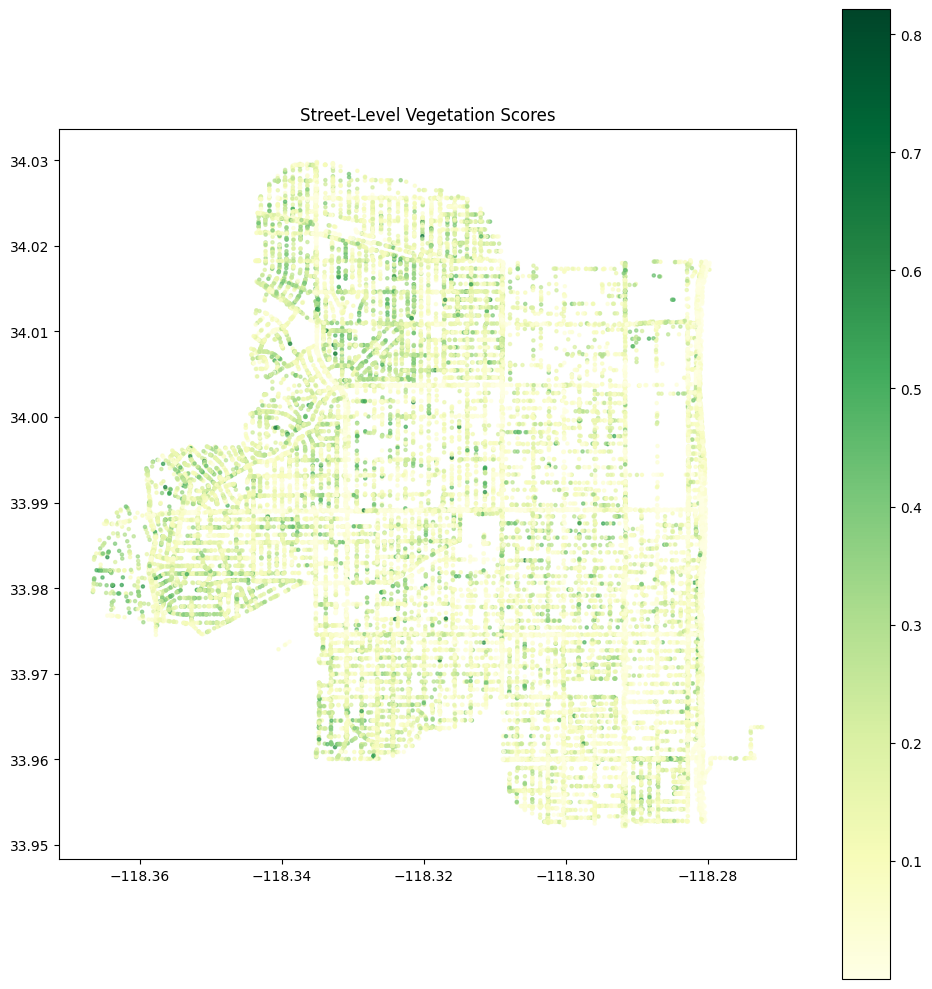

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Create GeoDataFrame
gdf = gpd.GeoDataFrame(
    df_plot,
    geometry=[Point(xy) for xy in zip(df_plot["lon"], df_plot["lat"])],
    crs="EPSG:4326"
)

# Plot vegetation values
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(
    column="vegetation",
    cmap="YlGn",
    markersize=5,
    alpha=0.7,
    legend=True,
    ax=ax
)
ax.set_title("Street-Level Vegetation Scores")
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Load the PID file
pid_path = "/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids.csv"
df_pid = pd.read_csv(pid_path)

# Check the current column names
print(df_pid.columns)

df_pid = df_pid.rename(columns={"id": "panoid"})
df_pid.to_csv("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids_renamed.csv", index=False)
print("✅ Renamed and saved to mly_pids_renamed.csv")



Index(['id', 'captured_at', 'compass_angle', 'creator_id', 'is_pano',
       'sequence_id', 'lon', 'lat', 'organization_id'],
      dtype='object')
✅ Renamed and saved to mly_pids_renamed.csv


In [ ]:
import pandas as pd
from pathlib import Path

sample_path = Path("/content/drive/MyDrive/zensvi_outputs/segmentation_clean/summaries")
first_csv = list(sample_path.rglob("pixel_ratios.csv"))[0]
df_sample = pd.read_csv(first_csv)

print("✅ Columns in sample file:", df_sample["label_name"].unique())


✅ Columns in sample file: ['road' 'sidewalk' 'building' 'fence' 'pole' 'traffic light'
 'traffic sign' 'vegetation' 'terrain' 'sky' 'person' 'car' 'truck' 'bus']


In [ ]:
import pandas as pd
from pathlib import Path
from tqdm import tqdm

summary_root = Path("/content/drive/MyDrive/zensvi_outputs/segmentation_clean/summaries")
csv_files = list(summary_root.glob("*/pixel_ratios.csv"))

for file_path in tqdm(csv_files):
    try:
        df = pd.read_csv(file_path)
        df_wide = df.pivot(index='filename_key', columns='label_name', values='pixel_ratios').reset_index()
        output_path = file_path.parent / "pixel_ratios_wide.csv"
        df_wide.to_csv(output_path, index=False)
    except Exception as e:
        print(f"❌ Failed: {file_path} — {e}")



100%|██████████| 27935/27935 [04:23<00:00, 106.03it/s]


In [ ]:
import pandas as pd
from pathlib import Path
from tqdm import tqdm

# 1. Set paths
summary_root = Path("/content/drive/MyDrive/zensvi_outputs/segmentation_clean/summaries")
pid_path = Path("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids_renamed.csv")
output_csv = "/content/drive/MyDrive/zensvi_outputs/zensvi_qgis_ready.csv"

# 2. Get wide pixel ratio files
wide_csv_files = list(summary_root.glob("*/pixel_ratios_wide.csv"))

# 3. Read all wide files and append image_id
all_dfs = []
for file_path in tqdm(wide_csv_files):
    try:
        df = pd.read_csv(file_path)
        image_id = file_path.parent.name
        df["image_id"] = image_id
        all_dfs.append(df)
    except Exception as e:
        print(f"❌ Failed on {file_path}: {e}")

df_pixel = pd.concat(all_dfs, ignore_index=True)

# 4. Read PID file and rename column to match
df_pids = pd.read_csv(pid_path)
df_pids = df_pids.rename(columns={"id": "image_id"})


100%|██████████| 27935/27935 [01:24<00:00, 332.44it/s]


KeyError: "['image_id'] not in index"

In [ ]:
import pandas as pd

# 1. Load the PIDs file
path_pid = "/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids_renamed.csv"
df_pids = pd.read_csv(path_pid)

# 2. Check current column names
print("🧠 PID columns:", df_pids.columns.tolist())

# 3. Rename 'id' to 'image_id' only if it exists
if 'id' in df_pids.columns:
    df_pids = df_pids.rename(columns={'id': 'image_id'})

# 4. Confirm rename worked
print("✅ Renamed columns:", df_pids.columns.tolist())


🧠 PID columns: ['panoid', 'captured_at', 'compass_angle', 'creator_id', 'is_pano', 'sequence_id', 'lon', 'lat', 'organization_id']
✅ Renamed columns: ['panoid', 'captured_at', 'compass_angle', 'creator_id', 'is_pano', 'sequence_id', 'lon', 'lat', 'organization_id']


In [ ]:
import pandas as pd

# Load the combined wide pixel ratio data
df_pixel = pd.read_csv("/content/drive/MyDrive/zensvi_outputs/test_pixel_ratios_pivot.csv")
df_pixel.rename(columns={"image_id": "panoid"}, inplace=True)


In [ ]:
# Load the pids
df_pids = pd.read_csv("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids_renamed.csv")

# Confirm the key columns exist
assert "panoid" in df_pids.columns and "lat" in df_pids.columns and "lon" in df_pids.columns


In [ ]:
import pandas as pd

# 1. Load the wide-format pixel ratios
df_pixel = pd.read_csv("/content/drive/MyDrive/zensvi_outputs/test_pixel_ratios_pivot.csv")

# 2. Load the pids with coordinates
df_pids = pd.read_csv("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids_renamed.csv")

# 3. Make sure both use the same column name for merging
df_pixel.rename(columns={"image_id": "panoid"}, inplace=True)

# 4. Merge on panoid
df_merged = pd.merge(df_pixel, df_pids[["panoid", "lat", "lon"]], on="panoid", how="inner")

# 5. Save for QGIS
output_path = "/content/drive/MyDrive/zensvi_outputs/pixel_ratios_with_coords.csv"
df_merged.to_csv(output_path, index=False)

print(f"✅ File saved for QGIS: {output_path}")
print(f"📐 Shape: {df_merged.shape}")


✅ File saved for QGIS: /content/drive/MyDrive/zensvi_outputs/pixel_ratios_with_coords.csv
📐 Shape: (27935, 22)


In [ ]:
import pandas as pd
import os

# Ensure the output directory exists
output_dir = "/content/drive/MyDrive/zensvi_outputs"
os.makedirs(output_dir, exist_ok=True)

# Define output path
output_path = os.path.join(output_dir, "pixel_ratios_with_coords.csv")

# Save the DataFrame
df_merged.to_csv(output_path, index=False)

print(f"✅ File saved for QGIS: {output_path}")
print(f"📐 Shape: {df_merged.shape}")




✅ File saved for QGIS: /content/drive/MyDrive/zensvi_outputs/pixel_ratios_with_coords.csv
📐 Shape: (27935, 22)


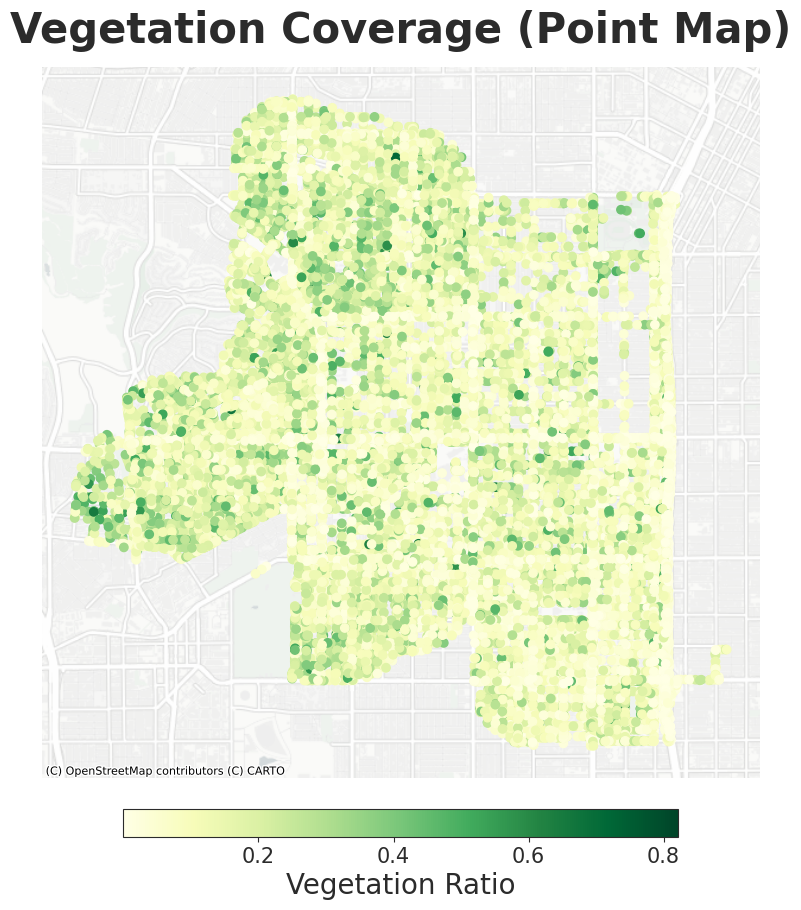

In [ ]:
from zensvi.visualization import plot_map

# ✅ Set correct paths
path_pid = "/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids_renamed.csv"
dir_input = "/content/drive/MyDrive/zensvi_outputs/segmentation_clean/summaries"
csv_file_pattern = "pixel_ratios_wide.csv"  # MUST MATCH THE NEW WIDE FILES
path_output = "/content/drive/MyDrive/zensvi_outputs/vegetation_point_map.png"

# ✅ Generate vegetation point map
fig, ax = plot_map(
    path_pid=path_pid,
    dir_input=dir_input,
    csv_file_pattern=csv_file_pattern,
    variable_name="vegetation",
    plot_type="point",  # use "point" for individual image-level values
    path_output=path_output,
    resolution=13,
    cmap="YlGn",
    legend=True,
    title="Vegetation Coverage (Point Map)",
    legend_title="Vegetation Ratio",
    dark_mode=False,
)


Text(0.5, 1.0, 'Vegetation Map')

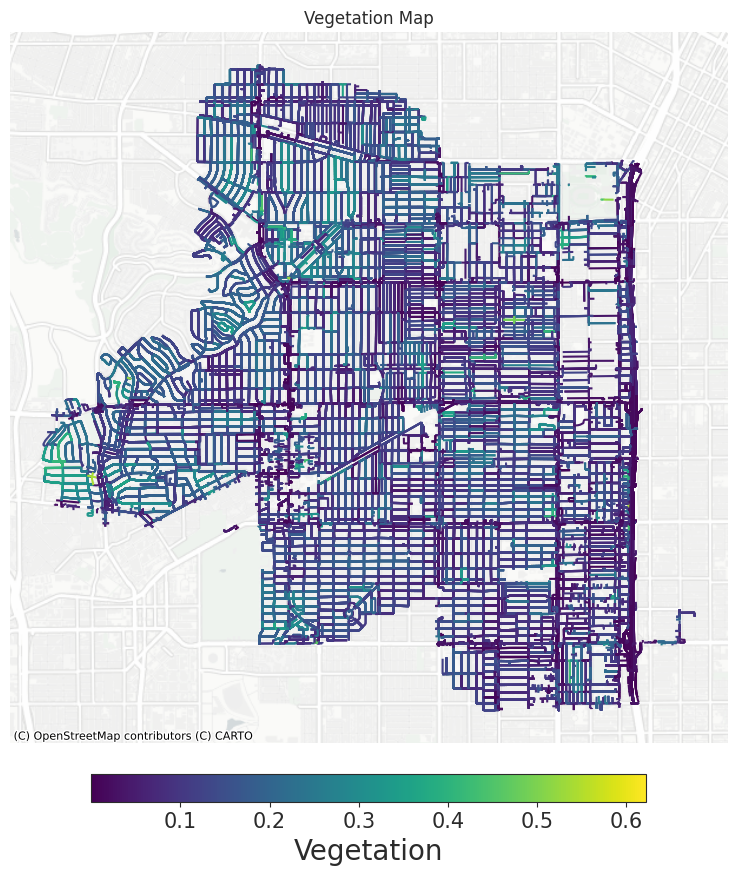

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "DejaVu Sans"

dir_input = "/content/drive/MyDrive/zensvi_outputs/segmentation_clean/summaries"
path_output = "/content/drive/MyDrive/zensvi_outputs/vegetation_line_map.png"
path_pid = "/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids_renamed.csv"
csv_file_pattern = "pixel_ratios_wide.csv"  # pattern of the CSV files that contain the pixel ratios (or any other variable to plot)
variable = "vegetation"  # variable to plot (e.g. vegetation, building, sky, etc.). This should be the column name in the CSV file. If None, count of the number of images is plotted
plot_type = "line"  # plot type (either "point", "line", or "hexagon")
fig, ax = plot_map(
    path_pid,
    dir_input=dir_input,
    csv_file_pattern=csv_file_pattern,
    variable_name="vegetation",
    plot_type=plot_type,
    path_output=path_output,
    resolution=13,
    cmap="viridis",
    legend=True,
    title="Point Map",
    legend_title="Vegetation",
    dark_mode=False,
)
ax.set_title("Vegetation Map", fontname="DejaVu Sans")

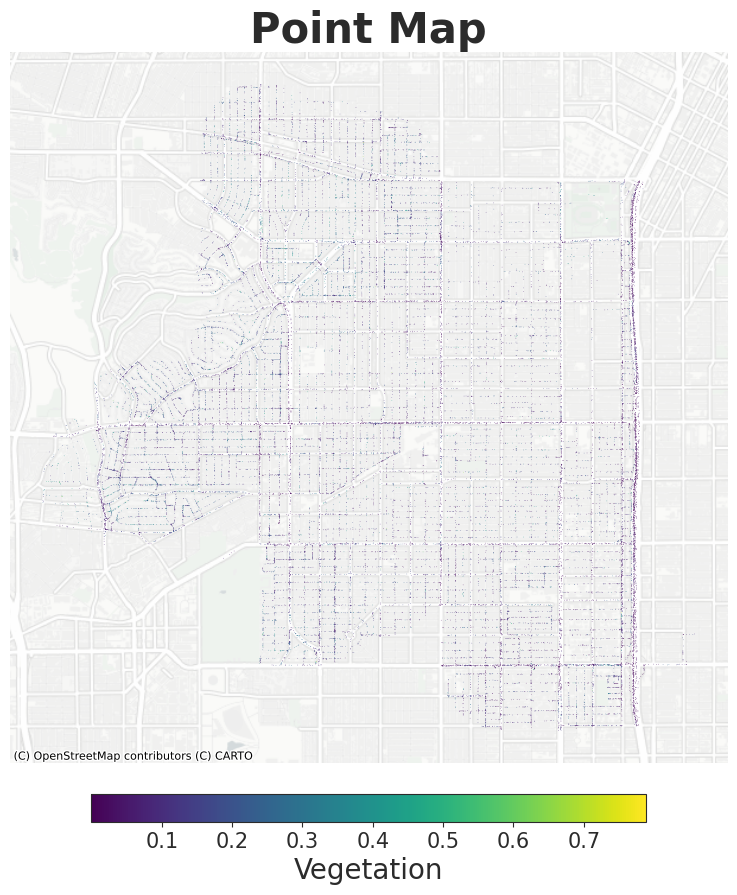

In [ ]:
dir_input = "/content/drive/MyDrive/zensvi_outputs/segmentation_clean/summaries"
path_output = "/content/drive/MyDrive/zensvi_outputs/vegetation_hex_map.png"
path_pid = "/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids_renamed.csv"
csv_file_pattern = "pixel_ratios_wide.csv"  # pattern of the CSV files that contain the pixel ratios (or any other variable to plot)
variable = "vegetation"  # variable to plot (e.g. vegetation, building, sky, etc.). This should be the column name in the CSV file. If None, count of the number of images is plotted
plot_type = "hexagon"  # plot type (either "point", "line", or "hexagon")
fig, ax = plot_map(
    path_pid,
    dir_input=dir_input,
    csv_file_pattern=csv_file_pattern,
    variable_name=variable,
    plot_type=plot_type,
    path_output=path_output,
    resolution=13,
    cmap="viridis",
    legend=True,
    title="Point Map",
    legend_title="Vegetation",
    dark_mode=False,
)

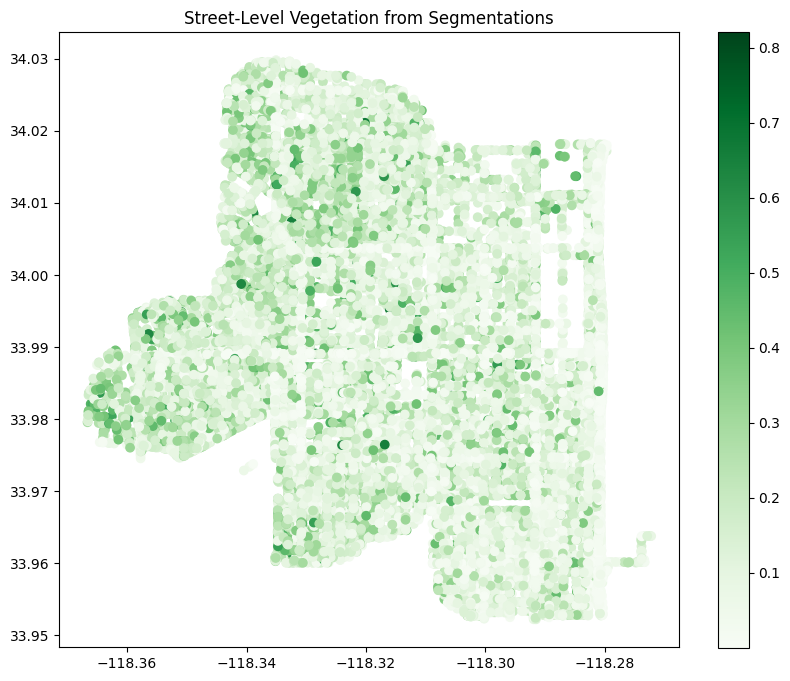

In [ ]:
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

# Create geometry column from lat/lon
gdf = gpd.GeoDataFrame(df_merged, geometry=gpd.points_from_xy(df_merged["lon"], df_merged["lat"]))
gdf = gdf.set_crs("EPSG:4326")

# Plot vegetation ratio
gdf.plot(column="vegetation", cmap="Greens", legend=True, figsize=(10, 8))
plt.title("Street-Level Vegetation from Segmentations")
plt.show()


In [ ]:
import glob

summary_files = glob.glob("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/**/summaries/*.json", recursive=True)
print(f"🔍 Found {len(summary_files)} summary files.")
print("Example:", summary_files[:3])



🔍 Found 49 summary files.
Example: ['/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_1/summaries/pixel_ratios.json', '/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_2/summaries/pixel_ratios.json', '/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_3/summaries/pixel_ratios.json']


🎯 Sampled 9 images.


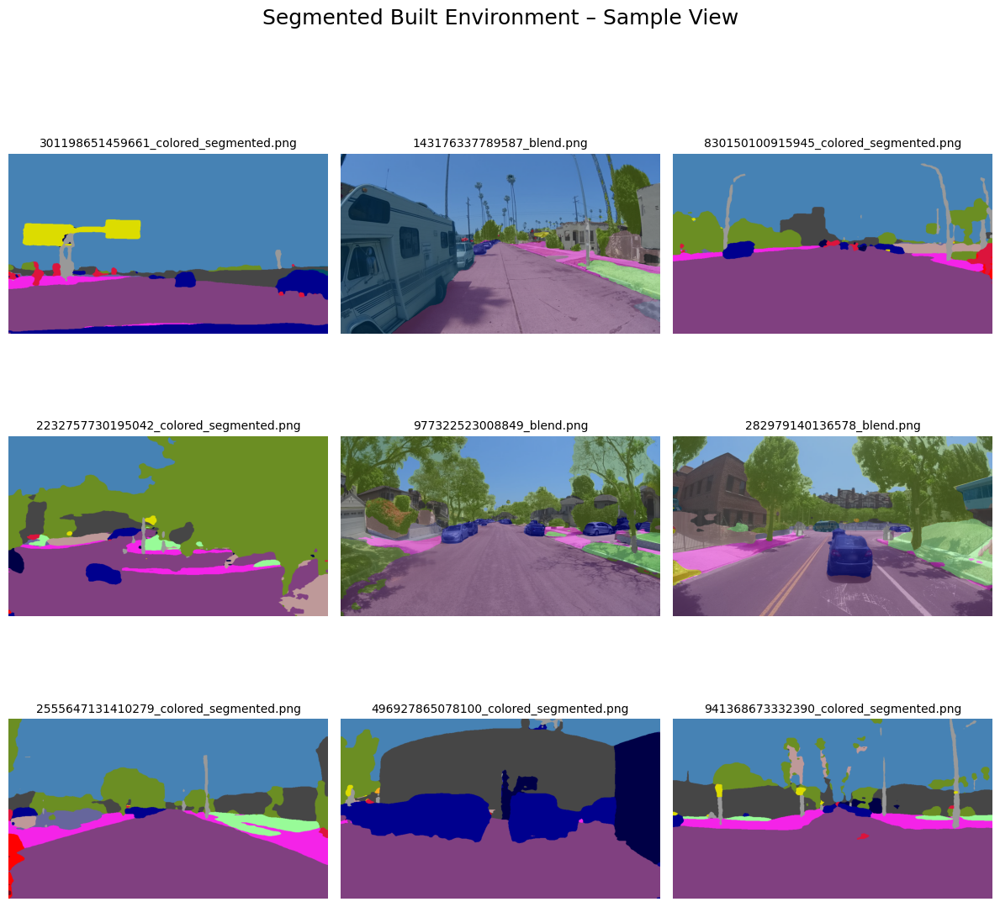

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import random
import itertools

# Directory containing segmented images
seg_dir = Path("/content/drive/MyDrive/zensvi_outputs/segmentation_clean/segments")

# Create an iterator of PNG files
png_iterator = (p for p in seg_dir.iterdir() if p.suffix == ".png")

# Randomly select 9 from the iterator (reservoir sampling)
sample_paths = []
for i, path in enumerate(png_iterator, 1):
    if len(sample_paths) < 9:
        sample_paths.append(path)
    else:
        j = random.randint(0, i)
        if j < 9:
            sample_paths[j] = path

print(f"🎯 Sampled {len(sample_paths)} images.")

# Create a 3x3 grid plot
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
fig.suptitle("Segmented Built Environment – Sample View", fontsize=18)

# Plot the images
for ax, img_path in zip(axes.flatten(), sample_paths):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(img_path.name, fontsize=10)

# Hide unused subplots (if fewer than 9)
for i in range(len(sample_paths), 9):
    axes.flatten()[i].axis("off")

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


In [ ]:
import os
import pandas as pd
from zensvi.metadata import MLYMetadata

# Step 1: Read your renamed file
path_input_raw = "/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids_renamed.csv"
df = pd.read_csv(path_input_raw)

# Step 2: Rename `panoid` → `id` to match zensvi's expectation
df = df.rename(columns={"panoid": "id"})

# Step 3: Save a temporary corrected file for metadata processing
path_input_fixed = "/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids_FOR_METADATA.csv"
df.to_csv(path_input_fixed, index=False)

# Step 4: Create output directory
output_folder = "/content/drive/MyDrive/svi_metadata"
os.makedirs(output_folder, exist_ok=True)

# Step 5: Run metadata extraction using fixed input
mly_metadata = MLYMetadata(path_input=path_input_fixed)

# Step 6: Compute and save image-level metadata
mly_metadata.compute_metadata(
    unit="image",
    indicator_list="all",
    path_output=os.path.join(output_folder, "image_metadata.csv")
)

# Step 7: Compute and save grid-level metadata
mly_metadata.compute_metadata(
    unit="grid",
    indicator_list="all",
    path_output=os.path.join(output_folder, "grid_metadata.csv")
)


/usr/local/lib/python3.11/dist-packages/zensvi/metadata/mly_metadata.py:234: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  self.street_network = ox.graph_from_bbox(
/usr/local/lib/python3.11/dist-packages/zensvi/metadata/mly_metadata.py:266: MapWithoutReturnDtypeWarning: Calling `map_elements` without specifying `return_dtype` can lead to unpredictable results. Specify `return_dtype` to silence this warning.
  self.street_network = self.street_network.with_columns(


Computing timezones:   0%|          | 0/350870 [00:00<?, ?it/s]

Computing datetimes:   0%|          | 0/350870 [00:00<?, ?it/s]

Computing timezones:   0%|          | 0/351064 [00:00<?, ?it/s]

Computing datetimes:   0%|          | 0/351064 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/zensvi/metadata/mly_metadata.py:31: MapWithoutReturnDtypeWarning: Calling `map_elements` without specifying `return_dtype` can lead to unpredictable results. Specify `return_dtype` to silence this warning.
  df = df.with_columns(


,h3_id,coverage,count,days_elapsed,most_recent_date,oldest_date,number_of_years,number_of_months,number_of_days,number_of_hours,...,number_of_summer,number_of_autumn,number_of_winter,average_compass_angle,average_relative_angle,average_is_pano,number_of_users,number_of_sequences,number_of_organizations,average_speed_kmh
0,8729a56ddffffff,0.308635,5263,2898,2023-09-20,2015-10-13,7,6,16,16,...,3150,316,1797,159.763655,87.788924,0.0,8,63,2,45.459064
1,8729a56cdffffff,0.499647,24286,1286,2020-02-10,2016-08-03,4,4,7,13,...,23761,0,525,170.562754,98.482265,0.0,3,98,2,28.852174
2,8729a56ccffffff,0.051814,22024,1268,2020-01-23,2016-08-03,3,3,6,9,...,21921,0,103,166.006831,101.526160,0.0,3,108,2,30.158582
3,8729a19b2ffffff,0.904875,19992,1286,2020-02-10,2016-08-03,4,6,10,15,...,13319,0,6492,178.159887,92.544787,0.0,4,82,2,30.693514
4,8729a56cbffffff,0.036756,40733,2964,2024-09-14,2016-08-03,4,5,6,12,...,40123,425,185,167.557864,104.513304,0.0,4,153,2,30.406833
5,8729a56d9ffffff,0.763471,5313,2604,2023-09-20,2016-08-03,6,7,16,17,...,3293,39,1798,159.617235,91.585707,0.0,7,81,2,41.255918
6,8729a56c9ffffff,0.034963,47660,2964,2024-09-14,2016-08-03,4,5,9,13,...,44911,173,2576,174.787270,95.824752,0.0,4,188,2,30.220009
7,8729a1996ffffff,0.344004,28043,2964,2024-09-14,2016-08-03,3,4,4,12,...,27870,173,0,169.509450,100.398562,0.0,3,198,1,31.506360
8,8729a1994ffffff,0.442001,312,1235,2019-12-21,2016-08-03,3,4,7,11,...,134,0,178,196.266596,104.935394,0.0,3,34,2,43.085992
9,8729a56c1ffffff,0.405100,21918,2898,2023-09-20,2015-10-13,7,7,19,16,...,20303,88,1527,173.152603,106.473712,0.0,9,117,2,31.307959


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import LineString

# Load your image-level metadata (which succeeded)
df_image = pd.read_csv("/content/drive/MyDrive/svi_metadata/image_metadata.csv")

# Filter out bad or missing values
df_image = df_image.dropna(subset=["lat", "lon", "sequence_id", "captured_at"])

# Sort by sequence and timestamp
df_image = df_image.sort_values(["sequence_id", "captured_at"])

# Convert to GeoDataFrame
gdf_image = gpd.GeoDataFrame(
    df_image,
    geometry=gpd.points_from_xy(df_image.lon, df_image.lat),
    crs="EPSG:4326"
)

# Group by sequence_id and create LineString if >1 point
street_records = []
for seq_id, group in gdf_image.groupby("sequence_id"):
    if len(group) < 2:
        continue  # skip sequences that can’t form a line

    line = LineString(group.geometry.tolist())
    record = {
        "sequence_id": seq_id,
        "mean_speed_kmh": group["speed_kmh"].mean(),
        "mean_angle": group["relative_angle"].mean(),
        "mean_hour": group["hour"].mean(),
        "geometry": line
    }
    street_records.append(record)

# Convert to GeoDataFrame
street_gdf = gpd.GeoDataFrame(street_records, crs="EPSG:4326")

# Save manually
output_path = "/content/drive/MyDrive/svi_metadata/street_metadata.csv"
street_gdf.drop(columns="geometry").to_csv(output_path, index=False)
street_gdf.to_file(output_path.replace(".csv", ".geojson"), driver="GeoJSON")

print(f"✅ Manual street metadata saved to:\n- CSV: {output_path}\n- GeoJSON: {output_path.replace('.csv', '.geojson')}")


✅ Manual street metadata saved to:
- CSV: /content/drive/MyDrive/svi_metadata/street_metadata.csv
- GeoJSON: /content/drive/MyDrive/svi_metadata/street_metadata.geojson


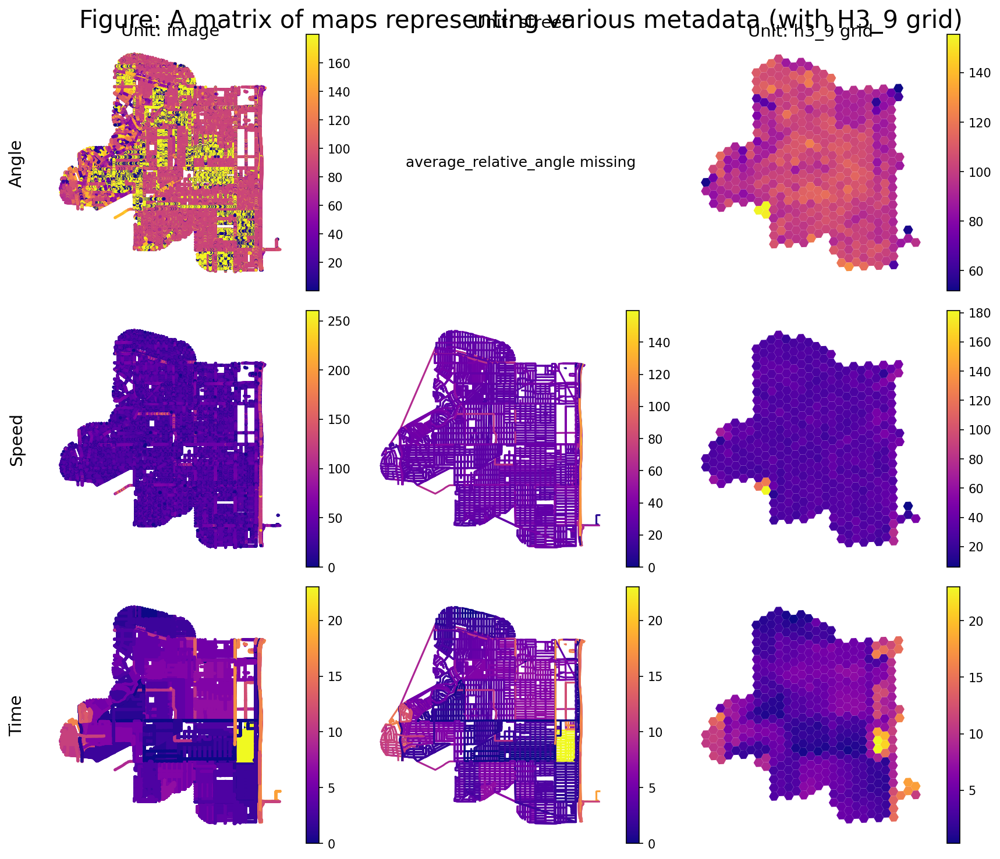

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, LineString
import h3

# === Load image and street metadata ===
df_image = pd.read_csv("/content/drive/MyDrive/svi_metadata/image_metadata.csv")
df_street = pd.read_csv("/content/drive/MyDrive/svi_metadata/street_metadata.csv")

# === Convert to GeoDataFrames ===

# 1. Image-level: point geometry
gdf = gpd.GeoDataFrame(
    df_image,
    geometry=gpd.points_from_xy(df_image.lon, df_image.lat),
    crs="EPSG:4326"
)

# 2. Street-level: ensure geometry is loaded
if 'geometry' not in df_street.columns or not pd.api.types.is_object_dtype(df_street['geometry']):
    df_street = gpd.read_file("/content/drive/MyDrive/svi_metadata/street_metadata.geojson")
street_gdf = gpd.GeoDataFrame(df_street, geometry='geometry', crs="EPSG:4326")

# 3. Grid-level: aggregate image data to h3_9
# Compute h3_9 index
gdf['h3_9'] = gdf.apply(lambda row: h3.geo_to_h3(row['lat'], row['lon'], 9), axis=1)

# Group and compute means
df_grid = gdf.groupby('h3_9').agg({
    'relative_angle': 'mean',
    'speed_kmh': 'mean',
    'hour': 'mean'
}).reset_index()

# Convert h3_9 index to geometry
def h3_to_polygon(h):
    try:
        return Polygon(h3.h3_to_geo_boundary(h, geo_json=True))
    except Exception:
        return None

df_grid['geometry'] = df_grid['h3_9'].apply(h3_to_polygon)
grid_gdf = gpd.GeoDataFrame(df_grid, geometry='geometry', crs="EPSG:4326").dropna(subset=['geometry'])

# === Variables matrix ===
var_matrix = [
    ['relative_angle', 'average_relative_angle', 'relative_angle'],  # updated for h3_9
    ['speed_kmh', 'mean_speed_kmh', 'speed_kmh'],
    ['hour', 'mean_hour', 'hour']
]

row_titles = ['Angle', 'Speed', 'Time']
col_titles = ['Unit: image', 'Unit: street', 'Unit: h3_9 grid']
gdfs = [gdf, street_gdf, grid_gdf]

# === Plot 3x3 matrix ===
fig, axes = plt.subplots(3, 3, figsize=(12, 10), dpi=150)

for i in range(3):  # rows
    for j in range(3):  # columns
        ax = axes[i, j]
        g = gdfs[j]
        var = var_matrix[i][j]

        if var in g.columns and not g.empty:
            geom_type = g.geometry.iloc[0].geom_type
            ms = 2 if geom_type == 'Point' else None
            g.plot(column=var, ax=ax, cmap='plasma', legend=True, markersize=ms)
        else:
            ax.text(0.5, 0.5, f"{var} missing", ha='center', va='center', fontsize=12)

        ax.set_axis_off()
        if i == 0:
            ax.set_title(col_titles[j], fontsize=14)
        if j == 0:
            ax.text(-0.1, 0.5, row_titles[i], va='center', ha='right',
                    fontsize=14, transform=ax.transAxes, rotation=90)

plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95)
plt.suptitle("Figure: A matrix of maps representing various metadata (with H3_9 grid)", fontsize=20)
plt.show()


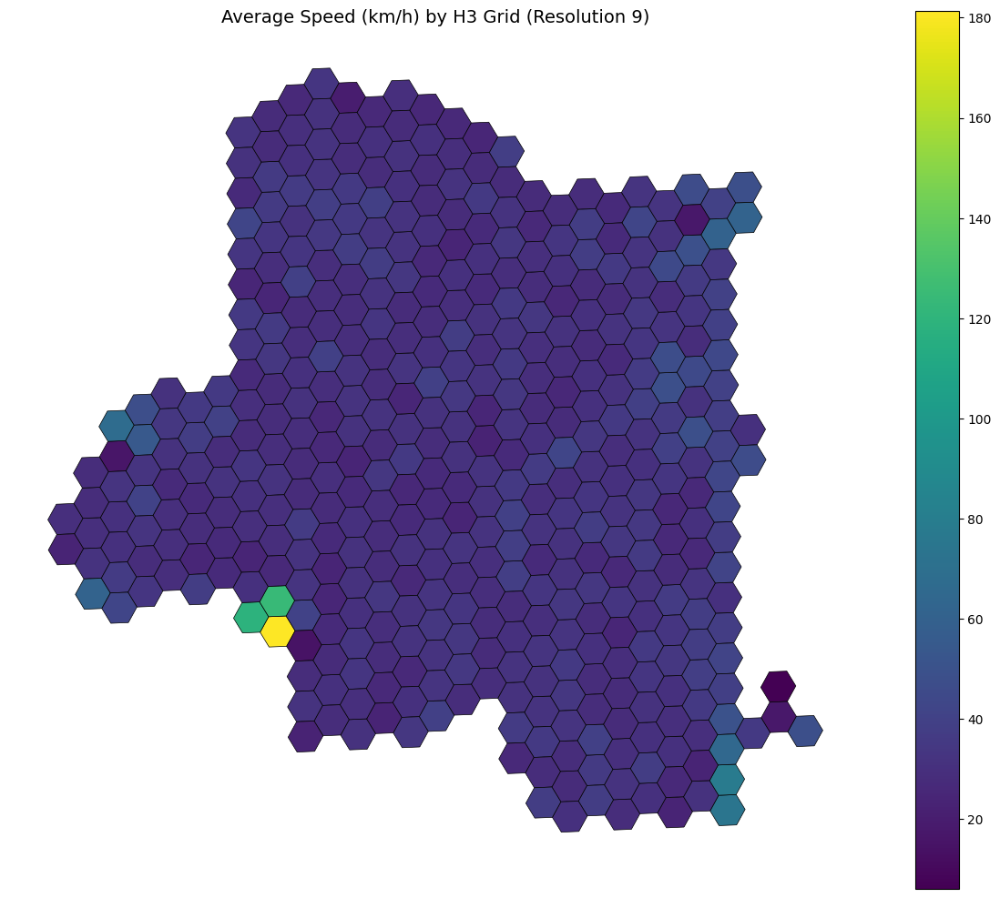

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import h3
from shapely.geometry import Polygon

# Load your image-level metadata
df_meta = pd.read_csv("/content/drive/MyDrive/svi_metadata/image_metadata.csv")

# If h3_id is not at resolution 9, compute h3_9 from lat/lon
# Otherwise, rename for consistency
if 'h3_id' in df_meta.columns:
    df_meta['h3_9'] = df_meta['h3_id']
else:
    df_meta['h3_9'] = df_meta.apply(lambda row: h3.geo_to_h3(row['lat'], row['lon'], 9), axis=1)

# Aggregate average speed by h3_9
df_agg = df_meta.groupby('h3_9').agg({'speed_kmh': 'mean'}).reset_index()

# Convert each h3 index to a hexagon polygon
def h3_to_polygon(h):
    try:
        boundary = h3.h3_to_geo_boundary(h, geo_json=True)
        return Polygon(boundary)
    except Exception:
        return None

df_agg['geometry'] = df_agg['h3_9'].apply(h3_to_polygon)

# Create a GeoDataFrame
gdf_hex = gpd.GeoDataFrame(df_agg, geometry='geometry', crs="EPSG:4326").dropna(subset=['geometry'])

# Plot hex polygons colored by average speed
fig, ax = plt.subplots(figsize=(12, 10))
gdf_hex.plot(column='speed_kmh', cmap='viridis', linewidth=0.5, edgecolor='k', legend=True, ax=ax)
ax.set_title('Average Speed (km/h) by H3 Grid (Resolution 9)', fontsize=14)
ax.set_axis_off()
plt.tight_layout()
plt.show()


In [ ]:
import os
from zensvi.download import MLYDownloader

# Your Mapillary API key
mly_api_key = "MLY|7992912717499684|9b96fd3ed8c786f18278269db68375e8"

# Path to your shapefile
input_shp_file = "/content/drive/MyDrive/area.geojson"

# Output folder
output_folder = "/content/drive/MyDrive/zensvi_outputs/from_shapefile/images"
os.makedirs(output_folder, exist_ok=True)

# Initialize downloader
downloader = MLYDownloader(mly_api_key)

# Download images using the shapefile
downloader.download_svi(
    dir_output=output_folder,
    input_shp_file=input_shp_file,
    buffer=800  # meters around the polygon/points
)


Getting pids...


Loading cache files: 0it [00:00, ?it/s]


[Vector Tiles API] Fetching 30 tiles for images ...


Filtering data: 100%|██████████| 662048/662048 [00:03<00:00, 190218.36it/s]


The panorama IDs have been saved to /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids.csv
The cache directory for tiles has been deleted


Getting urls by batch size 1000:  21%|██        | 73/351 [32:21<2:00:34, 26.02s/it]

Server responded with a 500 error!


ERROR:mapillary.utils.client:Server responded with a 500 error!


Error: An exception occurred, "479167856729379" is not a valid image ID/key


Getting urls by batch size 1000:  23%|██▎       | 79/351 [35:00<1:59:28, 26.35s/it]

Server responded with a 500 error!


ERROR:mapillary.utils.client:Server responded with a 500 error!


Error: An exception occurred, "147228733973028" is not a valid image ID/key


Getting urls by batch size 1000:  25%|██▍       | 87/351 [38:30<1:54:47, 26.09s/it]

Server responded with a 500 error!


ERROR:mapillary.utils.client:Server responded with a 500 error!


Error: An exception occurred, "1583320315199720" is not a valid image ID/key


Getting urls by batch size 1000:  36%|███▋      | 128/351 [56:11<1:39:04, 26.66s/it]

Server responded with a 500 error!


ERROR:mapillary.utils.client:Server responded with a 500 error!


Error: An exception occurred, "876357499609298" is not a valid image ID/key


Getting urls by batch size 1000:  37%|███▋      | 129/351 [56:38<1:38:56, 26.74s/it]

Server responded with a 500 error!


ERROR:mapillary.utils.client:Server responded with a 500 error!


Error: An exception occurred, "3951286278286151" is not a valid image ID/key


Getting urls by batch size 1000:  61%|██████▏   | 215/351 [1:34:19<59:26, 26.23s/it]

Server responded with a 500 error!


ERROR:mapillary.utils.client:Server responded with a 500 error!
Getting urls by batch size 1000:  62%|██████▏   | 216/351 [1:34:59<1:08:20, 30.38s/it]

Error: An exception occurred, "410069733333865" is not a valid image ID/key


Getting urls by batch size 1000: 100%|██████████| 351/351 [2:33:18<00:00, 26.21s/it]

The cache directory has been deleted


In [ ]:
import pandas as pd
import geopandas as gpd

# Load image-level CSV
df_image = pd.read_csv("/content/drive/MyDrive/svi_metadata/image_metadata.csv")

# Convert to GeoDataFrame
gdf_image = gpd.GeoDataFrame(
    df_image,
    geometry=gpd.points_from_xy(df_image.lon, df_image.lat),
    crs="EPSG:4326"
)

# Export to GeoJSON
gdf_image.to_file("/content/drive/MyDrive/svi_metadata/image_metadata.geojson", driver="GeoJSON")
print("✅ image_metadata.geojson saved")


✅ image_metadata.geojson saved


In [ ]:
import pandas as pd
import geopandas as gpd
import h3
from shapely.geometry import Polygon

# Load image metadata
df = pd.read_csv("/content/drive/MyDrive/svi_metadata/image_metadata.csv")

# Compute H3 resolution 11 hex ID
df['h3_11'] = df.apply(lambda row: h3.geo_to_h3(row['lat'], row['lon'], 11), axis=1)

# Aggregate to each H3 cell
df_grid = df.groupby('h3_11').agg({
    'relative_angle': 'mean',
    'speed_kmh': 'mean',
    'hour': 'mean'
}).reset_index()

# Convert H3 cell to polygon geometry
def h3_to_polygon(h):
    try:
        return Polygon(h3.h3_to_geo_boundary(h, geo_json=True))
    except Exception:
        return None

df_grid['geometry'] = df_grid['h3_11'].apply(h3_to_polygon)

# Convert to GeoDataFrame
gdf_grid = gpd.GeoDataFrame(df_grid, geometry='geometry', crs='EPSG:4326').dropna(subset=['geometry'])

# Export to GeoJSON
gdf_grid.to_file("/content/drive/MyDrive/svi_metadata/image_metadata_h3_11.geojson", driver="GeoJSON")

print("✅ Exported very small hex grid to image_metadata_h3_11.geojson")



✅ Exported very small hex grid to image_metadata_h3_11.geojson


In [ ]:
# ✅ Summarize label_name counts
label_summary = df_all['label_name'].value_counts().reset_index()
label_summary.columns = ['label_name', 'count']

# 📊 Show table
import pandas as pd
import IPython.display as display
display.display(label_summary)


,label_name,count
0,sky,27888
1,road,27857
2,building,27853
3,sidewalk,27705
4,vegetation,27700
5,car,27576
6,pole,27404
7,fence,25650
8,traffic sign,25256
9,person,23924


In [ ]:
from pathlib import Path

base_path = Path("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi")  # replace with your path

print(f"Listing all folders/files under {base_path}:")

for p in base_path.iterdir():
    print(p.name, "Folder" if p.is_dir() else "File")


Listing all folders/files under /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi:


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi'

In [ ]:
from zensvi.cv import ClassifierPerception
from pathlib import Path
from PIL import Image
import os
import shutil

# ✅ All supported perception indicators
perception_indicators = [
   # 'safer',
  #  'more boring',
  #  'wealthier',
 #   'livelier',
  #  'more beautiful',
    'more depressing'
]

# 📂 Base path to your image batches
base_path = Path("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi")

# === Loop over each indicator ===
for indicator in perception_indicators:
    print(f"\n🔎 Starting indicator: {indicator}")
    classifier = ClassifierPerception(perception_study=indicator)

    # Loop through each batch folder
    for batch_folder in sorted(base_path.glob("batch_*")):
        print(f"➡️ Classifying {batch_folder.name} | Indicator: {indicator}")

        # Output summary folder
        out_path = batch_folder / f"summaries_{indicator.replace(' ', '_')}"
        out_path.mkdir(exist_ok=True)

        # === Create a folder for valid images ===
        valid_folder = batch_folder / "valid_images"
        if valid_folder.exists():
            shutil.rmtree(valid_folder)
        valid_folder.mkdir()

        # === Filter and copy valid images ===
        valid_count = 0
        for image_path in batch_folder.glob("*.png"):
            try:
                with Image.open(image_path) as img:
                    img.verify()
                shutil.copy(image_path, valid_folder / image_path.name)
                valid_count += 1
            except Exception:
                print(f"⚠️ Skipping corrupted image: {image_path.name}")

        if valid_count == 0:
            print(f"❌ No valid images in {batch_folder.name}, skipping classification.")
            continue

        # === Run classification ===
        try:
            classifier.classify(
                str(valid_folder),
                dir_summary_output=str(out_path),
                batch_size=5
            )
            print(f"✅ Done: {batch_folder.name} | {indicator}")
        except Exception as e:
            print(f"❌ Classification failed on {batch_folder.name} | {indicator}: {e}")

print("\n✅ Finished batch classification for all indicators.")


/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


Weights downloaded to /usr/local/lib/python3.11/models/groundingdino/groundingdino_swint_ogc.pth

🔎 Starting indicator: more depressing
Using GPU
Using GPU


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


more%20depressing.pth:   0%|          | 0.00/105M [00:00<?, ?B/s]

➡️ Classifying batch_1 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:28<00:00,  7.05it/s]


✅ Done: batch_1 | more depressing
➡️ Classifying batch_10 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:28<00:00,  7.11it/s]


✅ Done: batch_10 | more depressing
➡️ Classifying batch_100 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:27<00:00,  7.32it/s]


✅ Done: batch_100 | more depressing
➡️ Classifying batch_101 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.64it/s]


✅ Done: batch_101 | more depressing
➡️ Classifying batch_102 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:24<00:00,  8.25it/s]


✅ Done: batch_102 | more depressing
➡️ Classifying batch_103 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.46it/s]


✅ Done: batch_103 | more depressing
➡️ Classifying batch_104 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.61it/s]


✅ Done: batch_104 | more depressing
➡️ Classifying batch_105 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.60it/s]


✅ Done: batch_105 | more depressing
➡️ Classifying batch_106 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.72it/s]


✅ Done: batch_106 | more depressing
➡️ Classifying batch_107 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.62it/s]


✅ Done: batch_107 | more depressing
➡️ Classifying batch_108 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.66it/s]


✅ Done: batch_108 | more depressing
➡️ Classifying batch_109 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.87it/s]


✅ Done: batch_109 | more depressing
➡️ Classifying batch_11 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.66it/s]


✅ Done: batch_11 | more depressing
➡️ Classifying batch_110 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.56it/s]


✅ Done: batch_110 | more depressing
➡️ Classifying batch_111 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.75it/s]


✅ Done: batch_111 | more depressing
➡️ Classifying batch_112 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.51it/s]


✅ Done: batch_112 | more depressing
➡️ Classifying batch_113 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.71it/s]


✅ Done: batch_113 | more depressing
➡️ Classifying batch_114 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.82it/s]


✅ Done: batch_114 | more depressing
➡️ Classifying batch_115 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.59it/s]


✅ Done: batch_115 | more depressing
➡️ Classifying batch_116 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.51it/s]


✅ Done: batch_116 | more depressing
➡️ Classifying batch_117 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.78it/s]


✅ Done: batch_117 | more depressing
➡️ Classifying batch_118 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.83it/s]


✅ Done: batch_118 | more depressing
➡️ Classifying batch_119 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.54it/s]


✅ Done: batch_119 | more depressing
➡️ Classifying batch_12 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.61it/s]


✅ Done: batch_12 | more depressing
➡️ Classifying batch_120 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.51it/s]


✅ Done: batch_120 | more depressing
➡️ Classifying batch_121 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.57it/s]


✅ Done: batch_121 | more depressing
➡️ Classifying batch_122 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:24<00:00,  8.30it/s]


✅ Done: batch_122 | more depressing
➡️ Classifying batch_123 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.64it/s]


✅ Done: batch_123 | more depressing
➡️ Classifying batch_124 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.64it/s]


✅ Done: batch_124 | more depressing
➡️ Classifying batch_125 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.69it/s]


✅ Done: batch_125 | more depressing
➡️ Classifying batch_126 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.66it/s]


✅ Done: batch_126 | more depressing
➡️ Classifying batch_127 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.53it/s]


✅ Done: batch_127 | more depressing
➡️ Classifying batch_128 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.50it/s]


✅ Done: batch_128 | more depressing
➡️ Classifying batch_129 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.86it/s]


✅ Done: batch_129 | more depressing
➡️ Classifying batch_13 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.82it/s]


✅ Done: batch_13 | more depressing
➡️ Classifying batch_130 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.66it/s]


✅ Done: batch_130 | more depressing
➡️ Classifying batch_131 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.94it/s]


✅ Done: batch_131 | more depressing
➡️ Classifying batch_132 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.86it/s]


✅ Done: batch_132 | more depressing
➡️ Classifying batch_133 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.67it/s]


✅ Done: batch_133 | more depressing
➡️ Classifying batch_134 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.91it/s]


✅ Done: batch_134 | more depressing
➡️ Classifying batch_135 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.71it/s]


✅ Done: batch_135 | more depressing
➡️ Classifying batch_136 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:24<00:00,  8.33it/s]


✅ Done: batch_136 | more depressing
➡️ Classifying batch_137 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.56it/s]


✅ Done: batch_137 | more depressing
➡️ Classifying batch_138 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.75it/s]


✅ Done: batch_138 | more depressing
➡️ Classifying batch_139 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.78it/s]


✅ Done: batch_139 | more depressing
➡️ Classifying batch_14 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.51it/s]


✅ Done: batch_14 | more depressing
➡️ Classifying batch_140 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.57it/s]


✅ Done: batch_140 | more depressing
➡️ Classifying batch_141 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.48it/s]


✅ Done: batch_141 | more depressing
➡️ Classifying batch_142 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.69it/s]


✅ Done: batch_142 | more depressing
➡️ Classifying batch_143 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.98it/s]


✅ Done: batch_143 | more depressing
➡️ Classifying batch_144 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.41it/s]


✅ Done: batch_144 | more depressing
➡️ Classifying batch_145 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.65it/s]


✅ Done: batch_145 | more depressing
➡️ Classifying batch_146 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.68it/s]


✅ Done: batch_146 | more depressing
➡️ Classifying batch_147 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:24<00:00,  8.25it/s]


✅ Done: batch_147 | more depressing
➡️ Classifying batch_148 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.74it/s]


✅ Done: batch_148 | more depressing
➡️ Classifying batch_149 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.41it/s]


✅ Done: batch_149 | more depressing
➡️ Classifying batch_15 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.51it/s]


✅ Done: batch_15 | more depressing
➡️ Classifying batch_150 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.77it/s]


✅ Done: batch_150 | more depressing
➡️ Classifying batch_151 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.38it/s]


✅ Done: batch_151 | more depressing
➡️ Classifying batch_152 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:24<00:00,  8.33it/s]


✅ Done: batch_152 | more depressing
➡️ Classifying batch_153 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.59it/s]


✅ Done: batch_153 | more depressing
➡️ Classifying batch_154 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.51it/s]


✅ Done: batch_154 | more depressing
➡️ Classifying batch_155 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:24<00:00,  8.28it/s]


✅ Done: batch_155 | more depressing
➡️ Classifying batch_156 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.45it/s]


✅ Done: batch_156 | more depressing
➡️ Classifying batch_157 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.59it/s]


✅ Done: batch_157 | more depressing
➡️ Classifying batch_158 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  9.00it/s]


✅ Done: batch_158 | more depressing
➡️ Classifying batch_159 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.88it/s]


✅ Done: batch_159 | more depressing
➡️ Classifying batch_16 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.75it/s]


✅ Done: batch_16 | more depressing
➡️ Classifying batch_160 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.63it/s]


✅ Done: batch_160 | more depressing
➡️ Classifying batch_161 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.59it/s]


✅ Done: batch_161 | more depressing
➡️ Classifying batch_162 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.76it/s]


✅ Done: batch_162 | more depressing
➡️ Classifying batch_163 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.74it/s]


✅ Done: batch_163 | more depressing
➡️ Classifying batch_164 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.80it/s]


✅ Done: batch_164 | more depressing
➡️ Classifying batch_165 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.68it/s]


✅ Done: batch_165 | more depressing
➡️ Classifying batch_166 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  9.01it/s]


✅ Done: batch_166 | more depressing
➡️ Classifying batch_167 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.66it/s]


✅ Done: batch_167 | more depressing
➡️ Classifying batch_168 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:21<00:00,  9.14it/s]


✅ Done: batch_168 | more depressing
➡️ Classifying batch_169 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:21<00:00,  9.12it/s]


✅ Done: batch_169 | more depressing
➡️ Classifying batch_17 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.95it/s]


✅ Done: batch_17 | more depressing
➡️ Classifying batch_170 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.78it/s]


✅ Done: batch_170 | more depressing
➡️ Classifying batch_171 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.58it/s]


✅ Done: batch_171 | more depressing
➡️ Classifying batch_172 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.57it/s]


✅ Done: batch_172 | more depressing
➡️ Classifying batch_173 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.67it/s]


✅ Done: batch_173 | more depressing
➡️ Classifying batch_174 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:24<00:00,  8.08it/s]


✅ Done: batch_174 | more depressing
➡️ Classifying batch_175 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.36it/s]


✅ Done: batch_175 | more depressing
➡️ Classifying batch_176 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.91it/s]


✅ Done: batch_176 | more depressing
➡️ Classifying batch_177 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.52it/s]


✅ Done: batch_177 | more depressing
➡️ Classifying batch_178 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:24<00:00,  8.28it/s]


✅ Done: batch_178 | more depressing
➡️ Classifying batch_179 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.56it/s]


✅ Done: batch_179 | more depressing
➡️ Classifying batch_18 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.74it/s]


✅ Done: batch_18 | more depressing
➡️ Classifying batch_180 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.69it/s]


✅ Done: batch_180 | more depressing
➡️ Classifying batch_181 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.95it/s]


✅ Done: batch_181 | more depressing
➡️ Classifying batch_182 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.56it/s]


✅ Done: batch_182 | more depressing
➡️ Classifying batch_183 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:24<00:00,  8.27it/s]


✅ Done: batch_183 | more depressing
➡️ Classifying batch_184 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.42it/s]


✅ Done: batch_184 | more depressing
➡️ Classifying batch_185 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:23<00:00,  8.58it/s]


✅ Done: batch_185 | more depressing
➡️ Classifying batch_186 | Indicator: more depressing


Evaluating human perception of study: more depressing: 100%|██████████| 200/200 [00:22<00:00,  8.93it/s]


✅ Done: batch_186 | more depressing
➡️ Classifying batch_187 | Indicator: more depressing


In [ ]:
import os
from pathlib import Path
import pandas as pd

# === Define Paths ===
base_dir = Path("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi")
summary_folder_name = "summaries_more_depressing"  # e.g., 'summaries_safer', 'summaries_livelier'
output_filename = f"combined_{summary_folder_name}_results.csv"

# === Scan batch folders manually ===
all_results = []
for batch_folder in sorted(os.listdir(base_dir)):
    batch_path = base_dir / batch_folder
    summary_path = batch_path / summary_folder_name / "results.csv"

    if summary_path.exists():
        try:
            df = pd.read_csv(summary_path)
            df['batch'] = batch_folder  # Annotate with batch name
            all_results.append(df)
        except Exception as e:
            print(f"❌ Failed to load {summary_path}: {e}")
    else:
        print(f"⚠️ No results.csv in {summary_path}")

# === Combine all data ===
if all_results:
    combined_df = pd.concat(all_results, ignore_index=True)
    output_path = base_dir / output_filename
    combined_df.to_csv(output_path, index=False)

    print(f"✅ Combined shape: {combined_df.shape}")
    print(f"📁 Saved to: {output_path}")
else:
    print("🚫 No valid results found to combine.")


⚠️ No results.csv in /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_159/summaries_more_depressing/results.csv
⚠️ No results.csv in /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_16/summaries_more_depressing/results.csv
⚠️ No results.csv in /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_160/summaries_more_depressing/results.csv
⚠️ No results.csv in /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_161/summaries_more_depressing/results.csv
⚠️ No results.csv in /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_162/summaries_more_depressing/results.csv
⚠️ No results.csv in /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_163/summaries_more_depressing/results.csv
⚠️ No results.csv in /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_164/summaries_more_depressing/results.csv
⚠️ No results.csv in /content/drive/MyDriv

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# Paths
perception_path = "/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/combined_summaries_more_depressing_results.csv"
panoids_path = "/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_pids_renamed.csv"

# Load data
df_perception = pd.read_csv(perception_path)
df_panoids = pd.read_csv(panoids_path)


In [ ]:
df_merged = df_perception.merge(
    df_panoids[['panoid', 'lat', 'lon']],
    left_on='filename_key',
    right_on='panoid',
    how='inner'
)
print(f"✅ Merged shape: {df_merged.shape}")


✅ Merged shape: (66000, 6)


In [ ]:
gdf = gpd.GeoDataFrame(
    df_merged,
    geometry=gpd.points_from_xy(df_merged['lon'], df_merged['lat']),
    crs="EPSG:4326"
)
gdf.to_file("/content/drive/MyDrive/zensvi_outputs/summaries_depressing_map.geojson", driver="GeoJSON")


In [ ]:
import glob
image_paths = glob.glob("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/**/mly_svi/batch_*/**/*.png", recursive=True)
print(f"📷 Total images on disk: {len(image_paths)}")


📷 Total images on disk: 97870


In [ ]:
import glob

segmented_paths = glob.glob("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/**/segments/*.png", recursive=True)
print(f"🧠 Segmented images found: {len(segmented_paths)}")


🧠 Segmented images found: 608


In [ ]:
import glob

img_paths = glob.glob("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/**/batch_*/**/*.png", recursive=True)
print(f"📸 Total images available for segmentation: {len(img_paths)}")



📸 Total images available for segmentation: 97870


In [ ]:
import glob
seg_imgs = glob.glob("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/**/segments/*.png", recursive=True)
print(f"🧠 Actual segmented output images: {len(seg_imgs)}")


🧠 Actual segmented output images: 588


In [ ]:
import pandas as pd
import glob

paths = glob.glob("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/**/summaries/pixel_ratios.csv", recursive=True)

nonempty = 0
for p in paths:
    try:
        df = pd.read_csv(p)
        if not df.empty:
            nonempty += 1
    except Exception:
        continue

print(f"📊 Non-empty pixel_ratios.csv files: {nonempty} of {len(paths)}")


📊 Non-empty pixel_ratios.csv files: 294 of 294


In [ ]:
import glob
import os
import json

# Get a few summary files
summary_files = glob.glob("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/**/summaries/*.json", recursive=True)

print(f"📦 Found {len(summary_files)} summary files")

# Inspect first few
for f in summary_files[:5]:
    size_kb = os.path.getsize(f) / 1024
    try:
        with open(f, 'r') as infile:
            data = json.load(infile)
        print(f"{f} — ✅ Valid JSON ({size_kb:.1f} KB)")
    except Exception as e:
        print(f"{f} — ❌ Corrupt or unreadable: {e}")


📦 Found 294 summary files
/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_1/summaries/pixel_ratios.json — ✅ Valid JSON (0.4 KB)
/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_1/segments/summaries/pixel_ratios.json — ✅ Valid JSON (0.2 KB)
/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_1/segments/segments/summaries/pixel_ratios.json — ✅ Valid JSON (0.2 KB)
/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_1/valid_images/summaries/pixel_ratios.json — ✅ Valid JSON (0.5 KB)
/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_1/valid_images/segments/summaries/pixel_ratios.json — ✅ Valid JSON (0.2 KB)


In [ ]:
import pandas as pd
import glob

# Find a sample pixel_ratios.csv file
csv_files = glob.glob("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/**/summaries/pixel_ratios.csv", recursive=True)

# Check if any files were found
print("Found:", len(csv_files))
if len(csv_files) > 0:
    df = pd.read_csv(csv_files[0])
    print("Columns:", df.columns.tolist())



Found: 49
Columns: ['Unnamed: 0', 'filename_key', 'label_name', 'pixel_ratios']


In [ ]:
import pandas as pd
import glob
import os

# Input/output paths
summary_paths = glob.glob("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/**/summaries/pixel_ratios.csv", recursive=True)

for path in summary_paths:
    df = pd.read_csv(path)

    # Pivot long to wide format
    df_wide = df.pivot_table(
        index='filename_key',
        columns='label_name',
        values='pixel_ratios',
        aggfunc='mean'
    ).reset_index()

    # Overwrite the original or save as new
    wide_path = path.replace("pixel_ratios.csv", "pixel_ratios_wide.csv")
    df_wide.to_csv(wide_path, index=False)
    print(f"✅ Saved wide-format CSV: {wide_path}")


✅ Saved wide-format CSV: /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_1/summaries/pixel_ratios_wide.csv
✅ Saved wide-format CSV: /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_2/summaries/pixel_ratios_wide.csv
✅ Saved wide-format CSV: /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_3/summaries/pixel_ratios_wide.csv
✅ Saved wide-format CSV: /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_4/summaries/pixel_ratios_wide.csv
✅ Saved wide-format CSV: /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_5/summaries/pixel_ratios_wide.csv
✅ Saved wide-format CSV: /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_6/summaries/pixel_ratios_wide.csv
✅ Saved wide-format CSV: /content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_7/summaries/pixel_ratios_wide.csv
✅ Saved wide-format CSV: /content/drive/MyDrive/zensvi_outputs/from_s

In [ ]:
df_wide = pd.read_csv("/content/drive/MyDrive/zensvi_outputs/from_shapefile/images/mly_svi/batch_1/summaries/pixel_ratios_wide.csv")
print(df_wide.describe())


       filename_key  building       car     fence    person      pole  \
count  1.000000e+00    1.0000  1.000000  1.000000  1.000000  1.000000   
mean   1.364381e+15    0.1202  0.026438  0.000939  0.002577  0.002311   
std             NaN       NaN       NaN       NaN       NaN       NaN   
min    1.364381e+15    0.1202  0.026438  0.000939  0.002577  0.002311   
25%    1.364381e+15    0.1202  0.026438  0.000939  0.002577  0.002311   
50%    1.364381e+15    0.1202  0.026438  0.000939  0.002577  0.002311   
75%    1.364381e+15    0.1202  0.026438  0.000939  0.002577  0.002311   
max    1.364381e+15    0.1202  0.026438  0.000939  0.002577  0.002311   

          rider      road  sidewalk       sky  traffic sign     truck  \
count  1.000000  1.000000   1.00000  1.000000      1.000000  1.000000   
mean   0.000693  0.094267   0.00915  0.563132      0.009313  0.005747   
std         NaN       NaN       NaN       NaN           NaN       NaN   
min    0.000693  0.094267   0.00915  0.563132     